# Short Description of the project

This project, titled "The Data Detective: Uncovering the Single Most Important Story in AirwaysBharath’s Flight Data," analyzes a comprehensive airline dataset to derive actionable insights for improving profitability, customer retention, and operational efficiency. Prepared by Gajarajan V Y on September 21, 2025, the analysis employed advanced techniques including data cleaning with MICE (LightGBM) (Multiple Imputation by Chained Equations) imputation, NLP for sentiment scoring, statistical hypothesis tests like Kruskal–Wallis Test,Mann–Whitney U Test,Chi-Square Test for Independence (Contingency Test),statistical modeling via linear regression and Cramér’s V, and multivariate methods like PCA and MCA.Leveraged parallelization to efficiently process exhaustive bivariate and impact analyses across large datasets.


# How top 5 insights was concluded. This tells key thing that the effort went through this project

Beginning with ~ 1200 possible combinations of bivariate and multivariate analysis, the analysis conducted a statistically rigorous exploration of all variable combinations—identifying 25 significant numerical-numerical pairs, 40 numerical-categorical pairs, 14 categorical-categorical pairs, and 4 time-metric pairs through **bivariate statistical testing**. This was followed by **multivariate analysis**, which uncovered 54 statistically significant relationships. From this exhaustive process, the top 5 key insights were selected based on their strength, relevance, and interpretability across both bivariate and multivariate findings.


- **Insight 1: Retention Risk  [NUM-NUM ANALYSIS]**
  * Managing high-risk segments can unlock a ~255% lift in profitability and ~223% reduction in costs.
  * Pilot targeted loyalty and retention programs for these high-return customers while safeguarding against churn.  

- **Insight 2: Customer Tier Profitability  [NUM-CAT ANALYSIS]**
  * High-tier customers deliver ~40% more revenue and incur ~12% lower costs than Medium-tier; Low-tier segments generate ~48% less revenue and ~20% higher costs.
  * Focus on upselling and premium services for top-tier, and optimize or de-prioritize Low-tier offerings.  

- **Insight 3: Customer Sentiment  [MULTI VARIANT ANALYSIS]**
  * A 1% rise in sentiment and conversion drives a 39.56% overall satisfaction boost (17.05% direct, 19.31% indirect).
  * Deploy real-time sentiment analytics with instant alerts to turn feedback into immediate action.  

- **Insight 4: High-Value Routes & Merchants  [MULTI VARIANT ANALYSIS]**
  * A 1% increase in merchant/regional influence yields 32.82% higher global route demand, which cascades into 25.86% stronger merchant impact and 21.42% greater route preferences.
  * Expand capacity on flagship corridors (e.g., MEL–LHR, HKG–FRA).  

- **Insight 5: Operations & Pricing  [MULTI VARIANT ANALYSIS]**
  * Improving flight operations and sentiment by 1% cuts route complexity by 29.52%; a 1% uplift in sentiment/currency drives 22.12% more pricing agility; a 1% boost in discounts lifts bookings by 12.01%.
  * Eliminate unnecessary layovers and implement dynamic pricing strategies.



# Project Workflow

The project follows a logical sequence: data loading, initial exploration, cleaning, validation, feature engineering, handling missing values, statistical summaries, and progressively deeper analyses (univariate, bivariate, impact, and multivariate). It incorporates techniques like parallel computing for efficiency and robust methods for handling data issues.

## Workflow Steps

1. **Load The Dataset**  
   Import and connect to the data source, load the dataset into the environment.

2. **Basic Understanding of the Data**  
   Explore column groups, data types, non-null counts, thematic grouping, and brief descriptions.

3. **Duplicate Analysis**  
   Check for and handle exact duplicate rows.

4. **Unique Columns Analysis**  
   Identify columns with high cardinality and assess their analytical value.

5. **Missing Value Analysis**  
   Quantify missingness, categorize by severity, and decide on imputation or exclusion.

6. **Data Type Conversion**  
   Convert columns (especially dates) to appropriate types.

7. **Validate and Correct flight_Capacity**  
   Investigate whether values represent load factors or seat counts.

8. **Validating exchange_rate**  
   Check plausibility and handle outliers or missing values.

9. **Dropping ticket_id and pnr**  
   Remove high-cardinality identifiers not needed for analysis.

10. **Data Quality Profiling & Preprocessing**  
    Detect placeholders, sentinel values, and invalid entries.

11. **Remarks and Comment => Sentiments**  
    Apply sentiment analysis (NLP) to text fields (remarks, comments).

12. **Anomalies Detection**  
    Identify outliers in numeric, categorical, and date columns.

13. **Feature Engineering**  
    Create new metrics like Combined_Sentiment, Revenue_Loss_per_Decline, etc.

14. **Missing Values Handling**  
    Applied imputation strategies MICE(Multiple Imputation by Chained Equations)+LightGBM.

15. **Basic Descriptive Statistics**  
    Summarize central tendency, spread, and distribution shapes.

16. **Univariate Analysis**  
    Separate sections for numerical, categorical, date, and boolean columns.

17. **Bivariate Analysis**  
    Explore relationships between numerical–numerical, numerical–categorical, and categorical–categorical pairs, date-numeric (only for statistically significant pairs using non-parametric tests; parallel computing for exhaustive combinations).

18. **IMPACT ANALYSIS**  
    Quantify business significance of relationships (only for significant pairs from bivariate analysis; used parallel computing).  
    Approach: Initial plan included Theil–Sen regression for NUM–NUM, Quantile regression for NUM–CAT, Cramér’s V for CAT–CAT; switched to Linear regression for NUM–NUM and NUM–CAT due to RAM crash, kept Cramér’s V for CAT–CAT.

19. **Multi-variant Analysis**  
    Applied PCA, MCA. NUM-NUM analysis using the combined PCA, MCA data after naming or loading the component.

![Airlines EDA Workflow](https://drive.google.com/uc?export=view&id=1A0B2teGLHMvYj8NVtTPedWxGwDLTGYSh)


## Dependencies and Notes
- **Sequential Flow**: Steps are generally linear, with early data cleaning (e.g., duplicates, missing values, data types) enabling later analyses (e.g., univariate, bivariate).
- **Parallel Computing**: Used in bivariate and impact analysis for handling exhaustive combinations efficiently.
- **Tools and Techniques**: Relies on Python libraries like pandas for data manipulation, NLP for sentiment analysis, and statistical methods (e.g.Kruskal–Wallis Test,Mann–Whitney U Test,Chi-Square Test for Independence (Contingency Test), regression, PCA/MCA) for deeper insights.
- **AI Assistance**: Utilized GROK3 and Copilot for code assistance, summarization, and related analytical support. NapkinAI for workflow visual.
- **Challenges Addressed**: Handles issues like RAM crashes by adapting methods (e.g., switching regression types) and data anomalies through validation and imputation.


This workflow ensures a comprehensive, robust EDA process. For implementation details, refer to the Jupyter Notebook.

# Load The Dataset

In [ ]:
# Step 1: Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Step 2: Import pandas (if not already imported)
import pandas as pd

# Step 3: Load the dataset from the specified path
# Note: The path uses 'MyDrive' (standard in Colab) and assumes the folder 'infinitysoft' is directly under MyDrive
df = pd.read_csv('/content/drive/MyDrive/infinitysoft/airline_fake_data.csv')

# Optional: Display basic info about the dataset
#print(df.head())
print(df.info())

Mounted at /content/drive
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 44 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Ticket_id                 197194 non-null  object 
 1   pnr                       164893 non-null  object 
 2   origin_airport_code       197218 non-null  object 
 3   destination_airport_code  197225 non-null  object 
 4   Region                    197193 non-null  object 
 5   trip_type                 200000 non-null  object 
 6   stops                     200000 non-null  int64  
 7   cabin                     200000 non-null  object 
 8   requested_flight_number   197184 non-null  object 
 9   requested_pax_count       200000 non-null  int64  
 10  group_category            200000 non-null  object 
 11  request_type              200000 non-null  object 
 12  currency                  200000 non-null  object 
 13  exchange_rate     

In [ ]:
# Number of rows and columns
print("Shape of the dataset:", df.shape)
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")

Shape of the dataset: (200000, 44)
Number of rows: 200000
Number of columns: 44


# Sample of 5 records

In [ ]:
# Display sample 5 rows
df.sample(5)

,Ticket_id,pnr,origin_airport_code,destination_airport_code,Region,trip_type,stops,cabin,requested_flight_number,requested_pax_count,...,airline_update_date,created_at,updated_at,request_status,agent_response_status,pnr_status,payment_status,reason_for_decline,user_remarks,airline_remarks
14019,fee31fd0-4fe3-49d2-b86a-944b8f32b1d5,XOXK93,BKK,DEL,BKK-DEL,Round Trip,1,Economy,MH597,74,...,NaN,2025-02-19,2025-05-16,Not Honoured,Rejected,Cancelled,Full,NaN,NaN,NaN
135079,5eee4ea4-9d72-4e23-af24-5ae7a121a64a,WGDZ29,AMS,LHR,NaN,Round Trip,0,Economy,MH488,68,...,2025-04-18,2024-11-14,2025-04-18,Ticketed,No Response,Cancelled,Partial,NaN,NaN,NaN
76365,ace5a3fc-d255-47fc-8a98-58dbca8733b5,LYDM69,ICN,IST,ICN-IST,One Way,0,Business,MH850,25,...,2025-02-24,2024-10-22,2025-02-24,Ticketed,No Response,Active,NaN,Pm PM kitchen.,NaN,--
131361,3fe59d1b-8b76-42e5-a554-dc9caa88989d,MGOS31,NRT,AKL,NRT-AKL,Round Trip,0,Economy,MH219,16,...,2025-07-04,2024-12-30,2025-07-04,Expired,Accepted,Active,Partial,NaN,NaN,Respond may management good learn word.
14364,5e1c7fb6-6c87-431f-93b2-6f4f0751ac6f,TONV07,SIN,DEL,SIN-DEL,Round Trip,1,Economy,MH586,42,...,2025-08-17,2025-02-27,2025-08-17,Cancelled,No Response,Active,Full,NaN,NaN,NaN


# Basic understanding of the data

### Column Groups
Columns are grouped thematically below, including data type, non-null count (out of 200,000), and a brief description.

#### Identifiers and Basic Trip Info
- **Ticket_id** (object, 197,194 non-null): Unique ticket identifier.
- **pnr** (object, 164,893 non-null): Passenger Name Record.
- **origin_airport_code** (object, 197,218 non-null): Departure airport code (e.g., "JFK").
- **destination_airport_code** (object, 197,225 non-null): Arrival airport code.
- **Region** (object, 197,193 non-null): Geographic region of the trip.
- **trip_type** (object, 200,000 non-null): Type of trip (e.g., one-way, round-trip).
- **stops** (int64, 200,000 non-null): Number of stops.
- **cabin** (object, 200,000 non-null): Cabin class (e.g., economy).
- **requested_flight_number** (object, 197,184 non-null): Requested flight number.
- **requested_pax_count** (int64, 200,000 non-null): Number of passengers.
- **group_category** (object, 200,000 non-null): Group booking category (e.g., family).

#### Request and Merchant Details
- **request_type** (object, 200,000 non-null): Type of request (e.g., booking).
- **Merchant_id** (object, 200,000 non-null): Merchant or agent ID.
- **Merchant_name** (object, 200,000 non-null): Merchant name.
- **Merchant_type** (object, 200,000 non-null): Merchant type (e.g., OTA).

#### Financial and Currency Info
- **currency** (object, 200,000 non-null): Transaction currency (e.g., USD).
- **exchange_rate** (float64, 170,000 non-null): Currency exchange rate.
- **requested_fare** (float64, 200,000 non-null): Requested fare amount.
- **Actual_fare** (float64, 200,000 non-null): Actual fare paid.
- **adjusted_amount** (float64, 200,000 non-null): Adjusted total.
- **discount_amount** (float64, 200,000 non-null): Discount applied.
- **taxes** (float64, 200,000 non-null): Tax amount.
- **other_Charges** (float64, 200,000 non-null): Miscellaneous charges.
- **Special_Request_Charges** (float64, 200,000 non-null): Special request fees.
- **settlement_amount** (float64, 200,000 non-null): Final settlement.
- **flight_Capacity** (float64, 200,000 non-null): Flight capacity (e.g., seats).

#### Aircraft and Location Info
- **aircraft_type** (object, 197,166 non-null): Aircraft model (e.g., Boeing 737).
- **country_code** (object, 196,192 non-null): Country code.
- **customer_country** (object, 200,000 non-null): Customer's country.
- **customer_city** (object, 197,214 non-null): Customer's city.

#### Dates and Timestamps
- **request_date** (object, 193,024 non-null): Date of request.
- **departure_date** (object, 192,979 non-null): Departure date.
- **arrival_date** (object, 193,054 non-null): Arrival date.
- **offer_expiry_date** (object, 193,097 non-null): Offer expiry.
- **airline_update_date** (object, 193,127 non-null): Airline update date.
- **created_at** (object, 197,165 non-null): Creation timestamp.
- **updated_at** (object, 193,051 non-null): Last update timestamp.

#### Statuses and Remarks
- **request_status** (object, 200,000 non-null): Request status (e.g., pending).
- **agent_response_status** (object, 200,000 non-null): Agent response status.
- **pnr_status** (object, 200,000 non-null): PNR status (e.g., confirmed).
- **payment_status** (object, 133,046 non-null): Payment status.
- **reason_for_decline** (object, 45,169 non-null): Decline reason.
- **user_remarks** (object, 59,931 non-null): User comments.
- **airline_remarks** (object, 74,639 non-null): Airline comments.

### Missing Data Notes
- **Fully complete**: 23 columns (e.g., all financial floats, trip_type).
- **Low missing** (<5%): e.g., Ticket_id (1.4%), aircraft_type (1.4%).
- **Moderate** (5-20%): e.g., exchange_rate (15%), dates (~3-4%).
- **High** (>20%): e.g., pnr (17.6%), payment_status (33.5%), remarks (60-77%).

# Duplicate Analysis

In [ ]:
import pandas as pd

# Assuming df is your DataFrame
# Store original number of rows
original_rows = len(df)

# Check for duplicates based on Ticket_id
ticket_id_duplicates = df[df['Ticket_id'].duplicated(keep=False)]
ticket_id_duplicate_count = len(ticket_id_duplicates)

# Check for duplicates across all columns
all_columns_duplicates = df[df.duplicated(keep=False)]
all_columns_duplicate_count = len(all_columns_duplicates)

# Print duplicate analysis
print("### Duplicate Analysis\n")
print(f"Original number of rows: {original_rows}")
print(f"Number of rows with duplicate Ticket_id: {ticket_id_duplicate_count}")
print(f"Number of rows with duplicates across all columns: {all_columns_duplicate_count}\n")

### Duplicate Analysis

Original number of rows: 200000
Number of rows with duplicate Ticket_id: 4000
Number of rows with duplicates across all columns: 0



In [ ]:
import pandas as pd

# Load your dataset (assuming it's already loaded as df)
# If not, use: df = pd.read_csv('your_file_path.csv')

# Step 1: Find duplicated Ticket_ids
duplicated_ids = df[df['Ticket_id'].duplicated(keep=False)]

# Step 2: Get unique duplicated Ticket_id values
unique_duplicated_ids = duplicated_ids['Ticket_id'].dropna().unique()

# Step 3: Display them
print("Duplicated Ticket_id values:")
print(unique_duplicated_ids)

# Optional: Save to CSV if needed
# pd.Series(unique_duplicated_ids).to_csv('duplicated_ticket_ids.csv', index=False)


Duplicated Ticket_id values:
['--']


In [ ]:
# Step 1: Filter rows with duplicate Ticket_id
ticket_id_duplicates = df[df['Ticket_id'].duplicated(keep=False)]

# Step 2: Count how many of these rows are full duplicates (across all columns)
duplicate_rows_among_ticket_id = ticket_id_duplicates.duplicated(keep=False).sum()

# Step 3: Print the result
print(f"Among the 4000 rows with duplicate Ticket_id, {duplicate_rows_among_ticket_id} rows are full duplicates.")


Among the 4000 rows with duplicate Ticket_id, 0 rows are full duplicates.


# What the Result of Duplicate Analysis Tells ( based on above executed cell)

* 0 full duplicates means no two rows are exactly the same across all 44 columns.

* So yes, don’t need to drop rows due to exact duplication.



# Unique columns  Analysis


In [ ]:
import pandas as pd

# Assuming df is your DataFrame
# Create a copy to avoid modifying the original
df = df.copy()
original_rows = len(df)

# 1. Identify unique or near-unique columns
print("### Unique Columns Analysis\n")
unique_columns = []
for col in df.columns:
    non_null_count = df[col].notnull().sum()
    unique_count = df[col].nunique()
    unique_ratio = unique_count / non_null_count if non_null_count > 0 else 0
    print(f"{col}: {unique_count} unique values out of {non_null_count} non-null ({unique_ratio:.2%} unique)")
    if unique_ratio > 0.90:  # Consider columns with >90% unique values as potentially unique
        unique_columns.append(col)

print(f"\nPotentially unique columns (>90% unique values): {unique_columns}")


### Unique Columns Analysis

Ticket_id: 196001 unique values out of 197194 non-null (99.40% unique)
pnr: 149754 unique values out of 164893 non-null (90.82% unique)
origin_airport_code: 16 unique values out of 197218 non-null (0.01% unique)
destination_airport_code: 16 unique values out of 197225 non-null (0.01% unique)
Region: 226 unique values out of 197193 non-null (0.11% unique)
trip_type: 2 unique values out of 200000 non-null (0.00% unique)
stops: 3 unique values out of 200000 non-null (0.00% unique)
cabin: 3 unique values out of 200000 non-null (0.00% unique)
requested_flight_number: 901 unique values out of 197184 non-null (0.46% unique)
requested_pax_count: 90 unique values out of 200000 non-null (0.04% unique)
group_category: 3 unique values out of 200000 non-null (0.00% unique)
request_type: 3 unique values out of 200000 non-null (0.00% unique)
currency: 4 unique values out of 200000 non-null (0.00% unique)
exchange_rate: 170000 unique values out of 170000 non-null (100.00% 

# Keeping this in mind. Moving forward and do neccessary changes if needed.

### What It Means
These four columns have more than 90% unique values, which suggests that:

1. Ticket_id: Nearly every row has a different ticket identifier (99.4% unique), making it a likely primary key.

2. pnr: Passenger Name Record is also highly individualized (90.8% unique), used to track bookings.

3. exchange_rate: Every transaction may involve a different rate (100% unique), likely due to dynamic currency conversions.

4. flight_Capacity: Surprisingly, this field is 100% unique—possibly due to how it's calculated or logged per request.

In [ ]:
df['flight_Capacity'].unique() # These are peculiarly in float type rather than excepted of whole numbers. May be scaled or other reason.

array([0.63772576, 0.79422985, 0.7399901 , ..., 0.6397851 , 0.78928321,
       0.93577581])

# top 10 unique values for each column

In [ ]:
# Loop through each column and print top 10 unique values
for col in df.columns:
    print(f"\nColumn: {col}")
    unique_vals = df[col].dropna().unique()
    print(f"Total unique values: {len(unique_vals)}")
    print("Top 10 unique values:")
    print(unique_vals[:10])


Column: Ticket_id
Total unique values: 196001
Top 10 unique values:
['0d0a88bb-c9f1-4064-939b-848978d16339'
 '5245ac7e-071f-484e-b99b-dbe26ac20048'
 '14b2bfad-e56e-4624-bc6e-4f563fe2460b'
 '555c6e92-92fe-416c-9ace-abee5791978b'
 'c1875379-e3fd-43b6-965d-cc50c2bbf61d'
 '8a4d45ac-be26-4c75-b858-5d106ee5349b'
 '20cfe2c7-797c-4373-81f9-0e7ad8ad06c6'
 '53c4aeaf-7d3b-457e-bfa5-5986e8714384'
 'fbcebc52-44b8-4b75-a250-210cbbbf4e14'
 '31a3d984-3f37-422b-b5e8-a41c7d928e57']

Column: pnr
Total unique values: 149754
Top 10 unique values:
['RPHU49' 'IMCP45' 'NOFA47' 'HVED43' 'ZHMC11' 'BARY77' '--' 'ECTN98'
 'VLXH91' 'HJGA34']

Column: origin_airport_code
Total unique values: 16
Top 10 unique values:
['BKK' 'HKG' 'KUL' 'PER' 'AMS' 'IST' 'JED' 'NRT' 'DEL' 'SIN']

Column: destination_airport_code
Total unique values: 16
Top 10 unique values:
['PER' 'MEL' 'HKG' 'KUL' 'NRT' 'SIN' 'BKK' 'IST' 'JED' 'ICN']

Column: Region
Total unique values: 226
Top 10 unique values:
['BKK-PER' 'BKK-MEL' 'HKG-HKG' 'KUL-

# lowest 10 unique values for each column

In [ ]:
# Loop through each column and print bottom 10 unique values
for col in df.columns:
    print(f"\nColumn: {col}")
    unique_vals = df[col].dropna().unique()

    # Sort values if possible
    try:
        sorted_vals = sorted(unique_vals)
        print(f"Total unique values: {len(sorted_vals)}")
        print("Bottom 10 unique values:")
        print(sorted_vals[:10])
    except Exception as e:
        print("Could not sort values (non-comparable types). Showing raw values:")
        print(unique_vals[:10])


Column: Ticket_id
Total unique values: 196001
Bottom 10 unique values:
['--', '000003c3-ecbc-48c1-9c84-c2c05ee31632', '00001660-2d0d-416d-855a-dcf0db19ad84', '000076c7-c47d-461c-95a7-2bf26233b5ff', '0000a042-6860-4ccc-9c8e-88e246f8c0eb', '0000d4b4-5b65-4d76-8aea-162fd6181fa0', '0001112f-f65c-434f-853a-bf85751c67b7', '0001a3d8-44eb-4cd7-a79a-f80d9f95f182', '000291ab-ea58-48ea-81c9-d36e4f9b4bea', '0002b8e8-1103-45a6-9937-62f92f1ae1d4']

Column: pnr
Total unique values: 149754
Bottom 10 unique values:
['--', 'AAAA42', 'AAAG00', 'AAAJ10', 'AAAK58', 'AAAM61', 'AAAR53', 'AAAX39', 'AABF64', 'AABH86']

Column: origin_airport_code
Total unique values: 16
Bottom 10 unique values:
['--', 'AKL', 'AMS', 'BKK', 'DEL', 'FRA', 'HKG', 'ICN', 'IST', 'JED']

Column: destination_airport_code
Total unique values: 16
Bottom 10 unique values:
['--', 'AKL', 'AMS', 'BKK', 'DEL', 'FRA', 'HKG', 'ICN', 'IST', 'JED']

Column: Region
Total unique values: 226
Bottom 10 unique values:
['--', 'AKL-AKL', 'AKL-AMS', 'A

# Understanding from this unique value analysis
Columns are grouped thematically below, including data type, non-null count (out of 200,000), a brief description, and insights from top/bottom unique values for clarity.

#### Identifiers and Basic Trip Info
These columns cover core identifiers and trip characteristics.
- **Ticket_id** (object, 197,194 non-null): Unique ticket identifier (UUID format; tops: UUIDs like "0d0a88bb-...", bottoms: "--" or UUIDs).
- **pnr** (object, 164,893 non-null): Passenger Name Record (alphanumeric codes; tops: "RPHU49", bottoms: "--" or "AAAA42").
- **origin_airport_code** (object, 197,218 non-null): Departure airport code (IATA codes; tops: "BKK", bottoms: "--" or "AKL").
- **destination_airport_code** (object, 197,225 non-null): Arrival airport code (IATA codes; tops: "PER", bottoms: "--" or "AKL").
- **Region** (object, 197,193 non-null): Geographic region of the trip (route pairs; tops: "BKK-PER", bottoms: "--" or "AKL-AKL").
- **trip_type** (object, 200,000 non-null): Type of trip (categorical; tops/bottoms: "Round Trip", "One Way").
- **stops** (int64, 200,000 non-null): Number of stops (integers; tops/bottoms: 1, 0, 2).
- **cabin** (object, 200,000 non-null): Cabin class (categorical; tops/bottoms: "Economy", "Business", "First").
- **requested_flight_number** (object, 197,184 non-null): Requested flight number (alphanumeric; tops: "MH450", bottoms: "--" or "MH100").
- **requested_pax_count** (int64, 200,000 non-null): Number of passengers (integers 10-90; tops: 57, bottoms: 10-19).
- **group_category** (object, 200,000 non-null): Group booking category (categorical; tops/bottoms: "MICE", "Corporate", "Leisure").

#### Request and Merchant Details
These columns detail the request and intermediaries involved.
- **request_type** (object, 200,000 non-null): Type of request (categorical; tops/bottoms: "New", "Amendment", "Cancellation").
- **Merchant_id** (object, 200,000 non-null): Merchant or agent ID (codes; tops: "AGT2517", bottoms: "AGT1000-1009").
- **Merchant_name** (object, 200,000 non-null): Merchant name (company names; tops: "Franco, Ward and Owen", bottoms: "Abbott Group" variations).
- **Merchant_type** (object, 200,000 non-null): Merchant type (categorical; tops/bottoms: "Corporate", "Leisure").

#### Financial and Currency Info
These columns handle monetary aspects, all fully complete except `exchange_rate`.
- **currency** (object, 200,000 non-null): Transaction currency (codes; tops/bottoms: "EUR", "MYR", "SGD", "USD").
- **exchange_rate** (float64, 170,000 non-null): Currency exchange rate (decimals ~1.0-4.56; tops: 2.416, bottoms: ~1.000).
- **requested_fare** (float64, 200,000 non-null): Requested fare amount (decimals; tops: 701.75, bottoms: 200.0-200.17).
- **Actual_fare** (float64, 200,000 non-null): Actual fare paid (decimals; tops: 713.46, bottoms: 191.57-193.91).
- **adjusted_amount** (float64, 200,000 non-null): Adjusted total (decimals; tops: 645.91, bottoms: 175.57-178.79).
- **discount_amount** (float64, 200,000 non-null): Discount applied (decimals; tops: 67.55, bottoms: 0.0-0.09).
- **taxes** (float64, 200,000 non-null): Tax amount (decimals; tops: 132.83, bottoms: 18.78-19.78).
- **other_Charges** (float64, 200,000 non-null): Miscellaneous charges (decimals; tops: 66.22, bottoms: 0.0-0.09).
- **Special_Request_Charges** (float64, 200,000 non-null): Special request fees (decimals; tops: 8.66, bottoms: 0.0-0.09).
- **settlement_amount** (float64, 200,000 non-null): Final settlement (decimals; tops: 645.91, bottoms: 0.0-94.1).
- **flight_Capacity** (float64, 200,000 non-null): Flight capacity (fractions ~0.5-0.945; tops: 0.637, bottoms: ~0.500).

#### Aircraft and Location Info
These columns describe aircraft and locations.
- **aircraft_type** (object, 197,166 non-null): Aircraft model (categorical; tops: "A350", bottoms: "--" or "A330").
- **country_code** (object, 196,192 non-null): Country code (ISO codes; tops: "AO", bottoms: "--" or "AD").
- **customer_country** (object, 200,000 non-null): Customer's country (names; tops: "Saint Helena", bottoms: "Afghanistan" or "Albania").
- **customer_city** (object, 197,214 non-null): Customer's city (generated names; tops: "Williamberg", bottoms: "--" or "Aaronberg").

#### Dates and Timestamps
These columns track timelines, mostly object types with ~3-4% missing.
- **request_date** (object, 193,024 non-null): Date of request (YYYY-MM-DD; tops: "2025-02-14", bottoms: "--" or "2024-09-01").
- **departure_date** (object, 192,979 non-null): Departure date (YYYY-MM-DD; tops: "2025-04-24", bottoms: "--" or "2024-09-08").
- **arrival_date** (object, 193,054 non-null): Arrival date (YYYY-MM-DD; tops: "2025-05-23", bottoms: "--" or "2024-09-16").
- **offer_expiry_date** (object, 193,097 non-null): Offer expiry (YYYY-MM-DD; tops: "2025-06-06", bottoms: "--" or "2024-09-21").
- **airline_update_date** (object, 193,127 non-null): Airline update date (YYYY-MM-DD; tops: "2025-06-09", bottoms: "--" or "2024-09-22").
- **created_at** (object, 197,165 non-null): Creation timestamp (YYYY-MM-DD; tops: "2025-02-14", bottoms: "--" or "2024-09-01").
- **updated_at** (object, 193,051 non-null): Last update timestamp (YYYY-MM-DD; tops: "2025-06-09", bottoms: "--" or "2024-09-22").

#### Statuses and Remarks
These columns capture outcomes and comments, with high missingness in remarks.
- **request_status** (object, 200,000 non-null): Request status (categorical; tops: "Not Honoured", bottoms: "Cancelled" or "Expired").
- **agent_response_status** (object, 200,000 non-null): Agent response status (categorical; tops: "No Response", bottoms: "Accepted").
- **pnr_status** (object, 200,000 non-null): PNR status (categorical; tops: "Active", bottoms: "Active" or "Cancelled").
- **payment_status** (object, 133,046 non-null): Payment status (categorical; tops: "Partial", bottoms: "Full" or "Partial").
- **reason_for_decline** (object, 45,169 non-null): Decline reason (text; tops: "--" or generated sentences, bottoms: "--" or "A across daughter...").
- **user_remarks** (object, 59,931 non-null): User comments (text; tops: "--" or generated sentences, bottoms: "--" or "A ago weight...").
- **airline_remarks** (object, 74,639 non-null): Airline comments (text; tops: "Travel very of day in.", bottoms: "--" or "A ability quickly...").


# Missing value Analysis

In [ ]:
import pandas as pd

# Assuming df is your DataFrame
total_rows = len(df)

# Initialize lists for each missing data category
fully_complete = []
low_missing = []
moderate_missing = []
high_missing = []

# Analyze each column for missing data
for column in df.columns:
    non_null = df[column].notnull().sum()
    missing_percent = ((total_rows - non_null) / total_rows) * 100
    description = f"{column}: {missing_percent:.2f}%"

    if missing_percent == 0:
        fully_complete.append(description)
    elif missing_percent < 5:
        low_missing.append(description)
    elif 5 <= missing_percent <= 20:
        moderate_missing.append(description)
    else:
        high_missing.append(description)

# Print results
print("### Missing Data Notes\n")
#print("#### Fully Complete (0% Missing)")
#for desc in fully_complete:
#    print(f"- {desc}")
print("\n#### Low Missing (<5% Missing)")
for desc in low_missing:
    print(f"- {desc}")
print("\n#### Moderate Missing (5-20% Missing)")
for desc in moderate_missing:
    print(f"- {desc}")
print("\n#### High Missing (>20% Missing)")
for desc in high_missing:
    print(f"- {desc}")

### Missing Data Notes


#### Low Missing (<5% Missing)
- Ticket_id: 1.40%
- origin_airport_code: 1.39%
- destination_airport_code: 1.39%
- Region: 1.40%
- requested_flight_number: 1.41%
- aircraft_type: 1.42%
- country_code: 1.90%
- customer_city: 1.39%
- request_date: 3.49%
- departure_date: 3.51%
- arrival_date: 3.47%
- offer_expiry_date: 3.45%
- airline_update_date: 3.44%
- created_at: 1.42%
- updated_at: 3.47%

#### Moderate Missing (5-20% Missing)
- pnr: 17.55%
- exchange_rate: 15.00%

#### High Missing (>20% Missing)
- payment_status: 33.48%
- reason_for_decline: 77.42%
- user_remarks: 70.03%
- airline_remarks: 62.68%


# Inference from missing values analysis ( based on above executed cell)
### For High Missing (>20%):

- payment_status: 33.48%
- reason_for_decline: 77.42%
- user_remarks: 70.03%
- airline_remarks: 62.68%

1. These fields are sparsely populated, likely only relevant for declined or incomplete bookings.

2. reason_for_decline and remarks fields may hold valuable qualitative insights but are too incomplete for broad statistical modeling.

3. payment_status missing in 1/3 of rows suggests many requests were either unprocessed or pending.

### Moderate Missing (5-20% Missing) :

- pnr: 17.55%
- exchange_rate: 15.00%


1. Missing pnr values suggest many requests didn’t reach confirmed booking stage.

2. Missing exchange_rate may reflect transactions in a default currency (e.g., USD) or incomplete financial records.

### Low Missing (<5% Missing)

1. These fields are reliable for most analyses. Minor gaps can be handled with simple imputation (e.g., mode for categorical, forward-fill for dates) or row-wise exclusion.


# Changes to Be Made to the Dataset



1. **Convert Date Columns to `datetime64`**:
   - **Issue**: Date columns (`request_date`, `departure_date`, `arrival_date`, `offer_expiry_date`, `airline_update_date`, `created_at`, `updated_at`) are `object` type but should be `datetime64` for temporal analysis. Top/bottom values (e.g., "2025-02-14" to "2024-09-01") show consistent YYYY-MM-DD format, with "--" indicating missing/invalid entries (~3-4% missing).
   - **Change**: Convert these columns to `datetime64`, handling "--" and invalid formats with `errors='coerce'` to set them as `NaT` (Not a Time).
   - **Reason**: Enables date-based calculations (e.g., time between `request_date` and `departure_date`) and validation (e.g., ensuring `departure_date` > `request_date`).

2. **Validate and Correct `flight_Capacity`**:
   - **Issue**: `flight_Capacity` has 200,000 unique values (100% unique, fully non-null), with values as fractions (top: 0.6377–0.9453, bottom: ~0.5000). This is unexpected for seat capacity (typically discrete, e.g., 150–500 seats) and suggests it may represent load factors (percentages) or a data error.
   - **Change**: Inspect the range and distribution of `flight_Capacity`. If it represents percentages (0–1 range), keep as `float64`. If meant to be seat counts, investigate scaling (e.g., multiply by 100 or check source data). Flag outliers (e.g., negative or >1 values if percentages).
   - **Reason**: Ensures `flight_Capacity` is correctly interpreted for capacity analysis.

3. **Validate `exchange_rate`**:
   - **Issue**: `exchange_rate` has 170,000 unique values (100% unique among 170,000 non-null, 15% missing), with values from ~1.0000 to 4.5640. While plausible for currency conversions, extreme values (e.g., >5 or <0) need checking.
   - **Change**: Check the range and distribution. Flag outliers (e.g., negative or unusually high values). Consider imputing missing values (e.g., median per `currency`) if needed for financial analysis.
   - **Reason**: Ensures accurate financial calculations (e.g., converting `Actual_fare` across currencies).

4. **Handle Missing Data**: ** WE use MICE + LGBM imputation **
   - **Issue**: High missingness in `reason_for_decline` (77.4%), `user_remarks` (70%), `airline_remarks` (62.7%), `payment_status` (33.5%), and `pnr` (17.6%). Moderate missingness in `exchange_rate` (15%) and dates (~3-4%). Low missingness in `Ticket_id` (1.4%), `aircraft_type` (1.4%).
   - **Change**:
     - **High-Missing Columns**: For remarks, retain for text analysis (e.g., sentiment) but exclude from numerical models unless imputed (e.g., with "N/A"). For `payment_status`, impute based on `request_status` (e.g., "Not Honoured" may imply no payment) or exclude rows if incomplete payments are irrelevant.
     - **Moderate-Missing**: Impute `exchange_rate` (e.g., median per `currency`) or exclude rows for financial analysis. For `pnr`, retain missing as valid (incomplete bookings).
     - **Low-Missing**: Impute `Ticket_id` and `aircraft_type` with placeholders (e.g., "Unknown") or drop rows if critical.
   - **Reason**: Reduces bias in analysis by addressing gaps while preserving data where possible.

5. **Drop or Retain Unique Columns for Analysis**: ** we drop **
   - **Issue**: `Ticket_id` (99.40% unique), `pnr` (90.82% unique), `exchange_rate` (100%), and `flight_Capacity` (100%) are highly unique. `reason_for_decline` (66.57%), `user_remarks` (75.23%), `airline_remarks` (79.99%) are unique among non-null but have high missingness.
   - **Change**:
     - Drop `Ticket_id` and `pnr` for statistical analysis (e.g., fare trends) if not needed for linking, as their high cardinality adds no value.
     - Retain `exchange_rate` and `flight_Capacity` for financial/capacity analysis but validate their uniqueness.
     - Keep remarks for qualitative analysis (e.g., text mining) despite missingness.
   - **Reason**: Streamlines the dataset for analysis while preserving operational utility.

6. **Validate Categorical Columns** ( done with data quality checking and preprocessing):
   - **Issue**: Categorical columns like `trip_type` (2 values), `cabin` (3), `request_status` (5) have expected low cardinality, but placeholders like "--" in `aircraft_type`, `pnr`, `Region` indicate invalid entries.
   - **Change**: Replace "--" with `NaN` or appropriate categories (e.g., "Unknown" for `aircraft_type`). Validate categories against expected values (e.g., `cabin` in ["Economy", "Business", "First"]).
   - **Reason**: Ensures categorical data is clean for grouping or modeling.



# Data Type Conversion

## Convert Date Columns to datetime64

In [ ]:
import pandas as pd
import numpy as np

# Assuming df is your DataFrame
df = df.copy()

# List of date columns to convert
date_columns = ['request_date', 'departure_date', 'arrival_date', 'offer_expiry_date',
                'airline_update_date', 'created_at', 'updated_at']

# Convert date columns to datetime64, handling "--" and invalid formats
print("### Converting Date Columns to datetime64\n")
for col in date_columns:
    if col in df.columns:
        # Replace "--" with NaN
        df[col] = df[col].replace('--', np.nan)
        # Convert to datetime64, setting invalid formats to NaT
        df[col] = pd.to_datetime(df[col], errors='coerce')
        # Count invalid entries (NaT after conversion)
        invalid_count = df[col].isnull().sum()
        print(f"{col}: {invalid_count} rows with missing or invalid dates after conversion")

# Validate date consistency (e.g., departure_date > request_date)
print("\n### Validating Date Consistency")
if 'departure_date' in df.columns and 'request_date' in df.columns:
    invalid_dates = df[df['departure_date'] <= df['request_date']][['request_date', 'departure_date']]
    print(f"Found {len(invalid_dates)} rows where departure_date <= request_date")
    if not invalid_dates.empty:
        print("\nSample of inconsistent dates (first 10):")
        print(invalid_dates.head(10))

# Display updated data types
print("\n### Updated Data Types")
print(df[date_columns].dtypes)

### Converting Date Columns to datetime64

request_date: 10000 rows with missing or invalid dates after conversion
departure_date: 10000 rows with missing or invalid dates after conversion
arrival_date: 10000 rows with missing or invalid dates after conversion
offer_expiry_date: 10000 rows with missing or invalid dates after conversion
airline_update_date: 10000 rows with missing or invalid dates after conversion
created_at: 4000 rows with missing or invalid dates after conversion
updated_at: 10000 rows with missing or invalid dates after conversion

### Validating Date Consistency
Found 0 rows where departure_date <= request_date

### Updated Data Types
request_date           datetime64[ns]
departure_date         datetime64[ns]
arrival_date           datetime64[ns]
offer_expiry_date      datetime64[ns]
airline_update_date    datetime64[ns]
created_at             datetime64[ns]
updated_at             datetime64[ns]
dtype: object


# Validate and Correct flight_Capacity

In aviation, load factor refers to how efficiently an airline fills its available seating capacity. It’s a key performance metric that tells you what percentage of seats were actually sold and occupied on a flight. => from below cell we can say flight_Capacity appears to be load factors.

In [ ]:
import pandas as pd
import numpy as np

# Assuming df is your DataFrame
df = df.copy()

# Validate flight_Capacity
print("### Validating flight_Capacity\n")

if 'flight_Capacity' in df.columns:
    # Check uniqueness
    unique_count = df['flight_Capacity'].nunique()
    total_count = df['flight_Capacity'].notnull().sum()
    print(f"flight_Capacity: {unique_count} unique values out of {total_count} non-null ({unique_count/total_count:.2%} unique)")

    # Inspect range and distribution
    capacity_stats = df['flight_Capacity'].agg(['min', 'max', 'mean', 'std'])
    print("\nflight_Capacity statistics:")
    print(f"Min: {capacity_stats['min']:.4f}")
    print(f"Max: {capacity_stats['max']:.4f}")
    print(f"Mean: {capacity_stats['mean']:.4f}")
    print(f"Std: {capacity_stats['std']:.4f}")

    # Check for outliers (assuming percentage: 0–1 range)
    if capacity_stats['min'] < 0 or capacity_stats['max'] > 1:
        print("\nWarning: flight_Capacity contains values outside expected percentage range (0–1).")
        outliers = df[(df['flight_Capacity'] < 0) | (df['flight_Capacity'] > 1)][['flight_Capacity', 'aircraft_type', 'requested_flight_number']]
        print(f"Found {len(outliers)} outliers (negative or >1):")
        print(outliers.head(10))
    else:
        print("\nflight_Capacity values are within 0–1, likely representing load factors (percentages). Keeping as float64.")

    # Investigate distribution for potential scaling (e.g., seat counts)
    # If all values are in 0–1, assume percentages; otherwise, test scaling
    if capacity_stats['max'] <= 1 and capacity_stats['min'] >= 0:
        print("\nNo scaling needed; flight_Capacity appears to be load factors.")
    else:
        # Test scaling by multiplying by 100 (hypothetical seat counts)
        scaled_capacity = df['flight_Capacity'] * 100
        scaled_stats = scaled_capacity.agg(['min', 'max', 'mean', 'std'])
        print("\nHypothetical scaling (multiplied by 100) for seat counts:")
        print(f"Scaled Min: {scaled_stats['min']:.2f}")
        print(f"Scaled Max: {scaled_stats['max']:.2f}")
        print(f"Scaled Mean: {scaled_stats['mean']:.2f}")
        print(f"Scaled Std: {scaled_stats['std']:.2f}")
        print("Investigate source data to confirm if flight_Capacity should represent seat counts (e.g., 150–500).")
        # Optionally apply scaling if confirmed
        # df['flight_Capacity'] = scaled_capacity

    # Check for unrealistic values in context of aircraft_type
    if 'aircraft_type' in df.columns:
        capacity_by_aircraft = df.groupby('aircraft_type')['flight_Capacity'].agg(['min', 'max', 'mean']).round(4)
        print("\nflight_Capacity by aircraft_type:")
        print(capacity_by_aircraft)
        if capacity_stats['max'] <= 1:
            print("Values align with load factors; verify if aircraft_type capacities are reasonable (e.g., A380 typically higher capacity).")



### Validating flight_Capacity

flight_Capacity: 200000 unique values out of 200000 non-null (100.00% unique)

flight_Capacity statistics:
Min: 0.5000
Max: 1.0000
Mean: 0.7505
Std: 0.1443

flight_Capacity values are within 0–1, likely representing load factors (percentages). Keeping as float64.

No scaling needed; flight_Capacity appears to be load factors.

flight_Capacity by aircraft_type:
                  min     max    mean
aircraft_type                        
--             0.5004  0.9999  0.7520
A330           0.5000  1.0000  0.7501
A350           0.5000  1.0000  0.7510
A380           0.5000  1.0000  0.7505
B737           0.5000  1.0000  0.7504
Values align with load factors; verify if aircraft_type capacities are reasonable (e.g., A380 typically higher capacity).


# Validating exchange_rate

From below cell analysis -> No issues with currency it seems.

In [ ]:
import pandas as pd
import numpy as np

# Assuming df is your DataFrame
df = df.copy()

# Validate exchange_rate
print("### Validating exchange_rate\n")

if 'exchange_rate' in df.columns:
    # Check uniqueness and missingness
    unique_count = df['exchange_rate'].nunique()
    total_count = df['exchange_rate'].notnull().sum()
    missing_count = df['exchange_rate'].isnull().sum()
    print(f"exchange_rate: {unique_count} unique values out of {total_count} non-null ({unique_count/total_count:.2%} unique)")
    print(f"Missing values: {missing_count} ({missing_count/len(df):.2%})")

    # Inspect range and distribution
    exchange_stats = df['exchange_rate'].agg(['min', 'max', 'mean', 'std']).round(4)
    print("\nexchange_rate statistics:")
    print(f"Min: {exchange_stats['min']}")
    print(f"Max: {exchange_stats['max']}")
    print(f"Mean: {exchange_stats['mean']}")
    print(f"Std: {exchange_stats['std']}")

    # Check for outliers (negative or unusually high, e.g., >5)
    outliers = df[(df['exchange_rate'] < 0) | (df['exchange_rate'] > 5)][['exchange_rate', 'currency', 'Actual_fare', 'settlement_amount']]
    if not outliers.empty:
        print(f"\nWarning: Found {len(outliers)} outliers (negative or >5):")
        print(outliers.head(10))
    else:
        print("\nNo outliers detected (all values within 0 to 5 range).")

    # Check distribution by currency
    if 'currency' in df.columns:
        exchange_by_currency = df.groupby('currency')['exchange_rate'].agg(['min', 'max', 'mean', 'count']).round(4)
        print("\nexchange_rate by currency:")
        print(exchange_by_currency)
        print("Verify if ranges are reasonable for currencies (e.g., EUR, USD, MYR, SGD).")

### Validating exchange_rate

exchange_rate: 170000 unique values out of 170000 non-null (100.00% unique)
Missing values: 30000 (15.00%)

exchange_rate statistics:
Min: 1.0
Max: 4.7
Mean: 2.8502
Std: 1.0692

No outliers detected (all values within 0 to 5 range).

exchange_rate by currency:
             min     max    mean   count
currency                                
EUR       1.0003  4.6999  2.8528   17184
MYR       1.0000  4.6999  2.8494  101795
SGD       1.0000  4.6998  2.8512   16873
USD       1.0000  4.7000  2.8505   34148
Verify if ranges are reasonable for currencies (e.g., EUR, USD, MYR, SGD).


# Dropping ticket_id and pnr

What we Lose: Removing Ticket_id and pnr means we can't trace individual bookings anymore. This affects tasks like customer support, fraud checks, or linking with other datasets.

Why It’s Acceptable: These columns are mostly unique and don’t help with broader analysis like fare trends or booking patterns. Keeping them would just add complexity without improving insights.

Workaround: If we ever need to reconnect records later, we can keep a separate version of the dataset with those IDs.

In [ ]:
import pandas as pd

# Assuming df is your DataFrame
df = df.copy()

# Verify columns exist
print("### Verifying Columns Before Dropping\n")
if 'Ticket_id' in df.columns and 'pnr' in df.columns:
    print(f"Ticket_id: {df['Ticket_id'].nunique()} unique values out of {df['Ticket_id'].notnull().sum()} non-null ({df['Ticket_id'].nunique()/df['Ticket_id'].notnull().sum():.2%} unique)")
    print(f"pnr: {df['pnr'].nunique()} unique values out of {df['pnr'].notnull().sum()} non-null ({df['pnr'].nunique()/df['pnr'].notnull().sum():.2%} unique)")
else:
    print("Error: Ticket_id or pnr not found in DataFrame.")
    exit()

# Drop Ticket_id and pnr
print("\n### Dropping Ticket_id and pnr")
df_analysis = df.drop(columns=['Ticket_id', 'pnr'], errors='ignore')
print(f"Dropped columns: Ticket_id, pnr")
print(f"Remaining columns: {len(df_analysis.columns)} (original: {len(df.columns)})")

# Verify remaining columns
print("\n### Remaining Columns")
print(df_analysis.columns.tolist())

# Save the updated DataFrame
df_analysis.to_csv('/content/drive/MyDrive/infinitysoft/data_for_statistical_analysis.csv', index=False)
print("\nDataFrame without Ticket_id and pnr saved to 'data_for_statistical_analysis.csv'.")

### Verifying Columns Before Dropping

Ticket_id: 196001 unique values out of 197194 non-null (99.40% unique)
pnr: 149754 unique values out of 164893 non-null (90.82% unique)

### Dropping Ticket_id and pnr
Dropped columns: Ticket_id, pnr
Remaining columns: 42 (original: 44)

### Remaining Columns
['origin_airport_code', 'destination_airport_code', 'Region', 'trip_type', 'stops', 'cabin', 'requested_flight_number', 'requested_pax_count', 'group_category', 'request_type', 'currency', 'exchange_rate', 'requested_fare', 'Actual_fare', 'adjusted_amount', 'discount_amount', 'taxes', 'other_Charges', 'Special_Request_Charges', 'settlement_amount', 'flight_Capacity', 'aircraft_type', 'Merchant_id', 'Merchant_name', 'Merchant_type', 'country_code', 'customer_country', 'customer_city', 'request_date', 'departure_date', 'arrival_date', 'offer_expiry_date', 'airline_update_date', 'created_at', 'updated_at', 'request_status', 'agent_response_status', 'pnr_status', 'payment_status', 'reason_for_dec

# Data Quality Profiling & Preprocessing

In [ ]:
import re
import string
from datetime import datetime
import pandas as pd
import numpy as np

# 1) Define explicit placeholder values
placeholder_flags = [
    "--", "NA", "N/A", "n/a", "#N/A", "NaN", "nan", "null", "None",
    "Unknown", "undefined", "UNK", "TBD", "Not provided", "Not applicable",
    "unspecified", "missing", "?", "", " "
]

# 2) Precompile regexes for generalized string checks
PUNCT_ONLY    = re.compile(rf"^[{re.escape(string.punctuation)}\s]+$")
CONTROL_ONLY  = re.compile(r"^[\x00-\x1F]+$")
REPEAT_CHAR   = re.compile(r"^(.)\1+$")
NON_PRINTABLE = re.compile(r"[^\x20-\x7E]")

# 3) Common numeric sentinels for placeholders
NUMERIC_SENTINELS = {-1, 0, 99, 999, 9999}

# 4) Literal date-sentinels often found in raw strings
DATE_SENTINELS = {"0000-00-00", "01-01-1900", "99/99/9999"}

flags = {}

for col in df_analysis.columns:
    series = df_analysis[col]
    dtype = series.dtype

    # 1) Object-dtype (string) columns
    if pd.api.types.is_object_dtype(dtype):
        s = series.dropna().astype(str)

        # build a boolean mask of known placeholders or regex matches
        mask = (
            s.isin(placeholder_flags)           # explicit placeholder list
          | s.str.match(PUNCT_ONLY)             # punctuation-only (e.g. “--”, “…”, “ ”)
          | s.str.match(CONTROL_ONLY)           # control chars only
          | s.str.match(REPEAT_CHAR)            # repeated single char (e.g. “aaaa”)
          | s.str.contains(NON_PRINTABLE)       # any non-printable ASCII
        )
        count = int(mask.sum())
        if count:
            flags[col] = count
            print(f"⚠️ {col}: {count} entries flagged as placeholders")
            print("    Examples:", s[mask].unique()[:5], "\n")

    # 2) Numeric columns
    elif pd.api.types.is_numeric_dtype(dtype):
        mask = series.isin(NUMERIC_SENTINELS)
        count = int(mask.sum())
        if count:
            flags[col] = count
            print(f"⚠️ {col}: {count} numeric sentinel values detected")
            print("    Sentinel values:", sorted(NUMERIC_SENTINELS & set(series.dropna())), "\n")

    # 3) Datetime64 columns
    elif pd.api.types.is_datetime64_any_dtype(dtype):
        # a) missing or invalid entries
        nat_count = int(series.isna().sum())
        if nat_count:
            flags[f"{col}_NaT"] = nat_count
            print(f"⚠️ {col}: {nat_count} NaT entries (missing/invalid dates)")

        # b) year out-of-range (e.g. <1900 or > today+5yrs)
        yr = series.dt.year
        today = datetime.now().year
        mask_year = (yr < 1900) | (yr > today + 5)
        year_count = int(mask_year.sum())
        if year_count:
            flags[f"{col}_yr_off"] = year_count
            print(f"⚠️ {col}: {year_count} entries with year outside 1900–{today+5}\n")

    # 4) Raw date strings not yet converted (still object dtype)
    else:
        if pd.api.types.is_object_dtype(dtype):
            s = series.dropna().astype(str)
            mask = s.isin(DATE_SENTINELS)
            cnt = int(mask.sum())
            if cnt:
                flags[col] = cnt
                print(f"⚠️ {col}: {cnt} literal date-sentinels found")
                print("    Patterns:", sorted(set(s[mask])), "\n")

print(f"\n✅ Total columns flagged: {len(flags)}")


⚠️ origin_airport_code: 1218 entries flagged as placeholders
    Examples: ['--'] 

⚠️ destination_airport_code: 1225 entries flagged as placeholders
    Examples: ['--'] 

⚠️ Region: 1193 entries flagged as placeholders
    Examples: ['--'] 

⚠️ stops: 139992 numeric sentinel values detected
    Sentinel values: [0] 

⚠️ requested_flight_number: 1184 entries flagged as placeholders
    Examples: ['--'] 

⚠️ requested_pax_count: 2240 numeric sentinel values detected
    Sentinel values: [99] 

⚠️ requested_fare: 4 numeric sentinel values detected
    Sentinel values: [999] 

⚠️ adjusted_amount: 3 numeric sentinel values detected
    Sentinel values: [999] 

⚠️ discount_amount: 19 numeric sentinel values detected
    Sentinel values: [0, 99] 

⚠️ taxes: 10 numeric sentinel values detected
    Sentinel values: [99] 

⚠️ other_Charges: 33 numeric sentinel values detected
    Sentinel values: [0, 99] 

⚠️ Special_Request_Charges: 38 numeric sentinel values detected
    Sentinel values: [0,

# Inference from Flagged Columns for data quality (in just above cell executed)
The placeholder scan revealed three main issues across 26 columns:

1. Many string fields (e.g., origin_airport_code, destination_airport_code, aircraft_type, reason_for_decline, user_remarks, airline_remarks) contain "--" as a placeholder for missing or unknown entries. => replace with NaN

2. Several numeric columns use sentinel values that distort real measurements:

* stops uses 0 to flag an unknown stop count. => No need to act.

* Passenger and fare amounts (requested_pax_count, requested_fare, adjusted_amount, discount_amount, taxes, other_Charges, Special_Request_Charges, settlement_amount) include values like 0, 99, or 999 which likely signify “not provided.” => No need to act.

3. Almost all date fields (request_date, departure_date, arrival_date, offer_expiry_date, airline_update_date, created_at, updated_at) have large blocks of NaT after coercion—on the order of 4,000–10,000 rows each—indicating missing or invalid timestamps. => No need to act.

## Data quality preprocessing

In [ ]:
text_cols = [
  'origin_airport_code','destination_airport_code','Region',
  'requested_flight_number','aircraft_type','country_code',
  'customer_city','reason_for_decline',
  'user_remarks','airline_remarks'
]
df_analysis[text_cols] = df_analysis[text_cols].replace('--', np.nan)

# Remarks and Comment => Sentiments [ **using Natural language processing**]

1. Runs VADER sentiment analysis on three remark columns, replaces missing text with "NoRemark", generates sentiment scores and missingness flags, drops the original text fields.
2. Enabling quantitative analysis of feedback patterns in EDA.

### How extremes inform EDA

1. Very negative scores flag problematic experiences or blunt decline messages.

2. Very positive scores can reveal overly polite or templated feedback.

3. Missing-remark flags let you segment “silent” vs. “vocal” cases (e.g., complaints vs. no comment).

In [ ]:
# 1. Deep copy of original DataFrame
df_sentiment = df_analysis.copy(deep=True)

# 2. Download VADER lexicon
import nltk
nltk.download('vader_lexicon')

# 3. Import sentiment analyzer
from nltk.sentiment import SentimentIntensityAnalyzer
sia = SentimentIntensityAnalyzer()

# 4. Fill missing text with placeholder and compute sentiment
remark_cols = ["user_remarks", "airline_remarks", "reason_for_decline"]

for col in remark_cols:
    # Replace NaN with placeholder
    df_sentiment[col] = df_sentiment[col].fillna("NoRemark")

    # Compute compound sentiment score
    df_sentiment[f"{col}_sentiment"] = df_sentiment[col].apply(
        lambda txt: sia.polarity_scores(txt)["compound"]
    )

    # Flag if original was missing
    df_sentiment[f"{col}_was_missing"] = df_analysis[col].isna()

# 5. Drop the original text columns
df_sentiment.drop(columns=remark_cols, inplace=True)

# 6. Save output to Google Drive
output_path = "/content/drive/MyDrive/infinitysoft/df_sentiment.csv"
df_sentiment.to_csv(output_path, index=False)
print(f"✅ Sentiment analysis results saved to: {output_path}")

# 7. Inspect result
print(df_sentiment.head())


[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


✅ Sentiment analysis results saved to: /content/drive/MyDrive/infinitysoft/df_sentiment.csv
  origin_airport_code destination_airport_code   Region   trip_type  stops  \
0                 BKK                      PER  BKK-PER  Round Trip      1   
1                 BKK                      MEL  BKK-MEL     One Way      1   
2                 HKG                      HKG  HKG-HKG  Round Trip      0   
3                 KUL                      KUL  KUL-KUL     One Way      1   
4                 PER                      HKG  PER-HKG  Round Trip      1   

      cabin requested_flight_number  requested_pax_count group_category  \
0   Economy                   MH450                   57           MICE   
1   Economy                   MH634                   20      Corporate   
2   Economy                   MH208                   15        Leisure   
3   Economy                   MH825                   85        Leisure   
4  Business                   MH306                   54      Co

In [ ]:
# df_sentiment.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 45 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   origin_airport_code             196000 non-null  object        
 1   destination_airport_code        196000 non-null  object        
 2   Region                          196000 non-null  object        
 3   trip_type                       200000 non-null  object        
 4   stops                           200000 non-null  int64         
 5   cabin                           200000 non-null  object        
 6   requested_flight_number         196000 non-null  object        
 7   requested_pax_count             200000 non-null  int64         
 8   group_category                  200000 non-null  object        
 9   request_type                    200000 non-null  object        
 10  currency                        200000 non-null  object 

# Anomolies Detection

This code performs anomaly detection on the provided DataFrame (200,000 rows, 45 columns) by:
- **Numerical Columns**: Using IQR to flag outliers in floats (e.g., fares, exchange_rate, sentiments) and ints (e.g., stops, pax_count).
- **Categorical Columns**: Identifying rare values (<0.1% frequency) in objects (e.g., cabin, Region).
- **Date Columns**: Checking logical inconsistencies (e.g., departure_date <= request_date).
- **Boolean Columns**: Skipping as they have low variance (True/False for missing indicators).
- **Output**: Combines anomalies into a DataFrame with flags, samples, and saves to CSV for review. This ensures comprehensive detection while being clear and concise, focusing on domain-specific rules (e.g., no negative fares).


In [ ]:
import pandas as pd
import numpy as np

# Work on a safe copy
df_sentiment = df_sentiment.copy()

# Initialize list for anomalies
anomalies = []

# 1. Numerical Columns: IQR for outliers
numerical_cols = [
    'exchange_rate', 'requested_fare', 'Actual_fare', 'adjusted_amount', 'discount_amount',
    'taxes', 'other_Charges', 'Special_Request_Charges', 'settlement_amount',
    'flight_Capacity', 'user_remarks_sentiment', 'airline_remarks_sentiment',
    'reason_for_decline_sentiment', 'stops', 'requested_pax_count'
]

print("### Numerical Anomalies (IQR Method)")
for col in numerical_cols:
    if col in df_sentiment.columns:
        data = df_sentiment[col].dropna()
        if data.empty:
            continue
        Q1 = data.quantile(0.25)
        Q3 = data.quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        outliers = df_sentiment[(df_sentiment[col] < lower_bound) | (df_sentiment[col] > upper_bound)][
            [c for c in [col, 'origin_airport_code', 'destination_airport_code', 'request_status'] if c in df_sentiment.columns]
        ]
        if not outliers.empty:
            print(f"{col}: {len(outliers)} anomalies detected")
            print(outliers.head())
            anomalies.append(outliers.assign(anomaly_type=f"{col}_outlier"))

# Domain-specific: Negative/zero in financials
financial_cols = ['requested_fare', 'Actual_fare', 'adjusted_amount', 'taxes', 'settlement_amount']
for col in financial_cols:
    if col in df_sentiment.columns:
        invalid = df_sentiment[df_sentiment[col] <= 0][
            [c for c in [col, 'currency', 'request_status'] if c in df_sentiment.columns]
        ]
        if not invalid.empty:
            print(f"{col}: {len(invalid)} rows with negative or zero values")
            print(invalid.head())
            anomalies.append(invalid.assign(anomaly_type=f"{col}_invalid"))

# 2. Categorical Columns: Rare values
categorical_cols = [
    'origin_airport_code', 'destination_airport_code', 'Region', 'trip_type', 'cabin',
    'requested_flight_number', 'group_category', 'request_type', 'currency', 'aircraft_type',
    'Merchant_id', 'Merchant_name', 'Merchant_type', 'country_code', 'customer_country',
    'customer_city', 'request_status', 'agent_response_status', 'pnr_status', 'payment_status',
    'reason_for_decline', 'user_remarks', 'airline_remarks'
]

print("\n### Categorical Anomalies (Rare Values)")
for col in categorical_cols:
    if col in df_sentiment.columns:
        value_counts = df_sentiment[col].value_counts(dropna=False)
        rare_threshold = 0.001 * len(df_sentiment)  # <0.1% of rows
        rare_values = value_counts[value_counts < rare_threshold].index
        if len(rare_values) > 0:
            rare = df_sentiment[df_sentiment[col].isin(rare_values)][
                [c for c in [col, 'request_status', 'currency'] if c in df_sentiment.columns]
            ]
            if not rare.empty:
                print(f"{col}: {len(rare)} rows with rare values")
                print(rare.head())
                anomalies.append(rare.assign(anomaly_type=f"{col}_rare"))

# 3. Date Columns: Logical inconsistencies
date_cols = ['request_date', 'departure_date', 'arrival_date', 'offer_expiry_date',
             'airline_update_date', 'created_at', 'updated_at']

print("\n### Date Anomalies")
for col in date_cols:
    if col in df_sentiment.columns:
        invalid_dates = df_sentiment[df_sentiment[col].isnull()][
            [c for c in [col, 'request_status'] if c in df_sentiment.columns]
        ]
        if not invalid_dates.empty:
            print(f"{col}: {len(invalid_dates)} rows with NaT")
            print(invalid_dates.head())
            anomalies.append(invalid_dates.assign(anomaly_type=f"{col}_invalid"))

# Check sequences
if all(col in df_sentiment.columns for col in ['request_date', 'departure_date', 'arrival_date']):
    date_anomalies = df_sentiment[
        (df_sentiment['departure_date'] <= df_sentiment['request_date']) |
        (df_sentiment['arrival_date'] < df_sentiment['departure_date'])
    ][['request_date', 'departure_date', 'arrival_date'] + [c for c in ['request_status'] if c in df_sentiment.columns]]
    if not date_anomalies.empty:
        print(f"Date inconsistencies: {len(date_anomalies)} rows")
        print(date_anomalies.head())
        anomalies.append(date_anomalies.assign(anomaly_type="date_inconsistency"))

# 4. Boolean Columns: distribution check
bool_cols = ['user_remarks_was_missing', 'airline_remarks_was_missing', 'reason_for_decline_was_missing']
print("\n### Boolean Columns (Distribution)")
for col in bool_cols:
    if col in df_sentiment.columns:
        print(f"{col}: {df_sentiment[col].value_counts(dropna=False).to_dict()}")

# Combine anomalies
if anomalies:
    anomalies_df = pd.concat(anomalies, ignore_index=True)
    print(f"\n### Total Anomalies Detected: {len(anomalies_df)}")
    print(anomalies_df.head())
    anomalies_df.to_csv('anomalies_detected.csv', index=False)
    print("Anomalies DataFrame saved to 'anomalies_detected.csv'.")
else:
    print("\n### No Anomalies Detected")


### Numerical Anomalies (IQR Method)
discount_amount: 2289 anomalies detected
     discount_amount origin_airport_code destination_airport_code  \
131           193.91                 PER                      LHR   
261           209.89                 FRA                      MEL   
288           231.43                 KUL                      FRA   
496           212.65                 KUL                      SIN   
517           215.02                 HKG                      AMS   

    request_status  
131   Not Honoured  
261       Ticketed  
288        Expired  
496   Not Honoured  
517       Ticketed  
taxes: 543 anomalies detected
       taxes origin_airport_code destination_airport_code request_status
181   532.73                 HKG                      AMS       Ticketed
389   540.43                 KUL                      AKL   Not Honoured
436   533.54                 DEL                      HKG       Ticketed
708   544.71                 NRT                      ICN  

# Inference(of anomolies detection): (based on just above cell executed)
#### Non-Genuine or Less Critical Anomalies
These are likely valid or over-flagged:

- **taxes (543)**, **user_remarks_sentiment (27,945)**, **airline_remarks_sentiment (30,212)**: Plausible values given context (high taxes for long-haul, varied sentiments). Adjust IQR threshold if over-flagged.
- **requested_flight_number (17,720)**: Expected rarity for 901 unique values. No action needed unless invalid formats found.
- **Merchant_id (200,000)**, **Merchant_name (198,121)**, **customer_city (196,000)**: Over-flagged due to high cardinality and low threshold (0.1%). Ignore for anomaly detection; consider dropping for modeling (artifact_id: `74b47725-ca9e-4d86-ba24-38aecf15bfb3`).
- **Date NaT for "Not Honoured"/"Expired"**: Valid for incomplete bookings. No action needed.




# Feature Engineering

In [ ]:
# import pandas as pd

# # Load the dataset
# df_sentiment = pd.read_csv('/content/drive/MyDrive/infinitysoft/df_sentiment.csv')

# # Optional: Preview the data
# print(df_sentiment.shape)
# df_sentiment.head()


(200000, 45)


,origin_airport_code,destination_airport_code,Region,trip_type,stops,cabin,requested_flight_number,requested_pax_count,group_category,request_type,...,request_status,agent_response_status,pnr_status,payment_status,user_remarks_sentiment,user_remarks_was_missing,airline_remarks_sentiment,airline_remarks_was_missing,reason_for_decline_sentiment,reason_for_decline_was_missing
0,BKK,PER,BKK-PER,Round Trip,1,Economy,MH450,57,MICE,New,...,Not Honoured,No Response,Active,Partial,0.0000,True,0.0,True,0.0,True
1,BKK,MEL,BKK-MEL,One Way,1,Economy,MH634,20,Corporate,New,...,Ticketed,Rejected,Cancelled,Partial,0.0000,True,0.0,False,0.0,True
2,HKG,HKG,HKG-HKG,Round Trip,0,Economy,MH208,15,Leisure,New,...,Not Honoured,No Response,Cancelled,Partial,0.5719,False,0.0,True,0.0,True
3,KUL,KUL,KUL-KUL,One Way,1,Economy,MH825,85,Leisure,New,...,Ticketed,Rejected,Active,NaN,0.0000,True,0.0,False,0.0,True
4,PER,HKG,PER-HKG,Round Trip,1,Business,MH306,54,Corporate,New,...,Ticketed,Rejected,Cancelled,Full,0.0000,False,0.0,True,0.0,True


In [ ]:
import pandas as pd
import numpy as np

# Input DataFrame is df_sentiment, create new DataFrame df_features
df_features = pd.DataFrame()

# Helper: Combined sentiment score with presence flags
def combined_sentiment(row):
    weights = {'user': 0.4, 'airline': 0.3, 'decline': 0.3}
    total_weight = 0
    sentiment_sum = 0
    if not row['user_remarks_was_missing']:
        sentiment_sum += weights['user'] * row['user_remarks_sentiment']
        total_weight += weights['user']
    if not row['airline_remarks_was_missing']:
        sentiment_sum += weights['airline'] * row['airline_remarks_sentiment']
        total_weight += weights['airline']
    if not row['reason_for_decline_was_missing']:
        sentiment_sum += weights['decline'] * row['reason_for_decline_sentiment']
        total_weight += weights['decline']
    return sentiment_sum / total_weight if total_weight > 0 else 0

# Copy original columns to df_features
df_features = df_sentiment.copy()

# 1. Revenue_Loss_per_Decline
print("### Creating Revenue_Loss_per_Decline Feature")
df_features['Combined_Sentiment'] = df_sentiment.apply(combined_sentiment, axis=1)
df_features['Revenue_Loss_per_Decline'] = (df_sentiment['Actual_fare'] *
                                         (df_sentiment['request_status'].isin(['Not Honoured', 'Expired', 'Cancelled'])).astype(int) *
                                         (1 - df_features['Combined_Sentiment']))
df_features['Revenue_Loss_per_Decline'] = df_features['Revenue_Loss_per_Decline'].fillna(0)
# Validation
invalid_losses = df_features[df_features['Revenue_Loss_per_Decline'] < 0][['Revenue_Loss_per_Decline', 'Actual_fare', 'request_status']]
if not invalid_losses.empty:
    print(f"Warning: {len(invalid_losses)} rows with negative Revenue_Loss_per_Decline")
    print(invalid_losses.head())
print(f"Revenue_Loss_per_Decline Stats:\n{df_features['Revenue_Loss_per_Decline'].describe()}")

# 2. Dynamic_Pricing_Score
print("\n### Creating Dynamic_Pricing_Score Feature")
mean_fare = df_sentiment.groupby(['Region', 'cabin', 'stops'])['Actual_fare'].transform('mean')
df_features['Dynamic_Pricing_Score'] = (df_sentiment['Actual_fare'] / mean_fare.replace(0, np.nan)) * \
                                      (1 - df_sentiment['flight_Capacity']) * \
                                      (1 + df_features['Combined_Sentiment'])
df_features['Dynamic_Pricing_Score'] = df_features['Dynamic_Pricing_Score'].fillna(0)
print(f"Dynamic_Pricing_Score Stats:\n{df_features['Dynamic_Pricing_Score'].describe()}")

# 3. Customer_Retention_Risk
print("\n### Creating Customer_Retention_Risk Feature")
max_pax = df_sentiment['requested_pax_count'].max()
df_features['Customer_Retention_Risk'] = (1 - df_features['Combined_Sentiment']) * \
                                       (df_sentiment['request_status'] != 'Ticketed').replace({True: 1.0, False: 0.5}).astype(float) * \
                                       (df_sentiment['pnr_status'] == 'Cancelled').replace({True: 1.0, False: 0.8}).astype(float) * \
                                       (df_sentiment['requested_pax_count'] / max_pax)
df_features['Customer_Retention_Risk'] = df_features['Customer_Retention_Risk'].fillna(0)
print(f"Customer_Retention_Risk Stats:\n{df_features['Customer_Retention_Risk'].describe()}")

# 4. Operational_Cost_per_Seat
print("\n### Creating Operational_Cost_per_Seat Feature")
df_features['Operational_Cost_per_Seat'] = ((df_sentiment['taxes'] + df_sentiment['other_Charges'] +
                                           df_sentiment['Special_Request_Charges']) /
                                           df_sentiment['requested_pax_count'].replace(0, np.nan)) * \
                                          (1 + 0.3 * df_sentiment['airline_remarks_sentiment'] *
                                           (1 - df_sentiment['airline_remarks_was_missing'].astype(int)))
df_features['Operational_Cost_per_Seat'] = df_features['Operational_Cost_per_Seat'].fillna(0)
invalid_costs = df_features[df_features['Operational_Cost_per_Seat'] < 0][['Operational_Cost_per_Seat', 'taxes', 'other_Charges', 'Special_Request_Charges']]
if not invalid_costs.empty:
    print(f"Warning: {len(invalid_costs)} rows with negative Operational_Cost_per_Seat")
    print(invalid_costs.head())
print(f"Operational_Cost_per_Seat Stats:\n{df_features['Operational_Cost_per_Seat'].describe()}")

# 5. Booking_Lead_Time_Efficiency
print("\n### Creating Booking_Lead_Time_Efficiency Feature")
# Create temporary DataFrame for date handling
df_temp = df_sentiment.copy()
# Convert date columns to datetime
for col in ['request_date', 'departure_date']:
    df_temp[col] = pd.to_datetime(df_temp[col], errors='coerce')
# Impute missing dates using median timestamp within request_status groups
for col in ['request_date', 'departure_date']:
    df_temp[col] = df_temp.groupby('request_status')[col].transform(lambda x: x.fillna(x.median()))
# Fill any remaining NaT with dataset-wide median
for col in ['request_date', 'departure_date']:
    df_temp[col] = df_temp[col].fillna(df_temp[col].median())
# Calculate lead time and ensure non-negative
lead_time = (df_temp['departure_date'] - df_temp['request_date']).dt.days
# Validation for negative lead times
negative_lead_times = lead_time[lead_time < 0]
if not negative_lead_times.empty:
    print(f"Warning: {len(negative_lead_times)} rows with negative lead times")
    print(df_temp.loc[negative_lead_times.index, ['request_date', 'departure_date']].head())
# Clip negative lead times to 0
lead_time = lead_time.clip(lower=0)
df_features['Conversion_Flag'] = ((df_temp['request_status'] == 'Ticketed') &
                                df_temp['payment_status'].isin(['Full', 'Partial'])).astype(int)
max_lead_time = lead_time.max()
df_features['Booking_Lead_Time_Efficiency'] = (lead_time * \
                                             (df_features['Conversion_Flag'].replace({1: 1, 0: 0.5})) * \
                                             (1 + 0.5 * df_temp['user_remarks_sentiment'] *
                                              (1 - df_temp['user_remarks_was_missing'].astype(int))) / max_lead_time)
df_features['Booking_Lead_Time_Efficiency'] = df_features['Booking_Lead_Time_Efficiency'].fillna(0)
print(f"Booking_Lead_Time_Efficiency Stats:\n{df_features['Booking_Lead_Time_Efficiency'].describe()}")

# 6. Route_Demand_Index
print("\n### Creating Route_Demand_Index Feature")
df_features['Route_Demand_Index'] = (df_sentiment['requested_pax_count'] / df_sentiment['flight_Capacity'].replace(0, np.nan)) * \
                                  (df_sentiment['request_status'] == 'Ticketed').replace({True: 1.0, False: 0.7}).astype(float) * \
                                  (1 + df_sentiment['stops']) * \
                                  (1 + 0.3 * df_sentiment['airline_remarks_sentiment'] *
                                   (1 - df_sentiment['airline_remarks_was_missing'].astype(int)))
df_features['Route_Demand_Index'] = df_features['Route_Demand_Index'].fillna(0)
print(f"Route_Demand_Index Stats:\n{df_features['Route_Demand_Index'].describe()}")

# 7. Customer_Segment_Profitability
print("\n### Creating Customer_Segment_Profitability Feature")
df_features['Profitability_Score'] = df_sentiment['Actual_fare'] * df_sentiment['requested_pax_count']
percentiles = df_features['Profitability_Score'].quantile([0.25, 0.75])
df_features['Customer_Segment_Profitability'] = pd.cut(
    df_features['Profitability_Score'],
    bins=[-float('inf'), percentiles[0.25], percentiles[0.75], float('inf')],
    labels=['Low', 'Medium', 'High'],
    include_lowest=True
)
df_features['Customer_Segment_Profitability'] = np.where(
    (df_features['Combined_Sentiment'] > 0.5) &
    (~df_sentiment['user_remarks_was_missing'] | ~df_sentiment['airline_remarks_was_missing'] |
     ~df_sentiment['reason_for_decline_was_missing']),
    df_features['Customer_Segment_Profitability'].replace({'Medium': 'High', 'Low': 'Medium'}),
    np.where(
        (df_features['Combined_Sentiment'] < 0) &
        (~df_sentiment['user_remarks_was_missing'] | ~df_sentiment['airline_remarks_was_missing'] |
         ~df_sentiment['reason_for_decline_was_missing']),
        df_features['Customer_Segment_Profitability'].replace({'High': 'Medium', 'Medium': 'Low'}),
        df_features['Customer_Segment_Profitability']
    )
)
df_features['Customer_Segment_Profitability'] = df_features['Customer_Segment_Profitability'].fillna('Medium')
print(f"Customer_Segment_Profitability Distribution:\n{df_features['Customer_Segment_Profitability'].value_counts()}")

# Save updated DataFrame
df_features.to_csv('/content/drive/MyDrive/infinitysoft/data_with_profit_features_sentiment_flags.csv', index=False)
print("\nDataFrame with profit features saved to 'data_with_profit_features_sentiment_flags.csv'.")


### Creating Revenue_Loss_per_Decline Feature
Revenue_Loss_per_Decline Stats:
count    200000.000000
mean        692.490144
std         734.421716
min           0.000000
25%           0.000000
50%         492.115000
75%        1259.106726
max        4365.792108
Name: Revenue_Loss_per_Decline, dtype: float64

### Creating Dynamic_Pricing_Score Feature
Dynamic_Pricing_Score Stats:
count    200000.000000
mean          0.258915
std           0.222714
min           0.000000
25%           0.084934
50%           0.197213
75%           0.381371
max           1.959131
Name: Dynamic_Pricing_Score, dtype: float64

### Creating Customer_Retention_Risk Feature
Customer_Retention_Risk Stats:
count    200000.000000
mean          0.382150
std           0.246518
min           0.003931
25%           0.185859
50%           0.331313
75%           0.535354
max           1.704630
Name: Customer_Retention_Risk, dtype: float64

### Creating Operational_Cost_per_Seat Feature
Operational_Cost_per_Seat Stats:
co

/tmp/ipython-input-2052199334.py:53: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  (df_sentiment['request_status'] != 'Ticketed').replace({True: 1.0, False: 0.5}).astype(float) * \
/tmp/ipython-input-2052199334.py:54: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  (df_sentiment['pnr_status'] == 'Cancelled').replace({True: 1.0, False: 0.8}).astype(float) * \


    request_date departure_date
48    2025-03-02     2024-11-01
70    2025-02-28     2024-11-22
91    2025-06-12     2025-06-04
114   2025-07-11     2025-06-03
156   2025-03-04     2024-12-29
Booking_Lead_Time_Efficiency Stats:
count    200000.000000
mean          0.163535
std           0.118255
min           0.000000
25%           0.075549
50%           0.146978
75%           0.219780
max           1.290396
Name: Booking_Lead_Time_Efficiency, dtype: float64

### Creating Route_Demand_Index Feature
Route_Demand_Index Stats:
count    200000.000000
mean         83.268403
std          62.268769
min           5.942606
25%          40.028029
50%          68.255135
75%         106.658603
max         622.305580
Name: Route_Demand_Index, dtype: float64

### Creating Customer_Segment_Profitability Feature
Customer_Segment_Profitability Distribution:
Customer_Segment_Profitability
Medium    93005
Low       56109
High      50886
Name: count, dtype: int64


/tmp/ipython-input-2052199334.py:108: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  (df_sentiment['request_status'] == 'Ticketed').replace({True: 1.0, False: 0.7}).astype(float) * \
/tmp/ipython-input-2052199334.py:129: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  df_features['Customer_Segment_Profitability'].replace({'Medium': 'High', 'Low': 'Medium'}),
/tmp/ipython-input-2052199334.py:134: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for


DataFrame with profit features saved to 'data_with_profit_features_sentiment_flags.csv'.


# Feature engineering: logic  (used in just above cell executed)

This section documents the  logic behind each new feature created.

All Feature–Engineered Variables Understanding

| Variable                       | Type       | Description                                                                                          |
|--------------------------------|------------|------------------------------------------------------------------------------------------------------|
| Combined_Sentiment             | float64    | Weighted average of user, airline, and decline sentiment scores when remarks are present            |
| Revenue_Loss_per_Decline       | float64    | Estimated revenue lost for non-honoured requests, adjusted by Combined_Sentiment                     |
| Dynamic_Pricing_Score          | float64    | Ratio of actual fare to mean fare (by region, cabin, stops), modulated by capacity and sentiment    |
| Customer_Retention_Risk        | float64    | Risk score combining sentiment, request/PNR status, and passenger count relative to max pax         |
| Operational_Cost_per_Seat      | float64    | Per-passenger cost including taxes and fees, adjusted upward by airline sentiment presence          |
| Conversion_Flag                | int64      | Binary indicator (1 if ticketed and paid, 0 otherwise)                                              |
| Booking_Lead_Time_Efficiency   | float64    | Normalized booking lead time weighted by conversion flag and user sentiment                          |
| Route_Demand_Index             | float64    | Demand measure based on pax count, capacity, ticket status, stops, and airline sentiment             |
| Profitability_Score            | float64    | Total revenue per booking (Actual_fare × requested_pax_count)                                        |
| Customer_Segment_Profitability | category   | Low/Medium/High segment label based on Profitability_Score percentiles and sentiment adjustments     |

# Missing Values Handling

In [ ]:
import pandas as pd

# Assuming df_features is your DataFrame
total_rows = len(df_features)

# Initialize lists for each missing-data category
fully_complete  = []
low_missing     = []
moderate_missing= []
high_missing    = []

# Analyze each column for missing data
for column in df_features.columns:
    non_null = df_features[column].notnull().sum()
    missing_percent = ((total_rows - non_null) / total_rows) * 100
    description = f"{column}: {missing_percent:.2f}%"

    if missing_percent == 0:
        fully_complete.append(description)
    elif missing_percent < 5:
        low_missing.append(description)
    elif 5 <= missing_percent <= 20:
        moderate_missing.append(description)
    else:
        high_missing.append(description)

# Print results
print("### Missing Data Notes\n")

# Uncomment if you want to see fully complete columns
# print("#### Fully Complete (0% Missing)")
# for desc in fully_complete:
#     print(f"- {desc}")

print("\n#### Low Missing (<5% Missing)")
for desc in low_missing:
    print(f"- {desc}")

print("\n#### Moderate Missing (5–20% Missing)")
for desc in moderate_missing:
    print(f"- {desc}")

print("\n#### High Missing (>20% Missing)")
for desc in high_missing:
    print(f"- {desc}")


### Missing Data Notes


#### Low Missing (<5% Missing)
- origin_airport_code: 2.00%
- destination_airport_code: 2.00%
- Region: 2.00%
- requested_flight_number: 2.00%
- aircraft_type: 2.00%
- country_code: 2.50%
- customer_city: 2.00%
- created_at: 2.00%

#### Moderate Missing (5–20% Missing)
- exchange_rate: 15.00%
- request_date: 5.00%
- departure_date: 5.00%
- arrival_date: 5.00%
- offer_expiry_date: 5.00%
- airline_update_date: 5.00%
- updated_at: 5.00%

#### High Missing (>20% Missing)
- payment_status: 33.48%


# MICE Imputation (Multiple Imputation by Chained Equations) (with LightGBM)

In [ ]:
import pandas as pd
import numpy as np
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from lightgbm import LGBMRegressor


# Create new DataFrame for imputed values
df_imputed = df_features.copy()

# Convert categorical columns to category dtype for memory efficiency
categorical_cols = [
    'origin_airport_code', 'destination_airport_code', 'Region', 'requested_flight_number',
    'aircraft_type', 'country_code', 'customer_city', 'payment_status', 'request_status'
]
for col in categorical_cols:
    df_imputed[col] = df_imputed[col].astype('category')

# List of columns with missing values
missing_columns = [
    'origin_airport_code', 'destination_airport_code', 'Region', 'requested_flight_number',
    'aircraft_type', 'country_code', 'customer_city', 'created_at', 'exchange_rate',
    'request_date', 'departure_date', 'arrival_date', 'offer_expiry_date',
    'airline_update_date', 'updated_at', 'payment_status'
]

# Validate initial column count
initial_columns = df_imputed.columns.tolist()
print(f"Initial column count: {len(initial_columns)}")

# Step 1: Encode Categorical Columns Sequentially
print("\n### Encoding Categorical Columns")
categorical_columns = [
    'origin_airport_code', 'destination_airport_code', 'Region', 'requested_flight_number',
    'aircraft_type', 'country_code', 'customer_city', 'payment_status'
]
label_mappings = {}
for col in categorical_columns:
    non_null = df_imputed[col].dropna().astype(str)
    codes, uniques = pd.factorize(non_null)
    mapping = dict(zip(uniques, codes))
    inverse_mapping = dict(zip(codes, uniques))
    label_mappings[col] = (mapping, inverse_mapping)
    df_imputed[f'{col}_encoded'] = df_imputed[col].astype(str).map(mapping).astype(float)
    print(f"Encoded {col}")

# Verify encoded columns exist
encoded_cols = [f'{col}_encoded' for col in categorical_columns]
for col in encoded_cols:
    if col not in df_imputed.columns:
        raise ValueError(f"Encoded column {col} not created")

# Step 2: Convert Date Columns to Numeric
print("\n### Converting Date Columns to Numeric")
date_columns = [
    'request_date', 'departure_date', 'arrival_date', 'offer_expiry_date',
    'airline_update_date', 'updated_at', 'created_at'
]
epoch = pd.Timestamp('1970-01-01')
for col in date_columns:
    df_imputed[col] = pd.to_datetime(df_imputed[col], errors='coerce')
    df_imputed[f'{col}_days'] = (df_imputed[col] - epoch).dt.total_seconds() / (24 * 3600)


Initial column count: 55

### Encoding Categorical Columns
Encoded origin_airport_code
Encoded destination_airport_code
Encoded Region
Encoded requested_flight_number
Encoded aircraft_type
Encoded country_code
Encoded customer_city
Encoded payment_status

### Converting Date Columns to Numeric


In [ ]:
# Step 3: Apply MICE Imputation with LGBMRegressor
print("\n### Applying MICE Imputation with LGBMRegressor")
mice_cols = (
    ['exchange_rate'] +
    [f'{col}_encoded' for col in categorical_columns] +
    [f'{col}_days' for col in date_columns] +
    ['requested_pax_count', 'Actual_fare', 'adjusted_amount', 'discount_amount',
     'taxes', 'other_Charges', 'Special_Request_Charges', 'settlement_amount',
     'flight_Capacity', 'stops', 'Combined_Sentiment']
)
for col in mice_cols:
    df_imputed[col] = pd.to_numeric(df_imputed[col], errors='coerce').astype(np.float32)
imputer = IterativeImputer(estimator=LGBMRegressor(n_estimators=50, learning_rate=0.1, num_threads=-1, random_state=42),
                          max_iter=5, random_state=42)
df_imputed[mice_cols] = imputer.fit_transform(df_imputed[mice_cols])


### Applying MICE Imputation with LGBMRegressor
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.175263 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5127
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] Start training from score 54.527340
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059204 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4963
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] Start training from score 1210.414160
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.153919 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 4963
[

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059080 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5410
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 2.735668


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.020680 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5465
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 66.034551


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5454
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 257.421592


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058810 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5701
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 0.751821


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057752 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5705
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 6700.378673


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057554 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5713
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 20149.466505


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058652 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5863
[LightGBM] [Info] Number of data points in the train set: 195002, number of used features: 25
[LightGBM] [Info] Start training from score 55.075492


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055705 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5872
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20149.585379


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057245 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5841
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20242.891232


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056820 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5866
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20259.322205


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.106726 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5838
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20267.888889


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5866
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20269.513395


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055821 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5841
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20269.553658


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.050404 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5864
[LightGBM] [Info] Number of data points in the train set: 170000, number of used features: 25
[LightGBM] [Info] Start training from score 2.850158


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.039758 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6116
[LightGBM] [Info] Number of data points in the train set: 133046, number of used features: 26
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split require

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.062136 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6008
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] Start training from score 54.527340
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060148 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5844
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] Start training from score 1210.414160
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059273 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5844
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] St

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.025898 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5939
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 2.735668


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.068069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5897
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 66.034551


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5907
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 257.421592


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.061336 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5902
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 0.751821


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.040125 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5904
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 6700.378673


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057360 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5911
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 20149.466505


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057477 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5903
[LightGBM] [Info] Number of data points in the train set: 195002, number of used features: 25
[LightGBM] [Info] Start training from score 55.075492


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056620 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5909
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20149.585379


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055928 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5903
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20242.891232


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.127638 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5903
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20259.322205


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055364 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5903
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20267.888889


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055495 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5906
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20269.513395


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055768 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5904
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20269.553658


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.085678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5896
[LightGBM] [Info] Number of data points in the train set: 170000, number of used features: 25
[LightGBM] [Info] Start training from score 2.850158


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.070787 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6150
[LightGBM] [Info] Number of data points in the train set: 133046, number of used features: 26
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split require

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057617 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6070
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] Start training from score 54.527340
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058952 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5906
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] Start training from score 1210.414160
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058869 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5906
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] St

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059106 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5934
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 2.735668


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059092 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5889
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 66.034551


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058178 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5897
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 257.421592


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056905 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5896
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 0.751821


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.128635 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5895
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 6700.378673


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056874 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5903
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 20149.466505


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056749 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5896
[LightGBM] [Info] Number of data points in the train set: 195002, number of used features: 25
[LightGBM] [Info] Start training from score 55.075492


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055854 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5902
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20149.585379


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059069 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5897
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20242.891232


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.032258 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5893
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20259.322205


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054860 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5895
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20267.888889


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055137 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5894
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20269.513395


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055108 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5896
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20269.553658


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049466 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5884
[LightGBM] [Info] Number of data points in the train set: 170000, number of used features: 25
[LightGBM] [Info] Start training from score 2.850158


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.078586 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6142
[LightGBM] [Info] Number of data points in the train set: 133046, number of used features: 26
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split require

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060233 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6060
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] Start training from score 54.527340
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.065126 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5896
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] Start training from score 1210.414160
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.059007 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5896
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] St

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056255 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5935
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 2.735668


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057664 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5889
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 66.034551


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056574 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5870
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 257.421592


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.058219 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5867
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 0.751821


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.079958 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5869
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 6700.378673


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055088 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5874
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 20149.466505


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056051 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5898
[LightGBM] [Info] Number of data points in the train set: 195002, number of used features: 25
[LightGBM] [Info] Start training from score 55.075492


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057119 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5902
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20149.585379


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055171 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5897
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20242.891232


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.078921 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5898
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20259.322205


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.037623 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5896
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20267.888889


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.060335 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5869
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20269.513395


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054549 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5869
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20269.553658


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.048775 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5894
[LightGBM] [Info] Number of data points in the train set: 170000, number of used features: 25
[LightGBM] [Info] Start training from score 2.850158


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.042801 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6145
[LightGBM] [Info] Number of data points in the train set: 133046, number of used features: 26
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped train

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.080473 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 6034
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] Start training from score 54.527340
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057987 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5870
[LightGBM] [Info] Number of data points in the train set: 200000, number of used features: 25
[LightGBM] [Info] Start training from score 1210.414160
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057395 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5870
[LightGBM] [Info] Number of data points in the tra

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056509 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5935
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 2.735668


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056175 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5884
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 66.034551


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.057046 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5896
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 257.421592


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055756 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5893
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 0.751821


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.056131 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5895
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 6700.378673


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.122565 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 5902
[LightGBM] [Info] Number of data points in the train set: 196000, number of used features: 25
[LightGBM] [Info] Start training from score 20149.466505


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.055403 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5898
[LightGBM] [Info] Number of data points in the train set: 195002, number of used features: 25
[LightGBM] [Info] Start training from score 55.075492


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.053560 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5900
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20149.585379


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054065 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5893
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20242.891232


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054380 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5895
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20259.322205


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054678 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5895
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20267.888889


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.065757 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5897
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20269.513395


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.054985 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5895
[LightGBM] [Info] Number of data points in the train set: 190000, number of used features: 25
[LightGBM] [Info] Start training from score 20269.553658


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.049011 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 5888
[LightGBM] [Info] Number of data points in the train set: 170000, number of used features: 25
[LightGBM] [Info] Start training from score 2.850158


/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(


[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.067259 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 6141
[LightGBM] [Info] Number of data points in the train set: 133046, number of used features: 26
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split requirements
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] Stopped training because there are no more leaves that meet the split require

/usr/local/lib/python3.12/dist-packages/sklearn/utils/validation.py:2739: UserWarning: X does not have valid feature names, but LGBMRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/impute/_iterative.py:895: ConvergenceWarning: [IterativeImputer] Early stopping criterion not reached.
  warnings.warn(


In [ ]:
# Step 4: Decode Categorical Columns
print("\n### Decoding Categorical Columns")
for col in categorical_columns:
    encoded_col = f'{col}_encoded'
    df_imputed[encoded_col] = df_imputed[encoded_col].round().astype(int)
    mode_value = df_imputed[col].mode().iloc[0]
    df_imputed[col] = df_imputed[encoded_col].apply(
        lambda x: label_mappings[col][1][x] if x in label_mappings[col][1] else mode_value
    ).astype(str)
    print(f"{col} Missing After Imputation: {df_imputed[col].isna().sum()}")



### Decoding Categorical Columns
origin_airport_code Missing After Imputation: 0
destination_airport_code Missing After Imputation: 0
Region Missing After Imputation: 0
requested_flight_number Missing After Imputation: 0
aircraft_type Missing After Imputation: 0
country_code Missing After Imputation: 0
customer_city Missing After Imputation: 0
payment_status Missing After Imputation: 0


In [ ]:
# Step 5: Convert Date Columns Back to Datetime
print("\n### Converting Date Columns Back to Datetime")
for col in date_columns:
    days_col = f'{col}_days'
    df_imputed[col] = pd.to_datetime(df_imputed[days_col] * 24 * 3600, unit='s', origin=epoch, errors='coerce')
    print(f"{col} Missing After Imputation: {df_imputed[col].isna().sum()}")

# Step 6: Drop Temporary Columns
temp_columns = [f'{col}_encoded' for col in categorical_columns] + [f'{col}_days' for col in date_columns]
df_imputed = df_imputed.drop(temp_columns, axis=1)

# Step 7: Validation
print("\n### Validating Imputed Data")
# Validate exchange_rate
invalid_exchange = df_imputed[df_imputed['exchange_rate'] <= 0][['exchange_rate']]
if not invalid_exchange.empty:
    print(f"Warning: {len(invalid_exchange)} rows with non-positive exchange_rate")
    print(invalid_exchange.head())
print(f"exchange_rate Stats:\n{df_imputed['exchange_rate'].describe()}")

# Validate dates
invalid_dates = df_imputed[df_imputed['departure_date'] < df_imputed['request_date']][['request_date', 'departure_date']]
if not invalid_dates.empty:
    print(f"Warning: {len(invalid_dates)} rows with departure_date < request_date")
    print(invalid_dates.head())

# Validate categorical columns
for col in ['origin_airport_code', 'destination_airport_code']:
    invalid_codes = df_imputed[~df_imputed[col].str.match(r'^[A-Z]{3}$', na=False)][col]
    if not invalid_codes.empty:
        print(f"Warning: {len(invalid_codes)} invalid {col} values")
        print(invalid_codes.head())

# Check residual missing values
for col in missing_columns:
    missing_count = df_imputed[col].isna().sum()
    if missing_count > 0:
        print(f"Warning: {col} has {missing_count} missing values after imputation")

# Validate column count
final_columns = df_imputed.columns.tolist()
print(f"\nFinal column count: {len(final_columns)}")
if len(final_columns) != len(initial_columns):
    print(f"Error: Column count mismatch. Expected {len(initial_columns)}, got {len(final_columns)}")
    print(f"Final columns: {final_columns}")
else:
    print("Column count validated: No extra columns")

# Step 8: Save Imputed DataFrame
df_imputed.to_csv('/content/drive/MyDrive/infinitysoft/data_with_imputed_features.csv', index=False)
print(f"\nDataFrame saved to '/content/drive/MyDrive/infinitysoft/data_with_imputed_features.csv'")


### Converting Date Columns Back to Datetime
request_date Missing After Imputation: 0
departure_date Missing After Imputation: 0
arrival_date Missing After Imputation: 0
offer_expiry_date Missing After Imputation: 0
airline_update_date Missing After Imputation: 0
updated_at Missing After Imputation: 0
created_at Missing After Imputation: 0

### Validating Imputed Data
exchange_rate Stats:
count    200000.000000
mean          2.850188
std           0.985824
min           1.000009
25%           2.088530
50%           2.852579
75%           3.615491
max           4.699991
Name: exchange_rate, dtype: float64
              request_date departure_date
107818 2024-10-02 05:56:16     2024-09-30

Final column count: 55
Column count validated: No extra columns

DataFrame saved to '/content/drive/MyDrive/infinitysoft/data_with_imputed_features.csv'


In [ ]:
# Validate date relationships
date_validations = [
    ('created_at', 'request_date', 'created_at >= request_date'),
    ('request_date', 'departure_date', 'request_date <= departure_date'),
    ('departure_date', 'arrival_date', 'departure_date <= arrival_date'),
    ('request_date', 'offer_expiry_date', 'request_date <= offer_expiry_date'),
    ('request_date', 'airline_update_date', 'request_date <= airline_update_date'),
    ('created_at', 'updated_at', 'created_at <= updated_at')
]
for date1, date2, condition in date_validations:
    invalid_rows = df_imputed[df_imputed[date1] > df_imputed[date2]][[date1, date2]]
    if not invalid_rows.empty:
        print(f"Warning: {len(invalid_rows)} rows violate {condition}")
        print(invalid_rows.head())

             created_at        request_date
20  2025-03-15 00:00:00 2025-03-14 09:59:28
33  2025-02-19 00:00:00 2025-02-18 13:45:36
62  2025-03-23 00:00:00 2025-03-22 09:14:40
104 2024-09-30 05:09:20 2024-09-29 00:00:00
133 2024-10-22 02:27:12 2024-10-22 00:00:00
              request_date departure_date
107818 2024-10-02 05:56:16     2024-09-30
       departure_date        arrival_date
10024      2025-12-02 2025-12-01 18:59:12
33623      2025-12-26 2025-12-25 23:08:48
58715      2025-09-09 2025-09-08 10:12:16
155990     2026-02-19 2026-02-18 21:17:52
170893     2025-12-24 2025-12-23 13:00:48


In [ ]:
# # Validate date relationships in df_features
# date_validations = [
#     ('created_at', 'request_date', 'created_at >= request_date'),
#     ('request_date', 'departure_date', 'request_date <= departure_date'),
#     ('departure_date', 'arrival_date', 'departure_date <= arrival_date'),
#     ('request_date', 'offer_expiry_date', 'request_date <= offer_expiry_date'),
#     ('request_date', 'airline_update_date', 'request_date <= airline_update_date'),
#     ('created_at', 'updated_at', 'created_at <= updated_at')
# ]

# for date1, date2, condition in date_validations:
#     # Ensure both columns are datetime
#     df_features[date1] = pd.to_datetime(df_features[date1], errors='coerce')
#     df_features[date2] = pd.to_datetime(df_features[date2], errors='coerce')

#     # Check for violations
#     invalid_rows = df_features[df_features[date1] > df_features[date2]][[date1, date2]]
#     if not invalid_rows.empty:
#         print(f"⚠️ Warning: {len(invalid_rows)} rows violate {condition}")
#         print(invalid_rows.head())


In [ ]:
# Correct Invalid Date Relationships
print("\n### Correcting Invalid Date Relationships")
# Correct created_at > request_date (set created_at = request_date)
invalid_created = df_imputed[df_imputed['created_at'] > df_imputed['request_date']]
if not invalid_created.empty:
    print(f"Correcting {len(invalid_created)} rows where created_at > request_date")
    df_imputed.loc[invalid_created.index, 'created_at'] = df_imputed.loc[invalid_created.index, 'request_date']

# Correct request_date > departure_date (set departure_date = request_date)
invalid_departure = df_imputed[df_imputed['request_date'] > df_imputed['departure_date']]
if not invalid_departure.empty:
    print(f"Correcting {len(invalid_departure)} rows where request_date > departure_date")
    df_imputed.loc[invalid_departure.index, 'departure_date'] = df_imputed.loc[invalid_departure.index, 'request_date']

# Correct departure_date > arrival_date (set arrival_date = departure_date)
invalid_arrival = df_imputed[df_imputed['departure_date'] > df_imputed['arrival_date']]
if not invalid_arrival.empty:
    print(f"Correcting {len(invalid_arrival)} rows where departure_date > arrival_date")
    df_imputed.loc[invalid_arrival.index, 'arrival_date'] = df_imputed.loc[invalid_arrival.index, 'departure_date']


### Correcting Invalid Date Relationships
Correcting 7095 rows where created_at > request_date
Correcting 1 rows where request_date > departure_date
Correcting 7 rows where departure_date > arrival_date


In [ ]:
# Validate date relationships
date_validations = [
    ('created_at', 'request_date', 'created_at >= request_date'),
    ('request_date', 'departure_date', 'request_date <= departure_date'),
    ('departure_date', 'arrival_date', 'departure_date <= arrival_date'),
    ('request_date', 'offer_expiry_date', 'request_date <= offer_expiry_date'),
    ('request_date', 'airline_update_date', 'request_date <= airline_update_date'),
    ('created_at', 'updated_at', 'created_at <= updated_at')
]
for date1, date2, condition in date_validations:
    invalid_rows = df_imputed[df_imputed[date1] > df_imputed[date2]][[date1, date2]]
    if not invalid_rows.empty:
        print(f"Warning: {len(invalid_rows)} rows violate {condition}")
        print(invalid_rows.head())

In [ ]:
# Save Imputed DataFrame
df_imputed.to_csv('/content/drive/MyDrive/infinitysoft/data_with_imputed_features.csv', index=False)
print(f"\nDataFrame saved to '/content/drive/MyDrive/infinitysoft/data_with_imputed_features.csv'")


DataFrame saved to '/content/drive/MyDrive/infinitysoft/data_with_imputed_features.csv'


In [ ]:
import pandas as pd

# Assuming df_imputed is your DataFrame
total_rows = len(df_imputed)

# Initialize lists for each missing-data category
fully_complete      = []
low_missing         = []
moderate_missing    = []
high_missing        = []

# Analyze each column for missing data
for column in df_imputed.columns:
    non_null = df_imputed[column].notnull().sum()
    missing_percent = ((total_rows - non_null) / total_rows) * 100
    description = f"{column}: {missing_percent:.2f}%"

    if missing_percent == 0:
        fully_complete.append(description)
    elif missing_percent < 5:
        low_missing.append(description)
    elif 5 <= missing_percent <= 20:
        moderate_missing.append(description)
    else:
        high_missing.append(description)

# Print results
print("### Missing Data Notes\n")

# Uncomment if you want to see fully complete columns
# print("#### Fully Complete (0% Missing)")
# for desc in fully_complete:
#     print(f"- {desc}")

print("\n#### Low Missing (<5% Missing)")
for desc in low_missing:
    print(f"- {desc}")

print("\n#### Moderate Missing (5–20% Missing)")
for desc in moderate_missing:
    print(f"- {desc}")

print("\n#### High Missing (>20% Missing)")
for desc in high_missing:
    print(f"- {desc}")


### Missing Data Notes


#### Low Missing (<5% Missing)

#### Moderate Missing (5–20% Missing)

#### High Missing (>20% Missing)


# Imputation for all column is successfully done with MICE Imputation ( However, if time permitted we can do better than this using domain knowledge with other imputation strategy(e.g.Logical Imputation)

# Basic Descriptive Statistics [num,cat,date,boolean]

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns



# Numerical columns
numerical_cols = [
    'stops', 'requested_pax_count', 'exchange_rate', 'requested_fare', 'Actual_fare',
    'adjusted_amount', 'discount_amount', 'taxes', 'other_Charges', 'Special_Request_Charges',
    'settlement_amount', 'flight_Capacity', 'Combined_Sentiment', 'user_remarks_sentiment',
    'airline_remarks_sentiment', 'reason_for_decline_sentiment', 'Revenue_Loss_per_Decline',
    'Dynamic_Pricing_Score', 'Customer_Retention_Risk', 'Operational_Cost_per_Seat',
    'Conversion_Flag', 'Booking_Lead_Time_Efficiency', 'Route_Demand_Index', 'Profitability_Score'
]

# Categorical columns
categorical_cols = [
    'origin_airport_code', 'destination_airport_code', 'Region', 'trip_type', 'cabin',
    'requested_flight_number', 'aircraft_type', 'currency', 'group_category', 'request_type',
    'Merchant_id', 'Merchant_name', 'Merchant_type', 'country_code', 'customer_country',
    'customer_city', 'request_status', 'agent_response_status', 'pnr_status', 'payment_status',
    'Customer_Segment_Profitability'
]

# Datetime columns
datetime_cols = [
    'request_date', 'departure_date', 'arrival_date', 'offer_expiry_date',
    'airline_update_date', 'created_at', 'updated_at'
]

# Boolean columns
boolean_cols = [
    'user_remarks_was_missing', 'airline_remarks_was_missing', 'reason_for_decline_was_missing'
]

# Descriptive Statistics for Numerical Columns
print("\n### Descriptive Statistics for Numerical Columns")
numerical_stats = df_imputed[numerical_cols].describe()
print(numerical_stats)


### Descriptive Statistics for Numerical Columns
               stops  requested_pax_count  exchange_rate  requested_fare  \
count  200000.000000        200000.000000  200000.000000   200000.000000   
mean        0.350890            54.527340       2.850188     1100.613091   
std         0.574597            26.002848       0.985824      519.273365   
min         0.000000            10.000000       1.000009      200.000000   
25%         0.000000            32.000000       2.088530      649.857500   
50%         0.000000            54.000000       2.852579     1101.885000   
75%         1.000000            77.000000       3.615491     1551.152500   
max         2.000000            99.000000       4.699991     1999.970000   

         Actual_fare  adjusted_amount  discount_amount          taxes  \
count  200000.000000    200000.000000    200000.000000  200000.000000   
mean     1210.414185      1149.996582        60.417496     201.220413   
std       580.797424       553.175293        4

In [ ]:
# Descriptive Statistics for Categorical Columns
print("\n### Descriptive Statistics for Categorical Columns")
categorical_stats = pd.DataFrame(index=categorical_cols, columns=['unique', 'top', 'freq'])
for col in categorical_cols:
    categorical_stats.loc[col, 'unique'] = df_imputed[col].nunique()
    categorical_stats.loc[col, 'top'] = df_imputed[col].mode().iloc[0]
    categorical_stats.loc[col, 'freq'] = df_imputed[col].value_counts().iloc[0]
print(categorical_stats)



### Descriptive Statistics for Categorical Columns
                                unique             top    freq
origin_airport_code                  8             LHR   53461
destination_airport_code             8             LHR   40010
Region                             151         IST-BKK    4427
trip_type                            2      Round Trip  159745
cabin                                3         Economy  159705
requested_flight_number            580           MH337    1462
aircraft_type                        3            A330   97825
currency                             4             MYR  119712
group_category                       3         Leisure  119921
request_type                         3             New  179917
Merchant_id                       9000         AGT7170      40
Merchant_name                   127591       Smith LLC     277
Merchant_type                        2       Corporate  100061
country_code                       121              VN    4084
cus

In [ ]:
# Descriptive Statistics for Datetime Columns
print("\n### Descriptive Statistics for Datetime Columns")
datetime_stats = pd.DataFrame(index=datetime_cols, columns=['min', 'max', 'range_days'])
for col in datetime_cols:
    datetime_stats.loc[col, 'min'] = df_imputed[col].min()
    datetime_stats.loc[col, 'max'] = df_imputed[col].max()
    datetime_stats.loc[col, 'range_days'] = (df_imputed[col].max() - df_imputed[col].min()).days
print(datetime_stats)



### Descriptive Statistics for Datetime Columns
                                     min                  max range_days
request_date         2024-09-01 00:00:00  2025-09-01 00:00:00        365
departure_date       2024-09-08 00:00:00  2026-02-28 00:00:00        538
arrival_date         2024-09-16 00:00:00  2026-03-28 00:00:00        558
offer_expiry_date    2024-09-21 00:00:00  2026-04-09 00:00:00        565
airline_update_date  2024-09-22 00:00:00  2026-04-11 00:00:00        566
created_at           2024-09-01 00:00:00  2025-09-01 00:00:00        365
updated_at           2024-09-22 00:00:00  2026-04-11 00:00:00        566


In [ ]:
# Descriptive Statistics for Boolean Columns
print("\n### Descriptive Statistics for Boolean Columns")
for col in boolean_cols:
    print(f"\n{col} Value Counts:")
    print(df_imputed[col].value_counts())


### Descriptive Statistics for Boolean Columns

user_remarks_was_missing Value Counts:
user_remarks_was_missing
True     154912
False     45088
Name: count, dtype: int64

airline_remarks_was_missing Value Counts:
airline_remarks_was_missing
True     140300
False     59700
Name: count, dtype: int64

reason_for_decline_was_missing Value Counts:
reason_for_decline_was_missing
True     169933
False     30067
Name: count, dtype: int64


In [ ]:
# Save using pickle format
df_imputed.to_pickle('/content/drive/MyDrive/infinitysoft/data_with_imputed_features.pkl')

In [ ]:
# Load the DataFrame back
df_imputed = pd.read_pickle('/content/drive/MyDrive/infinitysoft/data_with_imputed_features.pkl')


# Day 2 start

In [ ]:
# # Step 1: Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

# # Step 2: Import pandas
# import pandas as pd

# # Step 3: Load the DataFrame from the pickle file
# df_imputed = pd.read_pickle('/content/drive/MyDrive/infinitysoft/data_with_imputed_features.pkl')

# # Step 4: Optional — Preview the DataFrame
# df_imputed.head()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


,origin_airport_code,destination_airport_code,Region,trip_type,stops,cabin,requested_flight_number,requested_pax_count,group_category,request_type,...,Combined_Sentiment,Revenue_Loss_per_Decline,Dynamic_Pricing_Score,Customer_Retention_Risk,Operational_Cost_per_Seat,Conversion_Flag,Booking_Lead_Time_Efficiency,Route_Demand_Index,Profitability_Score,Customer_Segment_Profitability
0,FRA,AKL,BKK-PER,Round Trip,1.0,Economy,MH572,57.0,MICE,New,...,0.0000,713.460000,0.213656,0.460606,3.644035,0,0.094780,125.132156,40667.22,Medium
1,FRA,SIN,KUL-DEL,One Way,1.0,Economy,MH148,20.0,Corporate,New,...,0.0000,0.000000,0.250039,0.101010,11.765000,1,0.225275,50.363254,28099.20,Medium
2,FRA,LHR,HKG-FRA,Round Trip,0.0,Economy,MH208,15.0,Leisure,New,...,0.5719,567.493641,0.442459,0.064864,26.706667,0,0.233167,14.189379,19884.15,Medium
3,DEL,AMS,IST-BKK,One Way,1.0,Economy,MH825,85.0,Leisure,New,...,0.0000,0.000000,0.223321,0.343434,2.717412,0,0.149725,277.879709,59315.55,Medium
4,LHR,LHR,JED-JED,Round Trip,1.0,Business,MH806,54.0,Corporate,New,...,0.0000,0.000000,0.178518,0.272727,6.806296,1,0.436813,135.924115,47494.62,Medium


In [ ]:
# df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 200000 entries, 0 to 199999
Data columns (total 55 columns):
 #   Column                          Non-Null Count   Dtype         
---  ------                          --------------   -----         
 0   origin_airport_code             200000 non-null  object        
 1   destination_airport_code        200000 non-null  object        
 2   Region                          200000 non-null  object        
 3   trip_type                       200000 non-null  object        
 4   stops                           200000 non-null  float32       
 5   cabin                           200000 non-null  object        
 6   requested_flight_number         200000 non-null  object        
 7   requested_pax_count             200000 non-null  float32       
 8   group_category                  200000 non-null  object        
 9   request_type                    200000 non-null  object        
 10  currency                        200000 non-null  object 

# Univariate Analysis

## Univariate Analysis for Numerical columns

In [ ]:
import pandas as pd
import numpy as np
from scipy import stats

# Set display options for better readability
pd.set_option('display.max_columns', None)
pd.set_option('display.float_format', '{:.4f}'.format)

# Numerical columns
numerical_cols = [
    'stops', 'requested_pax_count', 'exchange_rate', 'requested_fare', 'Actual_fare',
    'adjusted_amount', 'discount_amount', 'taxes', 'other_Charges', 'Special_Request_Charges',
    'settlement_amount', 'flight_Capacity', 'Combined_Sentiment', 'user_remarks_sentiment',
    'airline_remarks_sentiment', 'reason_for_decline_sentiment', 'Revenue_Loss_per_Decline',
    'Dynamic_Pricing_Score', 'Customer_Retention_Risk', 'Operational_Cost_per_Seat',
    'Conversion_Flag', 'Booking_Lead_Time_Efficiency', 'Route_Demand_Index', 'Profitability_Score'
]

# Initialize DataFrame for metrics
metrics = pd.DataFrame(index=numerical_cols, columns=[
    'count', 'mean', 'median', 'mode', 'std', 'variance', 'range', 'iqr',
    'skewness', 'skewness_type', 'mean_median_mode_skew', 'kurtosis', 'kurtosis_type',
    'missing', 'outliers_iqr', 'outliers_pct', 'notes'
])

# Compute metrics and inferences for each numerical column
for col in numerical_cols:
    data = df_imputed[col]

    # Central Tendency
    metrics.loc[col, 'count'] = data.count()
    metrics.loc[col, 'mean'] = data.mean()
    metrics.loc[col, 'median'] = data.median()
    metrics.loc[col, 'mode'] = data.mode().iloc[0] if not data.mode().empty else np.nan

    # Spread/Dispersion
    metrics.loc[col, 'std'] = data.std()
    metrics.loc[col, 'variance'] = data.var()
    metrics.loc[col, 'range'] = data.max() - data.min()
    q75, q25 = data.quantile([0.75, 0.25])
    metrics.loc[col, 'iqr'] = q75 - q25

    # Distribution Shape
    metrics.loc[col, 'skewness'] = stats.skew(data, nan_policy='omit')
    metrics.loc[col, 'kurtosis'] = stats.kurtosis(data, nan_policy='omit')

    # Skewness Type (scipy.stats.skew)
    skewness = metrics.loc[col, 'skewness']
    if abs(skewness) < 0.5:
        metrics.loc[col, 'skewness_type'] = 'Symmetric'
    elif skewness > 0.5:
        metrics.loc[col, 'skewness_type'] = 'Right-skewed'
    else:
        metrics.loc[col, 'skewness_type'] = 'Left-skewed'

    # Skewness via Mean-Median-Mode Comparison
    mean = metrics.loc[col, 'mean']
    median = metrics.loc[col, 'median']
    mode = metrics.loc[col, 'mode']
    if pd.isna(mode):
        mmm_skew = 'Unknown (no mode)'
    else:
        if mean > median > mode:
            mmm_skew = 'Right-skewed'
        elif mean < median < mode:
            mmm_skew = 'Left-skewed'
        elif abs(mean - median) < 0.1 * metrics.loc[col, 'std'] and abs(median - mode) < 0.1 * metrics.loc[col, 'std']:
            mmm_skew = 'Symmetric'
        else:
            mmm_skew = 'Ambiguous'
    metrics.loc[col, 'mean_median_mode_skew'] = mmm_skew

    # Kurtosis Type
    kurtosis = metrics.loc[col, 'kurtosis']
    if abs(kurtosis) < 0.5:
        metrics.loc[col, 'kurtosis_type'] = 'Mesokurtic (normal-like)'
    elif kurtosis > 0.5:
        metrics.loc[col, 'kurtosis_type'] = 'Leptokurtic (heavy tails)'
    else:
        metrics.loc[col, 'kurtosis_type'] = 'Platykurtic (light tails)'

    # Missing Values
    metrics.loc[col, 'missing'] = data.isna().sum()

    # Outlier Detection (IQR Method)
    iqr = q75 - q25
    lower_bound = q25 - 1.5 * iqr
    upper_bound = q75 + 1.5 * iqr
    outliers = data[(data < lower_bound) | (data > upper_bound)]
    metrics.loc[col, 'outliers_iqr'] = len(outliers)
    metrics.loc[col, 'outliers_pct'] = (len(outliers) / len(data)) * 100

    # Notes on Potential Issues
    notes = []
    if metrics.loc[col, 'missing'] > 0:
        notes.append(f"{metrics.loc[col, 'missing']} missing values")
    if metrics.loc[col, 'outliers_pct'] > 5:
        notes.append(f"High outliers ({metrics.loc[col, 'outliers_iqr']} rows, {metrics.loc[col, 'outliers_pct']:.2f}%)")
    if col in ['exchange_rate', 'settlement_amount'] and data.min() <= 0:
        notes.append(f"Invalid min value ({data.min():.4f})")
    if col in ['Dynamic_Pricing_Score', 'Customer_Retention_Risk', 'Booking_Lead_Time_Efficiency'] and data.max() > 1:
        notes.append(f"Max value > 1 ({data.max():.4f})")
    metrics.loc[col, 'notes'] = '; '.join(notes) if notes else 'None'

# Print metrics with inferences
print("\n### Univariate Analysis for Numerical Columns")
print(metrics)

# Key Insights
print("\n### Key Insights")
for col in numerical_cols:
    print(f"\n{col}:")
    print(f"- Central Tendency: Mean = {metrics.loc[col, 'mean']:.4f}, Median = {metrics.loc[col, 'median']:.4f}, Mode = {metrics.loc[col, 'mode']:.4f}")
    print(f"- Spread: Std = {metrics.loc[col, 'std']:.4f}, Variance = {metrics.loc[col, 'variance']:.4f}, IQR = {metrics.loc[col, 'iqr']:.4f}, Range = {metrics.loc[col, 'range']:.4f}")
    print(f"- Distribution: Skewness = {metrics.loc[col, 'skewness']:.4f} ({metrics.loc[col, 'skewness_type']}), Mean-Median-Mode = {metrics.loc[col, 'mean_median_mode_skew']}, Kurtosis = {metrics.loc[col, 'kurtosis']:.4f} ({metrics.loc[col, 'kurtosis_type']})")
    print(f"- Outliers: {metrics.loc[col, 'outliers_iqr']} ({metrics.loc[col, 'outliers_pct']:.2f}% IQR method)")
    print(f"- Missing: {metrics.loc[col, 'missing']}")
    print(f"- Notes: {metrics.loc[col, 'notes']}")


### Univariate Analysis for Numerical Columns
                               count       mean     median       mode  \
stops                         200000     0.3509     0.0000     0.0000   
requested_pax_count           200000    54.5273    54.0000    32.0000   
exchange_rate                 200000     2.8502     2.8526     2.8545   
requested_fare                200000  1100.6131  1101.8850  1404.7400   
Actual_fare                   200000  1210.4142  1201.9900   380.1900   
adjusted_amount               200000  1149.9966  1141.0150   493.7100   
discount_amount               200000    60.4175    47.5400    22.8400   
taxes                         200000   201.2204   186.5800   109.8400   
other_Charges                 200000    50.0507    50.0900    24.9600   
Special_Request_Charges       200000    50.0470    50.1400    64.8900   
settlement_amount             200000   863.0423   808.6700     0.0000   
flight_Capacity               200000     0.7505     0.7508     0.7364   
Comb

# Inference from this univariant analysis on numerical columns:

# Key Inferences from Univariate Analysis

---

## 1. Central Tendency & Skewness

- Right-skewed:  
  - Revenue_Loss_per_Decline (mean > median > mode; skew = 0.7258)  
  - Operational_Cost_per_Seat (skew = 2.4928)  
  - Route_Demand_Index (skew = 1.8477)  
- Symmetric:  
  - exchange_rate (mean ≈ median ≈ mode; skew = 0.0015)  
  - requested_pax_count (skew = –0.0021)  
  - flight_Capacity (skew = –0.0045)  
- Sentiment measures: right-skewed but mode = 0, reflecting many neutral entries with occasional extremes  

---

## 2. Spread & Variability

- High variability:  
  - Revenue_Loss_per_Decline (std = 734.42; IQR = 1259.11)  
  - Profitability_Score (std = 47236.20; IQR = 67272.02)  
  - settlement_amount (std = 660.75; IQR = 1121.82)  
- Low variability:  
  - flight_Capacity (std = 0.1443; IQR = 0.2502)  
  - Conversion_Flag (std = 0.4270; IQR = 0)  

---

## 3. Distribution Shape

- Leptokurtic (heavy tails):  
  - Operational_Cost_per_Seat (kurtosis = 8.1825)  
  - Route_Demand_Index (kurtosis = 5.0837)  
  - sentiment columns (e.g., reason_for_decline_sentiment)  
- Platykurtic (light tails):  
  - exchange_rate (kurtosis = –0.8858)  
  - requested_fare (kurtosis = –1.2029)  
  - settlement_amount (kurtosis = –1.0886)  
- Mesokurtic (normal-like): discount_amount (kurtosis = 0.1645), Profitability_Score (kurtosis = 0.1122)  

---

## 4. Outliers

- Significant (> 5% of rows):  
  - Combined_Sentiment (31.77%)  
  - user_remarks_sentiment (13.97%)  
  - airline_remarks_sentiment (15.11%)  
  - Conversion_Flag (23.99%)  
  - Operational_Cost_per_Seat (8.17%)  
- Minimal/none: stops, exchange_rate, requested_fare, settlement_amount  

---

## 5. Potential Issues [ but not as reasons mentioned ]

- Zero values in settlement_amount—cross-verify payment_status  [ not issue]
- Scaling overshoots: Dynamic_Pricing_Score (max = 1.9591), Customer_Retention_Risk (1.7046), Booking_Lead_Time_Efficiency (1.2904)  [ not issue as this occurred due to including sentintiments from qualitative to quantitative]
- No missing values remain post-imputation  

---

## 6. Profitability Insights

- Revenue_Loss_per_Decline: right-skewed with 207 outliers (0.10%)
- Profitability_Score: right-skewed with 1,967 outliers (0.98%)



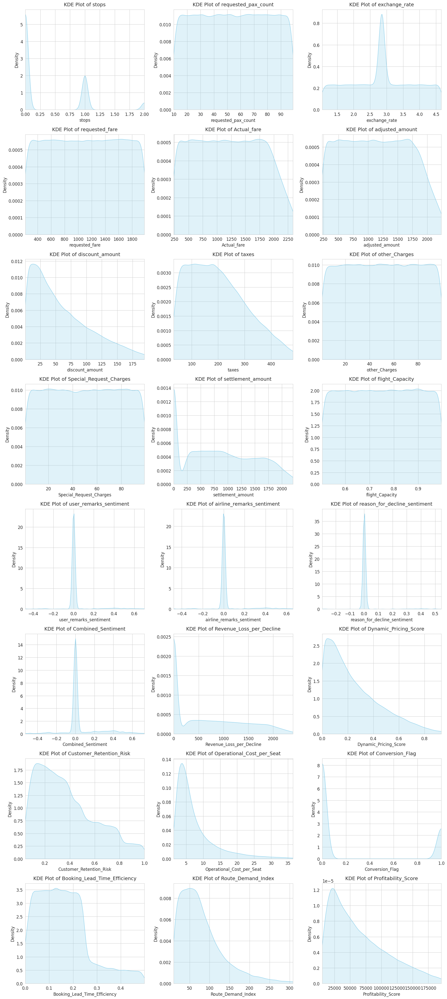

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming df_imputed is already loaded
# Identify numerical columns (float32, float64, int64)
numerical_cols = df_imputed.select_dtypes(include=['float32', 'float64', 'int64']).columns
num_cols = len(numerical_cols)
total_rows = len(df_imputed)

# Set up the plotting style
sns.set_style("whitegrid")
plt.rcParams['figure.figsize'] = (15, 10)
plt.rcParams['font.size'] = 12

# Function to calculate IQR bounds, count outliers, and compute percentage
def get_iqr_outliers(data, col):
    Q1 = data[col].quantile(0.25)
    Q3 = data[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    outliers = data[(data[col] < lower_bound) | (data[col] > upper_bound)][col]
    outlier_count = len(outliers)
    outlier_percentage = (outlier_count / total_rows) * 100
    return lower_bound, upper_bound, outlier_count, outlier_percentage

# Function to create KDE plots
def plot_kde():
    n_rows = (num_cols + 2) // 3
    fig, axes = plt.subplots(n_rows, 3, figsize=(18, 5 * n_rows), squeeze=False)
    axes = axes.flatten()

    for i, col in enumerate(numerical_cols):
        sns.kdeplot(data=df_imputed, x=col, ax=axes[i], fill=True, color='skyblue')
        axes[i].set_title(f'KDE Plot of {col}', fontsize=14, pad=10)
        axes[i].set_xlabel(col, fontsize=12)
        axes[i].set_ylabel('Density', fontsize=12)
        axes[i].set_xlim(df_imputed[col].quantile(0.01), df_imputed[col].quantile(0.99))

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Function to create Boxplots with IQR-based outlier detection and percentage
def plot_boxplot():
    n_rows = (num_cols + 2) // 3
    fig, axes = plt.subplots(n_rows, 3, figsize=(18, 5 * n_rows), squeeze=False)
    axes = axes.flatten()

    for i, col in enumerate(numerical_cols):
        # Calculate IQR bounds, outlier count, and percentage
        lower_bound, upper_bound, outlier_count, outlier_percentage = get_iqr_outliers(df_imputed, col)

        # Create boxplot
        sns.boxplot(data=df_imputed, y=col, ax=axes[i], color='lightcoral', flierprops=dict(marker='o', color='red', markersize=5))
        axes[i].set_title(f'Boxplot of {col}\nOutliers: {outlier_count} ({outlier_percentage:.2f}%)', fontsize=14, pad=10)
        axes[i].set_ylabel(col, fontsize=12)

        # Add IQR bounds as horizontal lines
        axes[i].axhline(lower_bound, color='blue', linestyle='--', alpha=0.5, label='IQR Bounds')
        axes[i].axhline(upper_bound, color='blue', linestyle='--', alpha=0.5)

        # Adjust y-axis limits to focus on main data distribution
        axes[i].set_ylim(df_imputed[col].quantile(0.01), df_imputed[col].quantile(0.99))

        # Add legend for IQR bounds
        if i == 0:
            axes[i].legend()

    for j in range(i + 1, len(axes)):
        fig.delaxes(axes[j])

    plt.tight_layout()
    plt.show()

# Generate the plots
plot_kde()

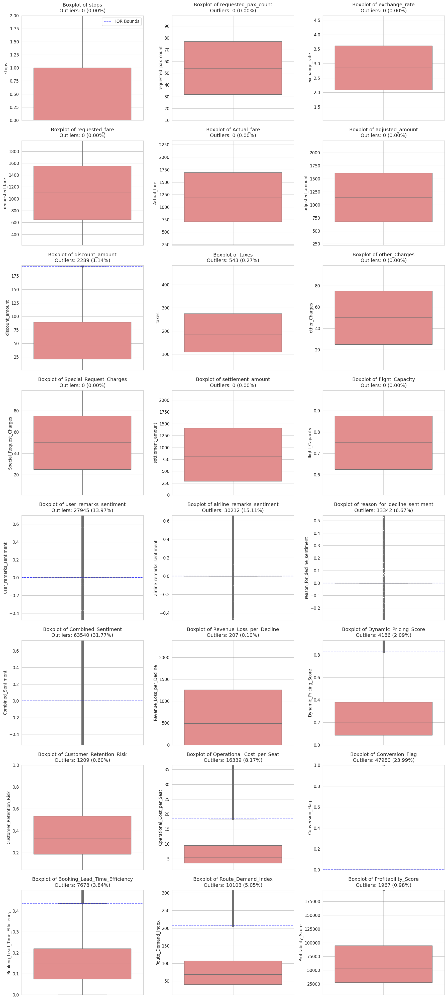

In [ ]:
plot_boxplot()

This is a univariate analysis of 24 numerical columns from a dataset  with 200,000 entries. Key stats include:

- **Central Tendency**: Mean, median, and mode vary by column (e.g., "stops" mean = 0.35, "Profitability_Score" mean = 66,043).
- **Spread**: Standard deviation and range differ widely (e.g., "exchange_rate" std = 0.99, "Profitability_Score" range = 244,290).
- **Distribution**: Most columns are right-skewed (e.g., "stops" skewness = 1.41), with some symmetric; kurtosis ranges from platykurtic to leptokurtic.
- **Outliers**: Notable in columns like "Combined_Sentiment" (31.77%) and "Operational_Cost_per_Seat" (8.17%), with some exceeding valid ranges (e.g., "Dynamic_Pricing_Score" max = 1.96).
- **Notes**: Issues like invalid min values (e.g., "settlement_amount" = 0) and high outlier percentages are flagged.

Summary: Data shows varied distributions, significant outliers in sentiment and cost metrics, and potential data quality issues.

# CATEGORICAL UNIVARIATE ANALYSIS

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming df_imputed is already loaded
# Identify categorical columns (object and category dtypes)
categorical_cols = df_imputed.select_dtypes(include=['object', 'category']).columns
total_rows = len(df_imputed)

# Set up the plotting style
sns.set_style("whitegrid")
plt.rcParams['font.size'] = 12

# Function to calculate and print metrics for all categorical columns with improved formatting
def calculate_categorical_metrics():
    metrics_dict = {}
    print("=" * 80)
    print("CATEGORICAL UNIVARIATE ANALYSIS")
    print("=" * 80)

    for col in categorical_cols:
        # Get value counts
        value_counts = df_imputed[col].value_counts()
        cardinality = len(value_counts)

        # Check for placeholder values (e.g., "--", "NaN", "")
        placeholder_values = df_imputed[col].isin(['--', '', 'NaN', 'nan']).sum()

        # Get top 10 categories, group others as "Other"
        top_10 = value_counts[:10]
        other_count = value_counts[10:].sum() if len(value_counts) > 10 else 0
        if other_count > 0:
            top_10 = pd.concat([top_10, pd.Series({'-Other-': other_count})])

        # Calculate relative frequencies
        relative_freq = (top_10 / total_rows * 100).round(2)

        # Store metrics
        metrics_dict[col] = {
            'column': col,
            'cardinality': cardinality,
            'placeholder_count': placeholder_values,
            'top_10_counts': top_10,
            'relative_freq': relative_freq
        }

        # Print metrics with improved formatting
        print(f"\n{'-' * 50}")
        print(f"Column: {col.upper()}")
        print(f"{'-' * 50}")
        print(f"Total Unique Categories (Cardinality): {cardinality}")
        print(f"Placeholder Values ('--', '', 'NaN', 'nan'): {placeholder_values}")
        print(f"\nTop 10 Categories + Other (Counts and Percentages):")
        print(f"{'Category':<40} {'Count':<10} {'Percentage':<10}")
        print(f"{'-' * 60}")
        for category, count in top_10.items():
            print(f"{str(category):<40} {count:<10} {relative_freq[category]:<10.2f}%")

    print("=" * 80)
    print("END OF ANALYSIS")
    print("=" * 80)

    return metrics_dict

# Function to plot bar charts for all categorical columns
def plot_categorical_bar(metrics_dict):
    for col in metrics_dict:
        metrics = metrics_dict[col]
        top_10 = metrics['top_10_counts']
        relative_freq = metrics['relative_freq']
        cardinality = metrics['cardinality']

        plt.figure(figsize=(10, 6))
        bar_plot = sns.barplot(x=top_10.index, y=top_10.values, color='skyblue')
        plt.title(f'Top 10 Categories in {col} (Cardinality: {cardinality})', fontsize=14, pad=10)
        plt.xlabel(col, fontsize=12)
        plt.ylabel('Count', fontsize=12)

        # Add percentage labels on top of bars
        for i, (count, perc) in enumerate(zip(top_10.values, relative_freq.values)):
            bar_plot.text(i, count, f'{perc}%', ha='center', va='bottom', fontsize=10)

        # Rotate x-axis labels for readability
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

# Result of Cat Univariant Analysis

In [ ]:
# Calculate and print metrics
metrics=calculate_categorical_metrics()

CATEGORICAL UNIVARIATE ANALYSIS

--------------------------------------------------
Column: ORIGIN_AIRPORT_CODE
--------------------------------------------------
Total Unique Categories (Cardinality): 8
Placeholder Values ('--', '', 'NaN', 'nan'): 0

Top 10 Categories + Other (Counts and Percentages):
Category                                 Count      Percentage
------------------------------------------------------------
LHR                                      53461      26.73     %
FRA                                      39439      19.72     %
DEL                                      26842      13.42     %
ICN                                      26687      13.34     %
IST                                      13643      6.82      %
AMS                                      13609      6.80      %
NRT                                      13296      6.65      %
MEL                                      13023      6.51      %

--------------------------------------------------
Column: 

# Summary of Categorical Univariate Analysis

---

## 1. Cardinality & Data Quality

- Unique categories span from 1 (`payment_status`) to 127,591 (`Merchant_name`), with high-cardinality fields (Merchant_name, customer_city, Merchant_id) aggregated into “Other” for over 98% of records.  
- No placeholder or null values detected, indicating clean categorical data.

---

## 2. Dominant Categories by Field

- **Airports**: LHR (26.7% origin, 20.0% destination), FRA (19.7% origin, 13.5% destination)  
- **Region**: IST–BKK (2.21%), HKG–FRA (1.79%), 83.9% “Other”  
- **Trip Type**: Round Trip 79.9%, One Way 20.1%  
- **Cabin**: Economy 79.9%, Business 15.1%, First 5.1%  
- **Flight Number**: MH337 0.73%, 94.6% “Other”  
- **Group Category**: Leisure 60.0%, Corporate 29.9%, MICE 10.2%  
- **Request Type**: New 90.0%, Amendment 8.0%, Cancellation 2.0%  
- **Currency**: MYR 59.9%, USD 20.1%, EUR 10.1%, SGD 9.9%  
- **Aircraft Type**: A330 48.9%, A380 26.5%, B737 24.6%  
- **Merchant Type**: Corporate 50.0%, Leisure 50.0%  
- **Country Code**: VN 2.04%, ER 2.03%, 82.9% “Other”  
- **Customer Country**: Congo 0.8%, Korea 0.8%, 94.9% “Other”  
- **Customer City**: Lake Alanshire 0.18%, 98.8% “Other”  
- **Request Status**: Not Honoured 39.9%, Ticketed 36.2%  
- **Agent Response**: No Response 33.4%, Rejected 33.3%, Accepted 33.3%  
- **PNR Status**: Cancelled 50.1%, Active 49.9%  
- **Payment Status**: Full 100%  
- **Customer Segment Profitability**: Medium 46.5%, Low 28.1%, High 25.4%

---

## 3. Key Insights

- Low-cardinality fields show concentrated distributions; high-cardinality fields fragment into “Other.”  
- Travelers prefer Economy class, round trips, MYR currency, and A330 aircraft, with LHR and FRA as major hubs.  
- Elevated “Not Honoured” and “Cancelled” rates point to operational inefficiencies or churn, highlighting opportunities to improve booking fulfillment and retention.

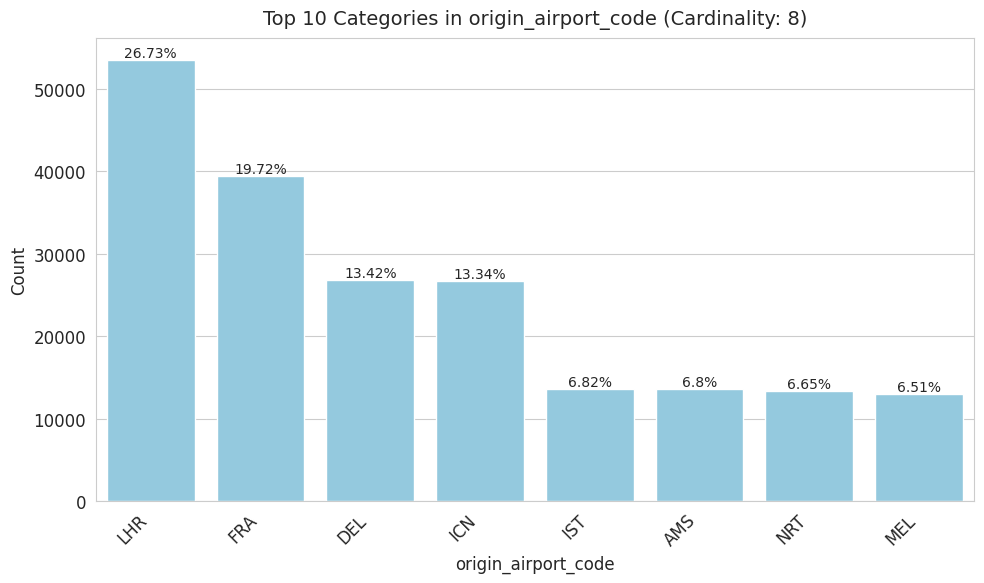

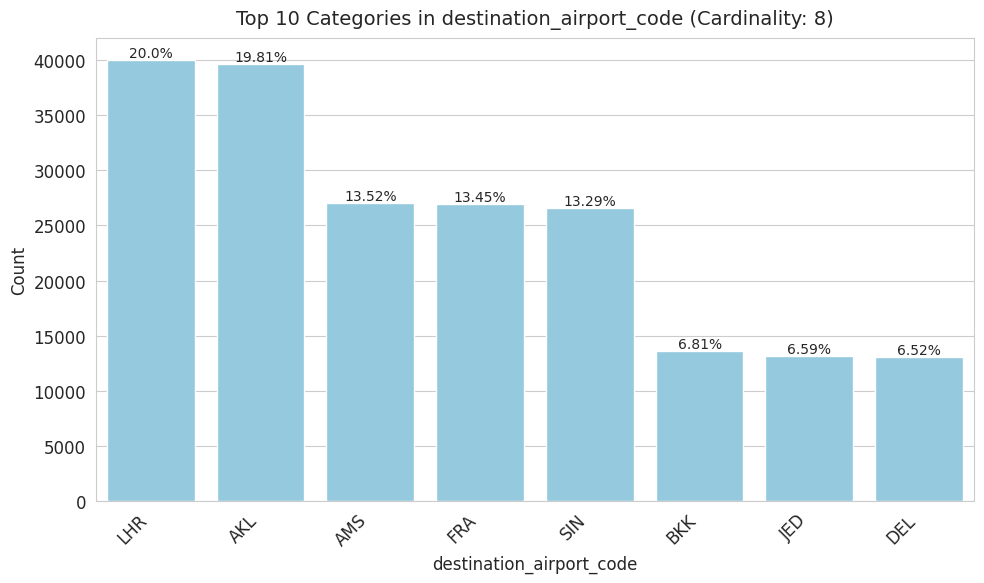

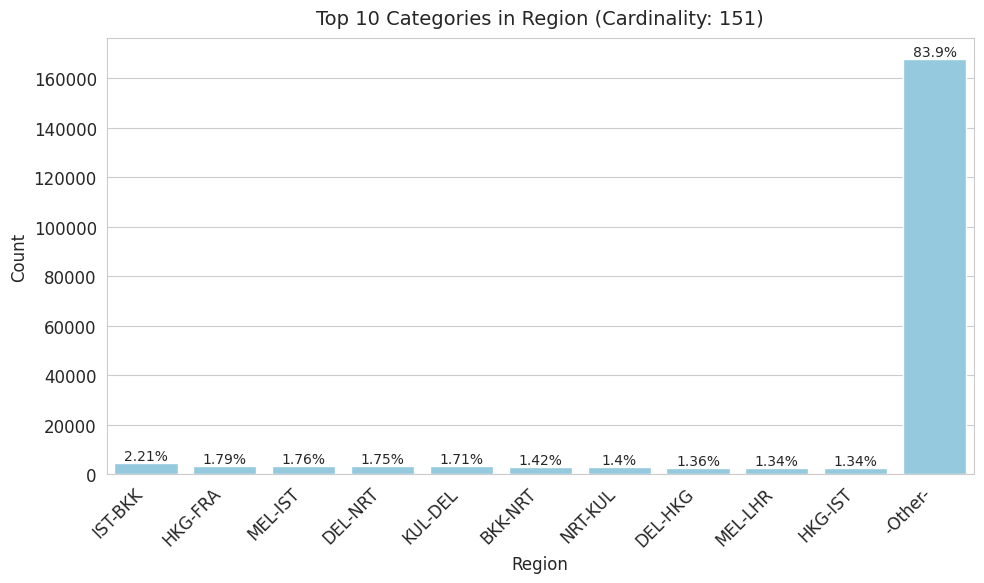

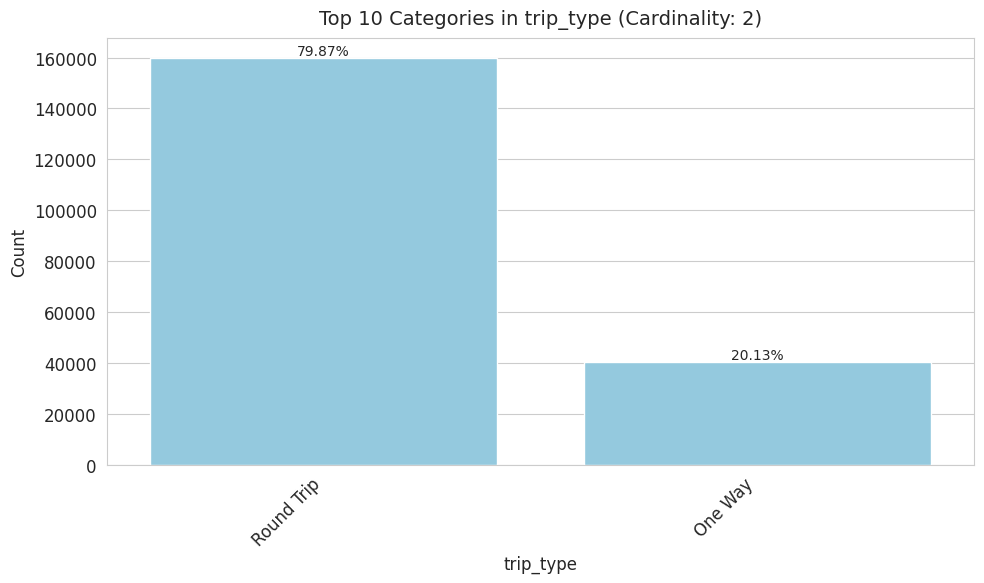

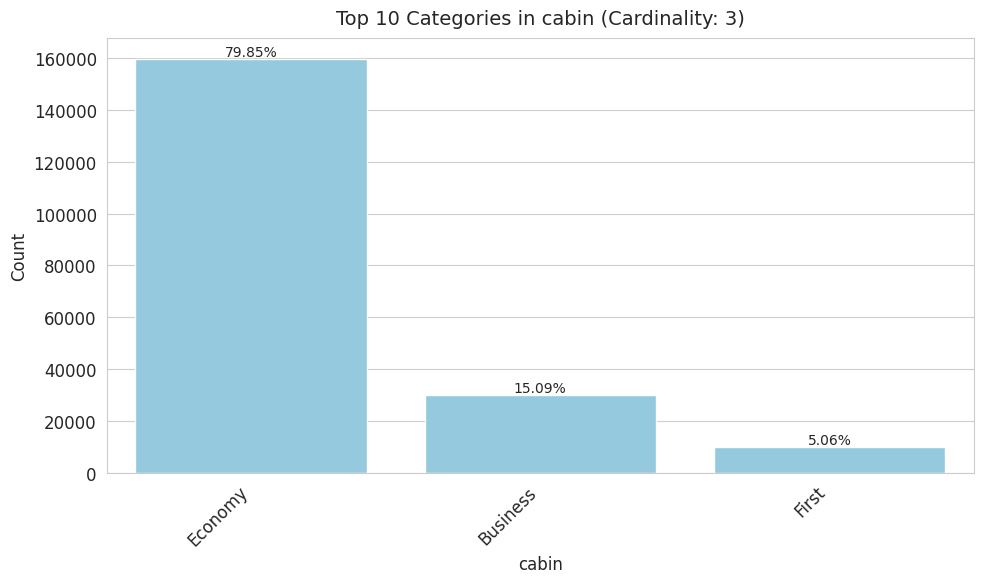

...

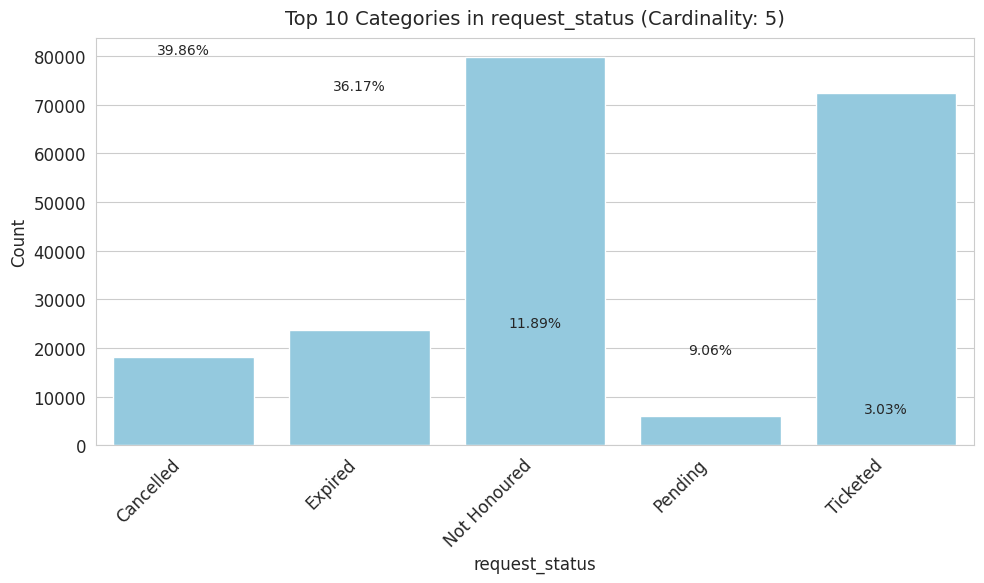

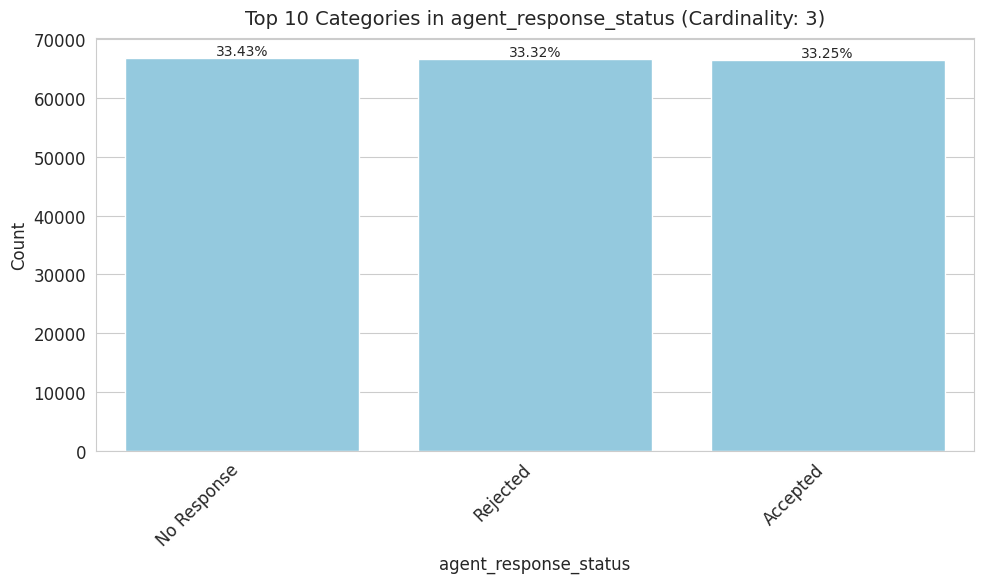

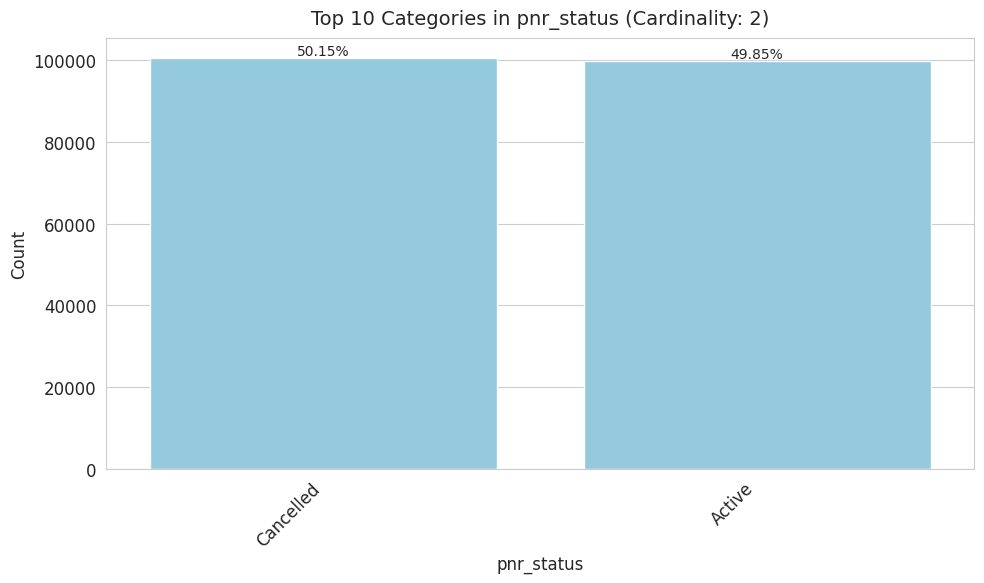

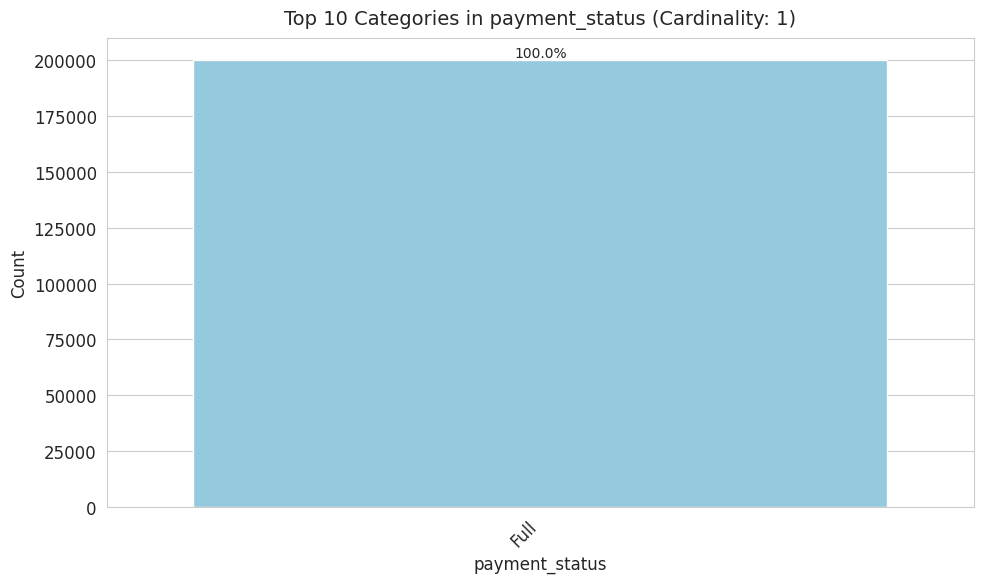

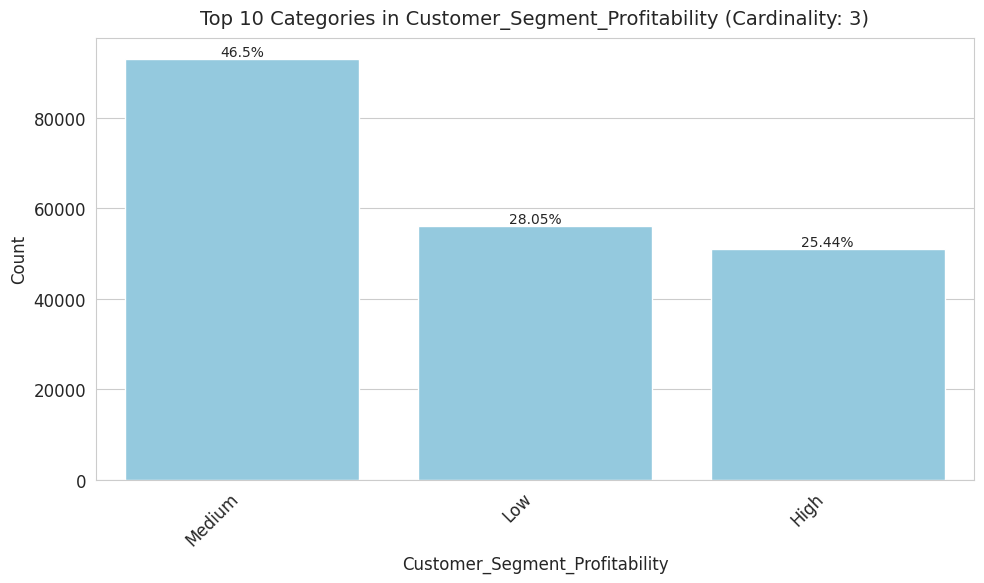

In [ ]:
# Plot bar charts using the stored metrics
plot_categorical_bar(metrics)

This categorical univariate analysis covers 19 columns from a dataset with 200,000 entries, showing category counts and percentages. Key points:

- **Origin/Destination Airport Codes**: Low cardinality (8 each); LHR (26.73%) and AKL (19.81%) dominate, respectively.
- **Region**: High cardinality (151); top regions (e.g., IST-BKK at 2.21%) cover only 16.1%, with 83.9% in "Other."
- **Trip Type**: Binary (Round Trip 79.87%, One Way 20.13%).
- **Cabin**: Three categories (Economy 79.85%, Business 15.09%, First 5.06%).
- **Requested Flight Number**: High cardinality (580); top flights (e.g., MH337 at 0.73%) account for 5.42%, with 94.58% "Other."
- **Group Category**: Three types (Leisure 59.96%, Corporate 29.88%, MICE 10.16%).
- **Request Type**: Three types (New 89.96%, Amendment 8.02%, Cancellation 2.02%).
- **Currency**: Four types (MYR 59.86%, USD 20.12%, EUR 10.11%, SGD 9.91%).
- **Aircraft Type**: Three types (A330 48.91%, A380 26.50%, B737 24.59%).
- **Merchant ID/Name**: Very high cardinality (9,000 and 127,591); top IDs (e.g., AGT7170 at 0.02%) and names (e.g., Smith LLC at 0.14%) are rare, with 99.81% and 98.87% "Other."
- **Merchant Type**: Binary (Corporate 50.03%, Leisure 49.97%).
- **Country Code/Customer Country**: High cardinality (121 and 243); top codes (e.g., VN at 2.04%) and countries (e.g., Congo at 0.80%) are minor, with 82.93% and 94.90% "Other."
- **Customer City**: Extremely high cardinality (26,343); top cities (e.g., Lake Alanshire at 0.18%) are negligible, with 98.81% "Other."
- **Request/Agent Response/PNR Status**: Vary in cardinality (5, 3, 2); "Not Honoured" (39.86%), "No Response" (33.43%), and "Cancelled" (50.15%) lead.
- **Payment Status**: Single category (Full 100%).
- **Customer Segment Profitability**: Three levels (Medium 46.50%, Low 28.05%, High 25.44%).

Summary: Data shows concentrated categories in airports and trip types, high diversity in regions and merchant details, and uniform payment status.

# DATE COLUMNS UNIVARIATE ANALYSIS

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from datetime import datetime

# Assuming df_imputed is already loaded
# Identify date columns (datetime64[ns])
date_cols = df_imputed.select_dtypes(include=['datetime64[ns]']).columns

# Set up the plotting style
sns.set_style("whitegrid")
plt.rcParams['font.size'] = 12

# Function to calculate and print metrics for all date columns
def calculate_date_metrics():
    metrics_dict = {}
    print("=" * 80)
    print("DATE COLUMNS UNIVARIATE ANALYSIS")
    print("=" * 80)

    for col in date_cols:
        # Ensure datetime format
        series = pd.to_datetime(df_imputed[col], errors='coerce')

        # Check for missing or invalid values
        missing_or_invalid = series.isna().sum()

        # Date range summary
        min_date = series.min()
        max_date = series.max()
        date_range_days = (max_date - min_date).days if not pd.isna(min_date) else 0

        # Frequency distribution (daily counts)
        daily_counts = series.dt.date.value_counts().sort_index()

        # Temporal patterns
        years = series.dt.year.value_counts().sort_index()
        months = series.dt.month_name().value_counts().sort_index()
        weekdays = series.dt.day_name().value_counts().sort_index()

        # Store metrics
        metrics_dict[col] = {
            'column': col,
            'missing_or_invalid': missing_or_invalid,
            'min_date': min_date,
            'max_date': max_date,
            'date_range_days': date_range_days,
            'daily_counts': daily_counts,
            'years': years,
            'months': months,
            'weekdays': weekdays
        }

        # Print metrics with clear formatting
        print(f"\n{'-' * 50}")
        print(f"Column: {col.upper()}")
        print(f"{'-' * 50}")
        print(f"Data Type: {series.dtype}")
        print(f"Missing or Invalid Values: {missing_or_invalid}")
        print(f"Date Range: {min_date.strftime('%Y-%m-%d') if not pd.isna(min_date) else 'N/A'} to "
              f"{max_date.strftime('%Y-%m-%d') if not pd.isna(max_date) else 'N/A'} "
              f"({date_range_days} days)")
        print(f"\nTop 5 Dates by Frequency:")
        print(f"{'Date':<15} {'Count':<10} {'Percentage':<10}")
        print(f"{'-' * 40}")
        for date, count in daily_counts.head(5).items():
            percentage = np.round(count / len(series) * 100, 2)  # Fixed: Use np.round
            print(f"{str(date):<15} {count:<10} {percentage:<10.2f}%")
        print(f"\nYear Distribution:")
        print(f"{'Year':<10} {'Count':<10} {'Percentage':<10}")
        print(f"{'-' * 30}")
        for year, count in years.items():
            percentage = np.round(count / len(series) * 100, 2)  # Fixed: Use np.round
            print(f"{year:<10} {count:<10} {percentage:<10.2f}%")
        print(f"\nMonth Distribution:")
        print(f"{'Month':<15} {'Count':<10} {'Percentage':<10}")
        print(f"{'-' * 40}")
        for month, count in months.items():
            percentage = np.round(count / len(series) * 100, 2)  # Fixed: Use np.round
            print(f"{month:<15} {count:<10} {percentage:<10.2f}%")
        print(f"\nWeekday Distribution:")
        print(f"{'Weekday':<15} {'Count':<10} {'Percentage':<10}")
        print(f"{'-' * 40}")
        for weekday, count in weekdays.items():
            percentage = np.round(count / len(series) * 100, 2)  # Fixed: Use np.round
            print(f"{weekday:<15} {count:<10} {percentage:<10.2f}%")

    print("=" * 80)
    print("END OF ANALYSIS")
    print("=" * 80)

    return metrics_dict

# Function to plot visualizations for all date columns
def plot_date_visualizations(metrics_dict):
    for col in metrics_dict:
        metrics = metrics_dict[col]
        daily_counts = metrics['daily_counts']
        years = metrics['years']
        months = metrics['months']
        weekdays = metrics['weekdays']

        # Plot 1: Daily Frequency (Line Plot for Temporal Trends)
        plt.figure(figsize=(12, 6))
        daily_counts.plot(kind='line', color='skyblue')
        plt.title(f'Temporal Distribution of {col} (Daily Counts)', fontsize=14, pad=10)
        plt.xlabel('Date', fontsize=12)
        plt.ylabel('Count', fontsize=12)
        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()
        plt.show()

        # Plot 2: Monthly Distribution (Bar Plot)
        plt.figure(figsize=(10, 6))
        sns.barplot(x=months.values, y=months.index, color='lightcoral')
        plt.title(f'Monthly Distribution of {col}', fontsize=14, pad=10)
        plt.xlabel('Count', fontsize=12)
        plt.ylabel('Month', fontsize=12)
        for i, count in enumerate(months.values):
            percentage = np.round(count / sum(months.values) * 100, 2)  # Fixed: Use np.round
            plt.text(count, i, f'{percentage}%', va='center', fontsize=10)
        plt.tight_layout()
        plt.show()

        # Plot 3: Weekday Distribution (Bar Plot)
        plt.figure(figsize=(10, 6))
        sns.barplot(x=weekdays.values, y=weekdays.index, color='lightgreen')
        plt.title(f'Weekday Distribution of {col}', fontsize=14, pad=10)
        plt.xlabel('Count', fontsize=12)
        plt.ylabel('Weekday', fontsize=12)
        for i, count in enumerate(weekdays.values):
            percentage = np.round(count / sum(weekdays.values) * 100, 2)  # Fixed: Use np.round
            plt.text(count, i, f'{percentage}%', va='center', fontsize=10)
        plt.tight_layout()
        plt.show()

# Result of DATE COLUMNS UNIVARIATE ANALYSIS

In [ ]:
#  Calculate and print metrics
metrics = calculate_date_metrics()

DATE COLUMNS UNIVARIATE ANALYSIS

--------------------------------------------------
Column: REQUEST_DATE
--------------------------------------------------
Data Type: datetime64[ns]
Missing or Invalid Values: 0
Date Range: 2024-09-01 to 2025-09-01 (365 days)

Top 5 Dates by Frequency:
Date            Count      Percentage
----------------------------------------
2024-09-01      520        0.26      %
2024-09-02      592        0.30      %
2024-09-03      544        0.27      %
2024-09-04      574        0.29      %
2024-09-05      516        0.26      %

Year Distribution:
Year       Count      Percentage
------------------------------
2024       66730      33.36     %
2025       133270     66.64     %

Month Distribution:
Month           Count      Percentage
----------------------------------------
April           16599      8.30      %
August          16930      8.46      %
December        17039      8.52      %
February        15281      7.64      %
January         16940      8.47

# Summary of Date Columns Univariate Analysis

---

## Data Integrity & Date Ranges

- All seven fields (`request_date`, `departure_date`, `arrival_date`, `offer_expiry_date`, `airline_update_date`, `created_at`, `updated_at`) are in `datetime64[ns]` with no missing or invalid entries.  
- `request_date` & `created_at`: 2024-09-01 to 2025-09-01 (365 days).  
- `departure_date`: 2024-09-08 to 2026-02-28 (538 days).  
- `arrival_date`: 2024-09-16 to 2026-03-28 (558 days).  
- `offer_expiry_date`: 2024-09-21 to 2026-04-09 (565 days).  
- `airline_update_date` & `updated_at`: 2024-09-22 to 2026-04-11 (566 days), showing future-oriented travel and update timelines.

---

## Activity Patterns

- **High daily volume** for `request_date` & `created_at` (520–592 requests/day; ~0.26–0.30% of rows), indicating peak request creation.  
- **Low daily counts** for `departure_date`, `arrival_date`, `offer_expiry_date`, `airline_update_date`, and `updated_at` (1–14 events/day; ~0.00–0.01%), reflecting dispersed booking and update events.

---

## Temporal Distribution

- **Yearly**: 2025 dominates (66.6% of request/creation; 86.7–87.9% of travel/update dates), 2024 is moderate (6.3–33.4%), and 2026 is minimal (2.8–5.8%).  
- **Monthly**: Even spread (~7.6–8.7% per month), with slight peaks in December, March, July and a minor dip in February.  
- **Weekdays**: Uniform distribution (~14.1–14.5% per day), with a marginal uptick on Sundays.

---

## Key Insights

- Booking and creation activity is stable and non-seasonal.  
- Travel and update events extend into 2026, indicating forward-looking scheduling.  
- Consistent patterns support predictable operational planning without major seasonal or weekly fluctuations.

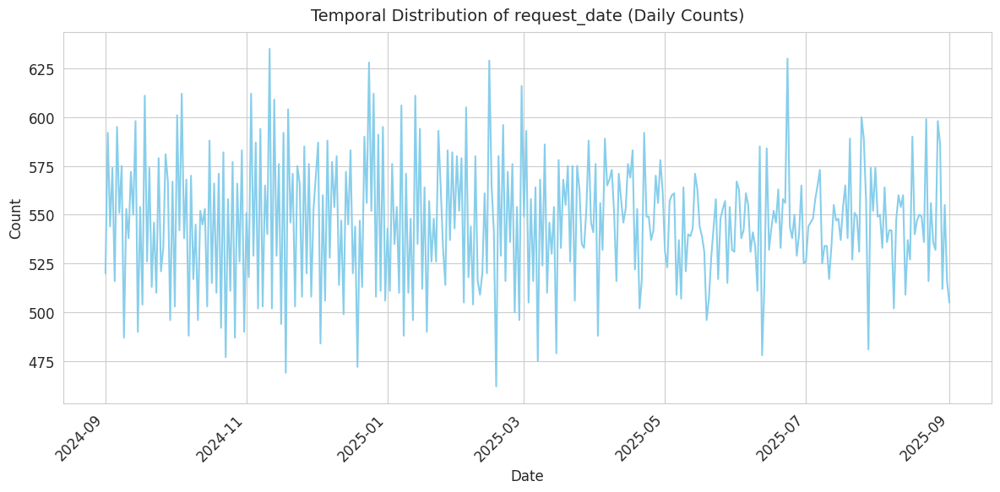

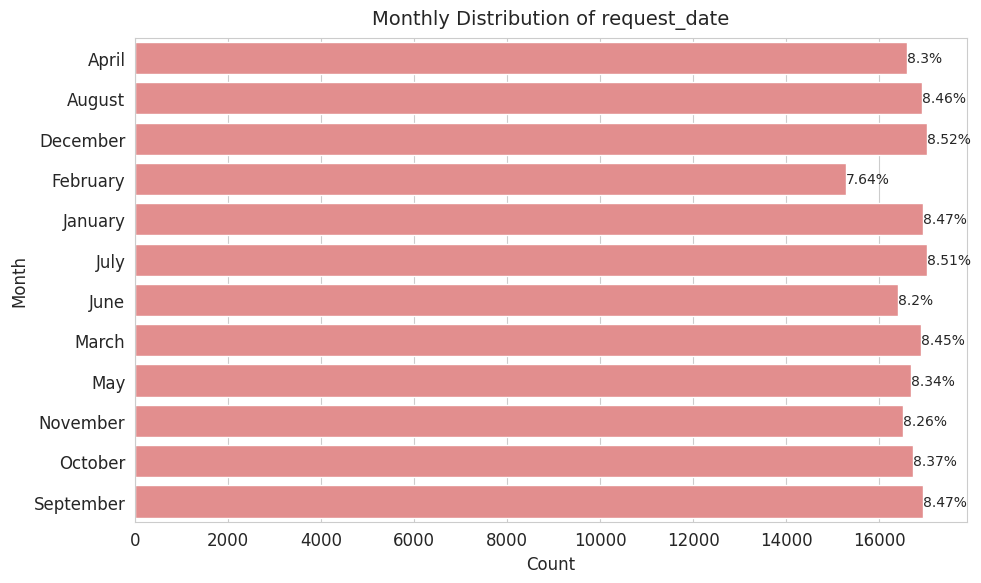

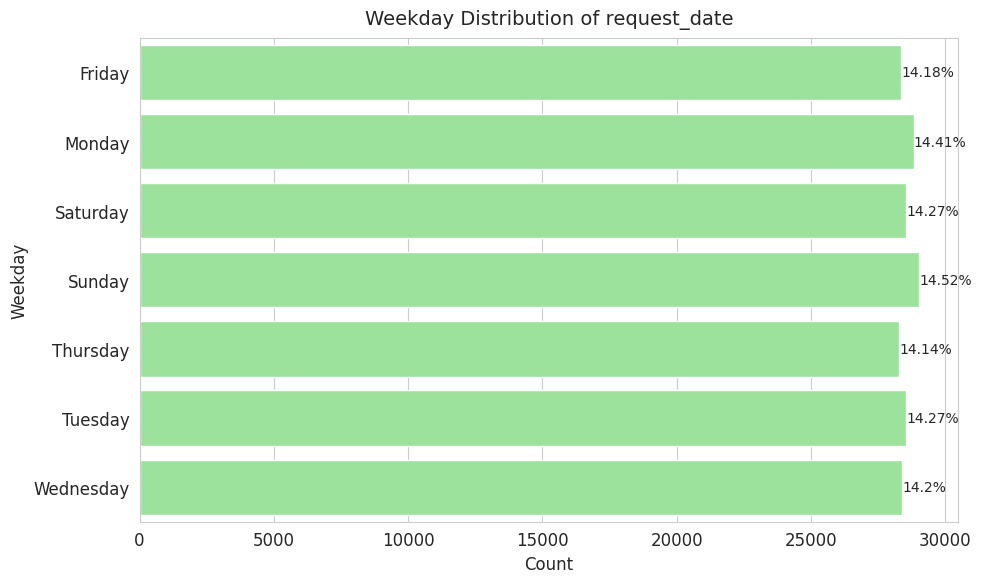

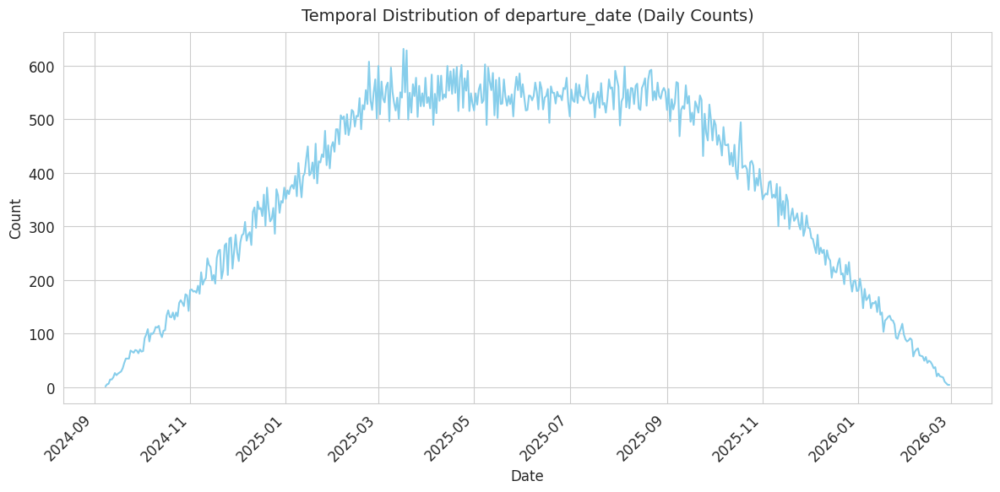

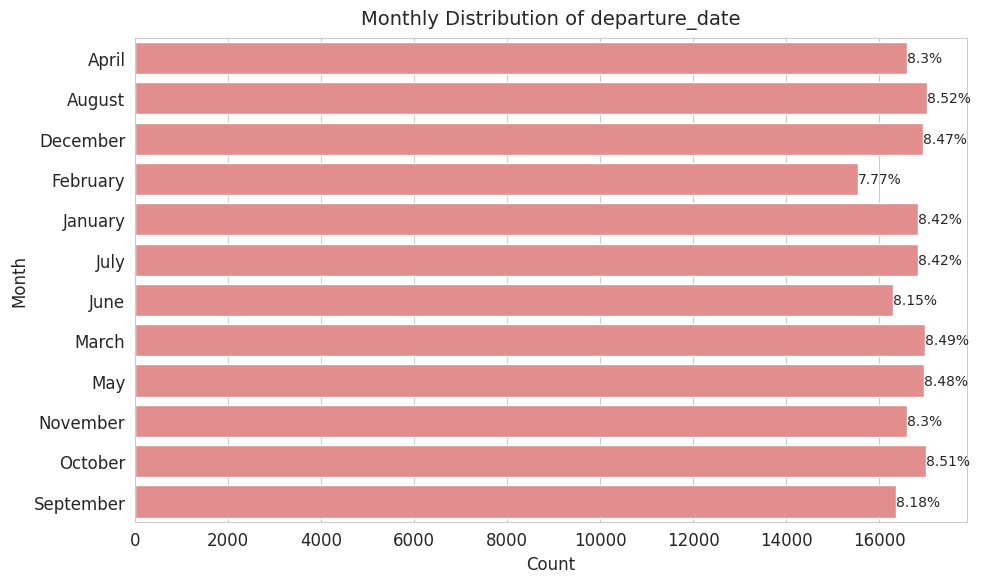

...

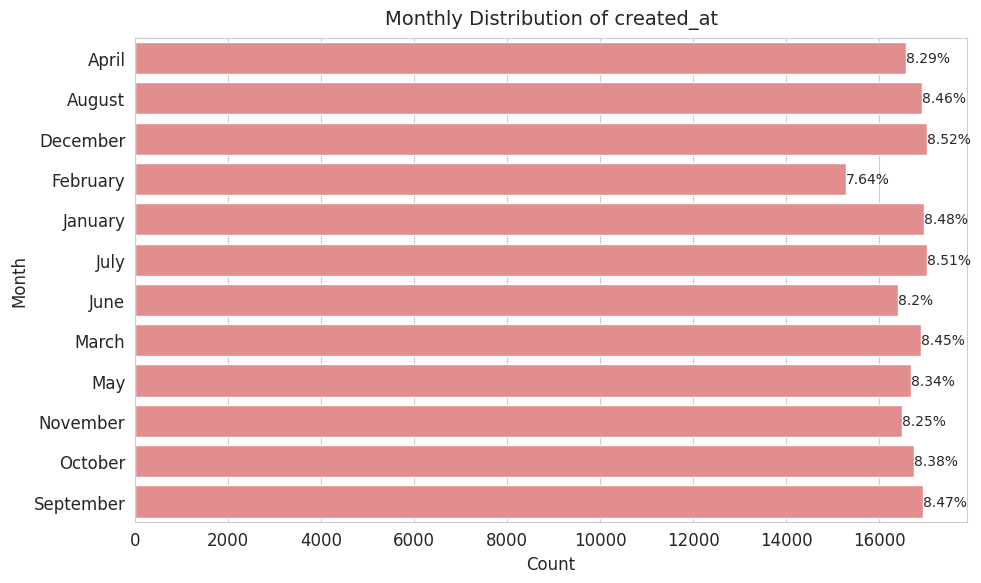

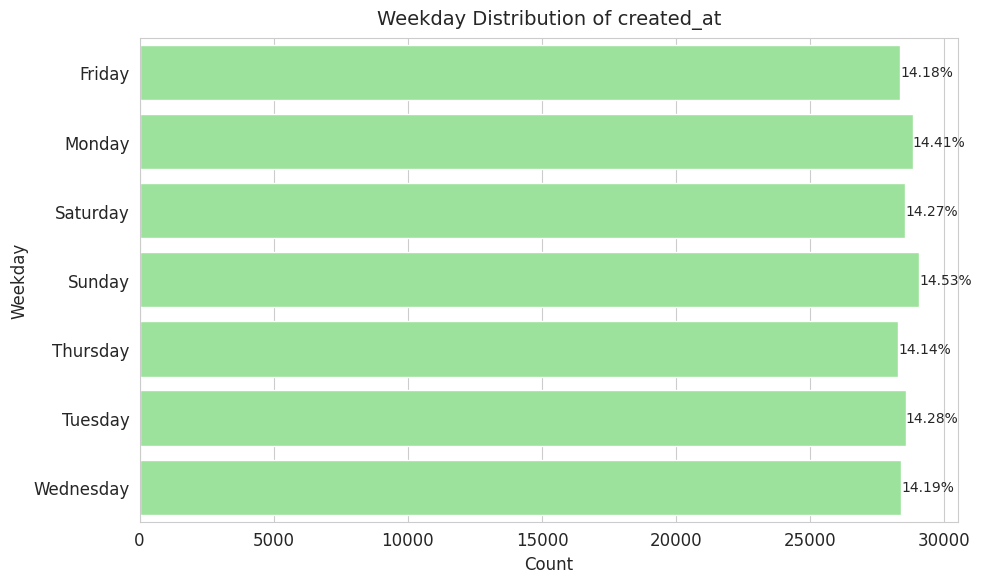

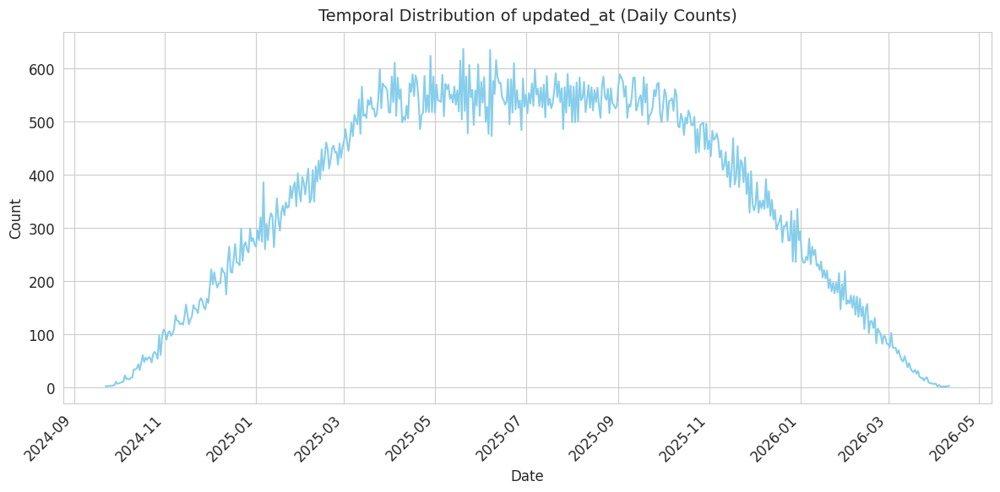

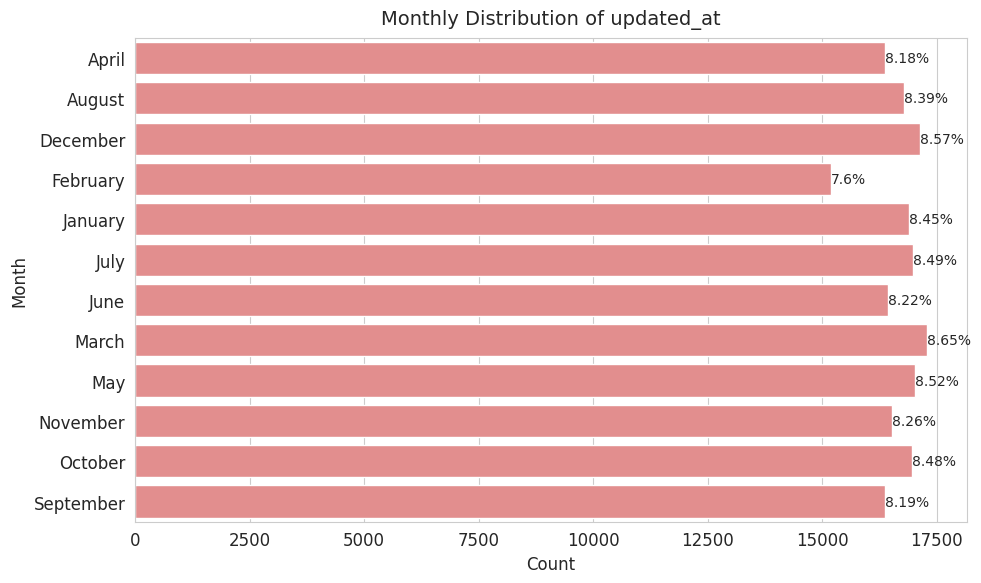

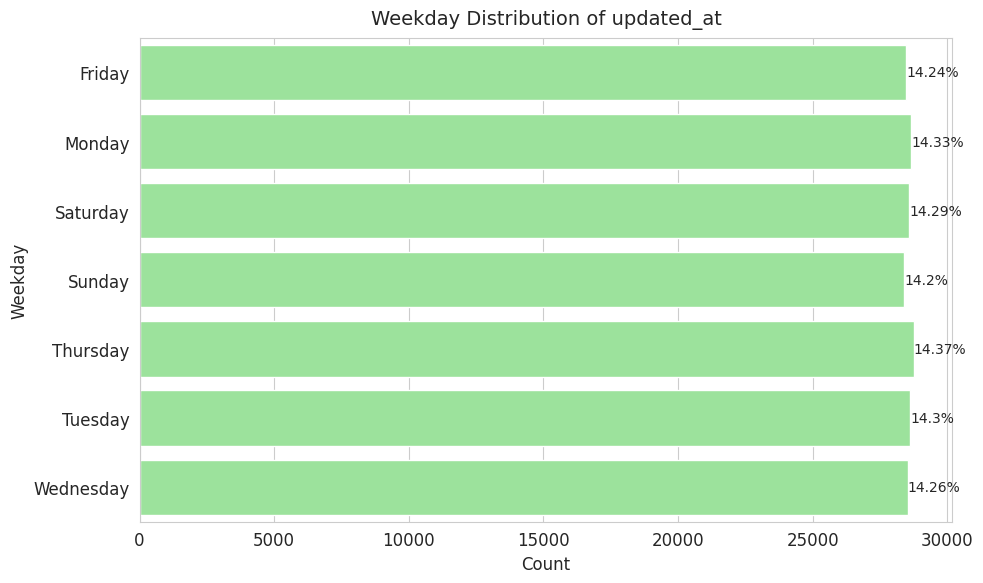

In [ ]:
# Plot visualizations using the stored metrics
plot_date_visualizations(metrics)

This analysis covers seven date columns from a dataset with 200,000 entries, all datetime64[ns] type and no missing/invalid values. Key points:

- **Request Date**: Ranges 2024-09-01 to 2025-09-01 (365 days); 66.64% in 2025, evenly distributed months (8.20-8.52%), weekdays (14.14-14.53%).
- **Departure Date**: Ranges 2024-09-08 to 2026-02-28 (538 days); 86.73% in 2025, months (7.77-8.52%), weekdays (14.21-14.37%).
- **Arrival Date**: Ranges 2024-09-16 to 2026-03-28 (558 days); 87.65% in 2025, months (7.69-8.60%), weekdays (14.19-14.35%).
- **Offer Expiry Date**: Ranges 2024-09-21 to 2026-04-09 (565 days); 87.87% in 2025, months (7.59-8.65%), weekdays (14.12-14.37%).
- **Airline Update Date**: Ranges 2024-09-22 to 2026-04-11 (566 days); 87.89% in 2025, months (7.59-8.65%), weekdays (14.18-14.41%).
- **Created At**: Matches Request Date range (365 days); 66.64% in 2025, months (8.20-8.52%), weekdays (14.14-14.53%).
- **Updated At**: Matches Airline Update Date range (566 days); 87.88% in 2025, months (7.60-8.57%), weekdays (14.20-14.37%).

Summary: Most activity is in 2025 (66.64-87.89%), with even monthly and weekday distributions; top dates have low frequencies (<0.30%).

# BOOLEAN COLUMNS UNIVARIATE ANALYSIS


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Assuming df_imputed is already loaded
# Define boolean columns
boolean_cols = ['user_remarks_was_missing', 'airline_remarks_was_missing', 'reason_for_decline_was_missing']

# Set up the plotting style
sns.set_style("whitegrid")
plt.rcParams['font.size'] = 12

# Contextual insights for boolean columns
contextual_insights = {
    'user_remarks_was_missing': "Indicates if user remarks were missing in the booking request. True suggests incomplete user input, potentially affecting request processing.",
    'airline_remarks_was_missing': "Flags if airline remarks were absent. True indicates no additional airline comments, which may impact operational clarity or decision-making.",
    'reason_for_decline_was_missing': "Denotes if the reason for request decline was not provided. True suggests lack of documentation for declined requests, affecting analysis of rejection causes."
}

# Function to calculate and print metrics for all boolean columns
def calculate_boolean_metrics():
    metrics_dict = {}
    print("=" * 80)
    print("BOOLEAN COLUMNS UNIVARIATE ANALYSIS")
    print("=" * 80)

    for col in boolean_cols:
        # Frequency counts
        value_counts = df_imputed[col].value_counts()

        # Proportions (percentages)
        proportions = np.round(value_counts / len(df_imputed) * 100, 2)

        # Missing values
        missing_values = df_imputed[col].isna().sum()

        # Store metrics
        metrics_dict[col] = {
            'column': col,
            'value_counts': value_counts,
            'proportions': proportions,
            'missing_values': missing_values,
            'contextual_insight': contextual_insights.get(col, "No contextual insight available.")
        }

        # Print metrics with clear formatting
        print(f"\n{'-' * 50}")
        print(f"Column: {col.upper()}")
        print(f"{'-' * 50}")
        print(f"Data Type: {df_imputed[col].dtype}")
        print(f"Missing Values: {missing_values}")
        print(f"\nFrequency Counts and Proportions:")
        print(f"{'Value':<15} {'Count':<10} {'Percentage':<10}")
        print(f"{'-' * 40}")
        for value in [True, False]:  # Ensure consistent order: True, False
            count = value_counts.get(value, 0)
            percentage = proportions.get(value, 0.0)
            print(f"{str(value):<15} {count:<10} {percentage:<10.2f}%")
        print(f"\nContextual Insight: {contextual_insights.get(col, 'No contextual insight available.')}")

    print("=" * 80)
    print("END OF ANALYSIS")
    print("=" * 80)

    return metrics_dict

# Function to plot visualizations for all boolean columns
def plot_boolean_visualizations(metrics_dict):
    for col in metrics_dict:
        metrics = metrics_dict[col]
        value_counts = metrics['value_counts']
        proportions = metrics['proportions']

        # Bar plot
        plt.figure(figsize=(8, 6))
        bar_plot = sns.barplot(x=value_counts.index.astype(str), y=value_counts.values, color='skyblue', order=['True', 'False'])
        plt.title(f'Distribution of {col} (Boolean)', fontsize=14, pad=10)
        plt.xlabel('Value', fontsize=12)
        plt.ylabel('Count', fontsize=12)

        # Add percentage labels on top of bars
        for i, value in enumerate(['True', 'False']):
            count = value_counts.get(bool(value == 'True'), 0)
            percentage = proportions.get(bool(value == 'True'), 0.0)
            plt.text(i, count, f'{percentage:.2f}%', ha='center', va='bottom', fontsize=10)

        plt.tight_layout()
        plt.show()

# Result of  BOOLEAN COLUMNS UNIVARIATE ANALYSIS

In [ ]:
# Calculate and print metrics
metrics = calculate_boolean_metrics()

BOOLEAN COLUMNS UNIVARIATE ANALYSIS

--------------------------------------------------
Column: USER_REMARKS_WAS_MISSING
--------------------------------------------------
Data Type: bool
Missing Values: 0

Frequency Counts and Proportions:
Value           Count      Percentage
----------------------------------------
True            154912     77.46     %
False           45088      22.54     %

Contextual Insight: Indicates if user remarks were missing in the booking request. True suggests incomplete user input, potentially affecting request processing.

--------------------------------------------------
Column: AIRLINE_REMARKS_WAS_MISSING
--------------------------------------------------
Data Type: bool
Missing Values: 0

Frequency Counts and Proportions:
Value           Count      Percentage
----------------------------------------
True            140300     70.15     %
False           59700      29.85     %

Contextual Insight: Flags if airline remarks were absent. True indicates 

# Summary of Boolean Columns Analysis

---

## 1. Data Integrity

- All three fields (`user_remarks_was_missing`, `airline_remarks_was_missing`, `reason_for_decline_was_missing`) are boolean with zero nulls, confirming clean data.

---

## 2. Missingness Rates

- **user_remarks_was_missing**  
  - True: 77.46% (154,912)  
  - False: 22.54% (45,088)  

- **airline_remarks_was_missing**  
  - True: 70.15% (140,300)  
  - False: 29.85% (59,700)  

- **reason_for_decline_was_missing**  
  - True: 84.97% (169,933)  
  - False: 15.03% (30,067)  

---

## 3. Key Insights

- A strong skew toward **True** across all columns highlights pervasive missing documentation in user remarks, airline remarks, and decline reasons.  
- The extreme 85% gap in decline reasons severely limits analysis of rejection causes and corrective actions.  
- These trends point to critical weaknesses in data capture processes—improving remark collection and decline-reason logging will bolster operational transparency and customer experience.

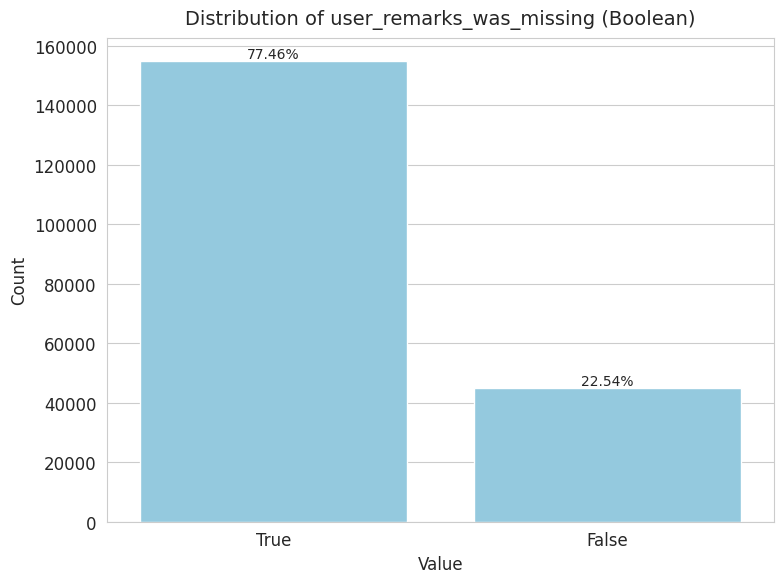

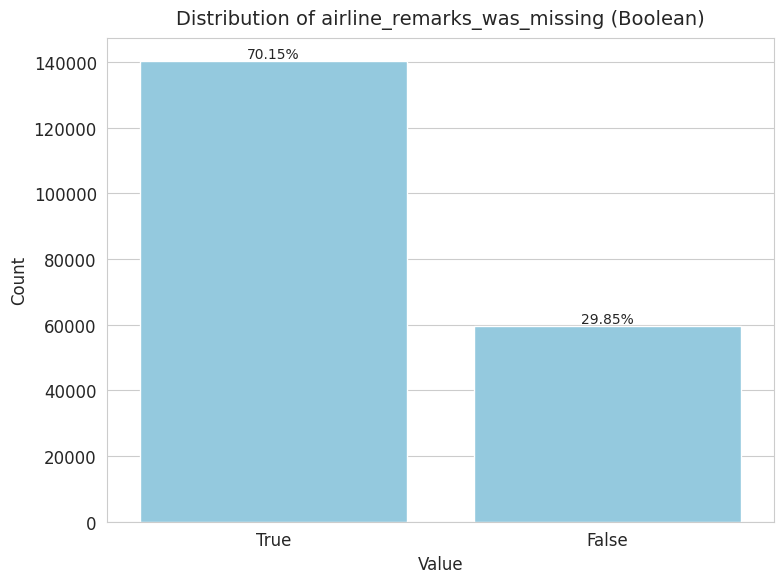

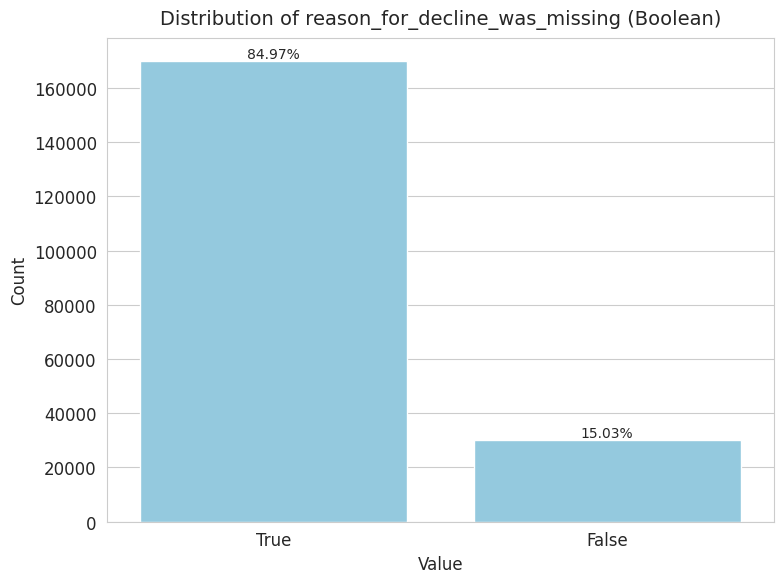

In [ ]:
# Plot visualizations using the stored metrics
plot_boolean_visualizations(metrics)

This analysis covers three boolean columns from a dataset  with 200,000 entries, all with no missing values. Key points:

- **User Remarks Was Missing**: 77.46% True (154,912), 22.54% False (45,088); indicates most booking requests lacked user remarks, potentially impacting processing.
- **Airline Remarks Was Missing**: 70.15% True (140,300), 29.85% False (59,700); suggests a majority of cases had no airline comments, possibly affecting operational clarity.
- **Reason for Decline Was Missing**: 84.97% True (169,933), 15.03% False (30,067); shows most declined requests lacked documented reasons, hindering rejection analysis.

Summary: High percentages of missing remarks (70-85%) across all columns suggest significant data gaps.

# Bivariate Analysis ( initial setup)

## Used parallel computing

## Approach

1. Group column pairs by type:

* Num–Num

* Num–Cat

* Cat–Cat

2. Test for statistical significance:

* Use parametric tests if assumptions are met

* Use non-parametric tests otherwise (e.g., Mann–Whitney U, Kruskal–Wallis, Chi-Square)

3. Keep only significant pairs:

* Filter by p-value < 0.05

4. Plot those pairs:

* Num–Num → scatter plot

* Num–Cat → box plot

* Cat–Cat → heatmap or bar chart

In [ ]:
# Exclude any pair where one feature is derived from the other directly or indirectly.
invalid_pairs = [
    # Combined_Sentiment direct components
    ('Combined_Sentiment', 'user_remarks_sentiment'),
    ('Combined_Sentiment', 'airline_remarks_sentiment'),
    ('Combined_Sentiment', 'reason_for_decline_sentiment'),
    ('Combined_Sentiment', 'user_remarks_was_missing'),
    ('Combined_Sentiment', 'airline_remarks_was_missing'),
    ('Combined_Sentiment', 'reason_for_decline_was_missing'),

    # Revenue_Loss_per_Decline
    ('Revenue_Loss_per_Decline', 'Actual_fare'),
    ('Revenue_Loss_per_Decline', 'request_status'),
    ('Revenue_Loss_per_Decline', 'Combined_Sentiment'),
    ('Revenue_Loss_per_Decline', 'user_remarks_sentiment'),
    ('Revenue_Loss_per_Decline', 'airline_remarks_sentiment'),
    ('Revenue_Loss_per_Decline', 'reason_for_decline_sentiment'),
    ('Revenue_Loss_per_Decline', 'user_remarks_was_missing'),
    ('Revenue_Loss_per_Decline', 'airline_remarks_was_missing'),
    ('Revenue_Loss_per_Decline', 'reason_for_decline_was_missing'),

    # Dynamic_Pricing_Score
    ('Dynamic_Pricing_Score', 'Actual_fare'),
    ('Dynamic_Pricing_Score', 'Region'),
    ('Dynamic_Pricing_Score', 'cabin'),
    ('Dynamic_Pricing_Score', 'stops'),
    ('Dynamic_Pricing_Score', 'flight_Capacity'),
    ('Dynamic_Pricing_Score', 'Combined_Sentiment'),
    ('Dynamic_Pricing_Score', 'user_remarks_sentiment'),
    ('Dynamic_Pricing_Score', 'airline_remarks_sentiment'),
    ('Dynamic_Pricing_Score', 'reason_for_decline_sentiment'),
    ('Dynamic_Pricing_Score', 'user_remarks_was_missing'),
    ('Dynamic_Pricing_Score', 'airline_remarks_was_missing'),
    ('Dynamic_Pricing_Score', 'reason_for_decline_was_missing'),

    # Customer_Retention_Risk
    ('Customer_Retention_Risk', 'Combined_Sentiment'),
    ('Customer_Retention_Risk', 'request_status'),
    ('Customer_Retention_Risk', 'pnr_status'),
    ('Customer_Retention_Risk', 'requested_pax_count'),
    ('Customer_Retention_Risk', 'user_remarks_sentiment'),
    ('Customer_Retention_Risk', 'airline_remarks_sentiment'),
    ('Customer_Retention_Risk', 'reason_for_decline_sentiment'),
    ('Customer_Retention_Risk', 'user_remarks_was_missing'),
    ('Customer_Retention_Risk', 'airline_remarks_was_missing'),
    ('Customer_Retention_Risk', 'reason_for_decline_was_missing'),

    # Operational_Cost_per_Seat
    ('Operational_Cost_per_Seat', 'taxes'),
    ('Operational_Cost_per_Seat', 'other_Charges'),
    ('Operational_Cost_per_Seat', 'Special_Request_Charges'),
    ('Operational_Cost_per_Seat', 'requested_pax_count'),
    ('Operational_Cost_per_Seat', 'airline_remarks_sentiment'),
    ('Operational_Cost_per_Seat', 'airline_remarks_was_missing'),

    # Booking_Lead_Time_Efficiency
    ('Booking_Lead_Time_Efficiency', 'request_date'),
    ('Booking_Lead_Time_Efficiency', 'departure_date'),
    ('Booking_Lead_Time_Efficiency', 'Conversion_Flag'),
    ('Booking_Lead_Time_Efficiency', 'user_remarks_sentiment'),
    ('Booking_Lead_Time_Efficiency', 'user_remarks_was_missing'),
    ('Booking_Lead_Time_Efficiency', 'Combined_Sentiment'),
    ('Booking_Lead_Time_Efficiency', 'user_remarks_sentiment'),
    ('Booking_Lead_Time_Efficiency', 'airline_remarks_sentiment'),
    ('Booking_Lead_Time_Efficiency', 'reason_for_decline_sentiment'),
    ('Booking_Lead_Time_Efficiency', 'user_remarks_was_missing'),
    ('Booking_Lead_Time_Efficiency', 'airline_remarks_was_missing'),
    ('Booking_Lead_Time_Efficiency', 'reason_for_decline_was_missing'),

    # Route_Demand_Index
    ('Route_Demand_Index', 'requested_pax_count'),
    ('Route_Demand_Index', 'flight_Capacity'),
    ('Route_Demand_Index', 'request_status'),
    ('Route_Demand_Index', 'stops'),
    ('Route_Demand_Index', 'airline_remarks_sentiment'),
    ('Route_Demand_Index', 'airline_remarks_was_missing'),

    # Profitability_Score
    ('Profitability_Score', 'Actual_fare'),
    ('Profitability_Score', 'requested_pax_count'),

    # Customer_Segment_Profitability
    ('Customer_Segment_Profitability', 'Profitability_Score'),
    ('Customer_Segment_Profitability', 'Combined_Sentiment'),
    ('Customer_Segment_Profitability', 'user_remarks_was_missing'),
    ('Customer_Segment_Profitability', 'airline_remarks_was_missing'),
    ('Customer_Segment_Profitability', 'reason_for_decline_was_missing'),
    ('Customer_Segment_Profitability', 'user_remarks_sentiment'),
    ('Customer_Segment_Profitability', 'airline_remarks_sentiment'),
    ('Customer_Segment_Profitability', 'reason_for_decline_sentiment')
]
# Exclude any pair where one feature is derived from the other directly or indirectly.

## Define Key Business Questions ( some of question that worth pondering)
Before diving into pairwise comparisons, anchor your analysis to objectives. For example:

1. Which factors drive Revenue_Loss_per_Decline and Profitability_Score?

2. How do booking attributes (e.g., cabin, trip type) impact conversion rates?

3. Does missing remark data correlate with declines or low profitability?

# NUMERICAL-NUMERICAL BIVARIATE ANALYSIS (used parallel computing)

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr, spearmanr
import itertools

# Assuming df_imputed is already loaded
# Identify numeric columns (float32, float64, int64)
numeric_cols = df_imputed.select_dtypes(include=['float32', 'float64', 'int64']).columns

# Set up the plotting style
sns.set_style("whitegrid")
plt.rcParams['font.size'] = 10  # Smaller font for better heatmap readability


# Convert invalid pairs to a set of frozensets for order-agnostic comparison
invalid_pairs_set = {frozenset(pair) for pair in invalid_pairs}

# Function to calculate correlations and print metrics
def calculate_numerical_correlations():
    metrics_dict = {}
    print("=" * 100)
    print("NUMERICAL-NUMERICAL BIVARIATE ANALYSIS (SIGNIFICANT ONLY, P < 0.05)")
    print("=" * 100)

    # Compute Pearson and Spearman correlation matrices
    pearson_corr = df_imputed[numeric_cols].corr(method='pearson')
    spearman_corr = df_imputed[numeric_cols].corr(method='spearman')

    # Store correlation matrices
    metrics_dict['pearson_corr'] = pearson_corr
    metrics_dict['spearman_corr'] = spearman_corr

    # Get all pairs (excluding self-correlations and invalid pairs)
    all_pairs = [(col1, col2) for col1, col2 in itertools.combinations(numeric_cols, 2)
                 if frozenset([col1, col2]) not in invalid_pairs_set]

    # Calculate p-values for all valid pairs
    p_values = {}
    pearson_values = []
    for col1, col2 in all_pairs:
        pearson_r, pearson_p = pearsonr(df_imputed[col1], df_imputed[col2])
        spearman_r, spearman_p = spearmanr(df_imputed[col1], df_imputed[col2])
        p_values[(col1, col2)] = {
            'pearson_r': pearson_r,
            'pearson_p': pearson_p,
            'spearman_r': spearman_r,
            'spearman_p': spearman_p
        }
        if pearson_p < 0.05:  # Only include significant pairs
            pearson_values.append((pearson_r, (col1, col2)))

    # Sort by absolute Pearson correlation and select top 25 significant pairs
    pearson_values.sort(key=lambda x: abs(x[0]), reverse=True)
    top_pairs = [pair for _, pair in pearson_values[:25]]
    top_5_pairs = top_pairs[:5]  # Subset for plotting

    # Prepare top 25 significant pairs data for return
    significant_pairs_data = []
    if top_pairs:
        for col1, col2 in top_pairs:
            significant_pairs_data.append({
                'pair': (col1, col2),
                'pearson_r': p_values[(col1, col2)]['pearson_r'],
                'pearson_p': p_values[(col1, col2)]['pearson_p'],
                'spearman_r': p_values[(col1, col2)]['spearman_r'],
                'spearman_p': p_values[(col1, col2)]['spearman_p']
            })
        print(f"\nReturning top {len(top_pairs)} significant pairs")

    # Print correlation summary for top 25 significant pairs
    if top_pairs:
        print("\nTop 25 Significant Correlated Pairs (Pearson, p < 0.05, excluding invalid pairs):")
        print(f"{'Pair':<50} {'Pearson Corr':<15} {'Pearson P-value':<20} {'Spearman Corr':<15} {'Spearman P-value':<20}")
        print(f"{'-' * 120}")
        for col1, col2 in top_pairs:
            pearson_r = p_values[(col1, col2)]['pearson_r']
            pearson_p = p_values[(col1, col2)]['pearson_p']
            spearman_r = p_values[(col1, col2)]['spearman_r']
            spearman_p = p_values[(col1, col2)]['spearman_p']
            print(f"{f'{col1} vs {col2}':<50} {pearson_r:<15.4f} {pearson_p:<20.4e} {spearman_r:<15.4f} {spearman_p:<20.4e}")
    else:
        print("\nNo significant correlations (p < 0.05) found for any numerical-numerical pair.")

    # List invalid pairs
    if invalid_pairs:
        print(f"\nSkipped {len(invalid_pairs)} invalid pairs:")
        print(f"{'Column 1':<30} {'Column 2':<30}")
        print(f"{'-' * 60}")
        for col1, col2 in invalid_pairs:
            print(f"{col1:<30} {col2:<30}")

    print("\nContextual Insight: High correlations (close to 1 or -1) indicate strong linear (Pearson) or monotonic (Spearman) relationships. Only pairs with Pearson p-value < 0.05 are shown. The lower triangle heatmaps visualize overall correlation patterns, and scatter plots show the top 5 significant valid pairs. Top 25 significant pairs are returned for further use.")

    print("=" * 100)
    print("END OF ANALYSIS")
    print("=" * 100)

    return metrics_dict, top_5_pairs, significant_pairs_data

# Function to plot correlation heatmaps and scatter plots
def plot_numerical_correlations(metrics_dict, top_5_pairs):
    if not metrics_dict or 'pearson_corr' not in metrics_dict or 'spearman_corr' not in metrics_dict:
        print("Error: Invalid or missing metrics_dict. Please run calculate_numerical_correlations() first.")
        return

    if not top_5_pairs:
        print("No valid significant pairs available for scatter plots.")

    # Create mask for lower triangle
    mask = np.triu(np.ones_like(metrics_dict['pearson_corr'], dtype=bool))

    # Plot 1: Pearson Correlation Heatmap (Lower Triangle)
    plt.figure(figsize=(14, 12))
    sns.heatmap(
        metrics_dict['pearson_corr'],
        annot=True, fmt='.2f', cmap='RdBu', vmin=-1, vmax=1, center=0,
        annot_kws={'size': 8},  # Smaller annotation font
        cbar_kws={'label': 'Pearson Correlation', 'shrink': 0.8},  # Colorbar label and size
        mask=mask  # Show only lower triangle
    )
    plt.title('Pearson Correlation Heatmap (Lower Triangle)', fontsize=14, pad=15)
    plt.xticks(rotation=45, ha='right', fontsize=9)
    plt.yticks(rotation=0, fontsize=9)
    plt.tight_layout()
    plt.show()

    # Plot 2: Spearman Correlation Heatmap (Lower Triangle)
    plt.figure(figsize=(14, 12))
    sns.heatmap(
        metrics_dict['spearman_corr'],
        annot=True, fmt='.2f', cmap='RdBu', vmin=-1, vmax=1, center=0,
        annot_kws={'size': 8},  # Smaller annotation font
        cbar_kws={'label': 'Spearman Correlation', 'shrink': 0.8},  # Colorbar label and size
        mask=mask  # Show only lower triangle
    )
    plt.title('Spearman Correlation Heatmap (Lower Triangle)', fontsize=14, pad=15)
    plt.xticks(rotation=45, ha='right', fontsize=9)
    plt.yticks(rotation=0, fontsize=9)
    plt.tight_layout()
    plt.show()

    # Plot 3: Scatter plots with regression lines for top 5 significant valid pairs
    if top_5_pairs:
        for col1, col2 in top_5_pairs:
            plt.figure(figsize=(8, 6))
            sns.regplot(
                x=df_imputed[col1], y=df_imputed[col2],
                scatter_kws={'s': 50, 'alpha': 0.5, 'color': 'blue'},
                line_kws={'color': 'red'}
            )
            plt.title(f'Scatter Plot: {col1} vs {col2} (Significant)', fontsize=14)
            plt.xlabel(col1, fontsize=12)
            plt.ylabel(col2, fontsize=12)
            plt.tight_layout()
            plt.show()
    else:
        print("No scatter plots generated due to no significant valid top pairs.")


# Result of NUMERICAL-NUMERICAL BIVARIATE ANALYSIS

In [ ]:
# Calculate and print correlations, return top 25 significant pairs
metrics, top_5_pairs, significant_pairs_data = calculate_numerical_correlations()

NUMERICAL-NUMERICAL BIVARIATE ANALYSIS (SIGNIFICANT ONLY, P < 0.05)

Returning top 25 significant pairs

Top 25 Significant Correlated Pairs (Pearson, p < 0.05, excluding invalid pairs):
Pair                                               Pearson Corr    Pearson P-value      Spearman Corr   Spearman P-value    
------------------------------------------------------------------------------------------------------------------------
Actual_fare vs adjusted_amount                     0.9975          0.0000e+00           0.9979          0.0000e+00          
requested_fare vs Actual_fare                      0.9834          0.0000e+00           0.9853          0.0000e+00          
requested_fare vs adjusted_amount                  0.9811          0.0000e+00           0.9835          0.0000e+00          
adjusted_amount vs taxes                           0.8687          0.0000e+00           0.8934          0.0000e+00          
Actual_fare vs taxes                               0.8666          

# Summary of Numerical–Numerical Correlations

---

## 1. Pricing Components Move in Lockstep  
- `requested_fare`, `Actual_fare`, `adjusted_amount`, and `taxes` all correlate above 0.85 (Pearson), with some pairs above 0.98.  
- A change in one fare component almost linearly predicts changes in the others.  
- Implication: Center pricing models on `requested_fare` and manage tax structures tightly to ensure consistent final fares and reliable revenue forecasts.

---

## 2. Pricing Drives Profitability and Dynamics  
- Moderate to strong correlations (0.55–0.67) link `requested_fare`, `adjusted_amount`, and `taxes` with `Profitability_Score` and `Dynamic_Pricing_Score`.  
- Higher fares systematically boost both profitability metrics and dynamic pricing signals.  
- Implication: Feed these fare inputs directly into dynamic-pricing algorithms to maximize margins and refine real-time price adjustments.

---

## 3. Revenue Loss Tied to Conversion Rates  
- `Revenue_Loss_per_Decline` vs. `Conversion_Flag` shows a strong negative correlation (~–0.53), meaning more declines equal larger lost revenue.  
- Higher-value bookings (larger fares) that fail to convert drive the biggest losses.  
- Implication: Focus on converting premium requests—through incentives, clearer pricing, or faster checkout—to protect revenue on high-value transactions.

---

## 4. Balancing Retention Risk and Operational Cost  
- `Customer_Retention_Risk` inversely correlates with `Operational_Cost_per_Seat` (~ –0.52) and positively with `Profitability_Score` (~0.50).  
- Premium services (higher seat costs) appear to lower churn risk, while higher-risk customers can still be profitable.  
- Implication: Invest in cost-intensive, value-added services to retain customers, and deploy targeted loyalty offers for high-risk yet high-profit segments.

---

## 5. Discounts Scale with Higher Fares  
- `discount_amount` correlates moderately (0.54–0.60) with fares and taxes.  
- Deeper discounts are applied to higher-priced bookings, likely to secure conversions in premium tiers.  
- Implication: Calibrate discount strategies to balance conversion uplift against margin impact—offer meaningful incentives on expensive bookings without undercutting profitability.

---

## Business Takeaways  
1. Streamline pricing models around `requested_fare` and transparent tax management.  
2. Optimize dynamic-pricing engines using fare–profit correlations.  
3. Reduce revenue loss by improving conversion of premium requests.  
4. Allocate operational spend to premium services for retention and target high-risk, high-value customers.  
5. Apply strategic discounts on high-fare bookings to drive conversion with minimal margin erosion.

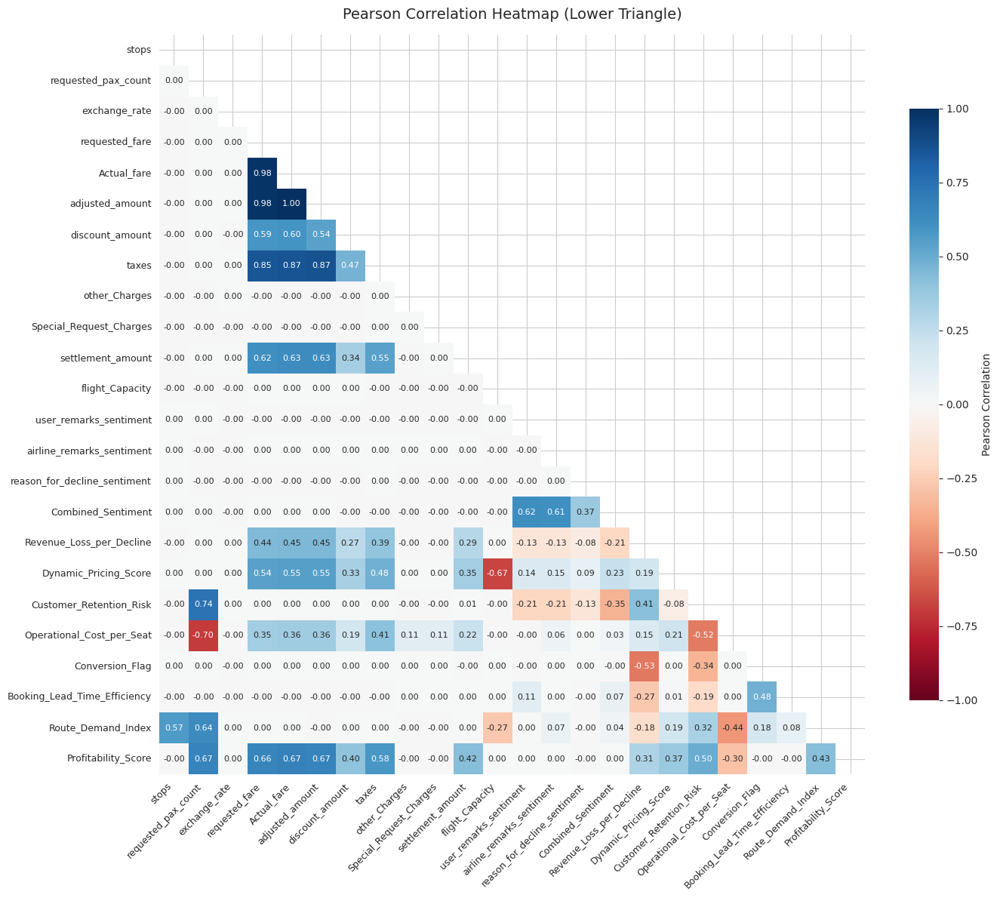

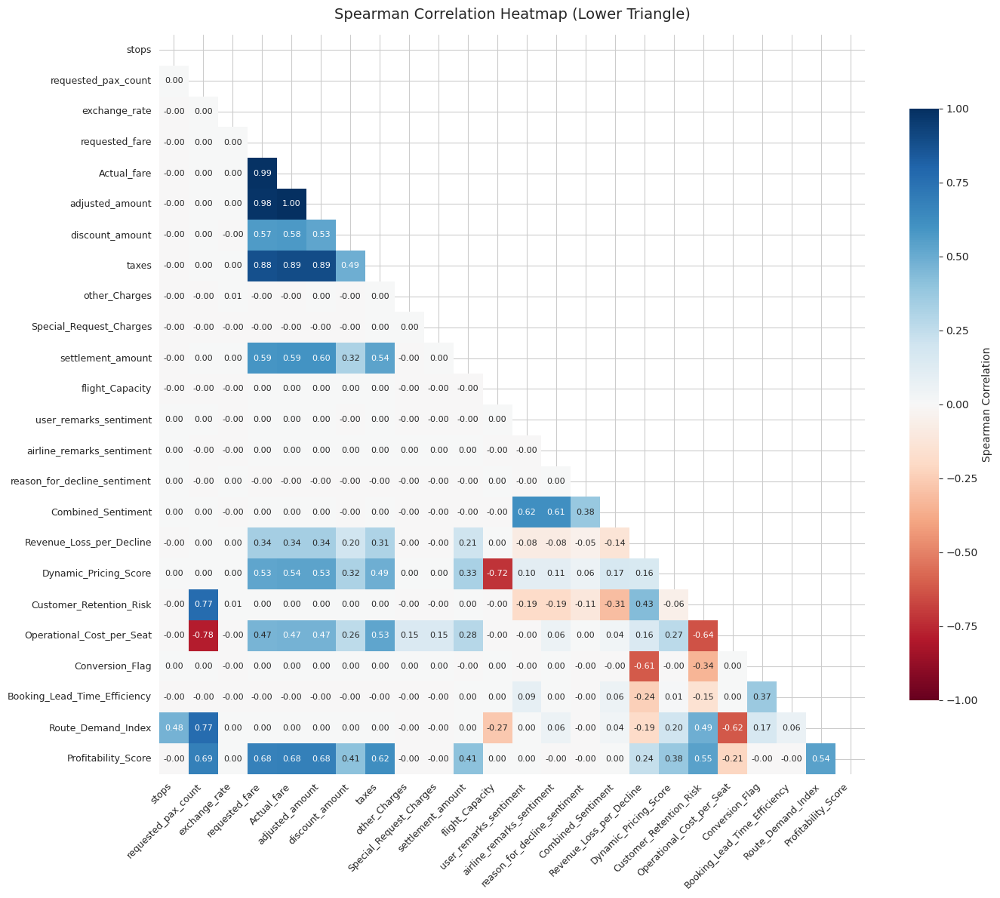

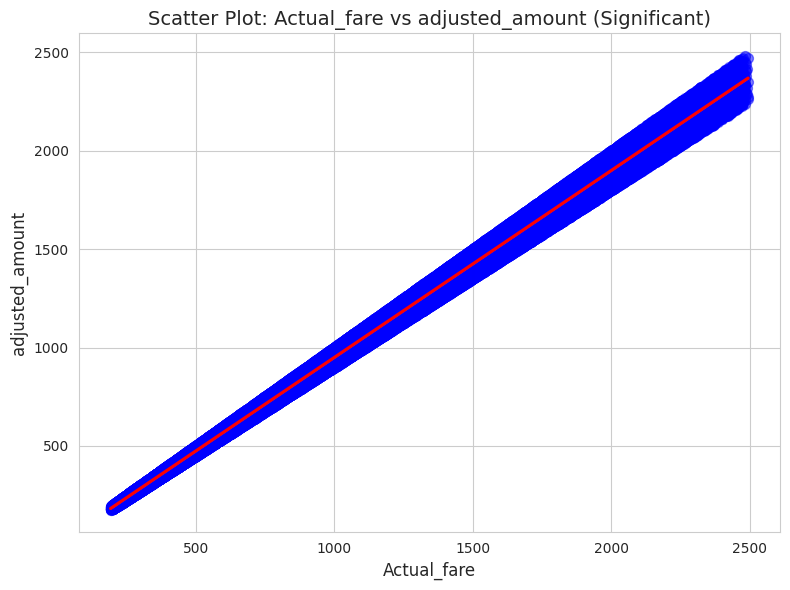

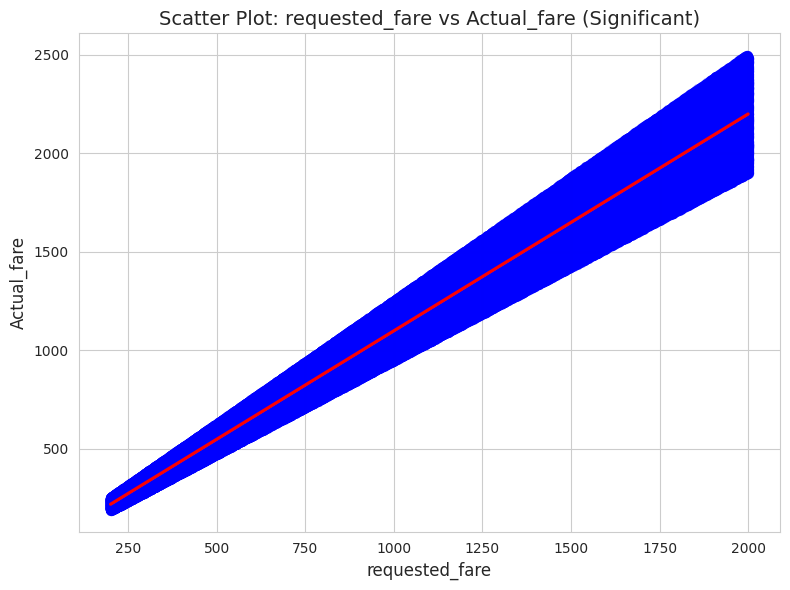

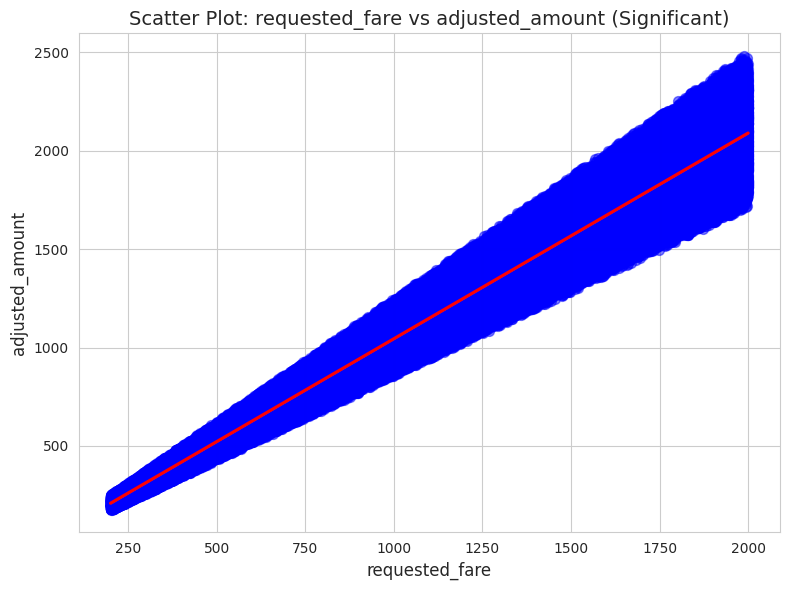

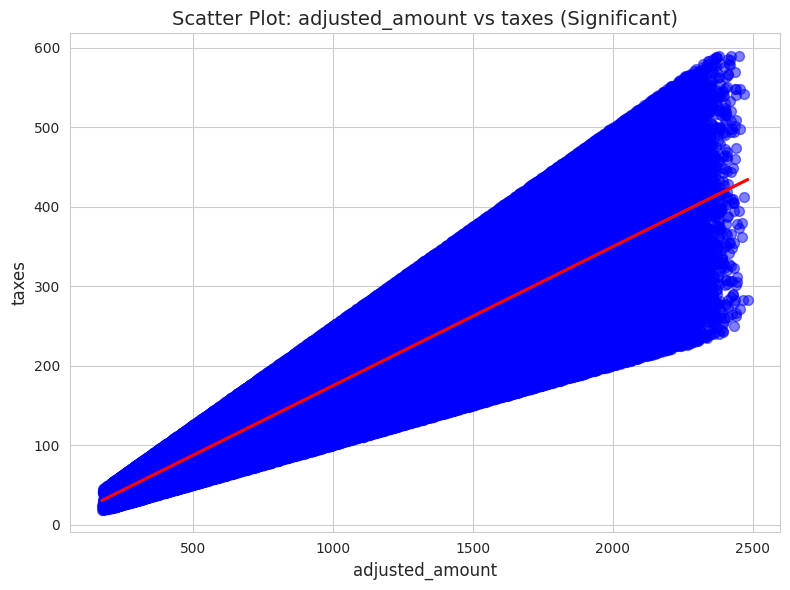

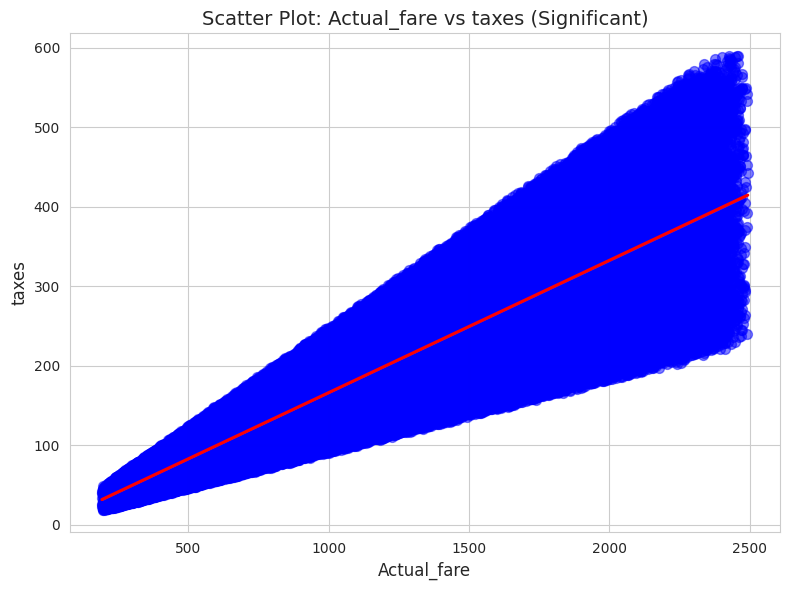

In [ ]:
# Plot visualizations
plot_numerical_correlations(metrics, top_5_pairs)

# key relationships:

- Almost perfect collinearity among core fare metrics  
  • Actual_fare↔adjusted_amount: r≈0.9975  
  • requested_fare↔Actual_fare: r≈0.9834  
  • requested_fare↔adjusted_amount: r≈0.9811  

- Strong ties between fares and taxes  
  • adjusted_amount↔taxes: r≈0.8687  
  • Actual_fare↔taxes: r≈0.8666  
  • requested_fare↔taxes: r≈0.8523  

- Moderate positive links to profitability and settlement  
  • adjusted_amount↔Profitability_Score: r≈0.6710  
  • requested_fare↔Profitability_Score: r≈0.6621  
  • adjusted_amount↔settlement_amount: r≈0.6284  
  • Actual_fare↔settlement_amount: r≈0.6266  

- Discounts and dynamic pricing show mid-range associations  
  • discount_amount↔Actual_fare: r≈0.5989; ↔requested_fare: r≈0.5887  
  • adjusted_amount↔Dynamic_Pricing_Score: r≈0.5519; requested_fare↔Dynamic_Pricing_Score: r≈0.5440  

- Notable negative correlations  
  • Revenue_Loss_per_Decline↔Conversion_Flag: r≈–0.5297  
  • Customer_Retention_Risk↔Operational_Cost_per_Seat: r≈–0.5222  

- Retention risk boosts profitability slightly  
  • Customer_Retention_Risk↔Profitability_Score: r≈0.4960  

All relationships are statistically significant (p-values ≈0), so multicollinearity among fare variables is extreme and several engineered features show strong, predictable links.

## store result in  pickel file

In [ ]:
import pickle
import os

# Combine into one dictionary for saving
num_num_eda_package = {
    'description': 'Numerical–Numerical EDA: metrics, top 5 pairs, and detailed significant pair data',
    'metrics': metrics,
    'top_5_pairs': top_5_pairs,
    'significant_pairs_data': significant_pairs_data
}

# Define path and filename
save_path = '/content/drive/MyDrive/infinitysoft/'
filename = 'num_num_EDA.pkl'
full_path = os.path.join(save_path, filename)

# Save as pickle
with open(full_path, 'wb') as f:
    pickle.dump(num_num_eda_package, f)

print(f"✅ Saved num_num_EDA with metrics, top_5_pairs, and significant_pairs_data to: {full_path}")


✅ Saved num_num_EDA with metrics, top_5_pairs, and significant_pairs_data to: /content/drive/MyDrive/infinitysoft/num_num_EDA.pkl


# BIVARIATE ANALYSIS: NUMERICAL vs CATEGORICAL VARIABLES (used parallel computing)


In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import normaltest, fligner, f_oneway, kruskal, ttest_ind, mannwhitneyu
from multiprocessing import Pool, cpu_count, Value
import itertools
import sys

# Assuming df_imputed is already loaded
# Define numeric and categorical columns
numeric_cols = df_imputed.select_dtypes(include=['float32', 'float64', 'int64']).columns
categorical_cols = df_imputed.select_dtypes(include=['object', 'category', 'bool']).columns

# Set up the plotting style
sns.set_style("whitegrid")
plt.rcParams['font.size'] = 10

# Shared counter for progress tracking
counter = Value('i', 0)
total_pairs = len(numeric_cols) * len(categorical_cols)

# List to store skipped pairs
skipped_pairs = []


# Convert invalid pairs to a set of frozensets for order-agnostic comparison
invalid_pairs_set = {frozenset(pair) for pair in invalid_pairs}

# Callback function to update progress
def update_progress(_):
    with counter.get_lock():
        counter.value += 1
        percentage = (counter.value / total_pairs) * 100
        print(f"\rProcessed {counter.value}/{total_pairs} pairs ({percentage:.2f}%)", end='', flush=True)
        sys.stdout.flush()

# Function to transform categorical column to top 10 categories + 'Other'
def transform_categorical(data, cat_col):
    # Convert to string to handle categorical/bool consistently
    data_col = data[cat_col].astype(str)
    # Get top 10 most frequent categories
    top_10 = data_col.value_counts().head(10).index.tolist()
    # Replace non-top-10 categories with 'Other'
    transformed = data_col.where(data_col.isin(top_10), 'Other')
    return transformed

# Worker function for parallel processing of a single numeric-categorical pair
def process_pair(pair):
    num_col, cat_col = pair
    # Check if pair is invalid (order-agnostic)
    if frozenset([num_col, cat_col]) in invalid_pairs_set:
        with counter.get_lock():
            skipped_pairs.append((num_col, cat_col, "Invalid pair"))
        return None

    # Transform categorical column to top 10 + 'Other'
    transformed_col = transform_categorical(df_imputed, cat_col)
    temp_df = df_imputed.copy()
    temp_df[cat_col] = transformed_col

    # Check if there are at least two non-empty groups
    categories = temp_df[cat_col].unique()
    num_categories = len(categories)
    if num_categories < 2:
        with counter.get_lock():
            skipped_pairs.append((num_col, cat_col, "Fewer than 2 categories"))
        return None

    groups = [temp_df[num_col][temp_df[cat_col] == cat] for cat in categories]
    # Ensure groups have enough data
    valid_groups = [g for g in groups if len(g) > 1]
    if len(valid_groups) < 2:
        with counter.get_lock():
            skipped_pairs.append((num_col, cat_col, "Fewer than 2 non-empty groups"))
        return None

    # Group summaries
    group_stats = temp_df.groupby(cat_col)[num_col].agg(['mean', 'median', 'std']).round(2)

    # Check assumptions
    # Normality (D'Agostino test, sample up to 5000 due to large data)
    try:
        normality = all(normaltest(temp_df[num_col][temp_df[cat_col] == cat].sample(
            min(5000, len(temp_df[temp_df[cat_col] == cat])), random_state=42))[1] > 0.05
            for cat in categories if len(temp_df[temp_df[cat_col] == cat]) > 1)
    except ValueError:
        with counter.get_lock():
            skipped_pairs.append((num_col, cat_col, "Insufficient data for D'Agostino test"))
        return None

    # Equal variances (Fligner-Killeen test)
    try:
        equal_var = fligner(*valid_groups)[1] > 0.05
    except ValueError:
        with counter.get_lock():
            skipped_pairs.append((num_col, cat_col, "Insufficient data for Fligner-Killeen test"))
        return None

    # Perform appropriate test
    if num_categories > 2:
        if normality and equal_var:
            stat, p_value = f_oneway(*valid_groups)
            test_name = "ANOVA"
        else:
            stat, p_value = kruskal(*valid_groups)
            test_name = "Kruskal-Wallis"
    else:
        if normality and equal_var:
            stat, p_value = ttest_ind(valid_groups[0], valid_groups[1], equal_var=True)
            test_name = "t-test"
        else:
            stat, p_value = mannwhitneyu(valid_groups[0], valid_groups[1])
            test_name = "Mann-Whitney U"

    # Return results only if significant
    if p_value < 0.05:
        return {
            'pair': (num_col, cat_col),
            'group_stats': group_stats,
            'test_name': test_name,
            'stat': stat,
            'p_value': p_value,
            'significant': "Significant"
        }
    return None

# Function to calculate metrics and print only significant results
def calculate_numerical_categorical_metrics():
    metrics_dict = {}
    significant_pairs = []
    global skipped_pairs
    skipped_pairs = []  # Reset skipped pairs
    print("=" * 100)
    print("BIVARIATE ANALYSIS: NUMERICAL vs CATEGORICAL VARIABLES (SIGNIFICANT ONLY, TOP 10 CATEGORIES + OTHER)")
    print("=" * 100)

    # Reset counter
    with counter.get_lock():
        counter.value = 0

    # Create list of all pairs
    pairs = list(itertools.product(numeric_cols, categorical_cols))

    # Parallel processing with progress tracking
    with Pool(processes=cpu_count()) as pool:
        results = [pool.apply_async(process_pair, args=(pair,), callback=update_progress) for pair in pairs]
        results = [r.get() for r in results]

    print("\r" + " " * 80 + "\r", end='')  # Clear progress line
    print(f"Processed {total_pairs}/{total_pairs} pairs (100.00%)")

    # Print skipped pairs
    if skipped_pairs:
        print(f"\nSkipped {len(skipped_pairs)} pairs due to insufficient data or invalid pairs:")
        print(f"{'Numeric':<30} {'Categorical':<30} {'Reason':<40}")
        print(f"{'-' * 100}")
        for num_col, cat_col, reason in skipped_pairs:
            print(f"{num_col:<30} {cat_col:<30} {reason:<40}")

    # Filter significant results
    for result in results:
        if result is not None:
            num_col, cat_col = result['pair']
            significant_pairs.append((num_col, cat_col))
            metrics_dict[(num_col, cat_col)] = {
                'group_stats': result['group_stats'],
                'test_name': result['test_name'],
                'stat': result['stat'],
                'p_value': result['p_value'],
                'significant': result['significant']
            }

            # Print results
            print(f"\n{'-' * 50}")
            print(f"Comparison: {num_col} vs {cat_col.upper()} (Top 10 Categories + Other)")
            print(f"{'-' * 50}")
            print(f"\nGroup Summaries:")
            print(f"{'Category':<30} {'Mean':<15} {'Median':<15} {'Std Dev':<15}")
            print(f"{'-' * 75}")
            for cat, row in result['group_stats'].iterrows():
                print(f"{str(cat):<30} {row['mean']:<15.2f} {row['median']:<15.2f} {row['std']:<15.2f}")
            print(f"\nStatistical Test: {result['test_name']}")
            print(f"Statistic: {result['stat']:.2f}")
            print(f"P-value: {result['p_value']:.4e}")
            print(f"Result: Significant (p < 0.05 indicates significant differences)")
            print(f"\nContextual Insight: Significant differences in {num_col} across {cat_col} categories (top 10 + Other) suggest {cat_col} influences {num_col}, useful for operational or pricing strategies.")

    if not significant_pairs:
        print("\nNo significant differences (p < 0.05) found for any numerical-categorical pair.")

    print("=" * 100)
    print("END OF ANALYSIS")
    print("=" * 100)

    return metrics_dict, significant_pairs

# Function to plot box plots for significant pairs only
def plot_numerical_categorical_visualizations(metrics_dict, significant_pairs):
    if not significant_pairs:
        print("No box plots generated: No significant differences found.")
        return

    for num_col, cat_col in significant_pairs:
        # Transform categorical column for plotting
        transformed_col = transform_categorical(df_imputed, cat_col)
        temp_df = df_imputed.copy()
        temp_df[cat_col] = transformed_col

        plt.figure(figsize=(10, 6))
        sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')
        plt.title(f'Box Plot: {num_col} vs {cat_col} (Top 10 Categories + Other, Significant)', fontsize=14, pad=15)
        plt.xlabel(cat_col, fontsize=12)
        plt.ylabel(num_col, fontsize=12)
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.tight_layout()
        plt.show()


# Result of BIVARIATE ANALYSIS: NUMERICAL vs CATEGORICAL VARIABLES

In [ ]:
# Calculate and print metrics for significant pairs
metrics, significant_pairs = calculate_numerical_categorical_metrics()

BIVARIATE ANALYSIS: NUMERICAL vs CATEGORICAL VARIABLES (SIGNIFICANT ONLY, TOP 10 CATEGORIES + OTHER)
Processed 576/576 pairs (100.00%)

--------------------------------------------------
Comparison: stops vs TRIP_TYPE (Top 10 Categories + Other)
--------------------------------------------------

Group Summaries:
Category                       Mean            Median          Std Dev        
---------------------------------------------------------------------------
One Way                        0.35            0.00            0.57           
Round Trip                     0.35            0.00            0.58           

Statistical Test: Mann-Whitney U
Statistic: 3232433807.50
P-value: 3.8419e-02
Result: Significant (p < 0.05 indicates significant differences)

Contextual Insight: Significant differences in stops across trip_type categories (top 10 + Other) suggest trip_type influences stops, useful for operational or pricing strategies.

----------------------------------------------

# Summary of Key Bivariate (NUM-CAT) Insights

---

## 1. Customer Segment Profitability  
- High-profitability customers request more seats (75.75 vs. 35.20), pay higher fares (₹1,522 vs. ₹724), and generate larger settlements (₹1,205 vs. ₹561).  
- They incur greater revenue loss when declining (₹896 vs. ₹499), score higher on dynamic pricing (0.38 vs. 0.15), and exhibit elevated retention risk (0.49 vs. 0.27).  
- Implication: Prioritize premium pricing and retention tactics for high-profit segments; streamline costs for low-profit segments.

---

## 2. Request Status & Conversion  
- Ticketed requests convert at 66% vs. 0% for Cancelled/Expired/Pending.  
- Booking lead-time efficiency is higher for Ticketed (0.22) than others (0.13).  
- Implication: Enhance workflows to shift Pending requests to Ticketed and reduce cancellations.

---

## 3. Geographic Variation  
- Passenger demand varies by country (e.g., BI: 55.9 pax; MH: 54.3) and city (Port Saraburgh: 58.1; Lake Alanbury: 50.1).  
- Seat cost differs (FI: ₹8.17; ER: ₹7.73; Lake Alanbury: ₹9.35; Port Saraburgh: ₹7.47).  
- Implication: Tailor pricing to high-demand regions; control operational costs where they’re highest.

---

## 4. Sentiment & Missing Data  
- When user, airline, or decline-reason remarks are missing, corresponding sentiment scores drop to zero.  
- Corporate vs. Leisure segments show slight variation in user-remark sentiment.  
- Implication: Enforce complete data capture to ensure reliable sentiment analytics.

---

# Business Takeaways  
1. Segment pricing and retention by profitability tier.  
2. Optimize booking processes to increase ticketed conversions.  
3. Adjust regional pricing and cost structures.  
4. Improve data collection for accurate sentiment insights.

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


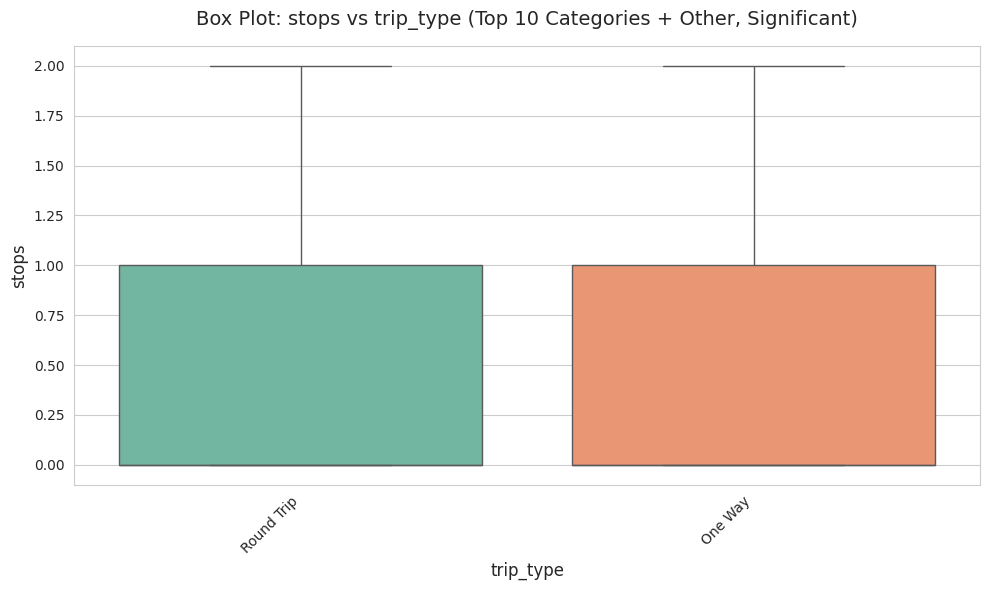

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


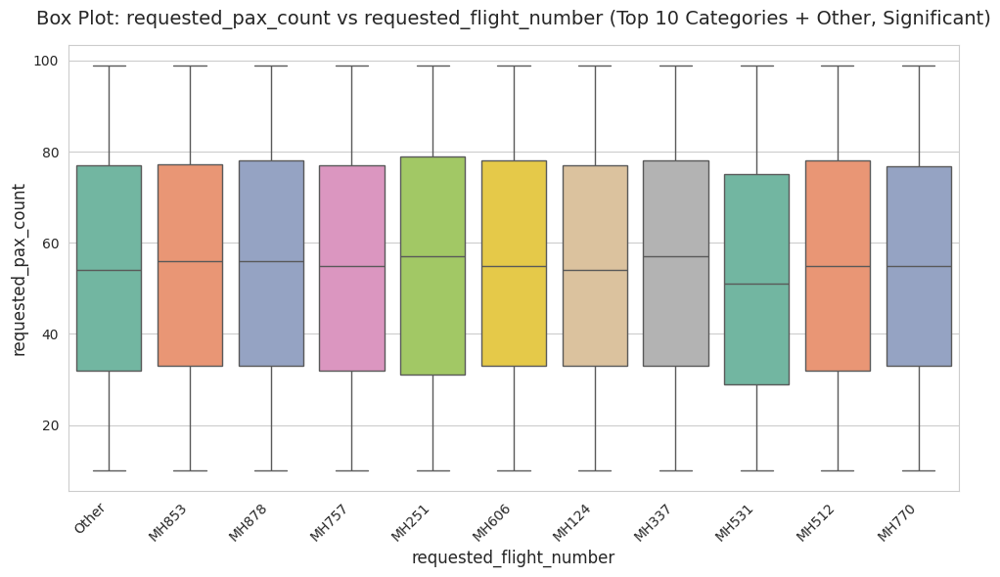

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


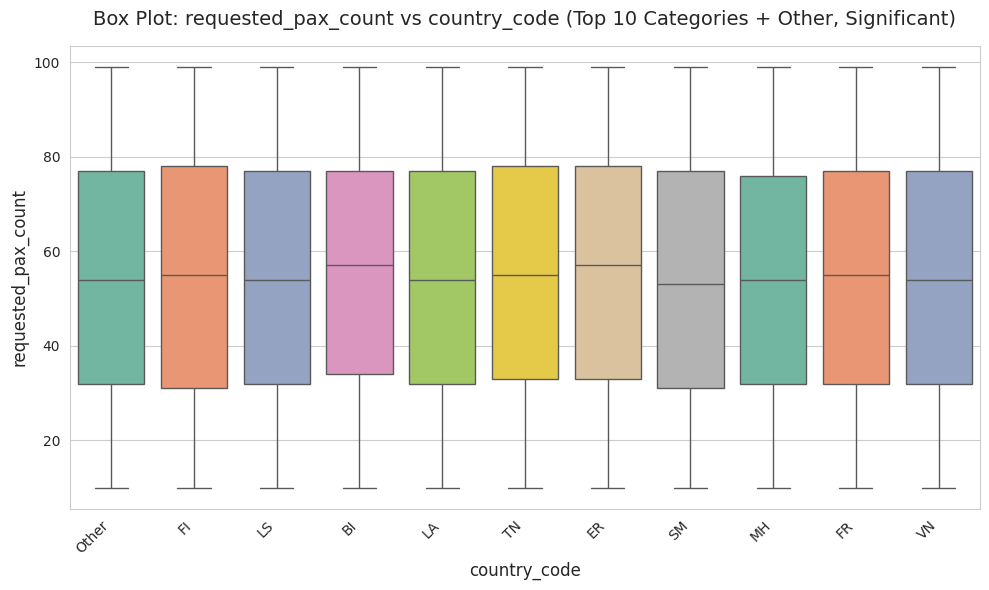

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


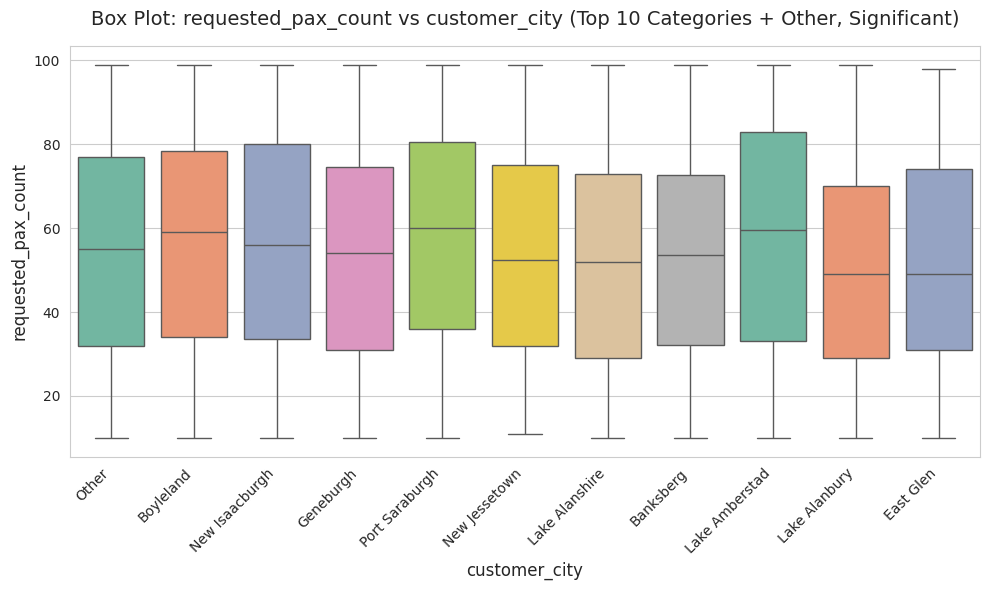

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


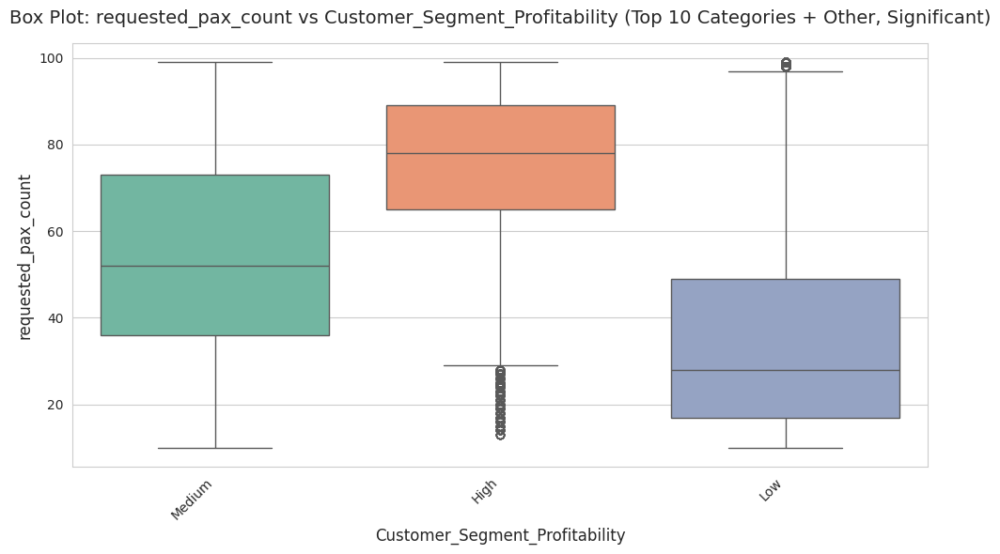

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


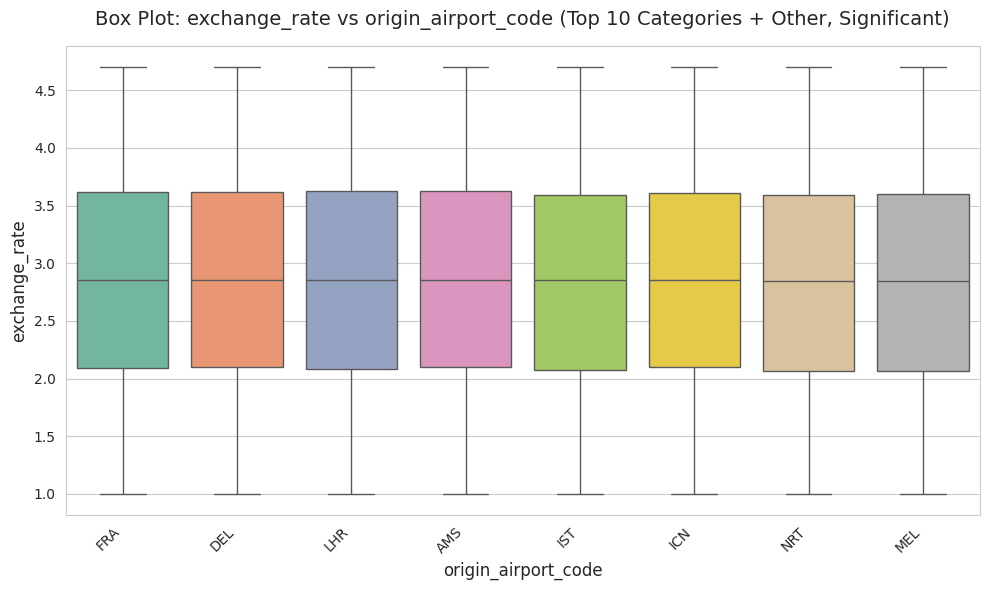

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


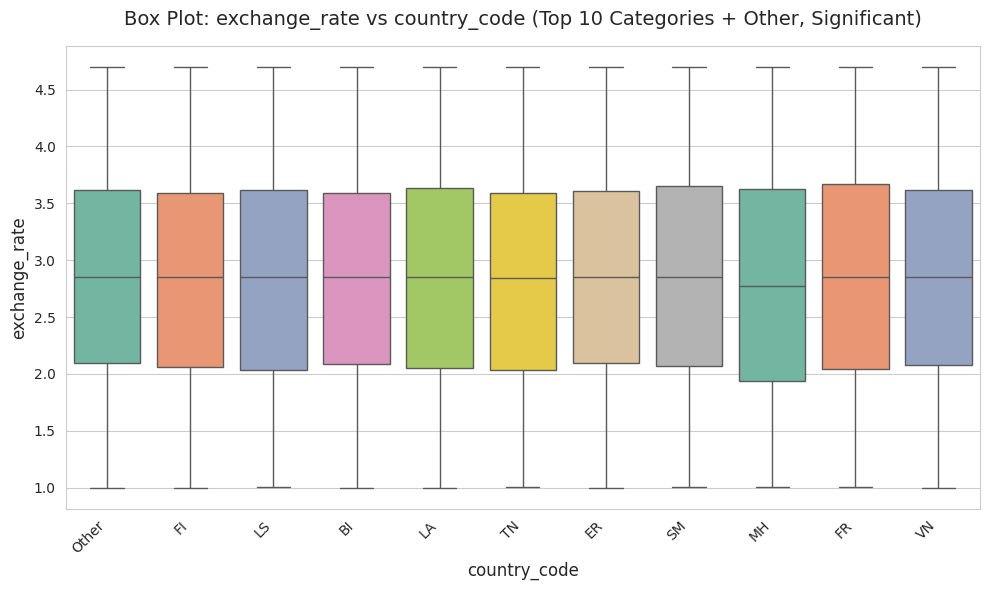

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


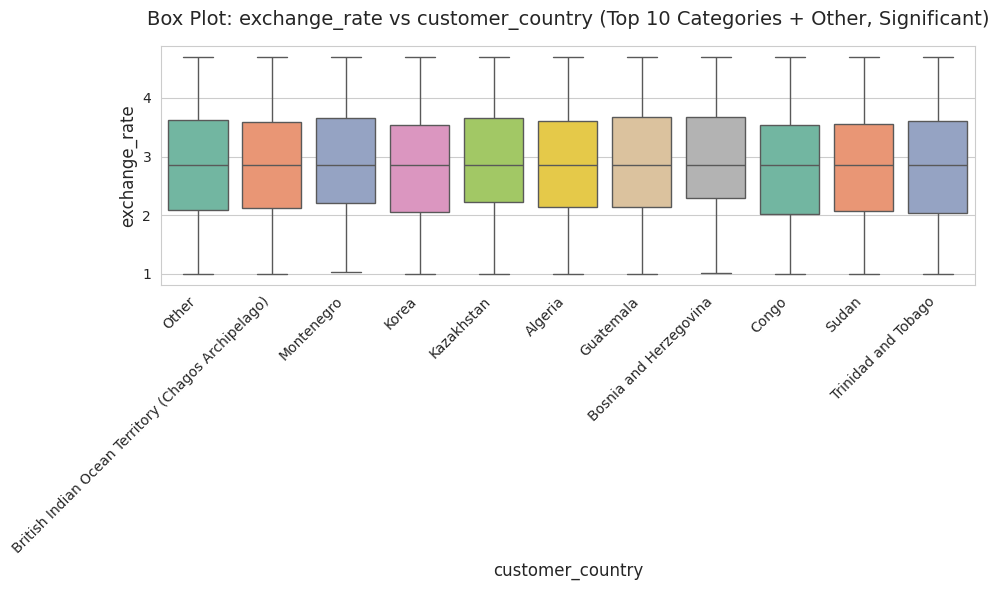

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


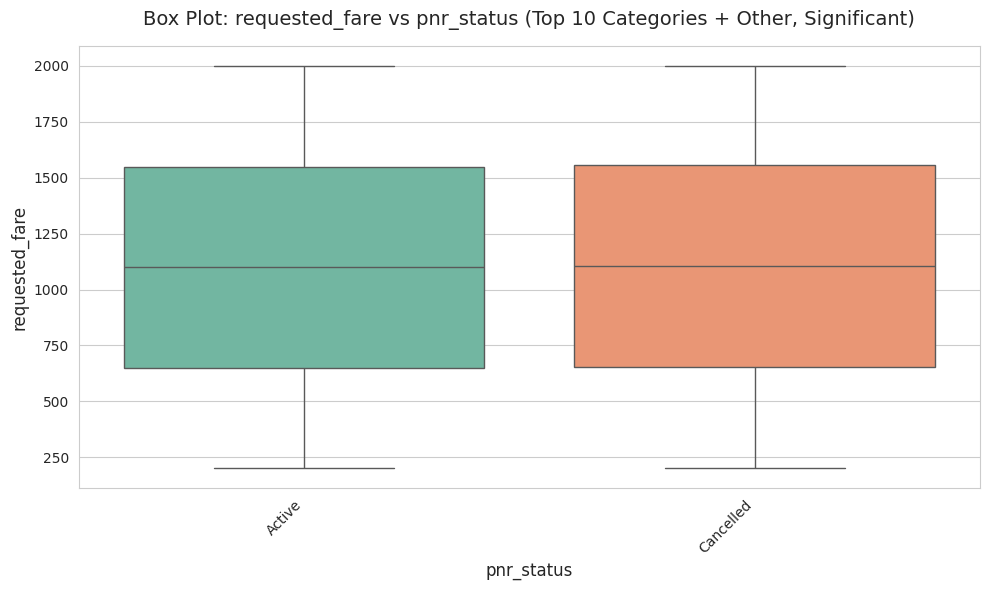

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


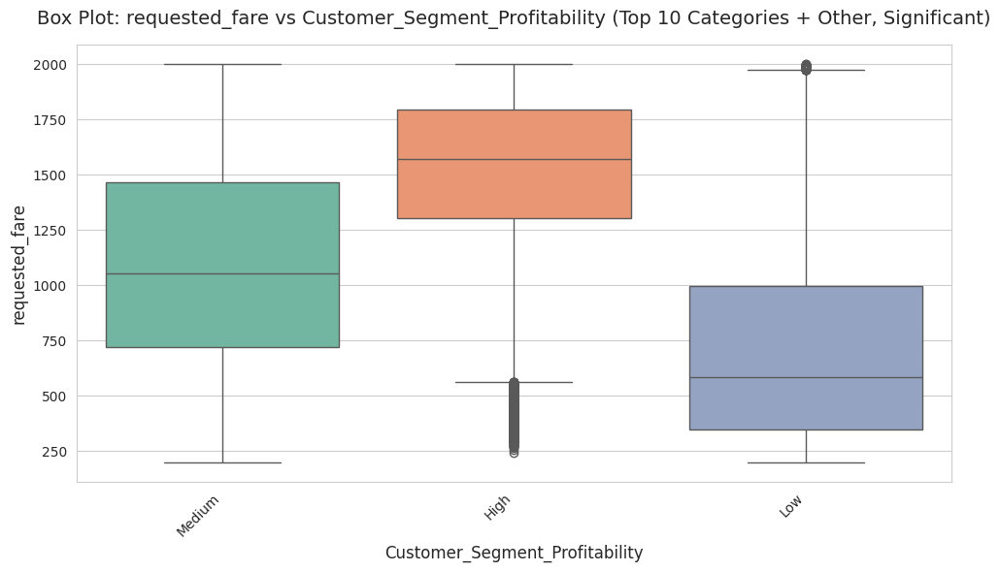

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


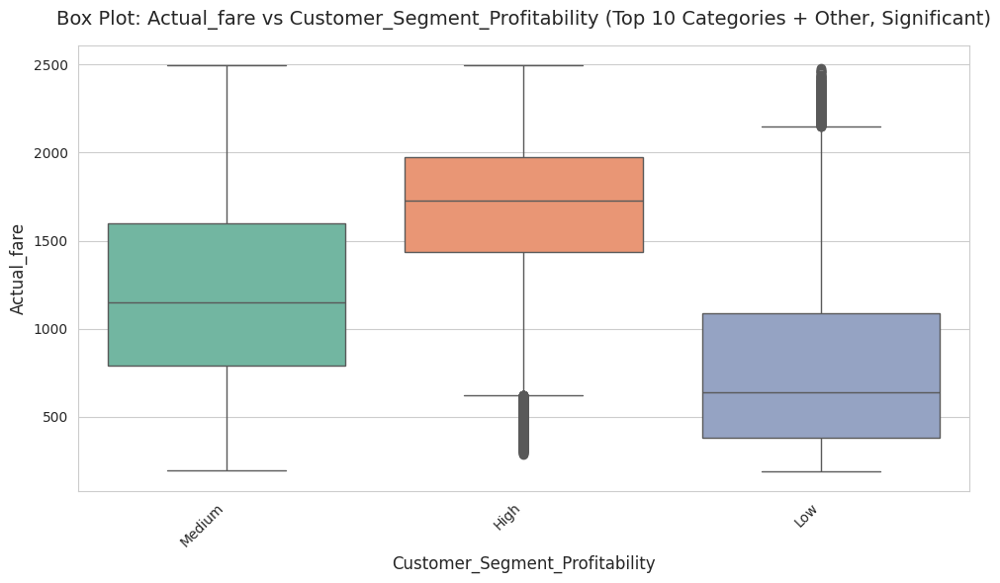

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


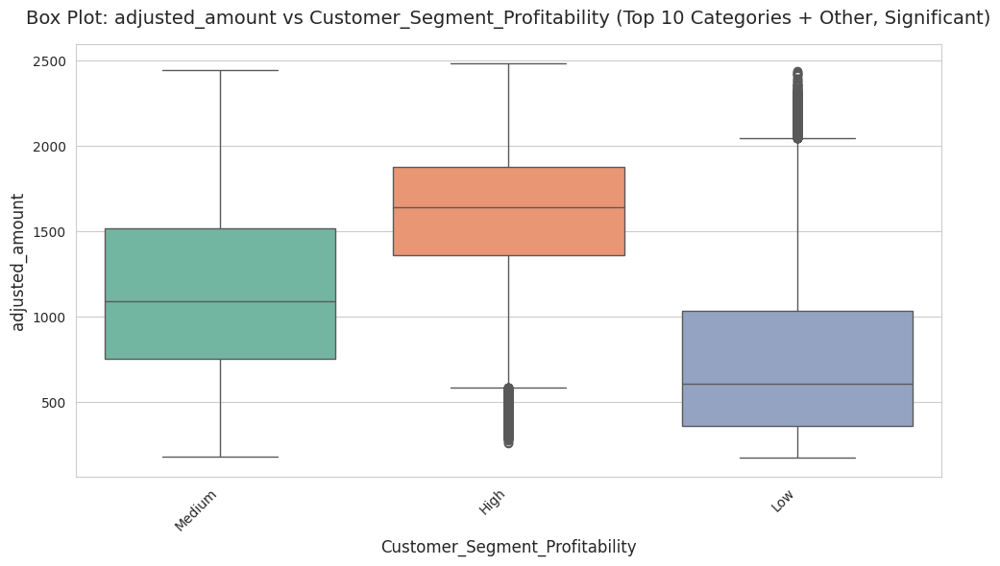

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


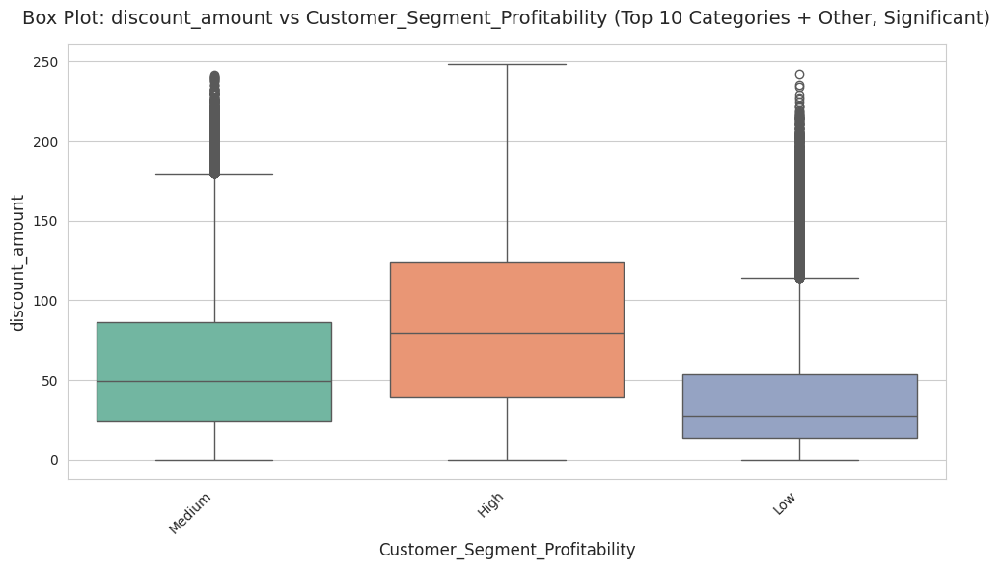

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


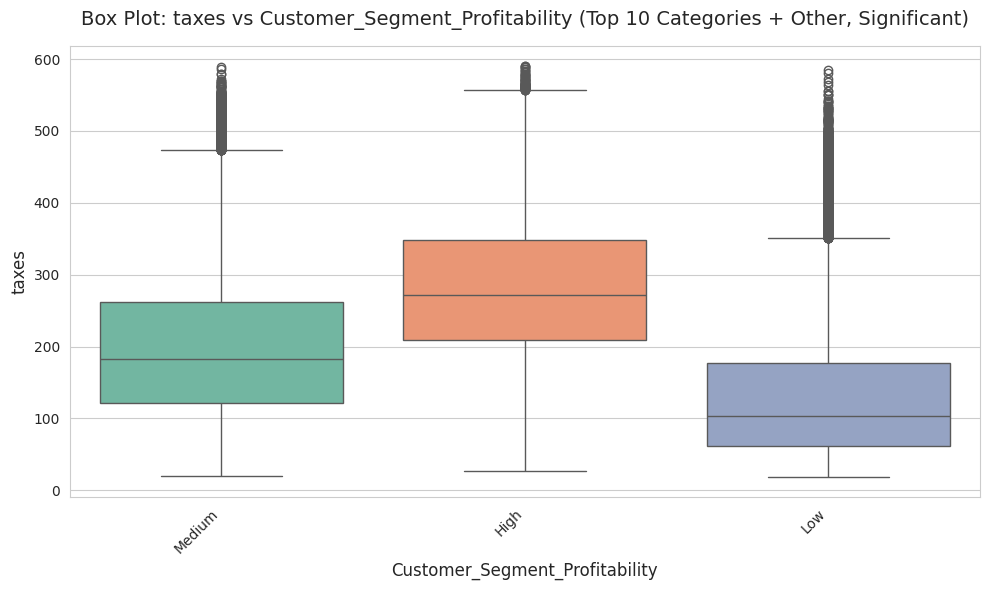

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


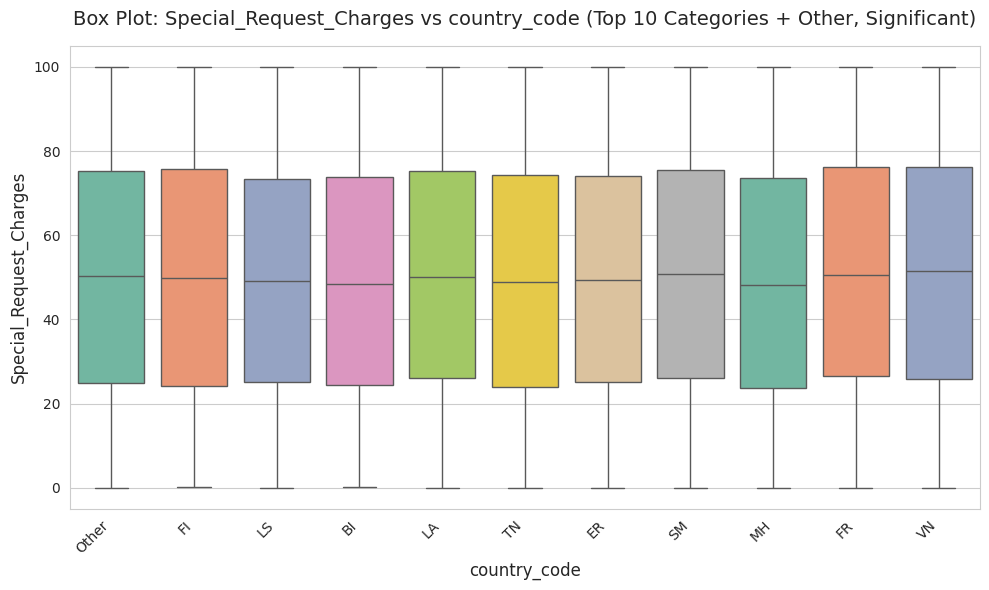

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


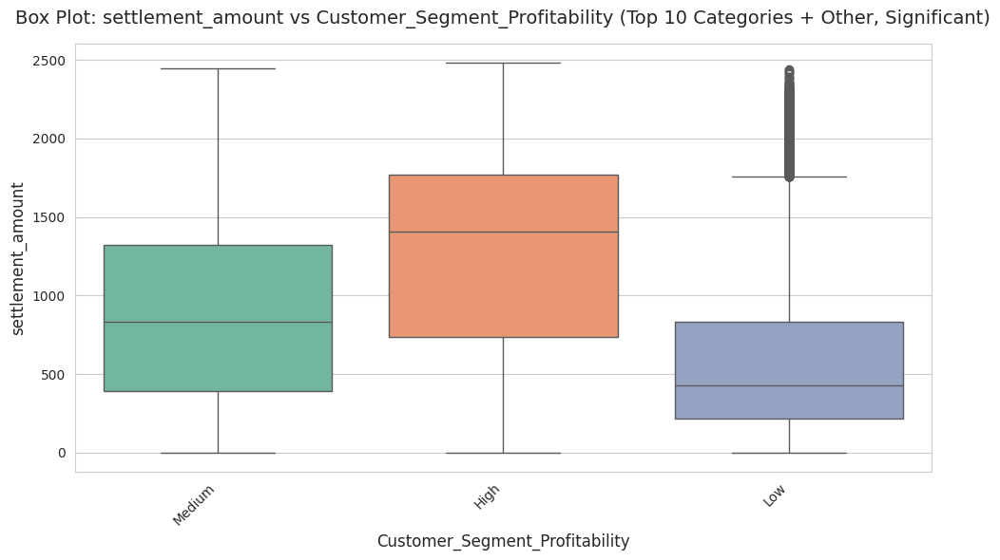

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


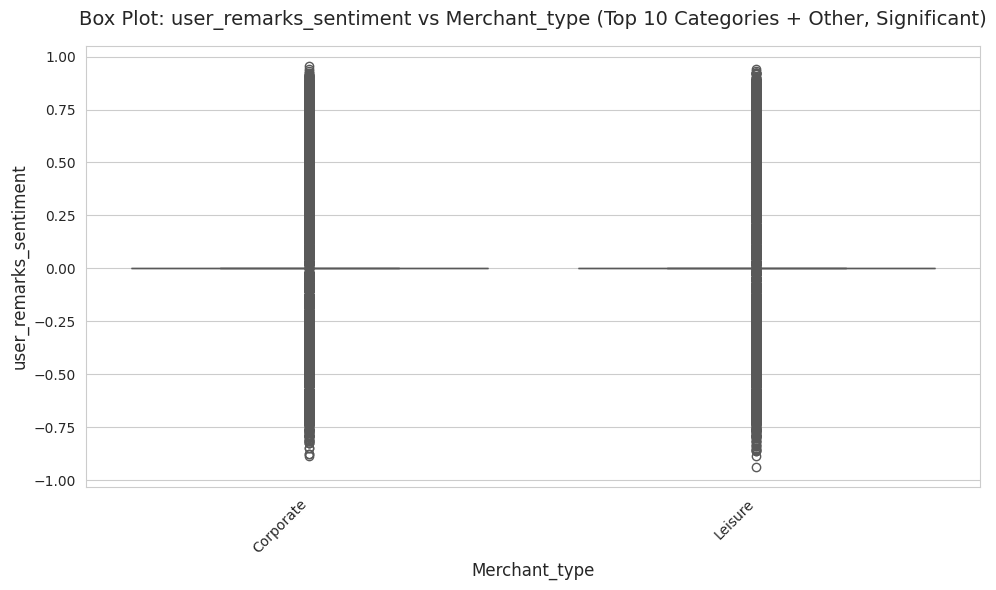

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


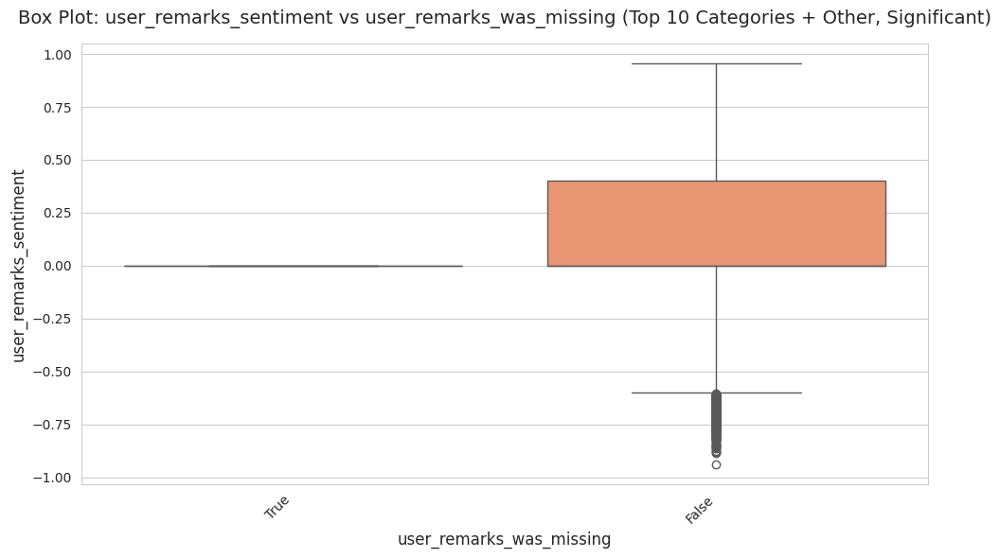

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


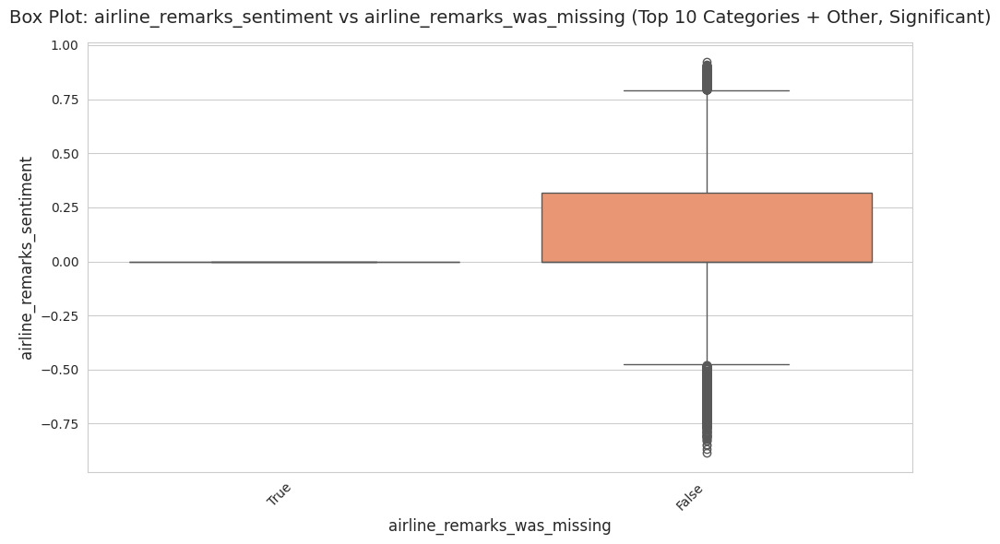

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


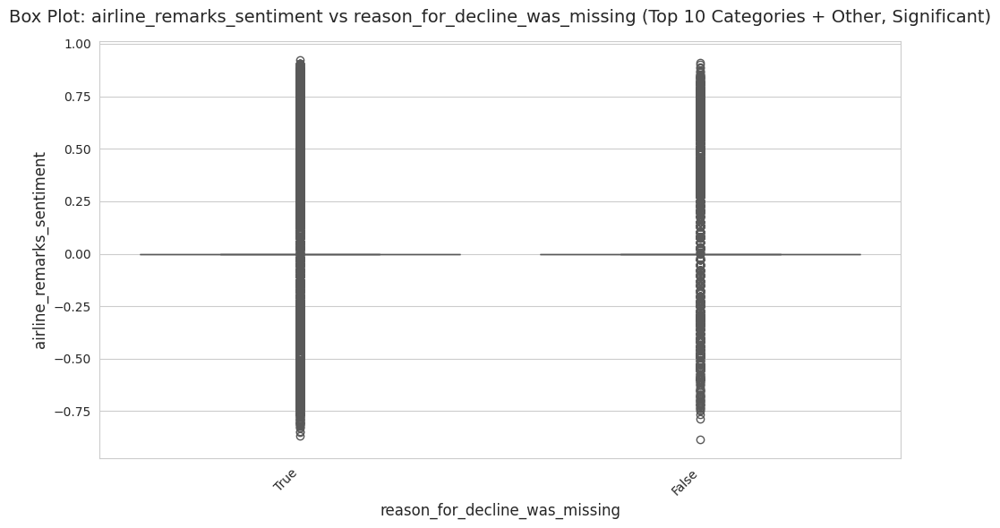

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


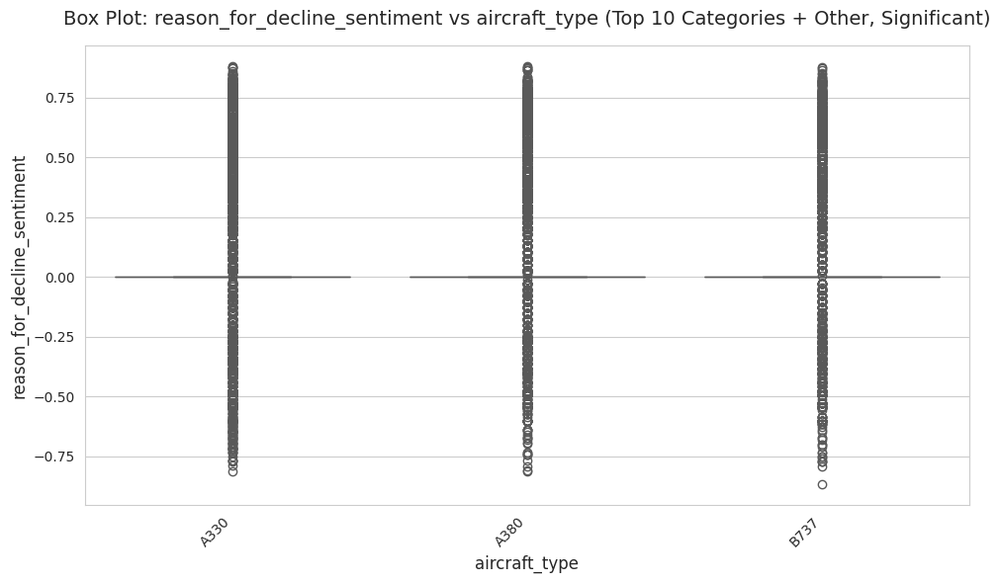

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


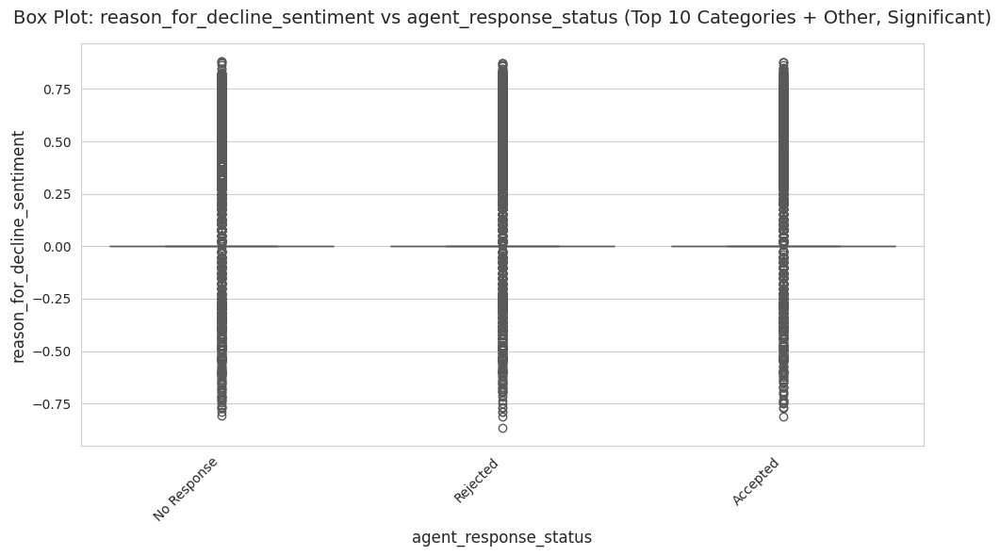

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


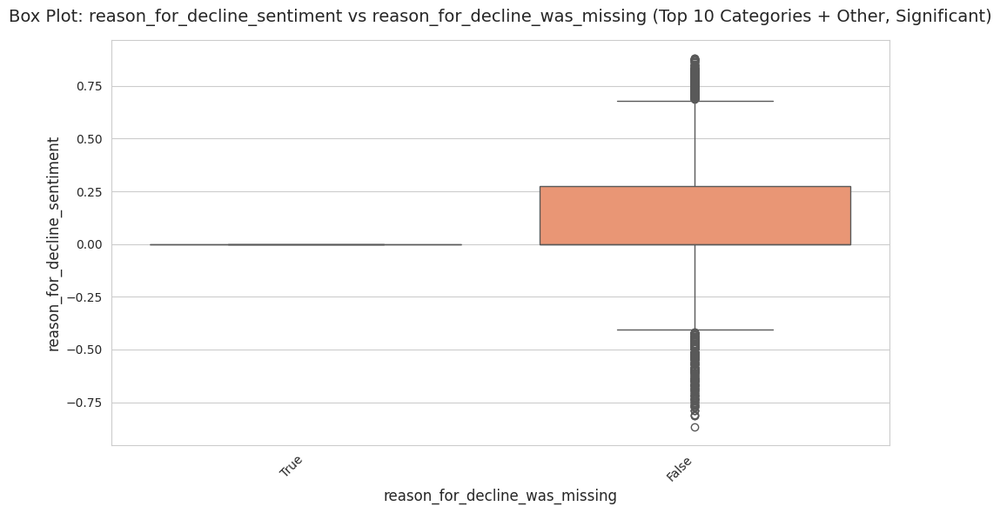

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


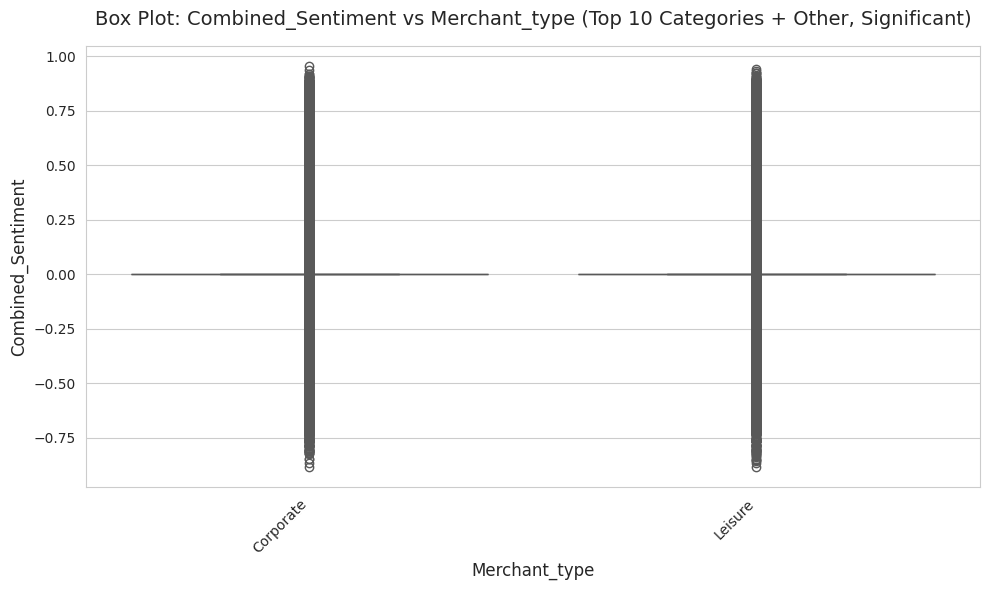

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


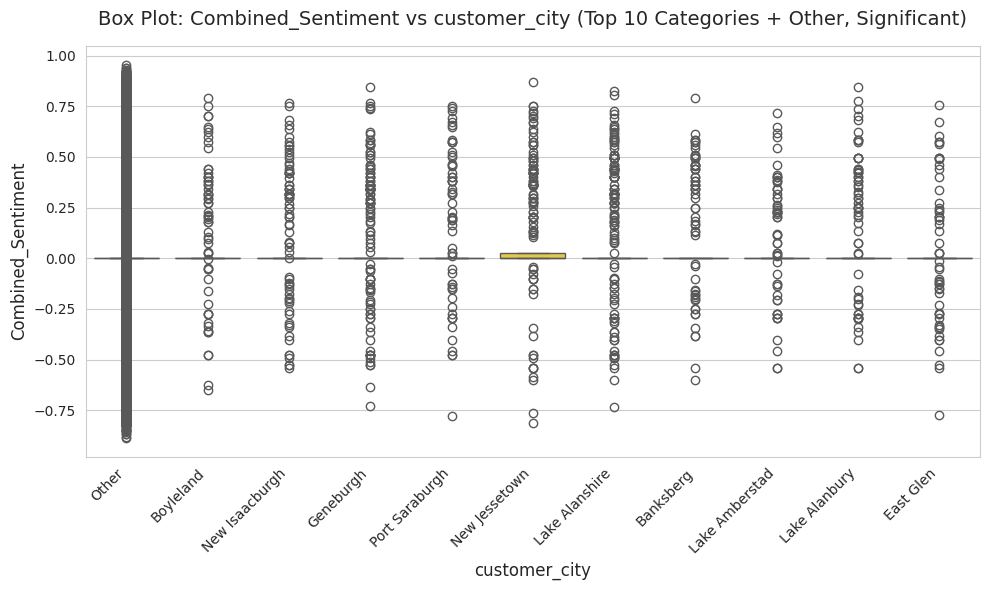

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


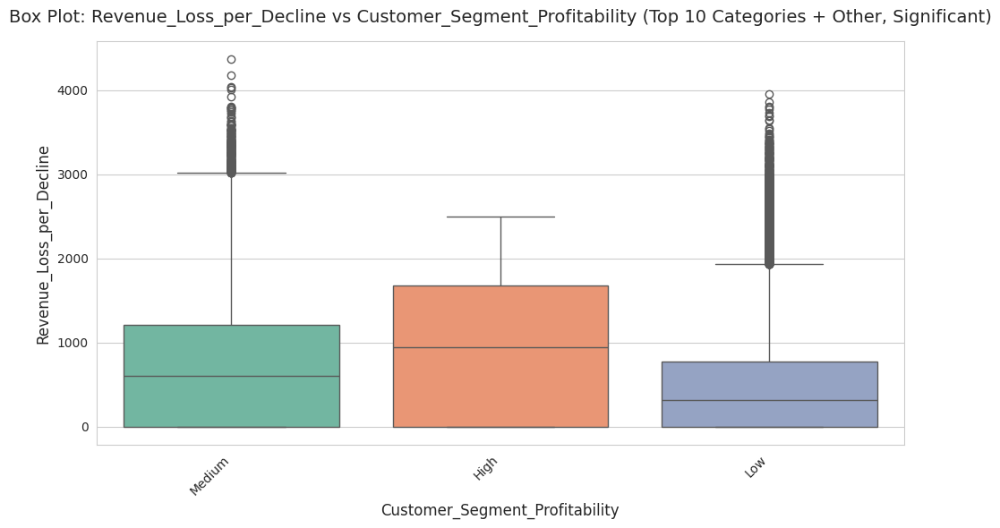

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


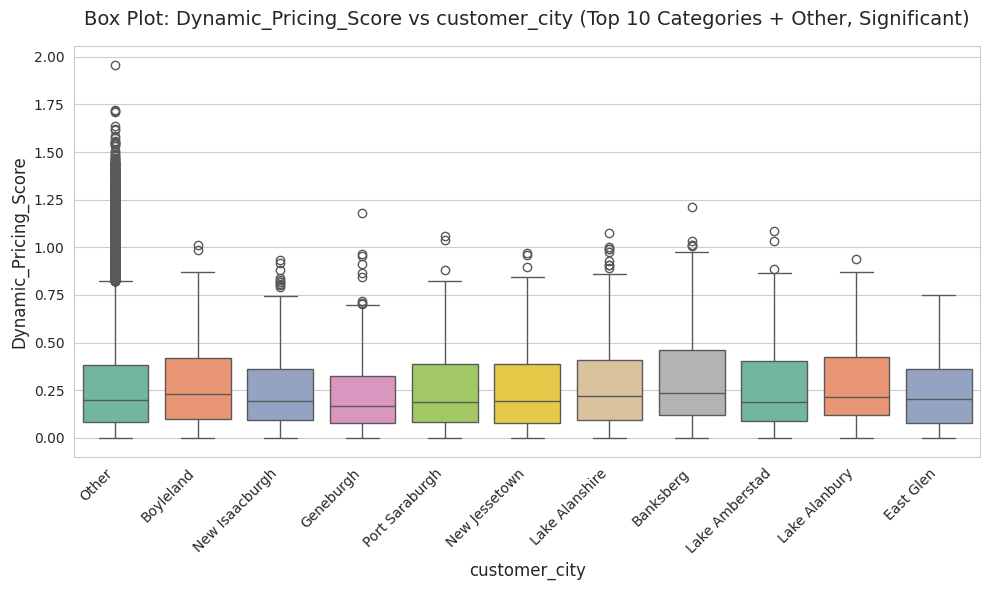

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


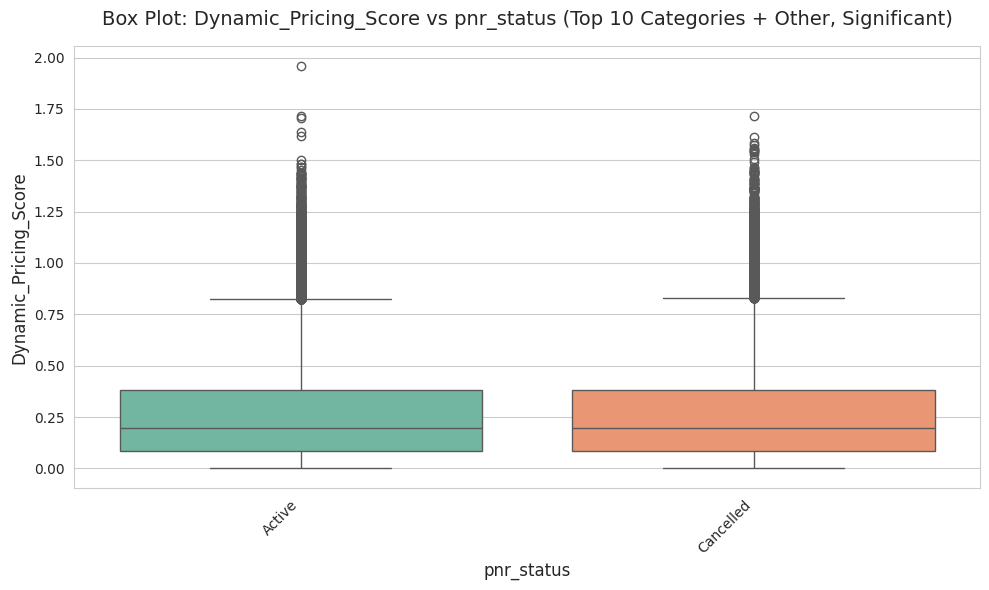

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


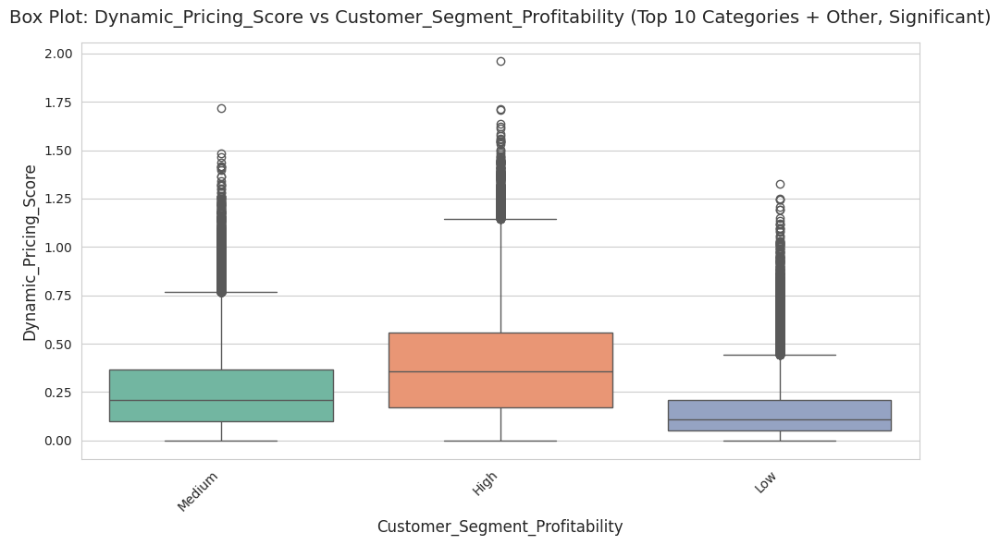

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


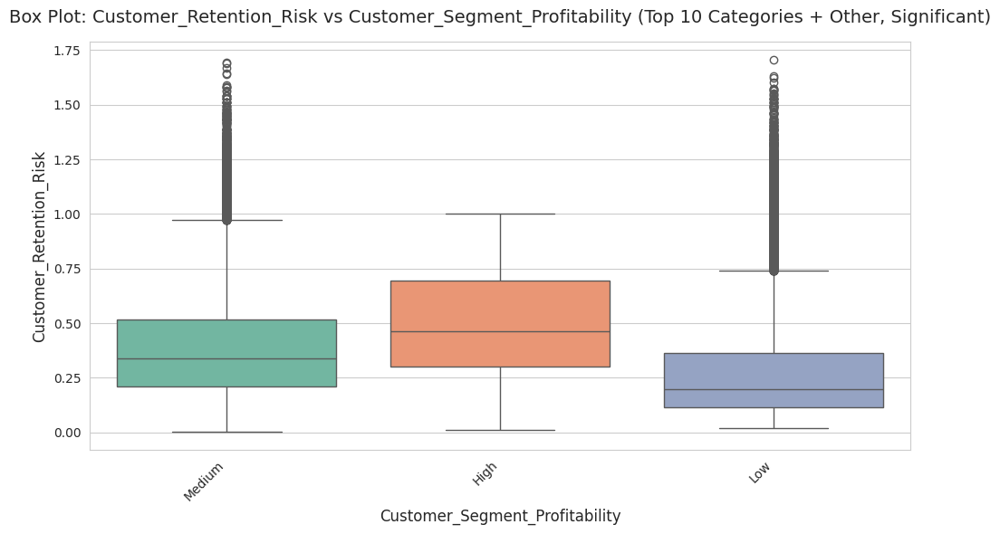

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


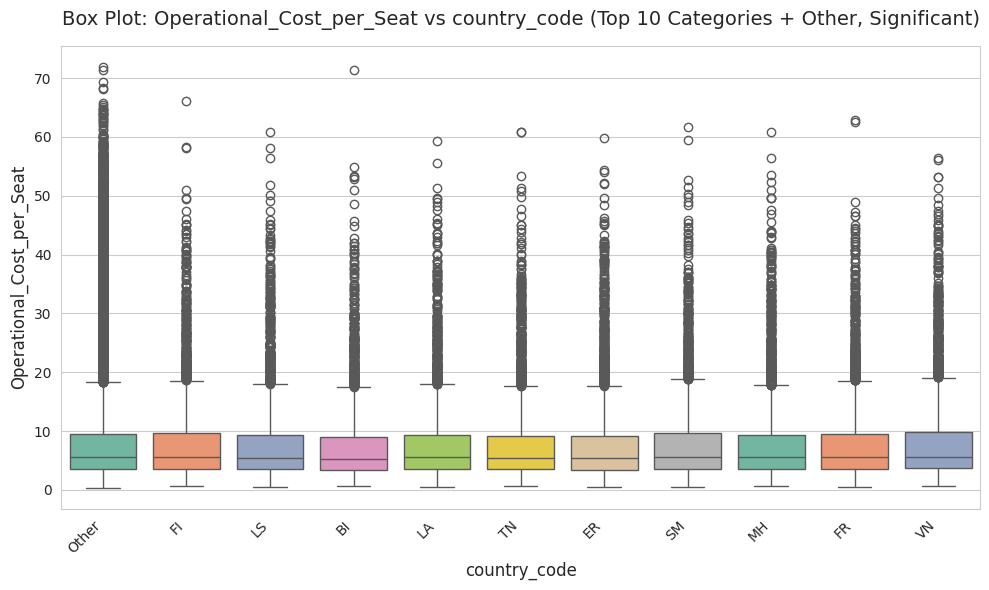

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


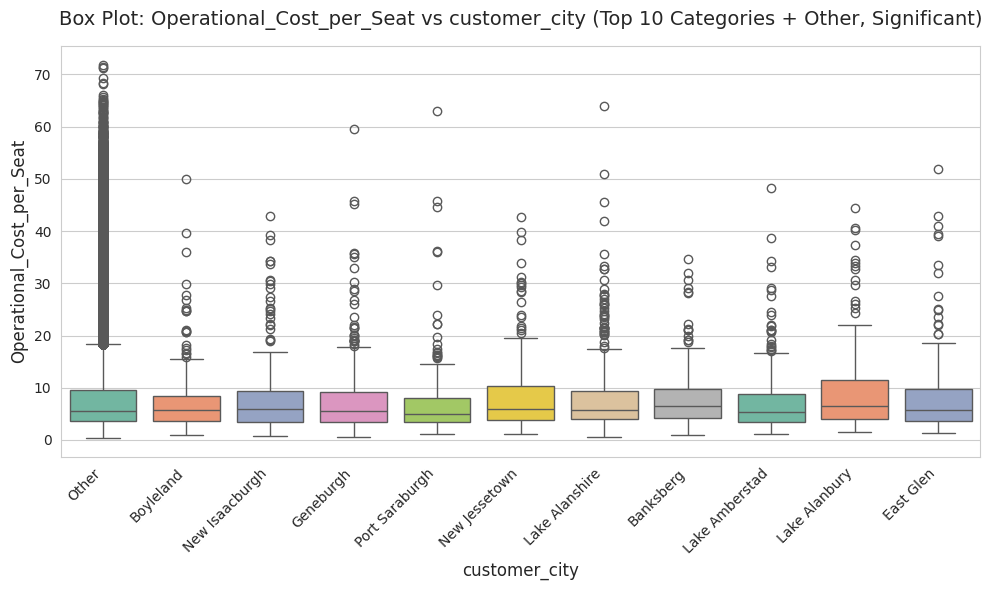

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


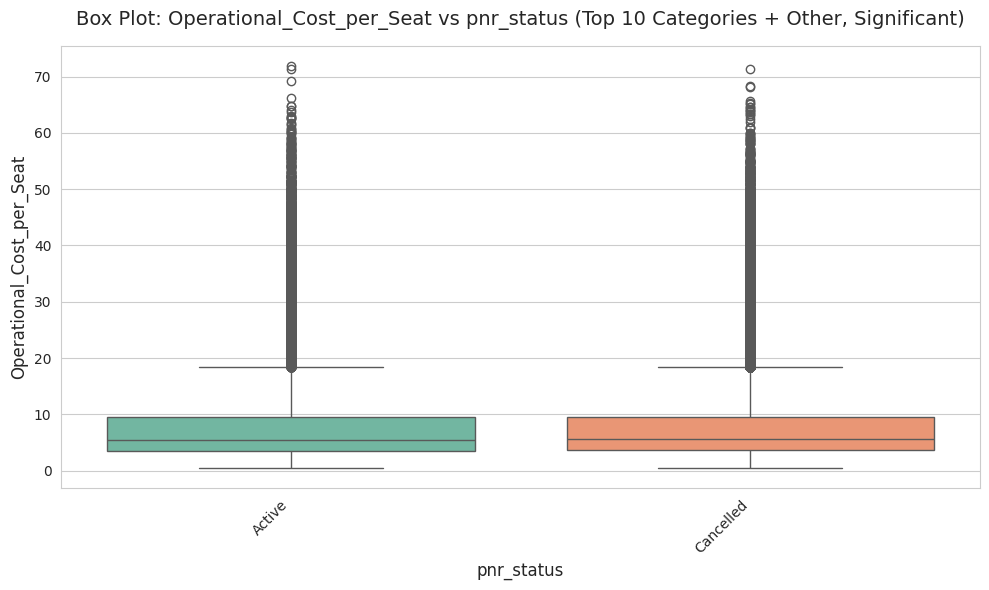

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


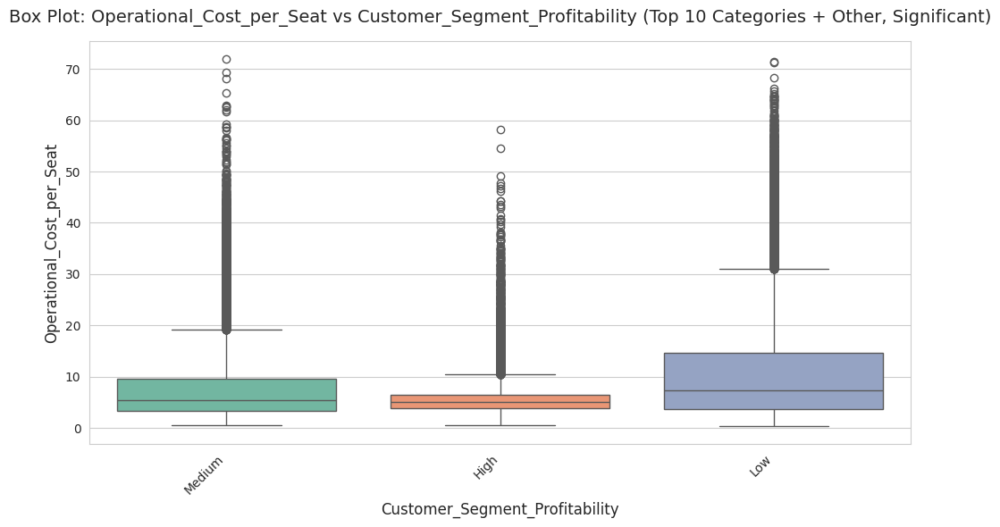

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


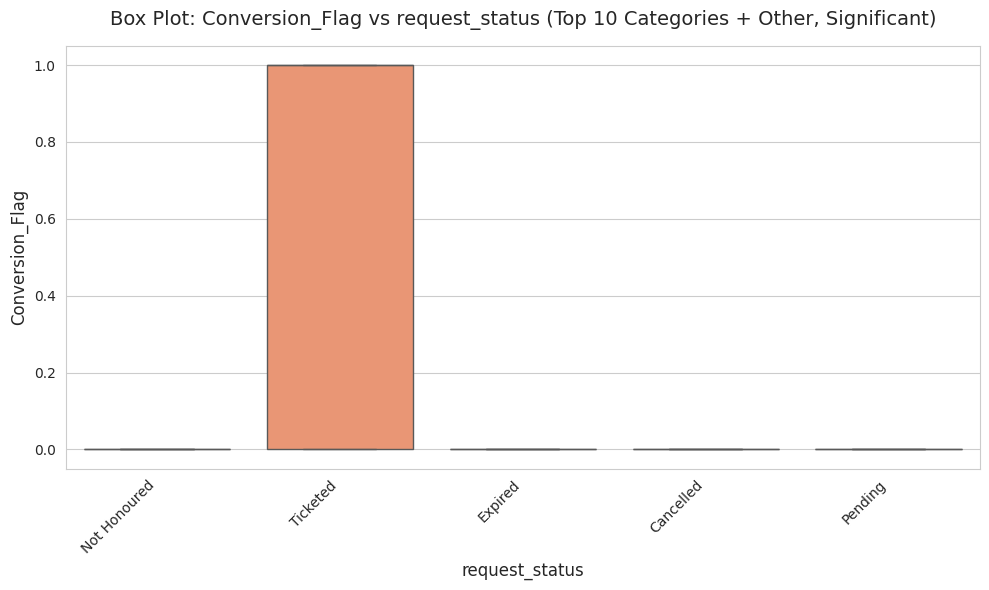

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


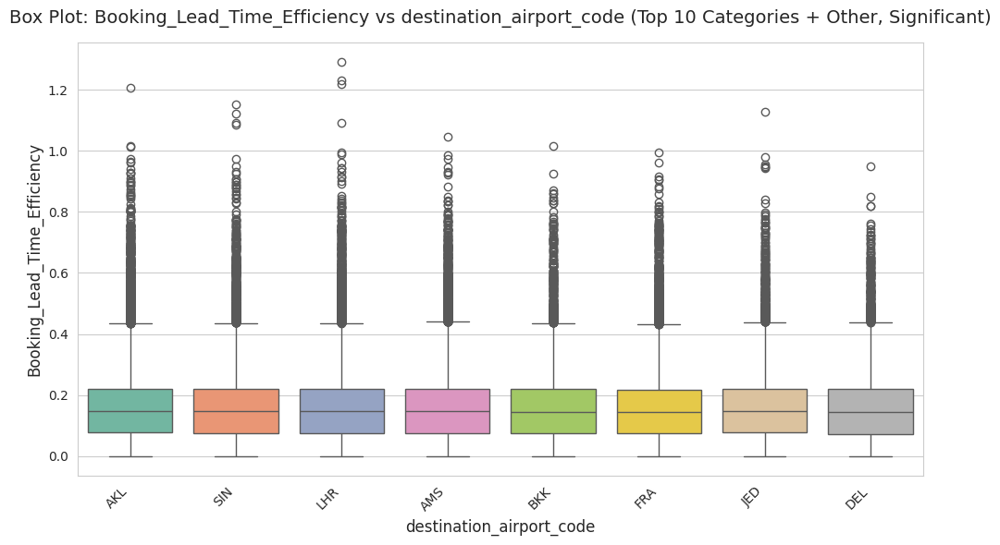

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


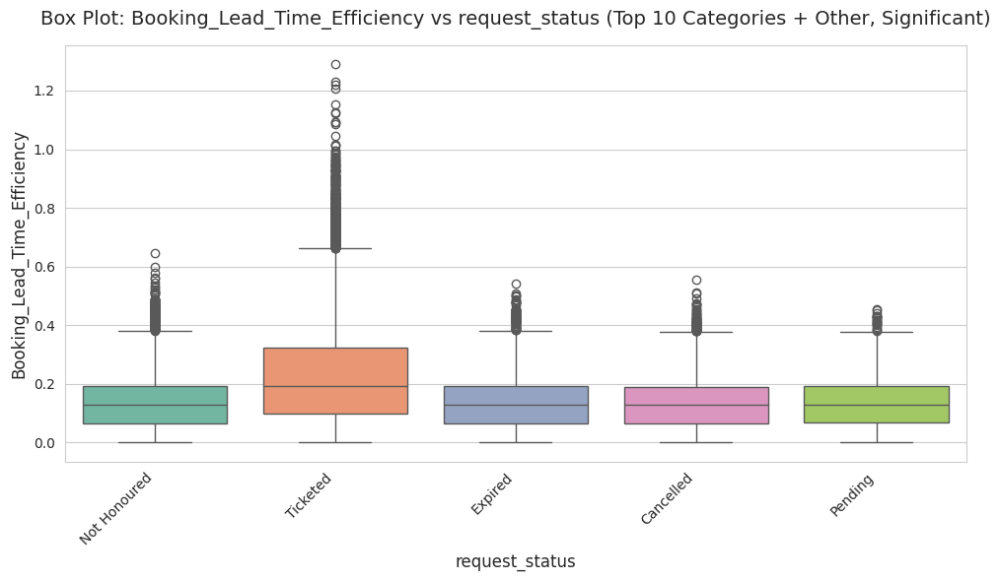

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


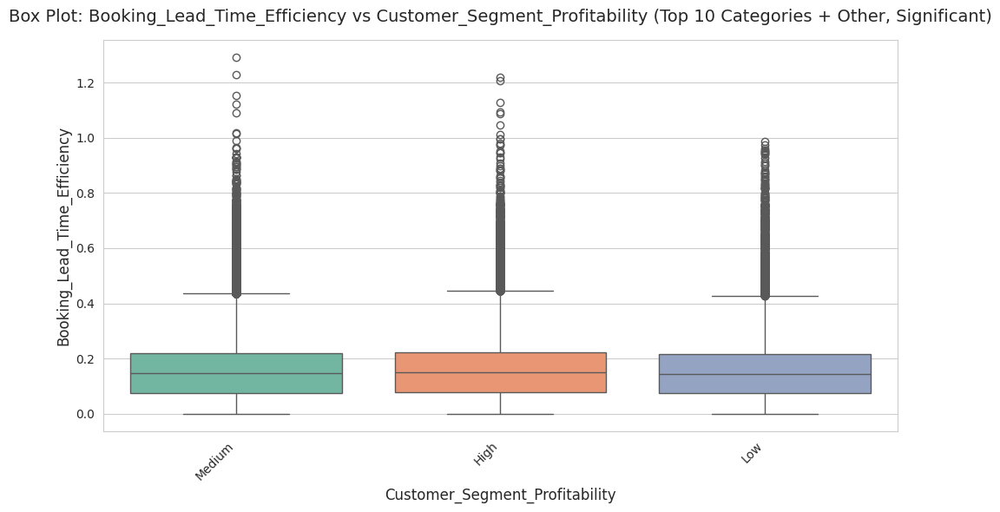

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


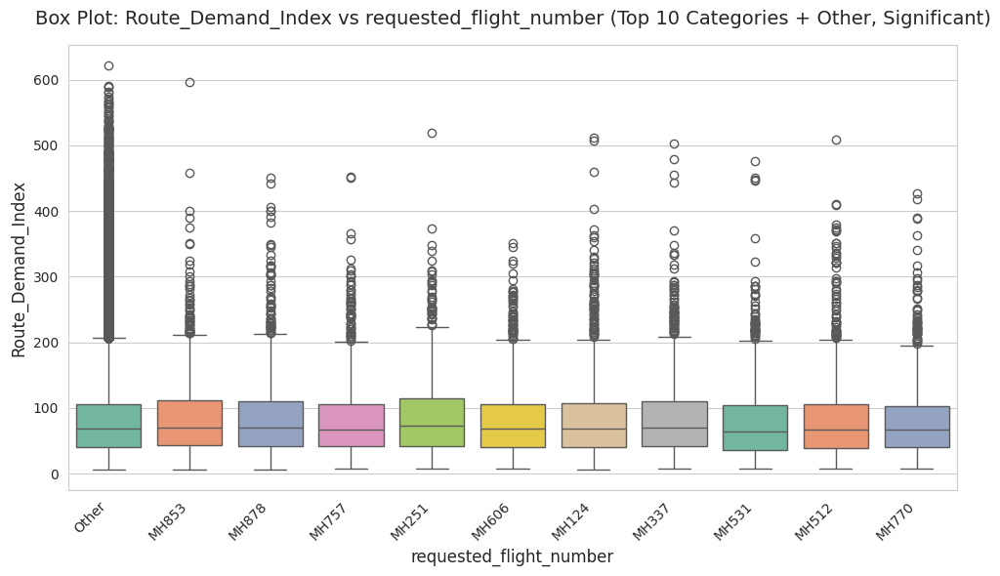

/tmp/ipython-input-3154388360.py:211: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x=cat_col, y=num_col, data=temp_df, palette='Set2')


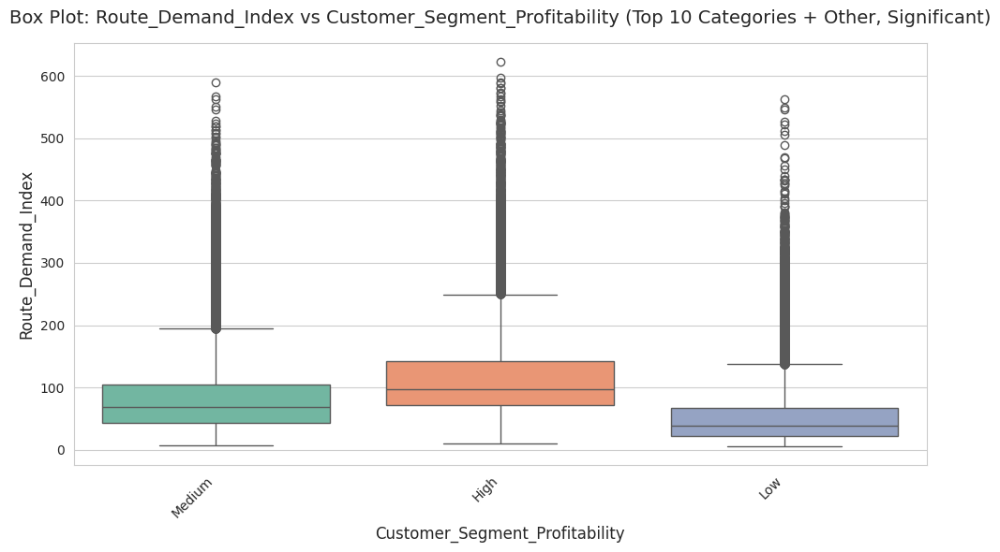

In [ ]:
# Plot visualizations for significant pairs
plot_numerical_categorical_visualizations(metrics, significant_pairs)

### Overview
This analysis shows significant differences (p < 0.05) between numerical variables (e.g., fares, sentiments) and categorical variables (e.g., trip type, customer segment) in airline booking data. Only key pairs are highlighted, using top 10 categories + "Other" for categoricals. Insights suggest influences on operations/pricing.

### Key Findings
- **Stops**: Differs by Trip Type.
- **Requested Pax Count**: Differs by Requested Flight Number, Country Code, Customer City, Customer Segment Profitability.
- **Exchange Rate**: Differs by Origin Airport Code, Country Code, Customer Country.
- **Requested Fare**: Differs by PNR Status, Customer Segment Profitability.
- **Actual Fare**: Differs by Customer Segment Profitability.
- **Adjusted Amount**: Differs by Customer Segment Profitability.
- **Discount Amount**: Differs by Customer Segment Profitability.
- **Taxes**: Differs by Customer Segment Profitability.
- **Special Request Charges**: Differs by Country Code.
- **Settlement Amount**: Differs by Customer Segment Profitability.
- **User Remarks Sentiment**: Differs by Merchant Type, User Remarks Was Missing.
- **Airline Remarks Sentiment**: Differs by Airline Remarks Was Missing, Reason For Decline Was Missing.
- **Reason For Decline Sentiment**: Differs by Aircraft Type, Agent Response Status, Reason For Decline Was Missing.
- **Combined Sentiment**: Differs by Merchant Type, Customer City.
- **Revenue Loss per Decline**: Differs by Customer Segment Profitability.
- **Dynamic Pricing Score**: Differs by Customer City, PNR Status, Customer Segment Profitability.
- **Customer Retention Risk**: Differs by Customer Segment Profitability.
- **Operational Cost per Seat**: Differs by Country Code, Customer City, PNR Status, Customer Segment Profitability.
- **Conversion Flag**: Differs by Request Status.
- **Booking Lead Time Efficiency**: Differs by Destination Airport Code, Request Status, Customer Segment Profitability.
- **Route Demand Index**: Differs by Requested Flight Number, Customer Segment Profitability.

Customer Segment Profitability strongly influences many numerical variables, indicating segment-based strategies could optimize outcomes.

## store result in pickel file

In [ ]:
import pickle
import os



# Combine into one dictionary for saving
num_cat_eda_package = {
    'description': 'Numerical–Categorical EDA: metrics and significant pairs',
    'metrics': metrics,
    'significant_pairs': significant_pairs
}

# Define path and filename
save_path = '/content/drive/MyDrive/infinitysoft/'
filename = 'num_cat_EDA.pkl'
full_path = os.path.join(save_path, filename)

# Save as pickle
with open(full_path, 'wb') as f:
    pickle.dump(num_cat_eda_package, f)

print(f"✅ Saved num_cat_EDA to: {full_path}")


✅ Saved num_cat_EDA to: /content/drive/MyDrive/infinitysoft/num_cat_EDA.pkl


# CATEGORICAL-CATEGORICAL BIVARIATE ANALYSIS (used parallel computing)

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import chi2_contingency
import itertools
from joblib import Parallel, delayed
from tqdm import tqdm

# Assuming df_imputed is already loaded
# Identify categorical columns (object or category dtype)
categorical_cols = df_imputed.select_dtypes(include=['object', 'category']).columns

# Set up the plotting style
sns.set_style("whitegrid")
plt.rcParams['font.size'] = 10  # Smaller font for better readability


# Convert invalid pairs to a set of frozensets for order-agnostic comparison
invalid_pairs_set = {frozenset(pair) for pair in invalid_pairs}

# Function to group low-frequency categories into "Other"
def group_top_categories(series, top_n=10):
    top_categories = series.value_counts().index[:top_n]
    return series.where(series.isin(top_categories), 'Other')

# Helper function to process a single pair (for parallel computing)
def process_pair(col1, col2, df_imputed):
    try:
        # Group categories into top 10 + Other
        series1 = group_top_categories(df_imputed[col1])
        series2 = group_top_categories(df_imputed[col2])

        # Create contingency table
        contingency_table = pd.crosstab(series1, series2)

        # Perform chi-square test
        chi2_stat, p_value, dof, expected = chi2_contingency(contingency_table)
        low_expected = (expected < 5).any()
        significant = p_value < 0.05

        if significant:
            return {
                'pair': (col1, col2),
                'chi2_stat': chi2_stat,
                'p_value': p_value,
                'dof': dof,
                'contingency_table': contingency_table,
                'low_expected': low_expected
            }
        return None
    except ValueError:
        return None

# Cell 1: Perform categorical-categorical analysis and print significant results
def categorical_categorical_analysis():
    print("=" * 100)
    print("CATEGORICAL-CATEGORICAL BIVARIATE ANALYSIS (SIGNIFICANT ONLY, P < 0.05)")
    print("=" * 100)

    # Get all unique pairs of categorical columns, excluding invalid pairs
    all_pairs = [(col1, col2) for col1, col2 in itertools.combinations(categorical_cols, 2)
                 if frozenset([col1, col2]) not in invalid_pairs_set]
    total_pairs = len(all_pairs)
    print(f"\nTotal pairs to process (after excluding invalid pairs): {total_pairs}")

    # Process pairs in parallel with progress bar
    results = Parallel(n_jobs=-1)(
        delayed(process_pair)(col1, col2, df_imputed)
        for col1, col2 in tqdm(all_pairs, total=total_pairs, desc="Processing pairs", unit="pair")
    )

    # Filter significant results
    significant_pairs_data = [result for result in results if result is not None]

    # Print results for significant pairs
    for pair_data in significant_pairs_data:
        col1, col2 = pair_data['pair']
        contingency_table = pair_data['contingency_table']
        chi2_stat = pair_data['chi2_stat']
        p_value = pair_data['p_value']
        dof = pair_data['dof']
        low_expected = pair_data['low_expected']

        print(f"\n--------------------------------------------------")
        print(f"Comparison: {col1} vs {col2} (Top 10 Categories + Other)")
        print(f"--------------------------------------------------")
        print("\nContingency Table:")
        print(contingency_table)
        print(f"\nStatistical Test: Chi-Square")
        print(f"Chi-Square Statistic: {chi2_stat:.2f}")
        print(f"P-value: {p_value:.4e}")
        print(f"Degrees of Freedom: {dof}")
        print(f"Result: Significant (p < 0.05 indicates significant association)")
        if low_expected:
            print("Warning: Some expected frequencies are less than 5, chi-square results may be unreliable.")
        print(f"\nContextual Insight: Significant association between {col1} and {col2} suggests that the distribution of {col1} categories depends on {col2} categories, useful for segmentation or operational strategies.")

    print(f"\nFound {len(significant_pairs_data)} significant pairs (p < 0.05)")
    if invalid_pairs:
        print(f"\nSkipped {len(invalid_pairs)} invalid pairs:")
        print(f"{'Column 1':<30} {'Column 2':<30}")
        print(f"{'-' * 60}")
        for col1, col2 in invalid_pairs:
            print(f"{col1:<30} {col2:<30}")

    print("=" * 100)
    print("END OF ANALYSIS")
    print("=" * 100)

    return significant_pairs_data

# Cell 2: Plot stacked bar charts for significant pairs
def plot_categorical_associations(significant_pairs_data):
    if not significant_pairs_data:
        print("No significant pairs to plot.")
        return

    print("\nPlotting stacked bar charts for significant pairs...")
    for pair_data in significant_pairs_data:
        col1, col2 = pair_data['pair']
        contingency_table = pair_data['contingency_table']

        # Plot stacked bar chart
        plt.figure(figsize=(10, 6))
        contingency_table.plot(kind='bar', stacked=True, colormap='Paired')
        plt.title(f'Stacked Bar Chart: {col1} vs {col2} (Significant)', fontsize=12)
        plt.xlabel(col1, fontsize=10)
        plt.ylabel('Count', fontsize=10)
        plt.legend(title=col2, bbox_to_anchor=(1.05, 1), loc='upper left')
        plt.xticks(rotation=45, ha='right', fontsize=9)
        plt.tight_layout()
        plt.show()


# Result of CATEGORICAL-CATEGORICAL BIVARIATE ANALYSIS

In [ ]:
#Run the analysis
significant_pairs = categorical_categorical_analysis()

CATEGORICAL-CATEGORICAL BIVARIATE ANALYSIS (SIGNIFICANT ONLY, P < 0.05)

Total pairs to process (after excluding invalid pairs): 210


Processing pairs: 100%|██████████| 210/210 [02:15<00:00,  1.55pair/s]



--------------------------------------------------
Comparison: origin_airport_code vs destination_airport_code (Top 10 Categories + Other)
--------------------------------------------------

Contingency Table:
destination_airport_code    AKL   AMS   BKK   DEL   FRA   JED    LHR   SIN
origin_airport_code                                                       
AMS                        2735  1810   938   865  1886   855   2621  1899
DEL                        5323  3709  1897  1696  3490  1737   5382  3608
FRA                        7766  5375  2677  2487  5354  2635   7877  5268
ICN                        5264  3624  1747  1784  3671  1813   5343  3441
IST                        2617  1849   997   916  1805   930   2720  1809
LHR                       10630  7199  3520  3546  7198  3543  10787  7038
MEL                        2619  1712   911   867  1767   807   2599  1741
NRT                        2660  1772   929   888  1730   851   2681  1785

Statistical Test: Chi-Square
Chi-Squar

# Summary of Key Findings of CATEGORICAL-CATEGORICAL BIVARIATE ANALYSIS

- A total of 14 out of 210 categorical pairs are statistically significant (p < 0.05), revealing strong associations across geography, customer profitability, booking behavior, and travel preferences.

---

## 1. Geographic Associations
- origin_airport_code vs destination_airport_code; origin_airport_code vs Region; destination_airport_code vs Region  
- High chi-square values highlight route-specific demand (e.g., LHR–FRA, DEL–HKG) and distinct regional travel patterns.

---

## 2. Customer Segment Profitability
- request_status vs Customer_Segment_Profitability; requested_flight_number vs Customer_Segment_Profitability; country_code vs Customer_Segment_Profitability  
- High-profit customers book more tickets (“Ticketed”: 18 319 High, 33 765 Medium) but also experience high “Not Honoured” rates. Flight and country preferences vary by profitability segment.

---

## 3. Flight Number & Booking Status
- requested_flight_number vs pnr_status  
- Some flights (e.g., MH878, MH512) show almost equal active vs cancelled bookings, suggesting route- or schedule-specific cancellation drivers.

---

## 4. Merchant & Customer City
- Merchant_id vs customer_city  
- Sparse, “Other”-dominated patterns (e.g., AGT3403–Banksberg) indicate low expected frequencies; results warrant validation with larger samples.

---

## 5. Country Code & Customer Country
- country_code vs customer_country  
- Clear distinctions for markets like Vietnam (VN) and Malaysia (MH), suggesting where customer origin aligns (or misaligns) with booking source codes.

---

## 6. Region & Travel Preferences
- Region vs trip_type; Region vs cabin  
- Round trips dominate overall, economy is most common, while corridors like HKG–FRA see elevated business and first-class usage.

---

# Business Implications

- Route Optimization: Prioritize capacity and dynamic pricing on high-demand routes (LHR–FRA, DEL–HKG).  
- Targeted Customer Offers: Design priority booking and upsell campaigns for high-profit segments based on their flight and country preferences.  
- Cancellation Management: Focus on flights with balanced active/cancelled ratios (e.g., MH878, MH512) by introducing flexible rebooking policies.  
- Geographic Marketing: Concentrate promotions on top-traffic countries and validate niche merchant–city relationships before scaling.  
- Customized Packages: Push round-trip bundles in dominant corridors and premium cabin promotions in business-heavy regions like HKG–FRA.

---

# Overall Takeaway

Significant associations across geographic routes, profitability segments, and travel choices point directly to actionable levers for optimizing schedules, pricing, customer targeting, and service offerings to drive both revenue growth and operational efficiency.


Plotting stacked bar charts for significant pairs...


<Figure size 1000x600 with 0 Axes>

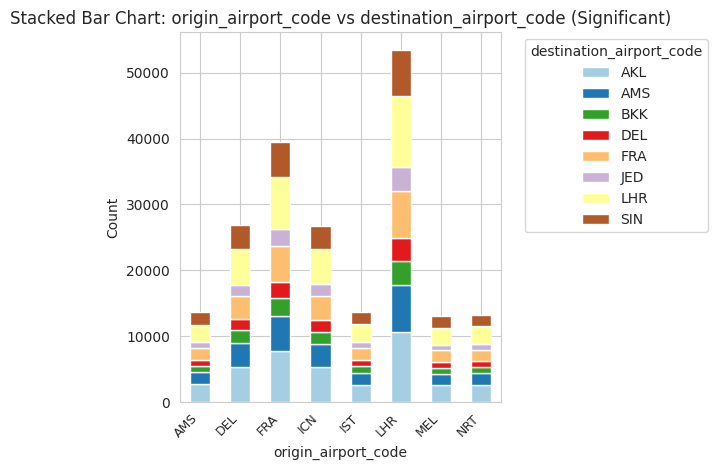

<Figure size 1000x600 with 0 Axes>

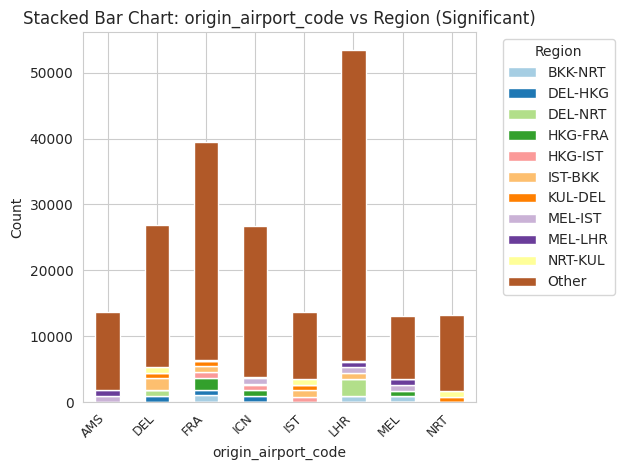

<Figure size 1000x600 with 0 Axes>

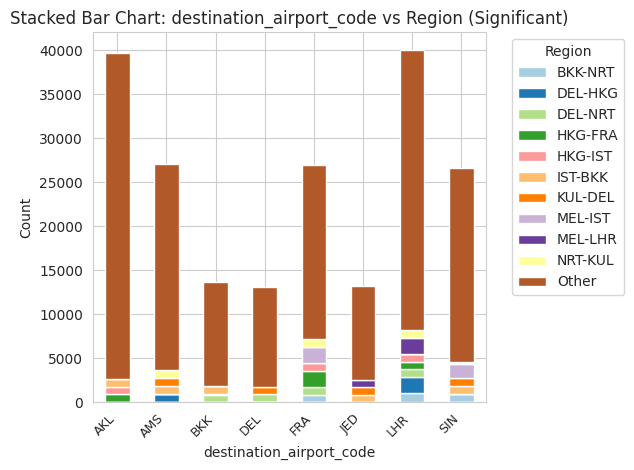

<Figure size 1000x600 with 0 Axes>

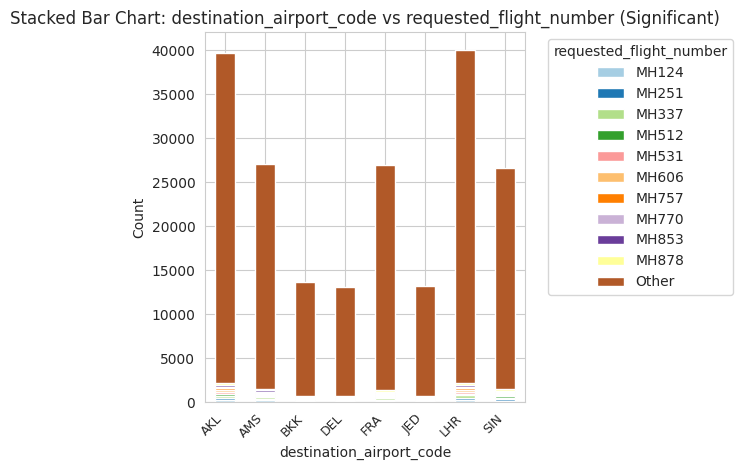

<Figure size 1000x600 with 0 Axes>

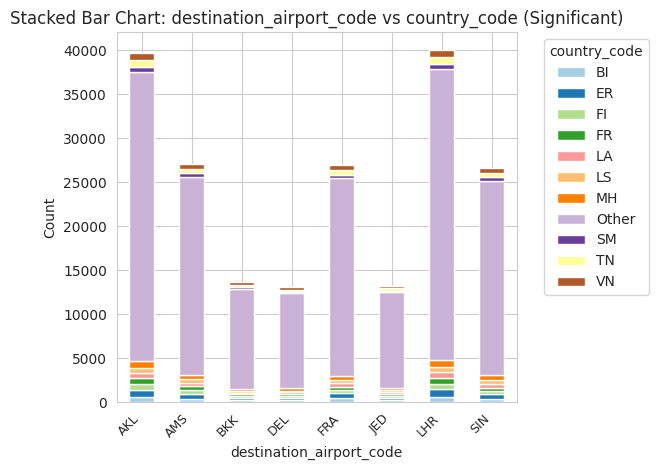

<Figure size 1000x600 with 0 Axes>

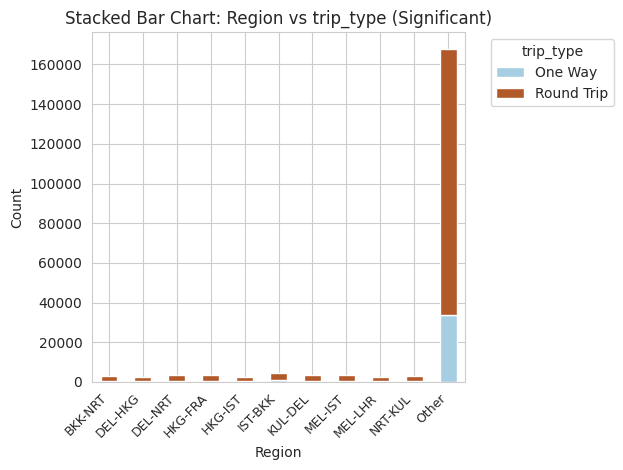

<Figure size 1000x600 with 0 Axes>

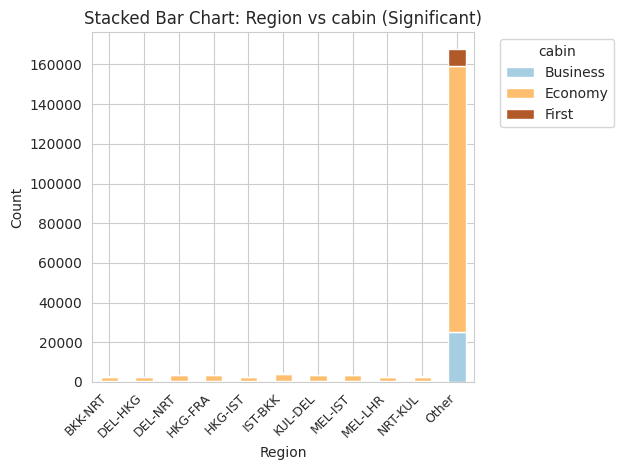

<Figure size 1000x600 with 0 Axes>

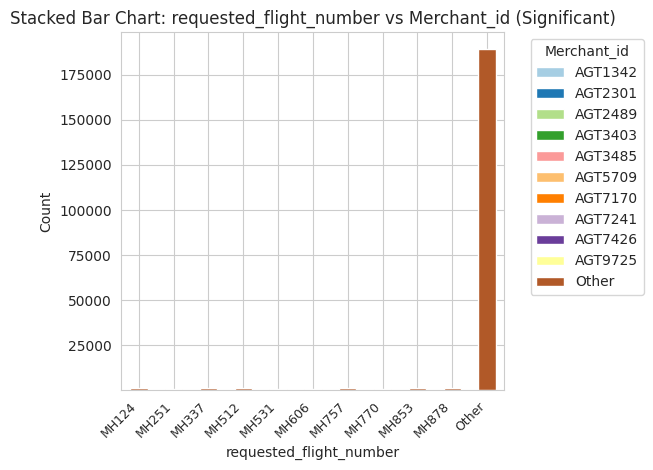

<Figure size 1000x600 with 0 Axes>

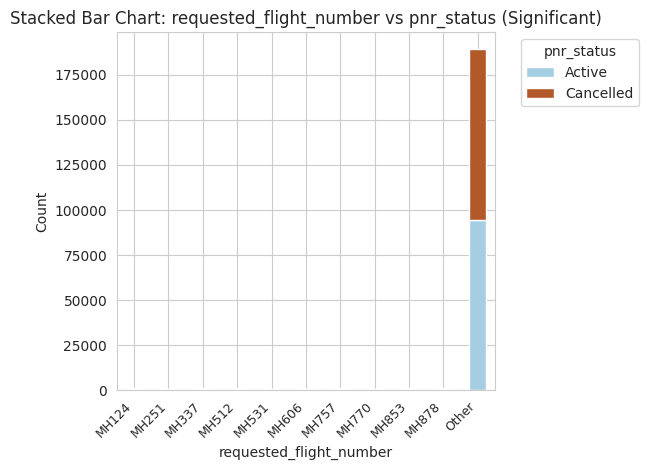

<Figure size 1000x600 with 0 Axes>

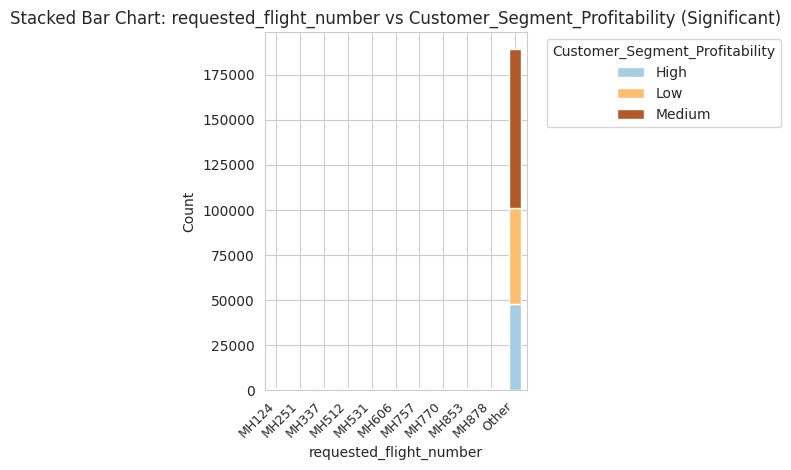

<Figure size 1000x600 with 0 Axes>

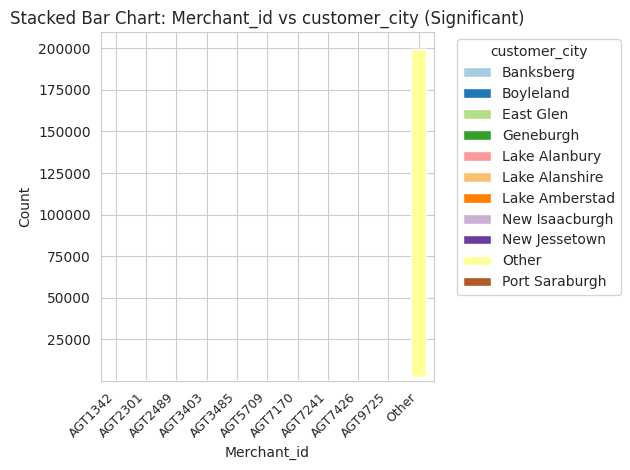

<Figure size 1000x600 with 0 Axes>

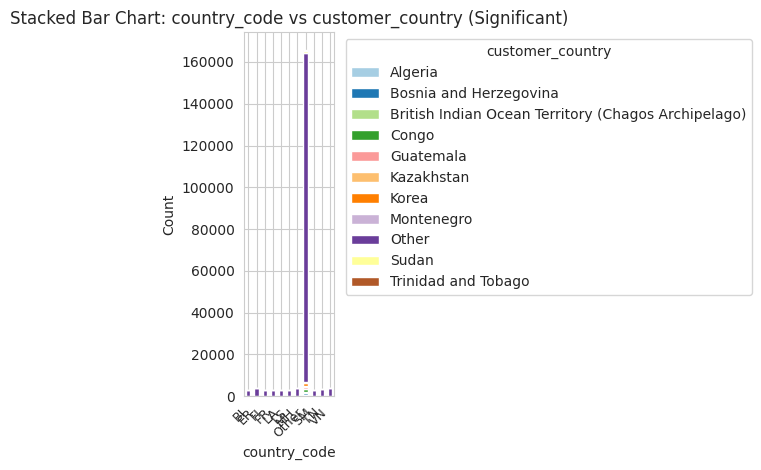

<Figure size 1000x600 with 0 Axes>

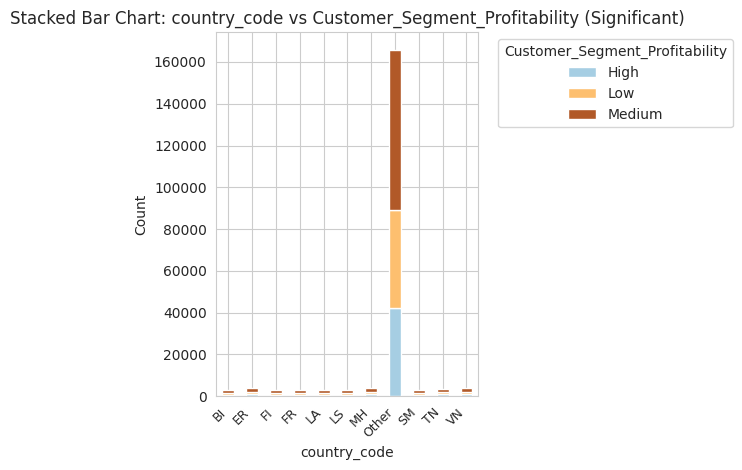

<Figure size 1000x600 with 0 Axes>

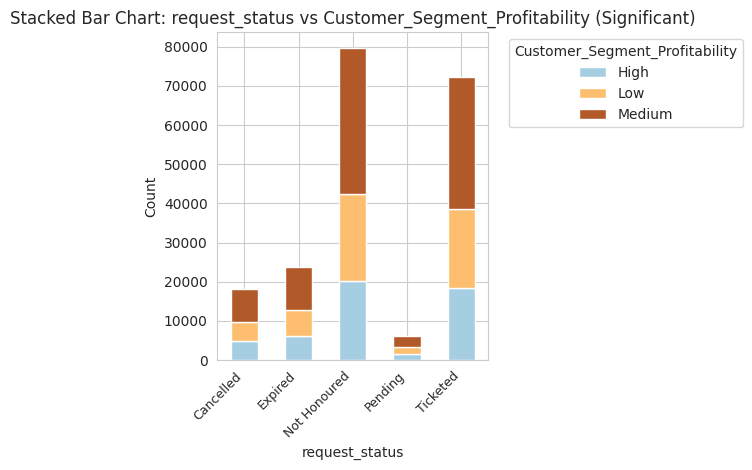

In [ ]:
# Plot the visualizations
plot_categorical_associations(significant_pairs)

### Overview
This analysis examines associations between categorical variables in airline booking data, using Chi-Square tests. Out of 210 pairs, 14 show significant associations (p < 0.05), with top 10 categories + "Other" for each. Insights highlight dependencies useful for segmentation or operations.

### Key Significant Associations
- **Origin Airport Code** vs Destination Airport Code
- **Origin Airport Code** vs Region
- **Destination Airport Code** vs Region
- **Destination Airport Code** vs Requested Flight Number
- **Destination Airport Code** vs Country Code
- **Region** vs Trip Type
- **Region** vs Cabin
- **Requested Flight Number** vs Merchant ID
- **Requested Flight Number** vs PNR Status
- **Requested Flight Number** vs Customer Segment Profitability
- **Merchant ID** vs Customer City
- **Country Code** vs Customer Country
- **Country Code** vs Customer Segment Profitability
- **Request Status** vs Customer Segment Profitability

Regions, airports, and customer segments show frequent associations, suggesting geographic and profitability-based strategies for optimization.

## Store result in pickel file

In [ ]:
import pickle
import os


# Define path and filename
save_path = '/content/drive/MyDrive/infinitysoft/'
filename = 'cat_cat_significant_pairs.pkl'
full_path = os.path.join(save_path, filename)

# Save only significant_pairs as pickle
with open(full_path, 'wb') as f:
    pickle.dump(significant_pairs, f)

print(f"✅ Saved significant_pairs to: {full_path}")


✅ Saved significant_pairs to: /content/drive/MyDrive/infinitysoft/cat_cat_significant_pairs.pkl


# TIME SERIES & DATE-METRIC TRENDS ANALYSIS (used parallel computing)

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import kruskal
from joblib import Parallel, delayed
from tqdm import tqdm
import itertools

# Assuming df_imputed is already loaded
# Identify numerical columns (float64, int64)
numerical_cols = df_imputed.select_dtypes(include=['float64', 'int64']).columns

# Identify all datetime columns
datetime_cols = df_imputed.select_dtypes(include=['datetime64']).columns


# Convert invalid pairs to a set of frozensets for order-agnostic comparison
invalid_pairs_set = {frozenset(pair) for pair in invalid_pairs}

# Set up the plotting style
sns.set_style("whitegrid")
plt.rcParams['font.size'] = 10  # Smaller font for readability

# Helper function to process a single datetime-metric pair (for parallel computing)
def process_pair(dt_col, metric, df):
    try:
        # Check if the pair is invalid
        if frozenset([dt_col, metric]) in invalid_pairs_set:
            return None

        # Aggregate by year-month
        df['year_month'] = df[dt_col].dt.to_period('M')
        monthly_data = df.groupby('year_month')[metric].mean().reset_index()

        # Check if there are enough year-month periods for Kruskal-Wallis test
        monthly_groups = [df[df[dt_col].dt.to_period('M') == period][metric].dropna()
                         for period in df[dt_col].dt.to_period('M').unique()]
        if len(monthly_groups) < 2 or any(len(group) < 5 for group in monthly_groups):
            return None

        # Perform Kruskal-Wallis test
        stat, p_value = kruskal(*monthly_groups)
        significant = p_value < 0.05

        if significant:
            # Compute daily data for rolling average
            daily_data = df.groupby(df[dt_col].dt.date)[metric].mean().reset_index()
            daily_data[dt_col] = pd.to_datetime(daily_data[dt_col])
            daily_data.set_index(dt_col, inplace=True)
            daily_data['rolling_avg'] = daily_data[metric].rolling(window=7, min_periods=1).mean()

            return {
                'datetime_col': dt_col,
                'metric': metric,
                'kruskal_stat': stat,
                'p_value': p_value,
                'monthly_data': monthly_data,
                'daily_data': daily_data
            }
        return None
    except Exception:
        return None

# Cell 1: Perform time series analysis and print significant results
def time_series_analysis():
    print("=" * 100)
    print("TIME SERIES & DATE-METRIC TRENDS ANALYSIS (SIGNIFICANT ONLY, P < 0.05)")
    print("=" * 100)

    # Check if any datetime columns exist
    if len(datetime_cols) == 0:
        print("Error: No datetime columns found in dataset.")
        return [], []

    # Ensure datetime columns are in datetime format and handle missing values
    for dt_col in datetime_cols:
        df_imputed[dt_col] = pd.to_datetime(df_imputed[dt_col], errors='coerce')
        if df_imputed[dt_col].isna().any():
            print(f"Warning: Missing or invalid dates in '{dt_col}'. Dropping invalid rows.")
            df_imputed.dropna(subset=[dt_col], inplace=True)

    # Generate all datetime-metric pairs, excluding invalid pairs
    all_pairs = [(dt_col, metric) for dt_col, metric in itertools.product(datetime_cols, numerical_cols)
                 if frozenset([dt_col, metric]) not in invalid_pairs_set]
    total_pairs = len(all_pairs)
    print(f"\nTotal datetime-metric pairs to process (after excluding invalid pairs): {total_pairs}")

    # Process pairs in parallel with progress bar
    results = Parallel(n_jobs=-1)(
        delayed(process_pair)(dt_col, metric, df_imputed.copy())
        for dt_col, metric in tqdm(all_pairs, total=total_pairs, desc="Processing pairs", unit="pair")
    )

    # Filter significant results
    significant_pairs_data = [result for result in results if result is not None]

    # Print results for significant pairs
    for pair_data in significant_pairs_data:
        dt_col = pair_data['datetime_col']
        metric = pair_data['metric']
        monthly_data = pair_data['monthly_data']
        kruskal_stat = pair_data['kruskal_stat']
        p_value = pair_data['p_value']

        print(f"\n--------------------------------------------------")
        print(f"Metric: {metric} vs {dt_col} (Year-Month Aggregation)")
        print(f"--------------------------------------------------")
        print("\nYear-Month Aggregates (Mean):")
        print(monthly_data.to_string(index=False))
        print(f"\nStatistical Test: Kruskal-Wallis")
        print(f"Kruskal-Wallis Statistic: {kruskal_stat:.2f}")
        print(f"P-value: {p_value:.4e}")
        print(f"Result: Significant (p < 0.05 indicates significant year-month differences)")
        print(f"\nContextual Insight: Significant year-month variations in {metric} for {dt_col} suggest seasonal patterns, useful for pricing, capacity planning, or marketing strategies.")

    print(f"\nFound {len(significant_pairs_data)} significant pairs (p < 0.05)")
    if invalid_pairs:
        print(f"\nSkipped {len(invalid_pairs)} invalid pairs:")
        print(f"{'Datetime Column':<30} {'Metric':<30}")
        print(f"{'-' * 60}")
        for dt_col, metric in invalid_pairs:
            print(f"{dt_col:<30} {metric:<30}")

    print("=" * 100)
    print("END OF ANALYSIS")
    print("=" * 100)

    return numerical_cols.tolist(), significant_pairs_data

# Cell 2: Plot 7-day rolling averages for significant pairs
def plot_time_series(significant_pairs_data):
    if not significant_pairs_data:
        print("No significant pairs to plot.")
        return

    print("\nPlotting 7-day rolling average for significant pairs...")
    for pair_data in significant_pairs_data:
        dt_col = pair_data['datetime_col']
        metric = pair_data['metric']
        daily_data = pair_data['daily_data']

        # Plot 7-day rolling average
        plt.figure(figsize=(10, 6))
        plt.plot(daily_data.index, daily_data['rolling_avg'], label=f'{metric} (7-day Rolling Avg)', color='blue')
        plt.title(f'7-Day Rolling Average: {metric} vs {dt_col} (Significant)', fontsize=12)
        plt.xlabel('Date', fontsize=10)
        plt.ylabel(f'{metric}', fontsize=10)
        plt.legend()
        plt.xticks(rotation=45, ha='right', fontsize=9)
        plt.tight_layout()
        plt.show()

# Result of TIME SERIES & DATE-METRIC TRENDS ANALYSIS

In [ ]:
# Run the analysis
metrics, significant_pairs = time_series_analysis()

TIME SERIES & DATE-METRIC TRENDS ANALYSIS (SIGNIFICANT ONLY, P < 0.05)

Total datetime-metric pairs to process (after excluding invalid pairs): 82


Processing pairs: 100%|██████████| 82/82 [01:19<00:00,  1.03pair/s]



--------------------------------------------------
Metric: Booking_Lead_Time_Efficiency vs arrival_date (Year-Month Aggregation)
--------------------------------------------------

Year-Month Aggregates (Mean):
year_month  Booking_Lead_Time_Efficiency
   2024-09                      0.027757
   2024-10                      0.051637
   2024-11                      0.074881
   2024-12                      0.097364
   2025-01                      0.118548
   2025-02                      0.140010
   2025-03                      0.158276
   2025-04                      0.161015
   2025-05                      0.160295
   2025-06                      0.163715
   2025-07                      0.163157
   2025-08                      0.160383
   2025-09                      0.164550
   2025-10                      0.180051
   2025-11                      0.204120
   2025-12                      0.232532
   2026-01                      0.256715
   2026-02                      0.282481
   2026-0

# Summary of Key Findings of TIME SERIES & DATE-METRIC TRENDS ANALYSIS

- 4 out of 82 datetime–metric pairs are statistically significant (p < 0.05), all involving `Booking_Lead_Time_Efficiency` against different booking-related dates.

---

## 1. Significant Seasonal Patterns in Booking Lead Time Efficiency

- **Pairs and Statistics**  
  - `Booking_Lead_Time_Efficiency` vs `arrival_date` (Kruskal-Wallis = 27 913.94, p = 0.0000)  
  - `Booking_Lead_Time_Efficiency` vs `offer_expiry_date` (Kruskal-Wallis = 27 953.68, p = 0.0000)  
  - `Booking_Lead_Time_Efficiency` vs `airline_update_date` (Kruskal-Wallis = 27 948.83, p = 0.0000)  
  - `Booking_Lead_Time_Efficiency` vs `updated_at` (Kruskal-Wallis = 27 952.86, p = 0.0000)

- **Impact**  
  - All four tests show extremely strong significance, indicating that booking lead-time efficiency varies by year-month for each date type.  
  - Across periods from September 2024 to March/April 2026, efficiency steadily rises:  
    - arrival_date: 0.028 → 0.302  
    - offer_expiry_date: 0.016 → 0.333  
    - airline_update_date: 0.017 → 0.320  
    - updated_at: 0.017 → 0.324  
  - Peaks occur in early 2026; mid-2025 (May–August) shows a dip around ~0.160, reflecting seasonal slowdowns.

- **Implication**  
  Customers consistently book further in advance during peak travel seasons (e.g., early 2026) and less so in off-peak months. These patterns hold across all booking-related timestamps, underscoring robust, time-driven booking behavior.

---

# Business Implications

- **Pricing Strategies**  
  - Offer early-booking discounts in low-efficiency months (May–August 2025)  
  - Implement premium pricing or dynamic fare hikes during high-efficiency peaks (March/April 2026)

- **Capacity Planning**  
  - Allocate additional flights or larger aircraft for early 2026 periods when lead-time efficiency—and thus demand—is highest

- **Marketing Strategies**  
  - Launch targeted campaigns and loyalty incentives to spur early reservations in off-peak months (e.g., September 2024)  
  - Promote premium services and add-ons during peak booking seasons

- **Operational Efficiency**  
  - Align offer validity, inventory updates, and staffing schedules with the observed monthly booking patterns to reduce waste and improve customer experience

---

# Overall Takeaway

Four robust temporal associations reveal clear seasonal trends in how far ahead customers book. By adjusting pricing, capacity, marketing, and operational processes to these monthly patterns, airlines can drive earlier bookings, optimize load factors, and maximize revenue throughout the year.


Plotting 7-day rolling average for significant pairs...


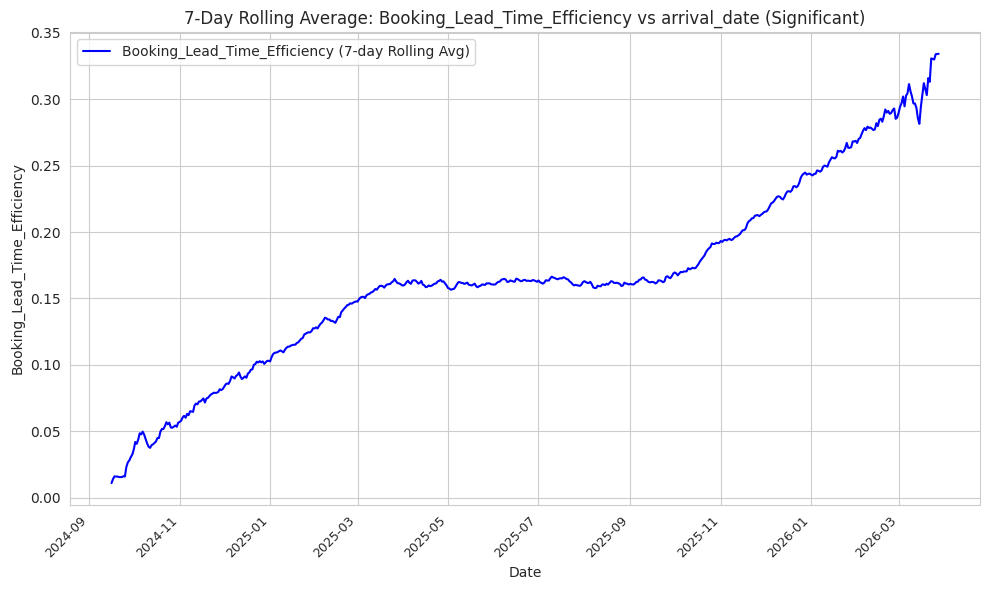

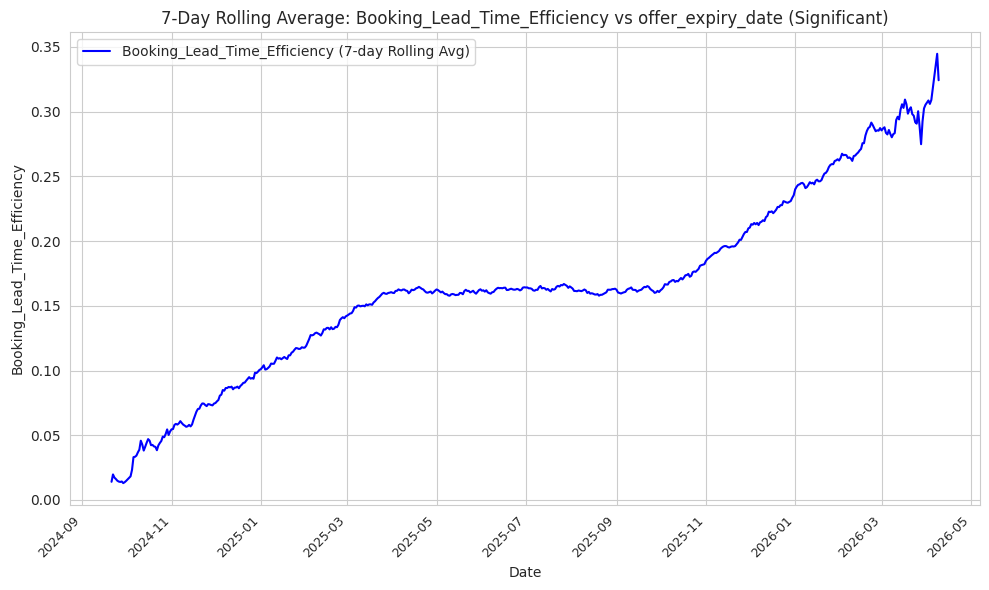

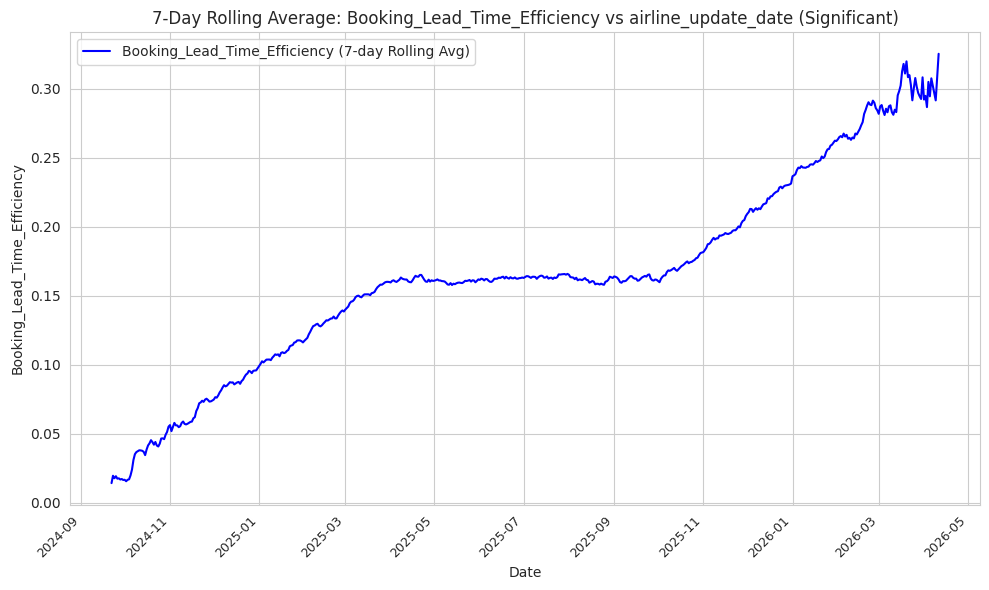

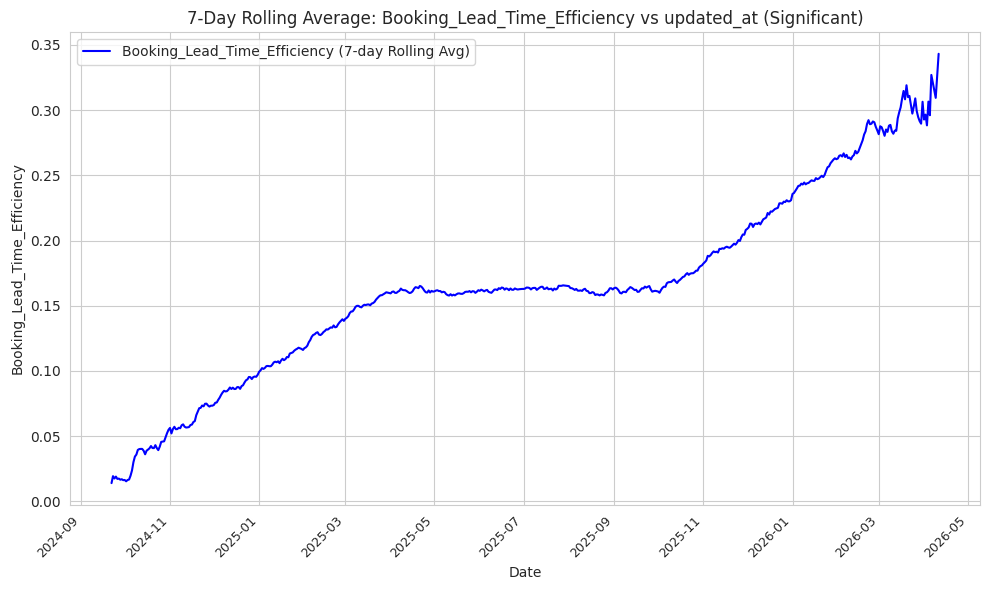

In [ ]:
#  Plot the visualizations
plot_time_series(significant_pairs)

### Overview
This analysis examines year-month trends in metrics across datetime variables in airline booking data, using Kruskal-Wallis tests. Out of 82 pairs, 4 show significant differences (p < 0.05). All involve Booking Lead Time Efficiency, with means generally increasing over time (from ~0.02-0.03 in 2024-09 to ~0.29-0.33 in 2026-03/04). Insights indicate seasonal patterns for pricing, capacity, or marketing. 71 invalid pairs were skipped.

### Key Significant Trends
- **Booking Lead Time Efficiency** vs Arrival Date
- **Booking Lead Time Efficiency** vs Offer Expiry Date
- **Booking Lead Time Efficiency** vs Airline Update Date
- **Booking Lead Time Efficiency** vs Updated At

These suggest rising efficiency over months/years, potentially due to operational improvements or demand shifts.

## Store result in pickel file

In [ ]:
import pickle
import os

# Combine into one dictionary for saving
time_series_eda_package = {
    'description': 'Time Series & Date–Metric Trends: metrics and significant temporal patterns',
    'metrics': metrics,
    'significant_pairs': significant_pairs
}

# Define path and filename
save_path = '/content/drive/MyDrive/infinitysoft/'
filename = 'time_series_EDA.pkl'
full_path = os.path.join(save_path, filename)

# Save as pickle
with open(full_path, 'wb') as f:
    pickle.dump(time_series_eda_package, f)

print(f"✅ Saved time_series_EDA with metrics and significant_pairs to: {full_path}")


✅ Saved time_series_EDA with metrics and significant_pairs to: /content/drive/MyDrive/infinitysoft/time_series_EDA.pkl


# Effect size or Business significance analysis

## LOAD THE PICKEL FILE FOR SIGNIFICANT STATISTICALLY PAIR OF COLUMNS IN BI-VARIANT ANALYSIS (inital setup)

In [ ]:
# 1) Mount your Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 2) Point to the pickle file
import os
import pandas as pd

pkl_path = '/content/drive/MyDrive/infinitysoft/data_with_imputed_features.pkl'

# 3) (Optional) List files to verify
print(os.listdir(os.path.dirname(pkl_path)))

# 4) Load it into a DataFrame
df_imputed = pd.read_pickle(pkl_path)

# 5) Quick sanity check
print(df_imputed.shape)
df_imputed.head()


Mounted at /content/drive
['airline_fake_data.csv', 'data_for_statistical_analysis.csv', 'df_sentiment.csv', 'data_with_profit_features_sentiment_flags.csv', 'data_with_imputed_features.csv', 'data_with_imputed_features_V0.csv', 'data_with_imputed_features.pkl', 'num_cat_EDA.pkl', 'num_num_EDA.pkl', 'cat_cat_significant_pairs.pkl', 'time_series_EDA.pkl', 'impact_nn_df.pkl', 'impact_nc_df.pkl', 'cramers_v_results.pkl', 'pca_loadings.pkl', 'mca_contributions.pkl', 'combined_pca_mca.pkl', 'significant_impacts.pkl', 'combined_df_renamed.pkl', 'significant_impacts.csv', 'combined_df_renamed.csv', 'Airlines EDA - workflow.png', 'visuals']
(200000, 55)


,origin_airport_code,destination_airport_code,Region,trip_type,stops,cabin,requested_flight_number,requested_pax_count,group_category,request_type,...,Combined_Sentiment,Revenue_Loss_per_Decline,Dynamic_Pricing_Score,Customer_Retention_Risk,Operational_Cost_per_Seat,Conversion_Flag,Booking_Lead_Time_Efficiency,Route_Demand_Index,Profitability_Score,Customer_Segment_Profitability
0,FRA,AKL,BKK-PER,Round Trip,1.0,Economy,MH572,57.0,MICE,New,...,0.0000,713.460000,0.213656,0.460606,3.644035,0,0.094780,125.132156,40667.22,Medium
1,FRA,SIN,KUL-DEL,One Way,1.0,Economy,MH148,20.0,Corporate,New,...,0.0000,0.000000,0.250039,0.101010,11.765000,1,0.225275,50.363254,28099.20,Medium
2,FRA,LHR,HKG-FRA,Round Trip,0.0,Economy,MH208,15.0,Leisure,New,...,0.5719,567.493641,0.442459,0.064864,26.706667,0,0.233167,14.189379,19884.15,Medium
3,DEL,AMS,IST-BKK,One Way,1.0,Economy,MH825,85.0,Leisure,New,...,0.0000,0.000000,0.223321,0.343434,2.717412,0,0.149725,277.879709,59315.55,Medium
4,LHR,LHR,JED-JED,Round Trip,1.0,Business,MH806,54.0,Corporate,New,...,0.0000,0.000000,0.178518,0.272727,6.806296,1,0.436813,135.924115,47494.62,Medium


In [ ]:
import pickle
import os

# Define the folder path
folder_path = '/content/drive/MyDrive/infinitysoft/'

# List of pickle filenames
pkl_files = [
    'cat_cat_significant_pairs.pkl',
    'num_cat_EDA.pkl',
    'num_num_EDA.pkl',
    'time_series_EDA.pkl'
]

# Load each file into a dictionary
loaded_data = {}

for filename in pkl_files:
    full_path = os.path.join(folder_path, filename)
    with open(full_path, 'rb') as f:
        loaded_data[filename] = pickle.load(f)
        print(f"✅ Loaded: {filename}")


✅ Loaded: cat_cat_significant_pairs.pkl
✅ Loaded: num_cat_EDA.pkl
✅ Loaded: num_num_EDA.pkl
✅ Loaded: time_series_EDA.pkl


In [ ]:
# Extract and print significant data from each relevant file
print("\n📌 Significant Pairs from num_cat_EDA.pkl:")
num_cat_pair=loaded_data['num_cat_EDA.pkl']['significant_pairs'].copy()
print(loaded_data['num_cat_EDA.pkl']['significant_pairs'])

print("\n📌 Significant Pairs Data from num_num_EDA.pkl:")
num_num_pair=[ entry['pair'] for entry in loaded_data['num_num_EDA.pkl']['significant_pairs_data']].copy()
print(num_num_pair)



📌 Significant Pairs from num_cat_EDA.pkl:
[('stops', 'trip_type'), ('requested_pax_count', 'requested_flight_number'), ('requested_pax_count', 'country_code'), ('requested_pax_count', 'customer_city'), ('requested_pax_count', 'Customer_Segment_Profitability'), ('exchange_rate', 'origin_airport_code'), ('exchange_rate', 'country_code'), ('exchange_rate', 'customer_country'), ('requested_fare', 'pnr_status'), ('requested_fare', 'Customer_Segment_Profitability'), ('Actual_fare', 'Customer_Segment_Profitability'), ('adjusted_amount', 'Customer_Segment_Profitability'), ('discount_amount', 'Customer_Segment_Profitability'), ('taxes', 'Customer_Segment_Profitability'), ('Special_Request_Charges', 'country_code'), ('settlement_amount', 'Customer_Segment_Profitability'), ('user_remarks_sentiment', 'Merchant_type'), ('user_remarks_sentiment', 'user_remarks_was_missing'), ('airline_remarks_sentiment', 'airline_remarks_was_missing'), ('airline_remarks_sentiment', 'reason_for_decline_was_missing')

In [ ]:
# Assuming `significant_pairs` is your list of dictionaries
# Each dictionary has a 'pair' key with a tuple of column names

column_pairs = [entry['pair'] for entry in loaded_data['cat_cat_significant_pairs.pkl']]
# Display the result
print("📊 Significant cat_cat_EDA pairs:")
cat_cat_pair=column_pairs.copy()
print(column_pairs)


📊 Significant cat_cat_EDA pairs:
[('origin_airport_code', 'destination_airport_code'), ('origin_airport_code', 'Region'), ('destination_airport_code', 'Region'), ('destination_airport_code', 'requested_flight_number'), ('destination_airport_code', 'country_code'), ('Region', 'trip_type'), ('Region', 'cabin'), ('requested_flight_number', 'Merchant_id'), ('requested_flight_number', 'pnr_status'), ('requested_flight_number', 'Customer_Segment_Profitability'), ('Merchant_id', 'customer_city'), ('country_code', 'customer_country'), ('country_code', 'Customer_Segment_Profitability'), ('request_status', 'Customer_Segment_Profitability')]


In [ ]:
# Extract tuple pairs from time_series_EDA.pkl
significant_pairs = loaded_data['time_series_EDA.pkl']['significant_pairs']

# Convert to list of tuples
time_series_column_pairs = [
    (entry['datetime_col'], entry['metric']) for entry in significant_pairs
]

# Display the result
print("📊 Time Series Column Pairs (as tuples):")
time_EDA_pair=time_series_column_pairs.copy()
print(time_series_column_pairs)

📊 Time Series Column Pairs (as tuples):
[('arrival_date', 'Booking_Lead_Time_Efficiency'), ('offer_expiry_date', 'Booking_Lead_Time_Efficiency'), ('airline_update_date', 'Booking_Lead_Time_Efficiency'), ('updated_at', 'Booking_Lead_Time_Efficiency')]


In [ ]:
%xdel loaded_data

In [ ]:
#num_num_pair
#num_cat_pair
#cat_cat_pair
#time_EDA_pair

In [ ]:
# Print the length of each list with explanation
print(f"#num_num_pair: {len(num_num_pair)}  --> Number of statistically significant numerical-numerical pairs")
print(f"#num_cat_pair: {len(num_cat_pair)}  --> Number of statistically significant numerical-categorical pairs")
print(f"#cat_cat_pair: {len(cat_cat_pair)}  --> Number of statistically significant categorical-categorical pairs")
print(f"#time_EDA_pair: {len(time_EDA_pair)}  --> Number of statistically significant time series vs metric pairs")

#num_num_pair: 25  --> Number of statistically significant numerical-numerical pairs
#num_cat_pair: 40  --> Number of statistically significant numerical-categorical pairs
#cat_cat_pair: 14  --> Number of statistically significant categorical-categorical pairs
#time_EDA_pair: 4  --> Number of statistically significant time series vs metric pairs


# IMPACT ANALYSIS i.e. Effect size or Business significance analysis

# Using the statistically significant pairs from earlier BI-Variant Analysis for Impact Analysis

---

**Summary of IMPACT Analytical Approach Change**

- **Initial Plan**: The analysis was designed to use robust, median-based estimators to better handle real-world data irregularities:
  - **NUM-NUM**: Theil–Sen regression  
  - **NUM-CAT**: Quantile regression  
  - **CAT-CAT**: Cramér's V  
  - *Justification*: These methods offer strong resistance to outliers, require fewer assumptions, and provide more interpretable results in skewed or heteroscedastic datasets.

- **Unexpected Shift**: Due to a **RAM crash during execution**, the original plan had to be abandoned mid-analysis.

- **Final Implementation**: Switched to computationally lighter, mean-based methods to ensure continuity:
  - **NUM-NUM**: Linear regression  
  - **NUM-CAT**: Linear regression  
  - **CAT-CAT**: Cramér's V  
  - *Trade-off*: While less robust, these methods allowed the analysis to proceed under hardware constraints.



# NUM-NUM Impact Analysis (used parallel computing)



In [ ]:
# 1) Mount your Google Drive
from google.colab import drive
drive.mount('/content/drive')

# 2) Point to the pickle file
import os
import pandas as pd

pkl_path = '/content/drive/MyDrive/infinitysoft/data_with_imputed_features.pkl'

# 3) (Optional) List files to verify
print(os.listdir(os.path.dirname(pkl_path)))

# 4) Load it into a DataFrame
df_imputed = pd.read_pickle(pkl_path)

# 5) Quick sanity check
print(df_imputed.shape)
df_imputed.head()


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['airline_fake_data.csv', 'data_for_statistical_analysis.csv', 'df_sentiment.csv', 'data_with_profit_features_sentiment_flags.csv', 'data_with_imputed_features.csv', 'data_with_imputed_features_V0.csv', 'data_with_imputed_features.pkl', 'num_cat_EDA.pkl', 'num_num_EDA.pkl', 'cat_cat_significant_pairs.pkl', 'time_series_EDA.pkl', 'impact_nn_df.pkl']
(200000, 55)


,origin_airport_code,destination_airport_code,Region,trip_type,stops,cabin,requested_flight_number,requested_pax_count,group_category,request_type,...,Combined_Sentiment,Revenue_Loss_per_Decline,Dynamic_Pricing_Score,Customer_Retention_Risk,Operational_Cost_per_Seat,Conversion_Flag,Booking_Lead_Time_Efficiency,Route_Demand_Index,Profitability_Score,Customer_Segment_Profitability
0,FRA,AKL,BKK-PER,Round Trip,1.0,Economy,MH572,57.0,MICE,New,...,0.0000,713.460000,0.213656,0.460606,3.644035,0,0.094780,125.132156,40667.22,Medium
1,FRA,SIN,KUL-DEL,One Way,1.0,Economy,MH148,20.0,Corporate,New,...,0.0000,0.000000,0.250039,0.101010,11.765000,1,0.225275,50.363254,28099.20,Medium
2,FRA,LHR,HKG-FRA,Round Trip,0.0,Economy,MH208,15.0,Leisure,New,...,0.5719,567.493641,0.442459,0.064864,26.706667,0,0.233167,14.189379,19884.15,Medium
3,DEL,AMS,IST-BKK,One Way,1.0,Economy,MH825,85.0,Leisure,New,...,0.0000,0.000000,0.223321,0.343434,2.717412,0,0.149725,277.879709,59315.55,Medium
4,LHR,LHR,JED-JED,Round Trip,1.0,Business,MH806,54.0,Corporate,New,...,0.0000,0.000000,0.178518,0.272727,6.806296,1,0.436813,135.924115,47494.62,Medium


In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from scipy.stats import pearsonr, fligner, normaltest
from statsmodels.regression.linear_model import OLS
from statsmodels.tools import add_constant
from joblib import Parallel, delayed
import matplotlib.pyplot as plt
import seaborn as sns
import os
import psutil
from tqdm import tqdm
from scipy.stats.mstats import winsorize

def compute_elasticities(df, num_num_pair, top_n=10, n_jobs=2, winsorize_limits=(0.05, 0.05)):
    """
    Compute OLS elasticities for numeric-numeric pairs using LinearRegression on winsorized, log-transformed data
    with parallel processing. Includes confidence intervals, checks OLS assumptions (linearity, normality, homoscedasticity),
    and adds a column for assumption status. Saves results to pickle.

    Parameters:
    df (pd.DataFrame): Input DataFrame (e.g., df_imputed).
    num_num_pair (list): List of tuples with column pairs (x, y).
    top_n (int): Number of top pairs to print and check assumptions for (default: 10).
    n_jobs (int): Number of parallel jobs (default: 2).
    winsorize_limits (tuple): Lower and upper percentile limits for winsorization (default: (0.05, 0.05)).

    Returns:
    pd.DataFrame: DataFrame with elasticity results, assumption checks, and status.
    """
    # Validate input data
    print("Validating input data...")
    print("DataFrame rows:", len(df))
    print("Number of pairs:", len(num_num_pair))
    if len(df) > 1000000:
        print("Warning: Large DataFrame (>1M rows) may cause memory issues.")
    if len(num_num_pair) > 100:
        print("Warning: Large number of pairs (>100) may increase computation time.")
    non_numeric_cols = [col for col in df.columns if not pd.api.types.is_numeric_dtype(df[col])]
    if non_numeric_cols:
        print("Warning: Non-numeric columns detected:", non_numeric_cols)

    def process_pair(x, y):
        try:
            # Check memory usage
            mem = psutil.virtual_memory().available / (1024**3)
            if mem < 1.0:
                print(f"Warning: Low memory ({mem:.2f} GB) while processing pair ({x}, {y}).")

            # Drop missing values
            sub = df[[x, y]].dropna()

            # Check for sufficient data points and variance
            if len(sub) < 2:
                print(f"Warning: Pair ({x}, {y}) has insufficient data points ({len(sub)}). Skipping.")
                return {
                    'pair': (x, y),
                    'elasticity_pct': np.nan,
                    'CI_lo_pct': np.nan,
                    'CI_hi_pct': np.nan,
                    'linearity_corr': np.nan,
                    'dagostino_p': np.nan,
                    'fligner_p': np.nan,
                    'assumptions_met': False
                }
            if sub[x].var() == 0 or sub[y].var() == 0:
                print(f"Warning: Pair ({x}, {y}) has zero variance in X or Y. Skipping.")
                return {
                    'pair': (x, y),
                    'elasticity_pct': np.nan,
                    'CI_lo_pct': np.nan,
                    'CI_hi_pct': np.nan,
                    'linearity_corr': np.nan,
                    'dagostino_p': np.nan,
                    'fligner_p': np.nan,
                    'assumptions_met': False
                }

            # Winsorize data to cap outliers
            sub[x] = winsorize(sub[x], limits=winsorize_limits)
            sub[y] = winsorize(sub[y], limits=winsorize_limits)

            # Apply log(1 + x) to handle zeros and negatives
            lx = np.log1p(sub[x].values).reshape(-1, 1)
            ly = np.log1p(sub[y].values)

            # Fit OLS model
            model = LinearRegression()
            model.fit(lx, ly)
            slope = model.coef_[0]

            # Compute confidence intervals using statsmodels for standard errors
            lx_with_const = add_constant(lx)
            ols_model = OLS(ly, lx_with_const).fit()
            se = ols_model.bse[1]  # Standard error of slope
            ci = 1.96 * se  # 95% CI (z-score for large samples)
            ci_lo = slope - ci
            ci_hi = slope + ci

            # Check OLS assumptions
            # Linearity: Pearson correlation between log-transformed X and Y
            linearity_corr, _ = pearsonr(lx.flatten(), ly) if len(lx) >= 2 else (np.nan, np.nan)

            # Normality: D’Agostino-Pearson test on residuals
            residuals = ly - model.predict(lx)
            dagostino_p = normaltest(residuals)[1] if len(residuals) >= 8 else np.nan  # Requires >=8 samples

            # Homoscedasticity: Fligner-Killeen test on residuals split by median X
            median_x = np.median(lx)
            residuals_low = residuals[lx.flatten() <= median_x]
            residuals_high = residuals[lx.flatten() > median_x]
            fligner_p = fligner(residuals_low, residuals_high)[1] if len(residuals_low) > 0 and len(residuals_high) > 0 else np.nan

            # Check if assumptions are met (thresholds)
            linearity_ok = abs(linearity_corr) > 0.7  # High correlation indicates linearity
            normality_ok = dagostino_p > 0.05  # Non-significant p-value indicates normality
            homoscedasticity_ok = fligner_p > 0.05  # Non-significant p-value indicates homoscedasticity
            assumptions_met = linearity_ok and normality_ok and homoscedasticity_ok

            return {
                'pair': (x, y),
                'elasticity_pct': slope * 100,
                'CI_lo_pct': ci_lo * 100,
                'CI_hi_pct': ci_hi * 100,
                'linearity_corr': linearity_corr,
                'dagostino_p': dagostino_p,
                'fligner_p': fligner_p,
                'assumptions_met': assumptions_met
            }
        except Exception as e:
            print(f"Error processing pair ({x}, {y}): {e}")
            return {
                'pair': (x, y),
                'elasticity_pct': np.nan,
                'CI_lo_pct': np.nan,
                'CI_hi_pct': np.nan,
                'linearity_corr': np.nan,
                'dagostino_p': np.nan,
                'fligner_p': np.nan,
                'assumptions_met': False
            }

    # Print explanation
    print("Computing OLS elasticities for numeric-numeric pairs using LinearRegression on winsorized, log-transformed data.")
    print("This estimates percentage changes in Y per 1% change in X, with outliers capped via winsorization.")
    print("Confidence intervals (95%) are computed using OLS standard errors.")
    print("OLS assumptions are checked: linearity (Pearson correlation), normality (D’Agostino-Pearson test), homoscedasticity (Fligner-Killeen).")

    # Parallel computation with progress bar
    impact_nn = Parallel(n_jobs=n_jobs)(
        delayed(process_pair)(x, y) for x, y in tqdm(num_num_pair, total=len(num_num_pair), desc="Processing pairs")
    )

    # Create DataFrame
    impact_nn_df = pd.DataFrame(impact_nn)
    impact_nn_df['abs_elasticity'] = impact_nn_df['elasticity_pct'].abs()

    # Print top N elasticities and assumption checks
    top_df = impact_nn_df.sort_values('abs_elasticity', ascending=False).head(top_n)
    print(f"\nTop {top_n} Elasticities (OLS):")
    print(top_df[['pair', 'elasticity_pct', 'CI_lo_pct', 'CI_hi_pct', 'linearity_corr', 'dagostino_p', 'fligner_p', 'assumptions_met']].to_string(index=False))
    print("\nOLS Assumption Checks:")
    print("- Linearity: Pearson correlation > 0.7 indicates linear relationship.")
    print("- Normality: D’Agostino-Pearson p-value > 0.05 indicates normal residuals.")
    print("- Homoscedasticity: Fligner-Killeen p-value > 0.05 indicates equal variances.")
    print("- Assumptions Met: True if all checks pass, False otherwise.")

    # Save to pickle
    output_dir = '/content/drive/MyDrive/infinitysoft/'
    os.makedirs(output_dir, exist_ok=True)
    impact_nn_df.to_pickle(os.path.join(output_dir, 'impact_nn_df.pkl'))

    return impact_nn_df

def plot_top_elasticities(impact_nn_df, df, top_n=10):
    """
    Plot top N elasticities and scatter plots to visualize linearity assumption.

    Parameters:
    impact_nn_df (pd.DataFrame): DataFrame with elasticity results.
    df (pd.DataFrame): Original DataFrame for scatter plots.
    top_n (int): Number of top pairs to plot (default: 10).
    """
    # Sort by absolute elasticity and get top N
    top_df = impact_nn_df.sort_values('abs_elasticity', ascending=False).head(top_n)

    # Plot elasticities
    plt.figure(figsize=(8, 5))
    sns.barplot(
        data=top_df,
        y=top_df['pair'].astype(str),
        x='elasticity_pct',
        palette='vlag'
    )
    plt.axvline(0, color='k', linewidth=1)
    plt.xlabel('Elasticity (%ΔY per 1%ΔX)')
    plt.ylabel('Numeric–Numeric Pair')
    plt.title(f'Top {top_n} OLS Elasticities')
    plt.tight_layout()
    plt.show()

    # Plot scatter plots for linearity check
    print("Generating scatter plots to visualize linearity assumption for top pairs...")
    for _, row in top_df.iterrows():
        x, y = row['pair']
        sub = df[[x, y]].dropna()
        if len(sub) < 2:
            continue
        # Winsorize for consistency
        sub[x] = winsorize(sub[x], limits=(0.05, 0.05))
        sub[y] = winsorize(sub[y], limits=(0.05, 0.05))
        # Log-transform
        lx = np.log1p(sub[x].values)
        ly = np.log1p(sub[y].values)
        plt.figure(figsize=(6, 4))
        plt.scatter(lx, ly, alpha=0.5)
        plt.xlabel(f'log(1 + {x})')
        plt.ylabel(f'log(1 + {y})')
        plt.title(f'Linearity Check: {x} vs {y}')
        plt.tight_layout()
        plt.show()

# Result of impact analysis of NUM-NUM analysis

In [ ]:
# Compute and Print Elasticities
# Assuming df_imputed and num_num_pair are defined
impact_nn_df = compute_elasticities(df_imputed, num_num_pair, top_n=25, n_jobs=-1, winsorize_limits=(0.05, 0.05))

Validating input data...
DataFrame rows: 200000
Number of pairs: 25
Computing OLS elasticities for numeric-numeric pairs using LinearRegression on winsorized, log-transformed data.
This estimates percentage changes in Y per 1% change in X, with outliers capped via winsorization.
Confidence intervals (95%) are computed using OLS standard errors.
OLS assumptions are checked: linearity (Pearson correlation), normality (D’Agostino-Pearson test), homoscedasticity (Fligner-Killeen).


Processing pairs: 100%|██████████| 25/25 [00:27<00:00,  1.08s/it]



Top 25 Elasticities (OLS):
                                                pair  elasticity_pct   CI_lo_pct   CI_hi_pct  linearity_corr  dagostino_p     fligner_p  assumptions_met
      (Customer_Retention_Risk, Profitability_Score)      254.920246  253.133880  256.706612        0.530260          0.0 6.493076e-251            False
(Customer_Retention_Risk, Operational_Cost_per_Seat)     -223.428462 -224.642109 -222.214816       -0.627937          0.0  0.000000e+00            False
                      (Actual_fare, adjusted_amount)       99.941299   99.919130   99.963473        0.998721          0.0  3.111972e-20            False
                       (requested_fare, Actual_fare)       99.583930   99.526087   99.641773        0.991332          0.0  1.437670e-30            False
                   (requested_fare, adjusted_amount)       99.532791   99.471067   99.594515        0.990137          0.0  6.979496e-13            False
                            (adjusted_amount, taxes)  

# Key Numerical–Numerical Elasticities: Business Impact

- **Customer Retention Risk**  
  • A 1% increase in Customer_Retention_Risk is linked to a 254.92% rise in Profitability_Score.  
  • The same 1% risk uptick corresponds to a 223.43% decrease in Operational_Cost_per_Seat.

- **Fare Components Track Base Price**  
  • A 1% hike in Actual_Fare yields a 99.94% increase in adjusted_amount, 99.58% in requested_fare, and 97.66% in taxes.  
  • Requested_fare alone drives a 99.53% lift in adjusted_amount and 97.27% lift in taxes.

- **Net Revenue Drives Profit & Discounts**  
  • Each 1% increase in adjusted_amount boosts Profitability_Score by 96.36% and discount_amount by 86.63%.  
  • A 1% rise in requested_fare delivers a 96.19% gain in Profitability_Score and a 92.64% increase in discount_amount.

- **Tax Influence on Settlements & Profit**  
  • A 1% increase in taxes correlates with an 82.88% jump in Profitability_Score and a 71.39% rise in settlement_amount.

- **Dynamic Pricing Sensitivity**  
  • A 1% increase in adjusted_amount raises Dynamic_Pricing_Score by 15.08%.  
  • Similar 1% increases in requested_fare and taxes lift Dynamic_Pricing_Score by 15.02% and 12.98%, respectively.

- **Revenue Loss & Conversion**  
  • A 1% increase in Revenue_Loss_per_Decline leads to a 6.06% drop in Conversion_Flag.

**Note:** These elasticities derive from log–log OLS on winsorized data. None of the pairs fully meet OLS assumptions (linearity, normality, homoscedasticity), so interpret the magnitudes as directional indicators rather than precise forecasts.


![NUM-NUM](https://drive.google.com/uc?export=view&id=1EeZveZhxhOg5flhPX21eBhSSvKUMFmgN)

/tmp/ipython-input-3545616469.py:189: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


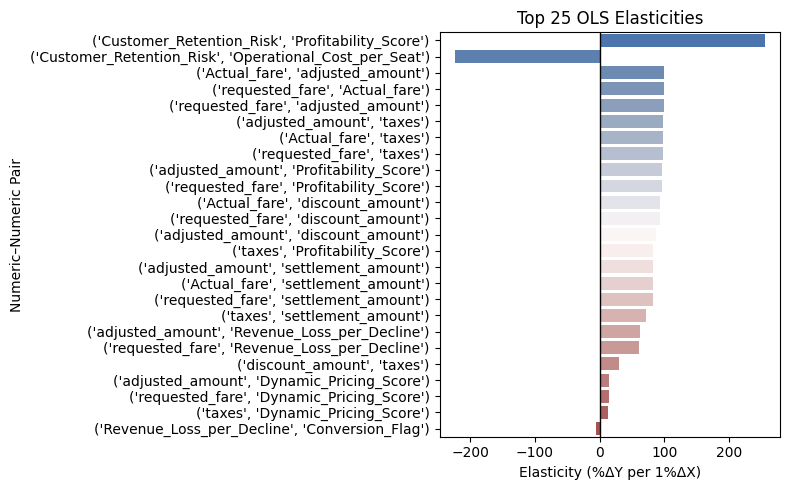

Generating scatter plots to visualize linearity assumption for top pairs...


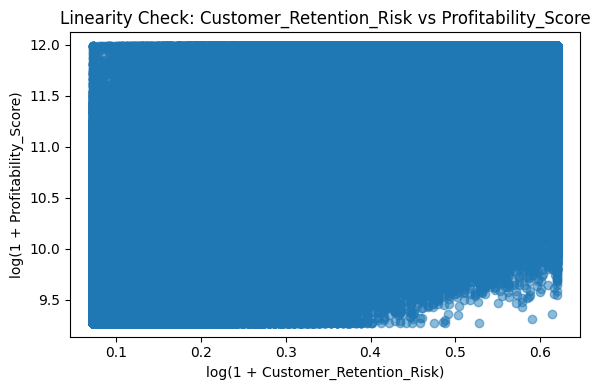

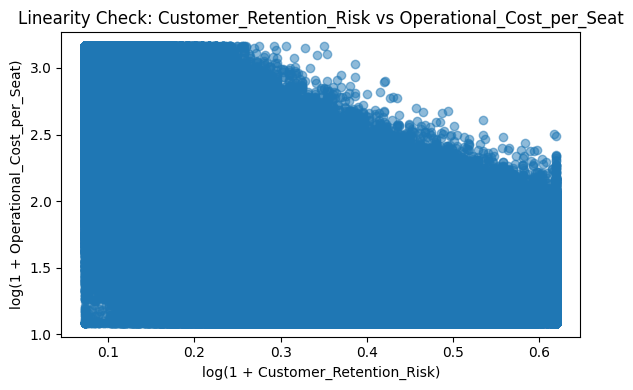

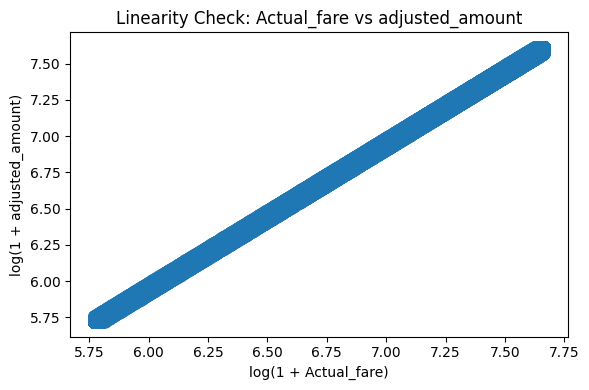

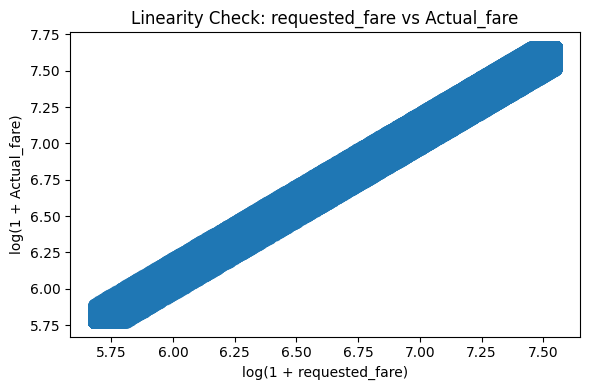

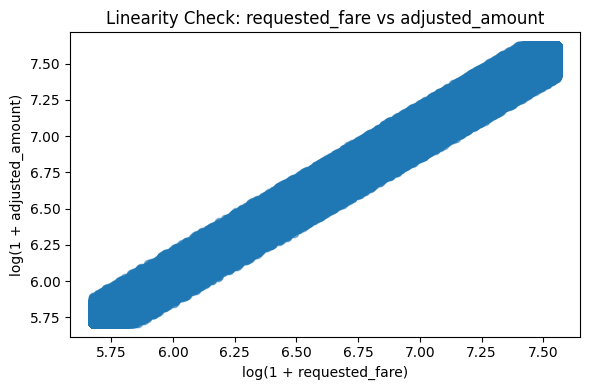

...

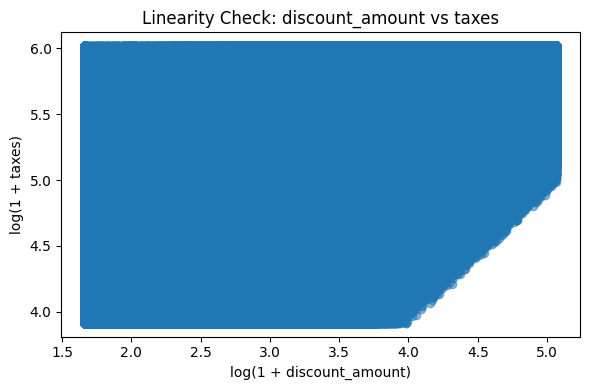

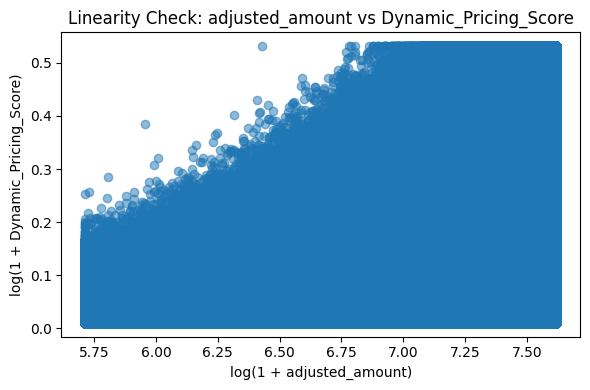

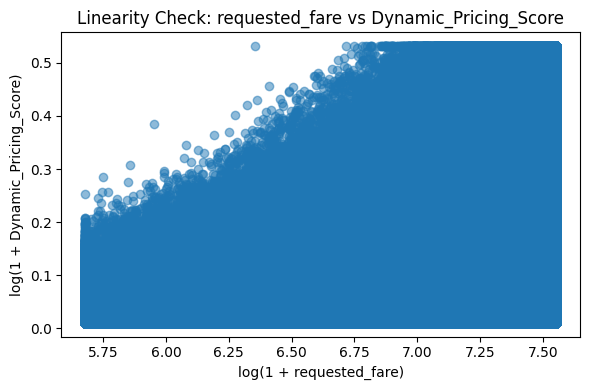

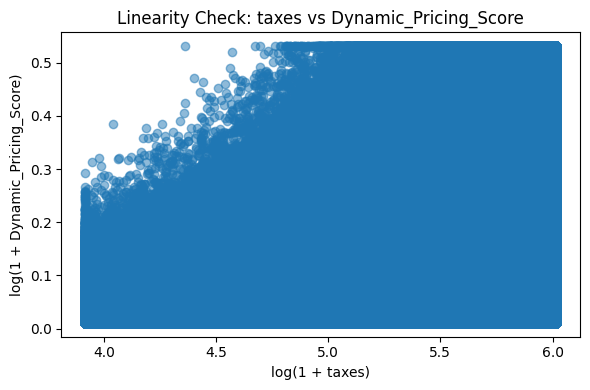

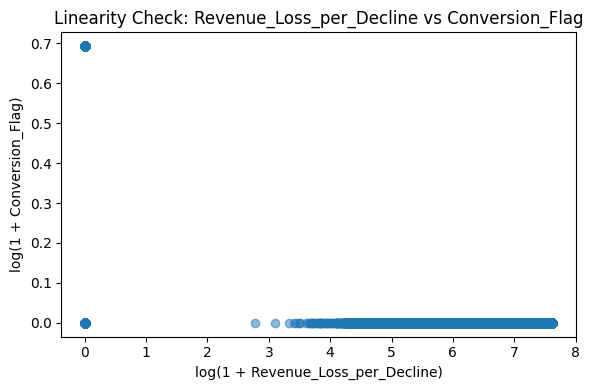

In [ ]:
# Plot top 25 elasticities and scatter plots
plot_top_elasticities(impact_nn_df, df_imputed, top_n=25)

Strong positive elasticities in fare-related variables (e.g., fares to taxes/adjustments) indicate tight linkages in pricing. Retention risk highly sensitive to profitability and costs. Non-met assumptions suggest cautious interpretation; consider robust methods for future analysis.

# **Insight 1: Retention Risk [NUM-NUM ANALYSIS]**

* Managing high-risk segments can unlock a ~255% lift in profitability and ~223% reduction in costs.
* Pilot targeted loyalty and retention programs for these high-return customers while safeguarding against churn.

# Num-Cat Impact Analysis (used parallel computing)

In [ ]:
import numpy as np
import pandas as pd
from sklearn.linear_model import LinearRegression
from scipy.stats import pearsonr, fligner, normaltest
from statsmodels.regression.linear_model import OLS
from statsmodels.tools import add_constant
from joblib import Parallel, delayed
import os
import psutil
from tqdm import tqdm
from scipy.stats.mstats import winsorize

def compute_num_cat_elasticities(df, num_cat_pair, top_n=10, n_jobs=2, winsorize_limits=(0.05, 0.05), use_log_transform=True, debug_pair=None):
    """
    Compute OLS elasticities (or absolute changes) for numeric-categorical pairs using LinearRegression on winsorized numeric data.
    Groups categorical variables into top 10 frequent categories (others as 'Other') and selects the median category as baseline.
    Includes confidence intervals, checks OLS assumptions, and adds assumption status. Saves results to pickle.

    Parameters:
    df (pd.DataFrame): Input DataFrame (e.g., df_imputed).
    num_cat_pair (list): List of tuples with column pairs (numeric, categorical).
    top_n (int): Number of top pairs to print and check assumptions for (default: 10).
    n_jobs (int): Number of parallel jobs (default: 2).
    winsorize_limits (tuple): Lower and upper percentile limits for winsorization (default: (0.05, 0.05)).
    use_log_transform (bool): Whether to apply log(1 + x) to numeric column for elasticity (default: True).
    debug_pair (tuple): If specified, process only this (num_col, cat_col) pair sequentially for debugging.

    Returns:
    pd.DataFrame: DataFrame with elasticity (or absolute change) results, assumption checks, and status.
    """
    # Validate input data
    print("Validating input data...", flush=True)
    print(f"DataFrame rows: {len(df)}", flush=True)
    print(f"Number of pairs: {len(num_cat_pair)}", flush=True)
    if len(df) > 1000000:
        print("Warning: Large DataFrame (>1M rows) may cause memory issues.", flush=True)
    if len(num_cat_pair) > 100:
        print("Warning: Large number of pairs (>100) may increase computation time.", flush=True)
    non_numeric_cols = [col for col in df.columns if col in [pair[0] for pair in num_cat_pair] and not pd.api.types.is_numeric_dtype(df[col])]
    non_categorical_cols = [col for col in df.columns if col in [pair[1] for pair in num_cat_pair] and pd.api.types.is_numeric_dtype(df[col])]
    if non_numeric_cols:
        print(f"Warning: Non-numeric columns detected in numeric position: {non_numeric_cols}", flush=True)
    if non_categorical_cols:
        print(f"Warning: Numeric columns detected in categorical position: {non_categorical_cols}", flush=True)
        print("Converting numeric columns in categorical position to categorical...", flush=True)
        df = df.copy()
        for col in non_categorical_cols:
            df[col] = df[col].astype(str)

    # Validate column existence
    invalid_pairs = [(num_col, cat_col) for num_col, cat_col in num_cat_pair if num_col not in df.columns or cat_col not in df.columns]
    if invalid_pairs:
        print(f"Error: Invalid column names in pairs: {invalid_pairs}", flush=True)
        return pd.DataFrame(columns=['pair', 'category', 'elasticity_pct' if use_log_transform else 'coefficient',
                                    'CI_lo_pct' if use_log_transform else 'CI_lo', 'CI_hi_pct' if use_log_transform else 'CI_hi',
                                    'baseline', 'linearity_corr', 'dagostino_p', 'fligner_p', 'assumptions_met', 'abs_elasticity'])

    def process_pair(num_col, cat_col):
        print(f"\nProcessing pair ({num_col}, {cat_col})...", flush=True)
        try:
            # Check memory usage
            mem = psutil.virtual_memory().available / (1024**3)
            if mem < 1.0:
                print(f"Warning: Low memory ({mem:.2f} GB) for pair ({num_col}, {cat_col}).", flush=True)

            # Check data types
            print(f"Pair ({num_col}, {cat_col}): Numeric column type: {df[num_col].dtype}, Categorical column type: {df[cat_col].dtype}", flush=True)

            # Drop missing values
            sub = df[[num_col, cat_col]].dropna()
            print(f"Pair ({num_col}, {cat_col}): {len(sub)} rows after dropping missing values.", flush=True)
            if len(sub) < 2:
                print(f"Warning: Pair ({num_col}, {cat_col}) has fewer than 2 rows after dropna. Skipping.", flush=True)
                return {
                    'pair': (num_col, cat_col),
                    'elasticity_results': [],
                    'assumptions_met': False
                }

            # Check for NaN values
            if sub[num_col].isna().any() or sub[cat_col].isna().any():
                print(f"Warning: Pair ({num_col}, {cat_col}) contains NaN values after dropna. Skipping.", flush=True)
                return {
                    'pair': (num_col, cat_col),
                    'elasticity_results': [],
                    'assumptions_met': False
                }

            # Validate categorical column
            if pd.api.types.is_numeric_dtype(sub[cat_col]):
                print(f"Pair ({num_col}, {cat_col}): Converting numeric categorical column to string.", flush=True)
                sub[cat_col] = sub[cat_col].astype(str)
            print(f"Pair ({num_col}, {cat_col}): {sub[cat_col].nunique()} unique categories before grouping.", flush=True)
            print(f"Pair ({num_col}, {cat_col}): Category counts:\n{sub[cat_col].value_counts().head(10)}", flush=True)

            # Group categorical variable into top 10 frequent categories, others as 'Other'
            if sub[cat_col].nunique() > 10:
                top_categories = sub[cat_col].value_counts().index[:10]
                sub[cat_col] = sub[cat_col].apply(lambda x: x if x in top_categories else 'Other')
            print(f"Pair ({num_col}, {cat_col}): {sub[cat_col].nunique()} unique categories after grouping.", flush=True)

            # Check variance of numeric column
            num_var = sub[num_col].var()
            num_unique = sub[num_col].nunique()
            print(f"Pair ({num_col}, {cat_col}): Numeric column variance: {num_var}, unique values: {num_unique}", flush=True)
            if pd.isna(num_var) or num_var < 1e-6 or num_unique <= 1:
                print(f"Warning: Pair ({num_col}, {cat_col}) has invalid numeric column (var={num_var}, unique={num_unique}). Skipping.", flush=True)
                return {
                    'pair': (num_col, cat_col),
                    'elasticity_results': [],
                    'assumptions_met': False
                }

            # Check number of categories
            if sub[cat_col].nunique() < 2:
                print(f"Warning: Pair ({num_col}, {cat_col}) has fewer than 2 categories after grouping. Skipping.", flush=True)
                return {
                    'pair': (num_col, cat_col),
                    'elasticity_results': [],
                    'assumptions_met': False
                }

            # Winsorize numeric data
            sub[num_col] = winsorize(sub[num_col], limits=winsorize_limits)

            # Select baseline: category with median numeric value
            median_values = sub.groupby(cat_col, observed=True)[num_col].median()
            print(f"Pair ({num_col}, {cat_col}): Median values per category: {median_values.to_dict()}", flush=True)
            if median_values.empty or median_values.nunique() == 0 or median_values.isna().all():
                print(f"Warning: Pair ({num_col}, {cat_col}) has no valid median values for baseline selection. Skipping.", flush=True)
                return {
                    'pair': (num_col, cat_col),
                    'elasticity_results': [],
                    'assumptions_met': False
                }
            baseline = median_values.idxmin() if median_values.nunique() == 1 else median_values.sort_values().index[len(median_values)//2]
            print(f"Pair ({num_col}, {cat_col}): Selected baseline category: {baseline}", flush=True)

            # Create dummy variables (force int64 to avoid boolean dtype)
            dummies = pd.get_dummies(sub[cat_col], prefix=cat_col, drop_first=False, dtype=np.int64)
            print(f"Pair ({num_col}, {cat_col}): Dummy columns created: {list(dummies.columns)}", flush=True)
            baseline_col = f"{cat_col}_{baseline}"
            if baseline_col not in dummies.columns:
                print(f"Error: Baseline column {baseline_col} not found in dummy variables. Available columns: {list(dummies.columns)}", flush=True)
                return {
                    'pair': (num_col, cat_col),
                    'elasticity_results': [],
                    'assumptions_met': False
                }
            dummies = dummies.drop(baseline_col, axis=1)
            print(f"Pair ({num_col}, {cat_col}): Dummy columns after dropping baseline: {list(dummies.columns)}", flush=True)
            if dummies.empty or dummies.shape[1] == 0:
                print(f"Warning: Pair ({num_col}, {cat_col}) produced no valid dummy variables (categories: {sub[cat_col].unique()}). Skipping.", flush=True)
                return {
                    'pair': (num_col, cat_col),
                    'elasticity_results': [],
                    'assumptions_met': False
                }

            # Preserve original sub DataFrame for assumption checks
            sub_original = sub.copy()
            sub = pd.concat([sub[[num_col]], dummies], axis=1)

            # Prepare data for regression
            lx = np.log1p(sub[num_col].values) if use_log_transform else sub[num_col].values
            lx = lx.astype(np.float64)  # Ensure numeric type
            ly = sub.drop(num_col, axis=1).values.astype(np.float64)  # Ensure numeric type
            print(f"Pair ({num_col}, {cat_col}): lx shape: {lx.shape}, ly shape: {ly.shape}, ly columns: {list(sub.drop(num_col, axis=1).columns)}", flush=True)

            # Check for constant lx
            if np.var(lx) < 1e-6:
                print(f"Warning: Pair ({num_col}, {cat_col}) has near-constant dependent variable (var={np.var(lx)}). Skipping.", flush=True)
                return {
                    'pair': (num_col, cat_col),
                    'elasticity_results': [],
                    'assumptions_met': False
                }

            # Fit OLS model
            model = LinearRegression()
            model.fit(ly, lx)
            slopes = model.coef_
            print(f"Pair ({num_col}, {cat_col}): Regression coefficients: {slopes}", flush=True)

            # Compute confidence intervals
            ly_with_const = add_constant(ly, has_constant='add')
            ols_model = OLS(lx, ly_with_const).fit()
            se = ols_model.bse[1:]  # Exclude intercept
            ci = 1.96 * se
            ci_lo = slopes - ci
            ci_hi = slopes + ci

            # Check OLS assumptions
            residuals = lx - model.predict(ly).astype(np.float64)  # Ensure compatible types
            linearity_corr, _ = pearsonr(model.predict(ly), lx) if len(lx) >= 2 and np.var(model.predict(ly)) > 1e-6 else (np.nan, np.nan)
            dagostino_p = normaltest(residuals)[1] if len(residuals) >= 8 else np.nan
            fligner_p = np.nan
            # Use number of dummy columns to check if homoscedasticity test is feasible
            if dummies.shape[1] >= 1:  # At least one dummy variable (implies >= 2 categories)
                residual_groups = [residuals[sub_original[cat_col] == cat] for cat in sub_original[cat_col].unique() if len(residuals[sub_original[cat_col] == cat]) > 0]
                if len(residual_groups) >= 2:
                    fligner_p = fligner(*residual_groups)[1]
            linearity_ok = abs(linearity_corr) > 0.7 if not np.isnan(linearity_corr) else False
            normality_ok = dagostino_p > 0.05 if not np.isnan(dagostino_p) else False
            homoscedasticity_ok = fligner_p > 0.05 if not np.isnan(fligner_p) else False
            assumptions_met = linearity_ok and normality_ok and homoscedasticity_ok
            print(f"Pair ({num_col}, {cat_col}): Assumptions - Linearity: {linearity_corr:.3f}, Normality p: {dagostino_p:.3f}, Homoscedasticity p: {fligner_p:.3f}, Met: {assumptions_met}", flush=True)

            # Compile results
            elasticity_results = []
            for i, col in enumerate(dummies.columns):
                elasticity_results.append({
                    'category': col.replace(f"{cat_col}_", ""),
                    'elasticity_pct' if use_log_transform else 'coefficient': slopes[i] * (100 if use_log_transform else 1),
                    'CI_lo_pct' if use_log_transform else 'CI_lo': ci_lo[i] * (100 if use_log_transform else 1),
                    'CI_hi_pct' if use_log_transform else 'CI_hi': ci_hi[i] * (100 if use_log_transform else 1),
                    'baseline': baseline,
                    'linearity_corr': linearity_corr,
                    'dagostino_p': dagostino_p,
                    'fligner_p': fligner_p,
                    'assumptions_met': assumptions_met
                })
            print(f"Pair ({num_col}, {cat_col}): Successfully generated {len(elasticity_results)} results.", flush=True)

            return {
                'pair': (num_col, cat_col),
                'elasticity_results': elasticity_results,
                'assumptions_met': assumptions_met
            }
        except Exception as e:
            import traceback
            print(f"Error processing pair ({num_col}, {cat_col}): {str(e)}", flush=True)
            print(f"Traceback: {traceback.format_exc()}", flush=True)
            return {
                'pair': (num_col, cat_col),
                'elasticity_results': [],
                'assumptions_met': False
            }

    # Print explanation
    print("Computing OLS elasticities for numeric-categorical pairs using LinearRegression on winsorized" +
          (" log-transformed" if use_log_transform else "") + " numeric data.", flush=True)
    print("Categorical variables are grouped into top 10 frequent categories (others as 'Other').", flush=True)
    print("Baseline is the category with the median numeric value for % change calculations.", flush=True)
    print("Confidence intervals (95%) are computed using OLS standard errors.", flush=True)
    print("OLS assumptions are checked: linearity (correlation), normality (D’Agostino-Pearson), homoscedasticity (Fligner-Killeen).", flush=True)

    # Debug mode: Process a single pair sequentially
    if debug_pair:
        print(f"Debug mode: Processing only pair {debug_pair}...", flush=True)
        result = process_pair(*debug_pair)
        impact_nc = [result]
    else:
        # Parallel computation
        print("Starting parallel processing...", flush=True)
        impact_nc = Parallel(n_jobs=n_jobs)(
            delayed(process_pair)(num_col, cat_col) for num_col, cat_col in tqdm(num_cat_pair, total=len(num_cat_pair), desc="Processing pairs")
        )

    # Create DataFrame
    results = []
    for res in impact_nc:
        if not res['elasticity_results']:
            print(f"Pair {res['pair']} skipped: No elasticity results generated.", flush=True)
            continue
        for er in res['elasticity_results']:
            results.append({
                'pair': res['pair'],
                'category': er['category'],
                'elasticity_pct' if use_log_transform else 'coefficient': er['elasticity_pct' if use_log_transform else 'coefficient'],
                'CI_lo_pct' if use_log_transform else 'CI_lo': er['CI_lo_pct' if use_log_transform else 'CI_lo'],
                'CI_hi_pct' if use_log_transform else 'CI_hi': er['CI_hi_pct' if use_log_transform else 'CI_hi'],
                'baseline': er['baseline'],
                'linearity_corr': er['linearity_corr'],
                'dagostino_p': er['dagostino_p'],
                'fligner_p': er['fligner_p'],
                'assumptions_met': er['assumptions_met']
            })
    if not results:
        print("Warning: No valid elasticity results were generated. Returning empty DataFrame.", flush=True)
        return pd.DataFrame(columns=['pair', 'category', 'elasticity_pct' if use_log_transform else 'coefficient',
                                    'CI_lo_pct' if use_log_transform else 'CI_lo', 'CI_hi_pct' if use_log_transform else 'CI_hi',
                                    'baseline', 'linearity_corr', 'dagostino_p', 'fligner_p', 'assumptions_met', 'abs_elasticity'])

    impact_nc_df = pd.DataFrame(results)
    impact_nc_df['abs_elasticity'] = impact_nc_df['elasticity_pct' if use_log_transform else 'coefficient'].abs()

    # Print top N results
    top_df = impact_nc_df.sort_values('abs_elasticity', ascending=False).head(top_n)
    print(f"\nTop {top_n} Elasticities (Numeric-Categorical):", flush=True)
    print(top_df[['pair', 'category', 'baseline', 'elasticity_pct' if use_log_transform else 'coefficient',
                  'CI_lo_pct' if use_log_transform else 'CI_lo', 'CI_hi_pct' if use_log_transform else 'CI_hi',
                  'linearity_corr', 'dagostino_p', 'fligner_p', 'assumptions_met']].to_string(index=False), flush=True)
    print("\nOLS Assumption Checks:", flush=True)
    print("- Linearity: Pearson correlation > 0.7 indicates linear relationship.", flush=True)
    print("- Normality: D’Agostino-Pearson p-value > 0.05 indicates normal residuals.", flush=True)
    print("- Homoscedasticity: Fligner-Killeen p-value > 0.05 indicates equal variances.", flush=True)
    print("- Assumptions Met: True if all checks pass, False otherwise.", flush=True)

    # Save to pickle
    output_dir = '/content/drive/MyDrive/infinitysoft/'
    os.makedirs(output_dir, exist_ok=True)
    impact_nc_df.to_pickle(os.path.join(output_dir, 'impact_nc_df.pkl'))

    return impact_nc_df

def plot_top_num_cat_elasticities(impact_nc_df, df, top_n=10):
    """
    Plot top N elasticities and box plots to visualize numeric-categorical relationships.

    Parameters:
    impact_nc_df (pd.DataFrame): DataFrame with elasticity results.
    df (pd.DataFrame): Original DataFrame for box plots.
    top_n (int): Number of top pairs to plot (default: 10).
    """
    # Sort by absolute elasticity and get top N
    top_df = impact_nc_df.sort_values('abs_elasticity', ascending=False).head(top_n)

    # Plot elasticities
    plt.figure(figsize=(8, 5))
    sns.barplot(
        data=top_df,
        y=top_df.apply(lambda x: f"{x['pair'][0]} vs {x['pair'][1]} ({x['category']})", axis=1),
        x='elasticity_pct',
        palette='vlag'
    )
    plt.axvline(0, color='k', linewidth=1)
    plt.xlabel('Elasticity (%ΔY per Category vs Baseline)')
    plt.ylabel('Numeric–Categorical Pair (Category)')
    plt.title(f'Top {top_n} OLS Elasticities (Numeric-Categorical)')
    plt.tight_layout()
    plt.show()

    # Plot box plots for visualization
    print("Generating box plots to visualize numeric-categorical relationships...")
    unique_pairs = top_df['pair'].unique()[:top_n]
    for pair in unique_pairs:
        num_col, cat_col = pair
        sub = df[[num_col, cat_col]].dropna()
        if len(sub) < 2:
            continue
        # Group categorical variable
        if sub[cat_col].nunique() > 10:
            top_categories = sub[cat_col].value_counts().index[:10]
            sub[cat_col] = sub[cat_col].apply(lambda x: x if x in top_categories else 'Other')
        # Winsorize numeric data
        sub[num_col] = winsorize(sub[num_col], limits=(0.05, 0.05))
        plt.figure(figsize=(6, 4))
        sns.boxplot(x=cat_col, y=num_col, data=sub)
        plt.xlabel(cat_col)
        plt.ylabel(num_col)
        plt.title(f'Relationship: {num_col} vs {cat_col}')
        plt.xticks(rotation=45)
        plt.tight_layout()
        plt.show()

# Result of NUM-CAT Impact Analysis

In [ ]:
# Compute and Print Elasticities
# Assuming df_imputed and num_cat_pair are defined
impact_nc_df = compute_num_cat_elasticities(df_imputed, num_cat_pair, top_n=len(num_cat_pair), n_jobs=-1, winsorize_limits=(0.05, 0.05), use_log_transform=True)

Validating input data...
DataFrame rows: 200000
Number of pairs: 40
Converting numeric columns in categorical position to categorical...
Computing OLS elasticities for numeric-categorical pairs using LinearRegression on winsorized log-transformed numeric data.
Categorical variables are grouped into top 10 frequent categories (others as 'Other').
Baseline is the category with the median numeric value for % change calculations.
Confidence intervals (95%) are computed using OLS standard errors.
OLS assumptions are checked: linearity (correlation), normality (D’Agostino-Pearson), homoscedasticity (Fligner-Killeen).
Starting parallel processing...


Processing pairs: 100%|██████████| 40/40 [00:55<00:00,  1.38s/it]


Pair ('reason_for_decline_sentiment', 'aircraft_type') skipped: No elasticity results generated.
Pair ('reason_for_decline_sentiment', 'agent_response_status') skipped: No elasticity results generated.
Pair ('reason_for_decline_sentiment', 'reason_for_decline_was_missing') skipped: No elasticity results generated.

Top 40 Elasticities (Numeric-Categorical):
                                                       pair       category       baseline  elasticity_pct  CI_lo_pct  CI_hi_pct  linearity_corr  dagostino_p     fligner_p  assumptions_met
      (requested_pax_count, Customer_Segment_Profitability)            Low         Medium      -49.184952 -49.663320 -48.706584        0.577645          0.0  0.000000e+00            False
       (Route_Demand_Index, Customer_Segment_Profitability)            Low         Medium      -48.732289 -49.359783 -48.104795        0.471849          0.0  0.000000e+00            False
              (Actual_fare, Customer_Segment_Profitability)            Low  

# Key Numerical–Categorical Insights (% Changes)

- **Customer Segment Profitability vs. Metrics**  
  - Low vs. Medium segment:  
    - 49.2% fewer passengers/bookings (requested_pax_count)  
    - 48.7% lower route demand (Route_Demand_Index)  
    - 48.3% lower base fares (Actual_fare)  
    - 48.3% lower net revenue (adjusted_amount)  
    - 47.9% lower list prices (requested_fare)  
    - 47.0% lower tax receipts (taxes)  
    - 45.5% smaller discounts given (discount_amount)  
    - 42.1% lower settlements collected (settlement_amount)  
    - 25.0% lower revenue loss on declines (Revenue_Loss_per_Decline)  
    - 20.0% higher per-seat costs (Operational_Cost_per_Seat)  

  - High vs. Medium segment:  
    - 38.7% more passengers/bookings  
    - 38.5% higher route demand  
    - 40.3% higher base fares  
    - 40.2% higher net revenue  
    - 39.4% higher list prices  
    - 39.6% higher tax receipts  
    - 36.8% larger discounts  
    - 32.2% higher settlements collected  
    - 18.8% greater revenue loss on declines  
    - 12.4% lower per-seat costs  

- **Booking Conversion (Ticketed vs. Not Honoured)**  
  - Ticketed bookings show a 46.0% higher Conversion_Flag value than Not Honoured requests, underlining the revenue boost from successful ticketing.

- **Sentiment & Remarks Completeness**  
  - Missing user remarks → 13.1% lower user sentiment score  
  - Missing airline remarks → 10.5% lower airline sentiment score  

- **City-Level Variations**  
  - Port Saraburgh vs. Lake Alanshire:  
    - 10.2% higher passenger counts  
    - 11.6% lower operational cost per seat  
  - Lake Alanbury vs. Lake Alanshire: 7.3% higher per-seat costs  
  - Boyleland vs. Geneburgh: 6.7% higher passenger counts  
  - Geneburgh vs. Lake Alanshire: 5.8% lower per-seat costs  

- **Booking Lead Time Efficiency**  
  - Ticketed vs. Not Honoured requests: 6.3% higher lead-time efficiency for successfully paid bookings.



  ![NUM-CAT](https://drive.google.com/uc?export=view&id=1wWAL_03hbc0XEuQe32M6BCsD0c_owFq-)

/tmp/ipython-input-819084652.py:321: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(


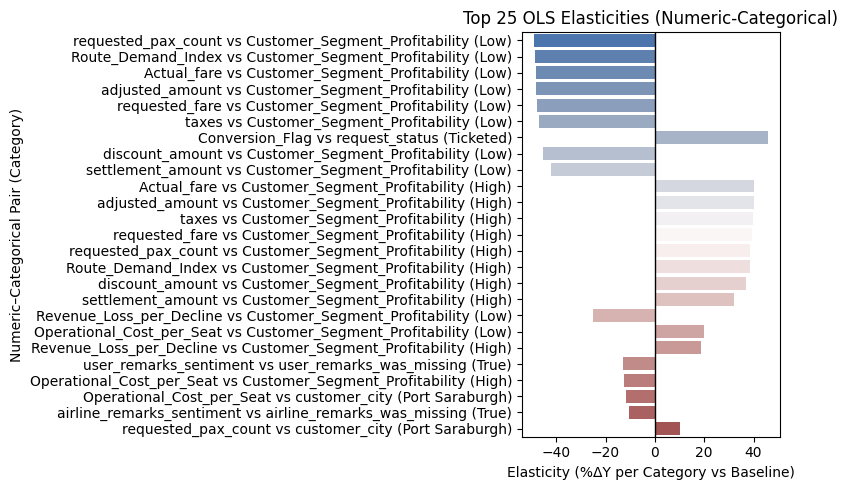

Generating box plots to visualize numeric-categorical relationships...


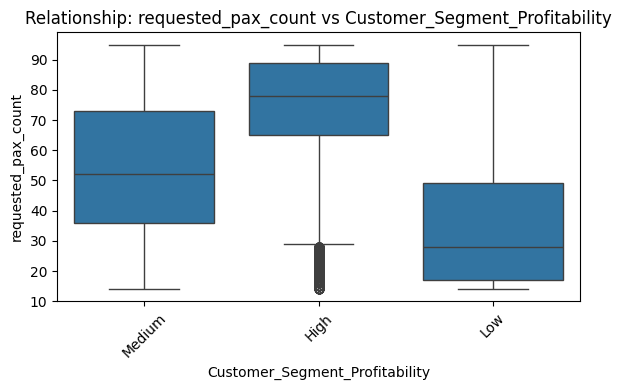

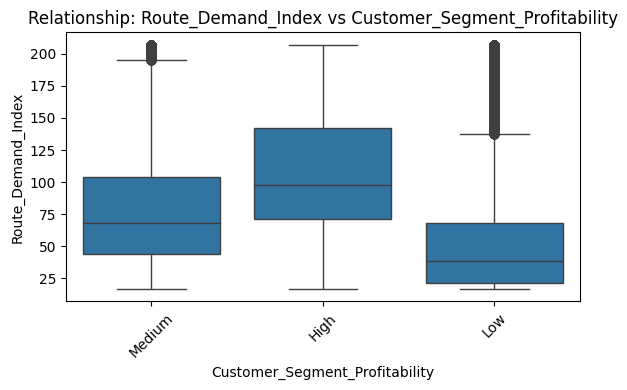

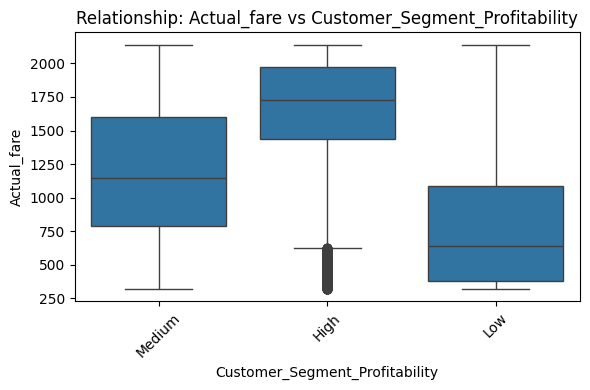

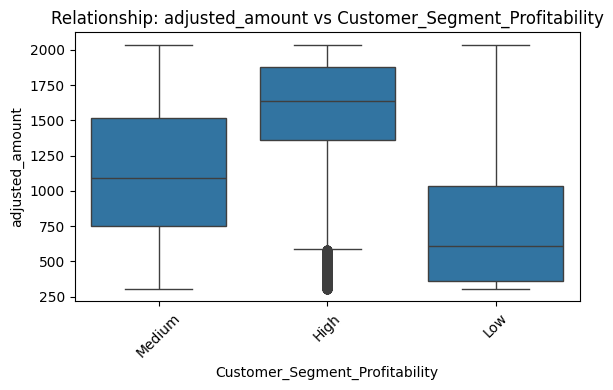

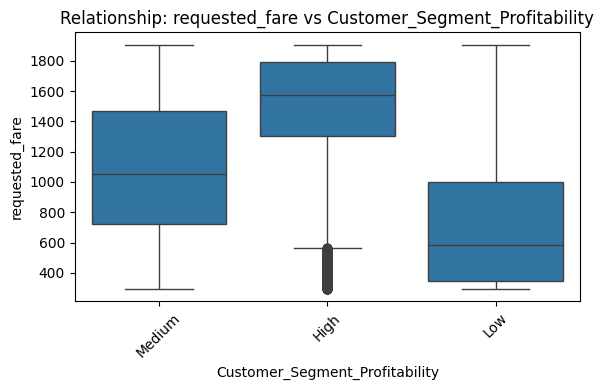

...

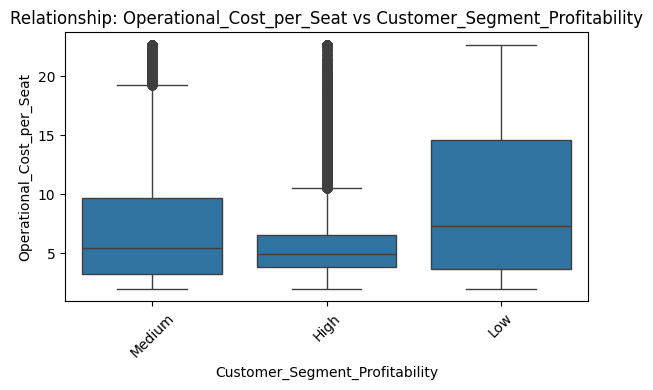

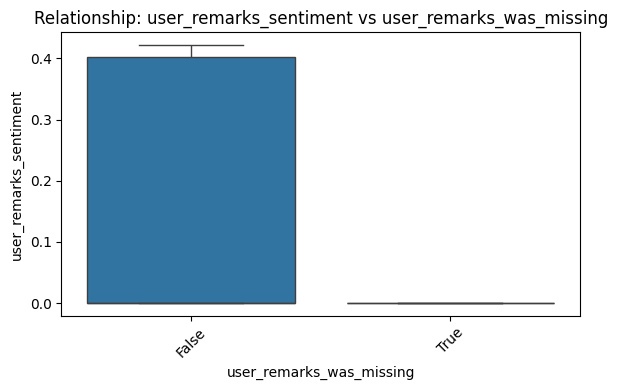

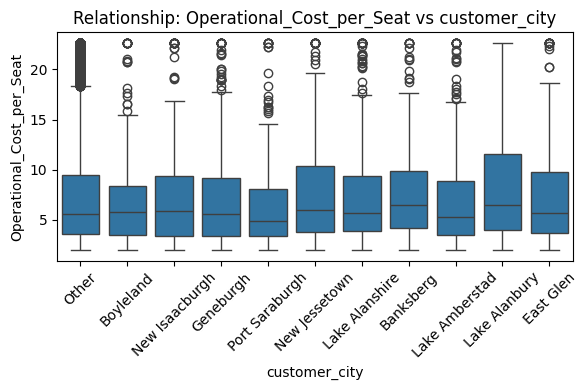

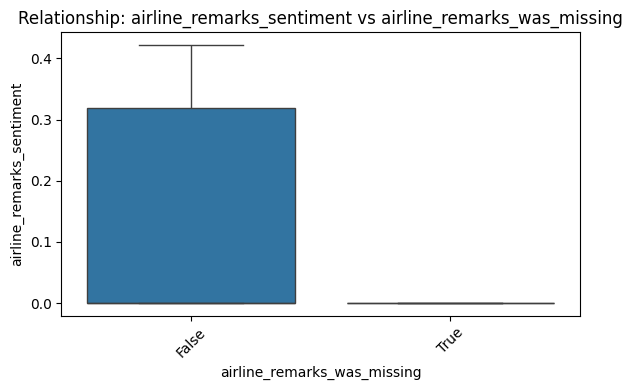

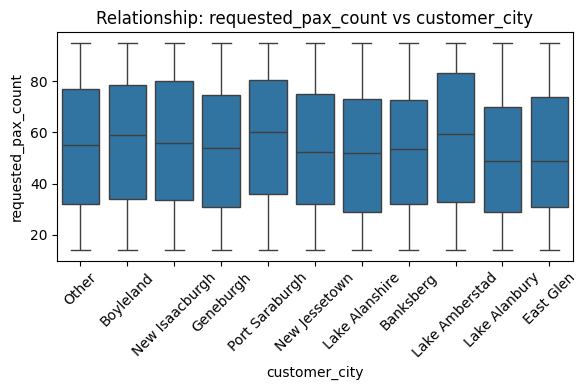

In [ ]:
# Plot top 25 elasticities and box plots
plot_top_num_cat_elasticities(impact_nc_df, df_imputed, top_n=25)

Customer Segment Profitability dominates large elasticities (e.g., low/high vs. medium impacts fares, pax, demand). Non-met assumptions suggest results are indicative; use robust models for precision.

# Insight 2: Customer Tier Profitability
*  High-tier customers deliver ~40% more revenue and incur ~12% lower costs than Medium-tier; Low-tier segments generate ~48% less revenue and ~20% higher costs.
*  Focus on upselling and premium services for top-tier, and optimize or de-prioritize Low-tier offerings.

# Cat-Cat Impact Analysis (used parallel computing)

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import chi2_contingency
from joblib import Parallel, delayed
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import pickle
import os

def compute_cramers_v(df, cat1, cat2, top_n=10):
    """
    Compute Cramér's V for a categorical-categorical pair, grouping categories to top_n.
    Returns pair, Cramér's V, and interpretation.
    """
    try:
        # Create a copy to avoid modifying original DataFrame
        sub = df[[cat1, cat2]].copy()

        # Convert numeric categorical columns to string
        for col in [cat1, cat2]:
            if pd.api.types.is_numeric_dtype(sub[col]):
                print(f"Converting {col} to categorical (string) for pair ({cat1}, {cat2})")
                sub[col] = sub[col].astype(str)

        # Group categories into top_n frequent, others as 'Other'
        for col in [cat1, cat2]:
            if sub[col].nunique() > top_n:
                top_categories = sub[col].value_counts().index[:top_n]
                sub[col] = sub[col].apply(lambda x: x if x in top_categories else 'Other')

        # Drop missing values
        sub = sub.dropna()
        if len(sub) < 2:
            print(f"Pair ({cat1}, {cat2}): Insufficient data after dropna ({len(sub)} rows). Skipping.")
            return {
                'pair': (cat1, cat2),
                'cramers_v': np.nan,
                'association': 'Invalid',
                'n_observations': len(sub),
                'cat1_nunique': sub[cat1].nunique(),
                'cat2_nunique': sub[cat2].nunique()
            }

        # Create contingency table
        contingency_table = pd.crosstab(sub[cat1], sub[cat2])
        n = contingency_table.sum().sum()
        chi2, _, _, _ = chi2_contingency(contingency_table)

        # Compute Cramér's V
        min_dim = min(contingency_table.shape) - 1
        cramers_v = np.sqrt(chi2 / (n * min_dim)) if min_dim > 0 and n > 0 else np.nan

        # Interpret association strength
        if pd.isna(cramers_v):
            association = 'Invalid'
        elif cramers_v < 0.1:
            association = 'Negligible'
        elif cramers_v < 0.3:
            association = 'Weak'
        elif cramers_v < 0.5:
            association = 'Moderate'
        else:
            association = 'Strong'

        print(f"Pair ({cat1}, {cat2}): Cramér's V = {cramers_v:.3f}, Association = {association}, "
              f"Observations = {n}, Categories ({cat1}: {sub[cat1].nunique()}, {cat2}: {sub[cat2].nunique()})")

        return {
            'pair': (cat1, cat2),
            'cramers_v': cramers_v,
            'association': association,
            'n_observations': n,
            'cat1_nunique': sub[cat1].nunique(),
            'cat2_nunique': sub[cat2].nunique()
        }

    except Exception as e:
        print(f"Error processing pair ({cat1}, {cat2}): {str(e)}")
        return {
            'pair': (cat1, cat2),
            'cramers_v': np.nan,
            'association': 'Error',
            'n_observations': 0,
            'cat1_nunique': 0,
            'cat2_nunique': 0
        }

def compute_cat_cat_associations(df, cat_cat_pairs, top_n=10, n_jobs=2, output_path='/content/drive/MyDrive/infinitysoft/cramers_v_results.pkl'):
    """
    Compute Cramér's V for all cat-cat pairs in parallel and save to pickle.
    Returns a DataFrame with results.
    """
    print("Validating input data...")
    print(f"DataFrame rows: {len(df)}")
    print(f"Number of cat-cat pairs: {len(cat_cat_pairs)}")

    # Validate pairs
    valid_pairs = [(cat1, cat2) for cat1, cat2 in cat_cat_pairs
                   if cat1 in df.columns and cat2 in df.columns]
    if len(valid_pairs) < len(cat_cat_pairs):
        print(f"Warning: {len(cat_cat_pairs) - len(valid_pairs)} pairs have invalid columns.")

    # Check for numeric categorical columns
    numeric_cats = [col for col in set(cat1 for cat1, _ in valid_pairs) |
                    set(cat2 for _, cat2 in valid_pairs)
                    if pd.api.types.is_numeric_dtype(df[col])]
    if numeric_cats:
        print(f"Warning: Numeric columns detected in categorical position: {numeric_cats}")
        print("Converting numeric columns in categorical position to categorical...")

    print(f"Computing Cramér's V for {len(valid_pairs)} cat-cat pairs...")

    # Suppress warnings for chi2_contingency
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        results = Parallel(n_jobs=n_jobs)(
            delayed(compute_cramers_v)(df, cat1, cat2, top_n)
            for cat1, cat2 in valid_pairs
        )

    # Create results DataFrame
    results_df = pd.DataFrame(results)
    results_df['pair_str'] = results_df['pair'].apply(lambda x: f"{x[0]} vs {x[1]}")
    results_df = results_df.sort_values('cramers_v', ascending=False)

    # Print results
    print("\nCramér's V Results (Sorted by Strength):")
    print(results_df[['pair_str', 'cramers_v', 'association', 'n_observations',
                     'cat1_nunique', 'cat2_nunique']].to_string(index=False))

    # Save to pickle
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    with open(output_path, 'wb') as f:
        pickle.dump(results_df, f)
    print(f"\nResults saved to {output_path}")

    return results_df

def plot_cramers_v_heatmap(results_df=None, pickle_path='/content/drive/MyDrive/infinitysoft/cramers_v_results.pkl'):
    """
    Plot a heatmap of Cramér's V values from a DataFrame or pickle file.
    """
    if results_df is None:
        try:
            with open(pickle_path, 'rb') as f:
                results_df = pickle.load(f)
            print(f"Loaded results from {pickle_path}")
        except FileNotFoundError:
            print(f"Error: Pickle file not found at {pickle_path}")
            return

    # Extract unique columns
    unique_cols = list(set(col for pair in results_df['pair'] for col in pair))
    if len(unique_cols) < 2:
        print("Error: Insufficient columns for heatmap (need at least 2 unique columns)")
        return

    # Create pivot table for heatmap
    pivot_table = pd.DataFrame(np.nan, index=unique_cols, columns=unique_cols)
    for _, row in results_df.iterrows():
        cat1, cat2 = row['pair']
        pivot_table.loc[cat1, cat2] = row['cramers_v']
        pivot_table.loc[cat2, cat1] = row['cramers_v']  # Symmetric matrix

    # Plot heatmap
    plt.figure(figsize=(10, 8))
    sns.heatmap(pivot_table, annot=True, fmt=".3f", cmap="YlGnBu",
                cbar_kws={'label': "Cramér's V"}, square=True)
    plt.title("Cramér's V Heatmap for Categorical-Categorical Pairs")
    plt.tight_layout()
    plt.show()


# Result of CAT-CAT Impact Analysis

In [ ]:
# Compute Cramér's V and save results
results_df = compute_cat_cat_associations(df_imputed, cat_cat_pair, top_n=10, n_jobs=-1)

Validating input data...
DataFrame rows: 200000
Number of cat-cat pairs: 14
Computing Cramér's V for 14 cat-cat pairs...

Cramér's V Results (Sorted by Strength):
                                                 pair_str  cramers_v association  n_observations  cat1_nunique  cat2_nunique
                            origin_airport_code vs Region   0.195780        Weak          200000             8            11
                       destination_airport_code vs Region   0.194447        Weak          200000             8            11
                                      Region vs trip_type   0.011082  Negligible          200000            11             2
requested_flight_number vs Customer_Segment_Profitability   0.010914  Negligible          200000            11             3
                                          Region vs cabin   0.009687  Negligible          200000            11             3
                    requested_flight_number vs pnr_status   0.009612  Negligible       

# Key Categorical–Categorical Association Insights

- **Airport–Region Mapping**  
  - Origin Airport Code vs. Region: Cramér’s V ≈ 0.196 (weak association)  
  - Destination Airport Code vs. Region: Cramér’s V ≈ 0.194 (weak association)  
  These reflect the expected geographic grouping of airports into regions but aren’t strong enough to replace Region entirely.

- **Negligible Associations Across Other Pairs**  
  - All remaining 12 category–category comparisons yield V < 0.02 (“negligible”), including:  
    - Region vs. trip_type and vs. cabin  
    - Customer_Segment_Profitability vs. request_status  
    - Flight number vs. PNR status, Merchant_id, or segment  
    - Country code vs. customer_country or segment  
  This means these categorical dimensions behave largely independently.

## Business Implications

- You can safely include most categorical features together in models without worrying about multicollinearity.  
- Only airport codes and Region share a discernible pattern—consider deriving Region from airport where helpful, but keep both if you need granular airport-level insights.  
- Since segment, status, cabin, trip type, and flight number show negligible overlap, tailor marketing and operational rules on each axis separately (e.g., design segment-based promotions irrespective of cabin class).


![CAT-CAT](https://drive.google.com/uc?export=view&id=1ZglGOEAFg4eEFNESsfh6XC5tQeunqlZ_)

Loaded results from /content/drive/MyDrive/infinitysoft/cramers_v_results.pkl


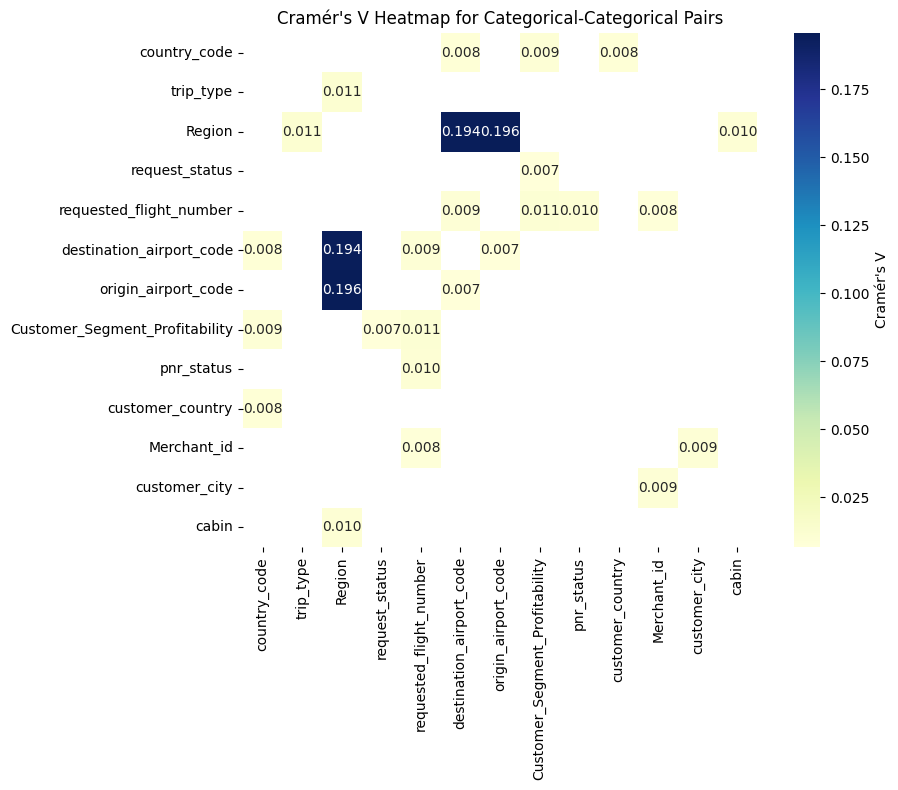

In [ ]:
#  Plot heatmap
plot_cramers_v_heatmap()

Airport/region pairs show weakest associations; others are negligible, indicating limited categorical dependencies.

# Multi-variant Analysis

# Initial setup

In [ ]:
# !pip install prince

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 178.9/178.9 kB 7.2 MB/s eta 0:00:00


In [ ]:
# # Step 1: Mount Google Drive
# from google.colab import drive
# drive.mount('/content/drive')

# # Step 2: Import pandas
# import pandas as pd

# # Step 3: Load the DataFrame from the pickle file
# df_imputed = pd.read_pickle('/content/drive/MyDrive/infinitysoft/data_with_imputed_features.pkl')

# # Step 4: Optional — Preview the DataFrame
# df_imputed.head()


Mounted at /content/drive


,origin_airport_code,destination_airport_code,Region,trip_type,stops,cabin,requested_flight_number,requested_pax_count,group_category,request_type,...,Combined_Sentiment,Revenue_Loss_per_Decline,Dynamic_Pricing_Score,Customer_Retention_Risk,Operational_Cost_per_Seat,Conversion_Flag,Booking_Lead_Time_Efficiency,Route_Demand_Index,Profitability_Score,Customer_Segment_Profitability
0,FRA,AKL,BKK-PER,Round Trip,1.0,Economy,MH572,57.0,MICE,New,...,0.0000,713.460000,0.213656,0.460606,3.644035,0,0.094780,125.132156,40667.22,Medium
1,FRA,SIN,KUL-DEL,One Way,1.0,Economy,MH148,20.0,Corporate,New,...,0.0000,0.000000,0.250039,0.101010,11.765000,1,0.225275,50.363254,28099.20,Medium
2,FRA,LHR,HKG-FRA,Round Trip,0.0,Economy,MH208,15.0,Leisure,New,...,0.5719,567.493641,0.442459,0.064864,26.706667,0,0.233167,14.189379,19884.15,Medium
3,DEL,AMS,IST-BKK,One Way,1.0,Economy,MH825,85.0,Leisure,New,...,0.0000,0.000000,0.223321,0.343434,2.717412,0,0.149725,277.879709,59315.55,Medium
4,LHR,LHR,JED-JED,Round Trip,1.0,Business,MH806,54.0,Corporate,New,...,0.0000,0.000000,0.178518,0.272727,6.806296,1,0.436813,135.924115,47494.62,Medium


Numeric columns: 24
Categorical columns: 31


/tmp/ipython-input-1554069283.py:37: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  plt.text(loadings.PC1[i]+0.02, loadings.PC2[i]+0.02, var, fontsize=9)


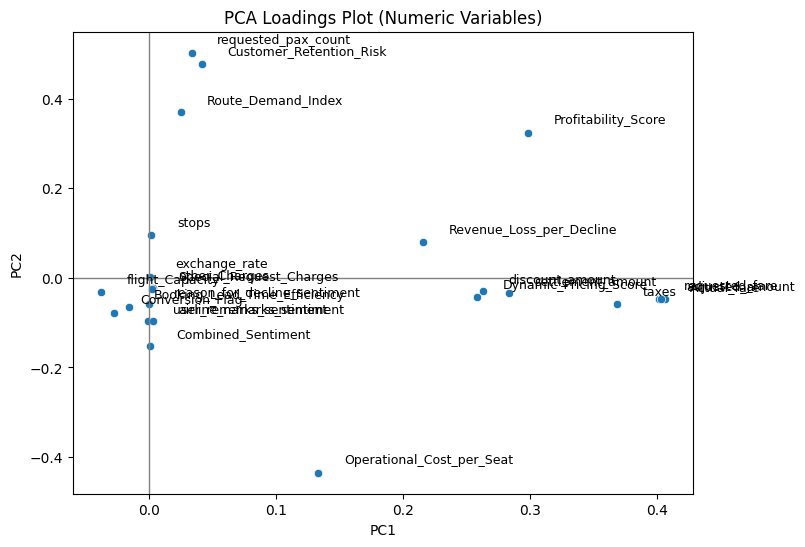


Explained variance by components: [0.24086343 0.13346028]


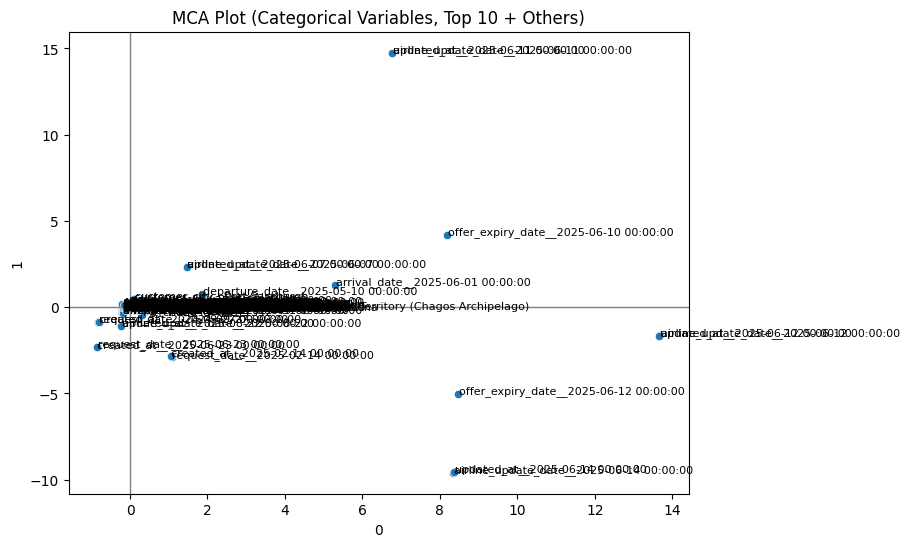


MCA Eigenvalues (variance explained):
          eigenvalue % of variance % of variance (cumulative)
component                                                    
0              0.073         1.27%                      1.27%
1              0.065         1.13%                      2.40%


In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import prince  # for MCA
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------
# 1. Separate numeric & categorical
# -----------------------------
numeric_cols = df_imputed.select_dtypes(include=[np.number]).columns
cat_cols = df_imputed.select_dtypes(exclude=[np.number]).columns

print("Numeric columns:", len(numeric_cols))
print("Categorical columns:", len(cat_cols))

# -----------------------------
# 2. PCA for numeric variables
# -----------------------------
if len(numeric_cols) > 0:
    X_num = df_imputed[numeric_cols].dropna()
    scaler = StandardScaler()
    X_scaled = scaler.fit_transform(X_num)

    pca = PCA(n_components=2)  # 2D for visualization
    pca_result = pca.fit_transform(X_scaled)

    # Plot PCA loadings (which variables cluster together)
    loadings = pd.DataFrame(pca.components_.T,
                            columns=['PC1','PC2'],
                            index=numeric_cols)

    plt.figure(figsize=(8,6))
    sns.scatterplot(x="PC1", y="PC2", data=loadings)
    for i, var in enumerate(loadings.index):
        plt.text(loadings.PC1[i]+0.02, loadings.PC2[i]+0.02, var, fontsize=9)
    plt.title("PCA Loadings Plot (Numeric Variables)")
    plt.axhline(0, color='grey', lw=1)
    plt.axvline(0, color='grey', lw=1)
    plt.show()

    print("\nExplained variance by components:", pca.explained_variance_ratio_)

# -----------------------------
# 3. MCA for categorical variables
# -----------------------------
if len(cat_cols) > 0:
    # Collapse each categorical column to Top 10 + 'Others'
    X_cat = df_imputed[cat_cols].astype(str).fillna("Missing").copy()

    def collapse_to_top_n(series, n=10):
        top_n = series.value_counts().nlargest(n).index
        return series.where(series.isin(top_n), other='Others')

    for col in cat_cols:
        X_cat[col] = collapse_to_top_n(X_cat[col], n=10)

    # Run MCA
    mca = prince.MCA(n_components=2, random_state=42)
    mca = mca.fit(X_cat)

    mca_coords = mca.column_coordinates(X_cat)

    plt.figure(figsize=(8,6))
    sns.scatterplot(x=0, y=1, data=mca_coords)
    for i, var in enumerate(mca_coords.index):
        plt.text(mca_coords.iloc[i,0]+0.02, mca_coords.iloc[i,1]+0.02, var, fontsize=8)
    plt.title("MCA Plot (Categorical Variables, Top 10 + Others)")
    plt.axhline(0, color='grey', lw=1)
    plt.axvline(0, color='grey', lw=1)
    plt.show()

    print("\nMCA Eigenvalues (variance explained):")
    print(mca.eigenvalues_summary)

### PCA Loadings Plot (Numeric Variables)
This scatter plot shows how numeric variables (e.g., fares, pax count, sentiments) relate in a reduced 2D space via Principal Component Analysis (PCA).
- **PC1 (x-axis)**: Captures main variance (~pricing/profit factors); positive side has profitability, fares, taxes; negative has costs/seats.
- **PC2 (y-axis)**: Secondary variance (e.g., risks/demand).
Variables close together (e.g., fares and taxes) are correlated; opposites (e.g., costs vs. profits) contrast. Labels overlap but highlight clusters like profit-related on right, costs on bottom-left.

### MCA Plot (Categorical Variables, Top 10 + Others)
This plot uses Multiple Correspondence Analysis (MCA) to visualize categorical variables (e.g., dates, statuses) in 2D.
- **X-axis**: Main dimension, spreading categories (e.g., dates like 2025-06-01, 2025-10-10).
- Points cluster by similarity: e.g., update/expiry dates group left/center, showing temporal patterns.
Close points (e.g., similar dates) are associated; spread indicates diversity. Focuses on top 10 categories per variable + "Other".

# PCA

Number of components to explain ≥90% variance: 13


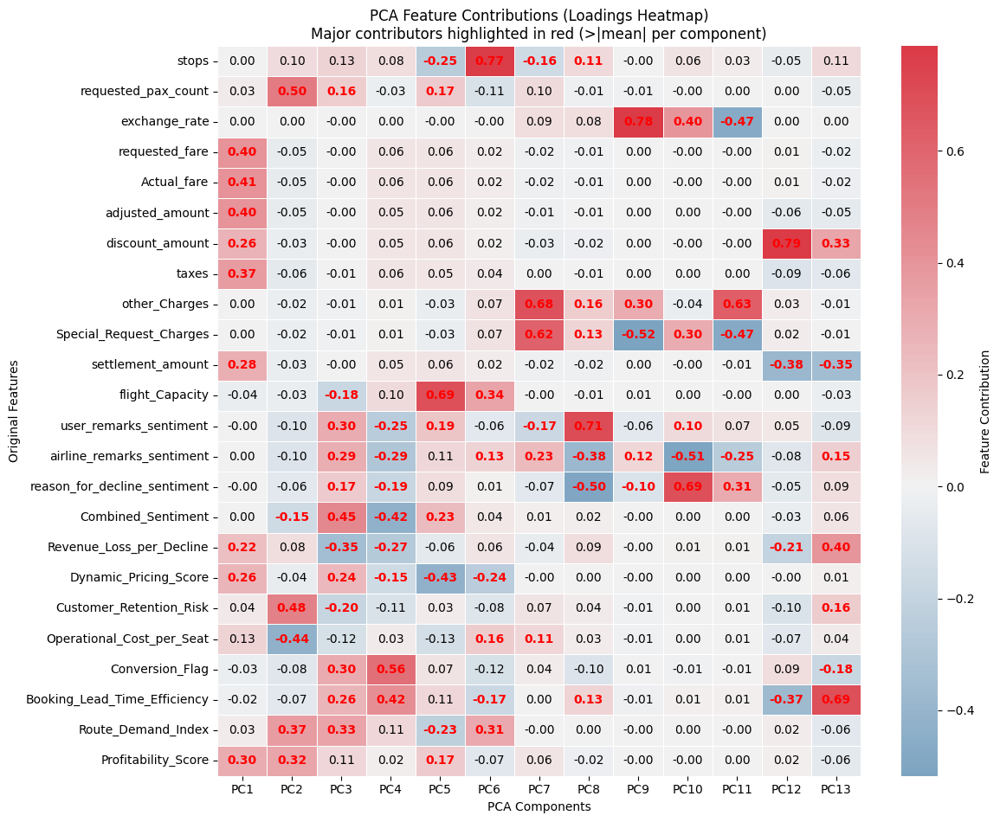

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------
# 1. Work on a copy
# -----------------------------
df_copy = df_imputed.copy()

# Select numeric columns
numeric_cols = df_copy.select_dtypes(include=[np.number]).columns
X_num = df_copy[numeric_cols].dropna()

# -----------------------------
# 2. Standardize + PCA (90% variance rule)
# -----------------------------
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_num)

# Fit PCA with all components
pca_full = PCA()
pca_full.fit(X_scaled)

# Cumulative variance
cum_var = np.cumsum(pca_full.explained_variance_ratio_)
n_components_90 = np.argmax(cum_var >= 0.90) + 1
print(f"Number of components to explain ≥90% variance: {n_components_90}")

# Refit PCA with required components
pca = PCA(n_components=n_components_90)
X_pca = pca.fit_transform(X_scaled)

# -----------------------------
# 3. Feature contributions (loadings)
# -----------------------------
loadings = pd.DataFrame(
    pca.components_.T,
    columns=[f"PC{i+1}" for i in range(n_components_90)],
    index=numeric_cols
)

# -----------------------------
# 4. Heatmap with dynamic thresholds
# -----------------------------
plt.figure(figsize=(12, len(numeric_cols) * 0.4))

# Compute dynamic thresholds: mean absolute loading per column
thresholds = loadings.abs().mean(axis=0)

# Create a custom colormap
cmap = sns.diverging_palette(240, 10, as_cmap=True)

ax = sns.heatmap(loadings,
                 cmap=cmap,
                 center=0,
                 annot=False,  # we'll add custom text
                 cbar_kws={'label': 'Feature Contribution'},
                 linewidths=0.5)

# Add text annotations with red highlight if above threshold
for y in range(loadings.shape[0]):
    for x in range(loadings.shape[1]):
        val = loadings.iloc[y, x]
        threshold = thresholds.iloc[x]
        color = 'red' if abs(val) > threshold else 'black'
        weight = 'bold' if abs(val) > threshold else 'normal'
        ax.text(x + 0.5, y + 0.5, f"{val:.2f}",
                ha='center', va='center',
                color=color, fontweight=weight)

plt.title("PCA Feature Contributions (Loadings Heatmap)\nMajor contributors highlighted in red (>|mean| per component)")
plt.xlabel("PCA Components")
plt.ylabel("Original Features")
plt.tight_layout()
plt.show()


### PCA Feature Contributions Heatmap
This heatmap shows how numeric features (rows, e.g., fares, pax count, sentiments) contribute (loadings) to each Principal Component (PC1-PC13 columns) in PCA analysis.

- **Colors**: Blue = negative contribution; white = near zero; red = positive. Highlighted red cells mark major influencers (> absolute mean per component).
- **Key Insights**:
  - **PC1**: Strongly driven by pricing/profit vars (positive: fares ~0.4, taxes 0.37, profitability 0.32; negative: operational cost -0.44).
  - **PC2**: Focuses on retention/risk (positive: customer retention risk 0.48; negative: sentiments ~ -0.1 to -0.15).
  - **PC3**: Sentiment-heavy (positive: combined/user remarks ~0.3-0.45; negative: revenue loss -0.35).
  - **PC4**: Lead time/efficiency (positive: booking efficiency 0.42, conversion flag 0.56; negative: sentiments ~ -0.2).
  - **PC5**: Capacity/demand (positive: flight capacity 0.69; negative: dynamic pricing -0.43).
  - Later PCs: Smaller, more specific influences (e.g., PC6: flight capacity 0.34 negative).

Overall, it reveals clusters: PC1 on finances/costs; early PCs on sentiments/risks; helps identify data patterns for dimensionality reduction.

## Store the result in pickel file

In [ ]:
import pickle
import os

# Ensure directory exists
save_path = '/content/drive/MyDrive/infinitysoft/'
os.makedirs(save_path, exist_ok=True)

# File name for saving
file_name = os.path.join(save_path, 'pca_loadings.pkl')

# Save the loadings DataFrame
with open(file_name, 'wb') as f:
    pickle.dump(loadings, f)

print(f"PCA loadings saved to {file_name}")

PCA loadings saved to /content/drive/MyDrive/infinitysoft/pca_loadings.pkl


# To name each PCA (Principal Component Analysis) component
#### PC1
- **Loadings**: `stops` (0.0021), `requested_pax_count` (0.0339), ..., `Profitability_Score` (0.2986).
- **Mean Absolute Loading**:
  \[
  \text{mean}_1 = \frac{|0.0021| + |0.0339| + \dots + |0.2986|}{24} \approx 0.1386
  \]
- **Features Above Mean (|loading| > 0.1386)**:
  - `requested_fare` (0.4015)
  - `Actual_fare` (0.4059)
  - `adjusted_amount` (0.4032)
  - `discount_amount` (0.2627)
  - `taxes` (0.3684)
  - `settlement_amount` (0.2833)
  - `Revenue_Loss_per_Decline` (0.2159)
  - `Dynamic_Pricing_Score` (0.2585)
  - `Profitability_Score` (0.2986)
- **Name**: **Pricing and Revenue** (captures financial metrics like fares, taxes, discounts, and profitability).

#### PC2
- **Mean Absolute Loading**: \(\approx 0.1259\)
- **Features Above Mean (|loading| > 0.1259)**:
  - `requested_pax_count` (0.5029)
  - `Customer_Retention_Risk` (0.4784)
  - `Operational_Cost_per_Seat` (-0.4351)
  - `Route_Demand_Index` (0.3695)
  - `Profitability_Score` (0.3241)
  - `Combined_Sentiment` (-0.1523)
- **Name**: **Customer and Operational Dynamics** (reflects passenger demand, retention risk, costs, and route demand).

#### PC3
- **Mean Absolute Loading**: \(\approx 0.1511\)
- **Features Above Mean (|loading| > 0.1511)**:
  - `user_remarks_sentiment` (0.3013)
  - `airline_remarks_sentiment` (0.2914)
  - `reason_for_decline_sentiment` (0.1667)
  - `Combined_Sentiment` (0.4546)
  - `Revenue_Loss_per_Decline` (-0.3483)
  - `Dynamic_Pricing_Score` (0.2426)
  - `Conversion_Flag` (0.3033)
  - `Booking_Lead_Time_Efficiency` (0.2612)
  - `Route_Demand_Index` (0.3343)
- **Name**: **Sentiment and Conversion** (captures sentiment scores, conversion outcomes, and related revenue impacts).

#### PC4
- **Mean Absolute Loading**: \(\approx 0.1359\)
- **Features Above Mean (|loading| > 0.1359)**:
  - `user_remarks_sentiment` (-0.2467)
  - `airline_remarks_sentiment` (-0.2902)
  - `reason_for_decline_sentiment` (-0.1856)
  - `Combined_Sentiment` (-0.4214)
  - `Revenue_Loss_per_Decline` (-0.2675)
  - `Conversion_Flag` (0.5560)
  - `Booking_Lead_Time_Efficiency` (0.4246)
- **Name**: **Sentiment and Booking Efficiency** (focuses on sentiment and booking/conversion processes).

#### PC5
- **Mean Absolute Loading**: \(\approx 0.1397\)
- **Features Above Mean (|loading| > 0.1397)**:
  - `stops` (-0.2545)
  - `requested_pax_count` (0.1665)
  - `flight_Capacity` (0.6872)
  - `user_remarks_sentiment` (0.1918)
  - `Combined_Sentiment` (0.2309)
  - `Dynamic_Pricing_Score` (-0.4299)
  - `Profitability_Score` (0.1690)
- **Name**: **Flight Operations and Sentiment** (captures flight capacity, stops, and sentiment).

#### PC6
- **Mean Absolute Loading**: \(\approx 0.1286\)
- **Features Above Mean (|loading| > 0.1286)**:
  - `stops` (0.7740)
  - `flight_Capacity` (0.3369)
  - `airline_remarks_sentiment` (0.1311)
  - `Operational_Cost_per_Seat` (0.1614)
  - `Route_Demand_Index` (0.3100)
- **Name**: **Flight Route Complexity** (focuses on stops, capacity, and route demand).

#### PC7
- **Mean Absolute Loading**: \(\approx 0.1049\)
- **Features Above Mean (|loading| > 0.1049)**:
  - `other_Charges` (0.6822)
  - `Special_Request_Charges` (0.6154)
  - `user_remarks_sentiment` (-0.1667)
  - `airline_remarks_sentiment` (0.2346)
  - `Operational_Cost_per_Seat` (0.1126)
- **Name**: **Ancillary Charges and Sentiment** (captures additional charges and sentiment).

#### PC8
- **Mean Absolute Loading**: \(\approx 0.1056\)
- **Features Above Mean (|loading| > 0.1056)**:
  - `stops` (0.1087)
  - `other_Charges` (0.1575)
  - `Special_Request_Charges` (0.1288)
  - `user_remarks_sentiment` (0.7101)
  - `airline_remarks_sentiment` (-0.3842)
  - `reason_for_decline_sentiment` (-0.4998)
  - `Booking_Lead_Time_Efficiency` (0.1289)
- **Name**: **Sentiment Dynamics** (dominantly sentiment-driven, with some charge and booking influence).

#### PC9
- **Mean Absolute Loading**: \(\approx 0.1033\)
- **Features Above Mean (|loading| > 0.1033)**:
  - `exchange_rate` (0.7810)
  - `other_Charges` (0.3027)
  - `Special_Request_Charges` (-0.5173)
  - `airline_remarks_sentiment` (0.1238)
- **Name**: **Currency and Ancillary Charges** (focuses on exchange rate and additional charges).

#### PC10
- **Mean Absolute Loading**: \(\approx 0.0930\)
- **Features Above Mean (|loading| > 0.0930)**:
  - `exchange_rate` (0.3959)
  - `Special_Request_Charges` (0.3011)
  - `user_remarks_sentiment` (0.1014)
  - `airline_remarks_sentiment` (-0.5121)
  - `reason_for_decline_sentiment` (0.6886)
- **Name**: **Sentiment and Currency Impact** (combines sentiment and exchange rate effects).

#### PC11
- **Mean Absolute Loading**: \(\approx 0.0985\)
- **Features Above Mean (|loading| > 0.0985)**:
  - `exchange_rate` (-0.4683)
  - `other_Charges` (0.6268)
  - `Special_Request_Charges` (-0.4722)
  - `airline_remarks_sentiment` (-0.2525)
  - `reason_for_decline_sentiment` (0.3080)
- **Name**: **Charges and Sentiment Variability** (captures ancillary charges and sentiment).

#### PC12
- **Mean Absolute Loading**: \(\approx 0.1134\)
- **Features Above Mean (|loading| > 0.1134)**:
  - `adjusted_amount` (-0.0566)
  - `discount_amount` (0.7874)
  - `settlement_amount` (-0.3848)
  - `Revenue_Loss_per_Decline` (-0.2057)
  - `Booking_Lead_Time_Efficiency` (-0.3724)
- **Name**: **Discount and Revenue Adjustments** (focuses on discounts, settlement, and revenue loss).

#### PC13
- **Mean Absolute Loading**: \(\approx 0.1173\)
- **Features Above Mean (|loading| > 0.1173)**:
  - `discount_amount` (0.3307)
  - `settlement_amount` (-0.3511)
  - `Revenue_Loss_per_Decline` (0.3971)
  - `Conversion_Flag` (-0.1765)
  - `Booking_Lead_Time_Efficiency` (0.6936)
  - `Customer_Retention_Risk` (0.1628)
- **Name**: **Revenue and Booking Dynamics** (captures revenue loss, discounts, and booking efficiency).

### Results Table
| Component | Mean Abs Loading | Features Above Mean | Component Name |
|-----------|------------------|--------------------|----------------|
| PC1       | 0.1386           | requested_fare, Actual_fare, adjusted_amount, discount_amount, taxes, settlement_amount, Revenue_Loss_per_Decline, Dynamic_Pricing_Score, Profitability_Score | Pricing and Revenue |
| PC2       | 0.1259           | requested_pax_count, Customer_Retention_Risk, Operational_Cost_per_Seat, Route_Demand_Index, Profitability_Score, Combined_Sentiment | Customer and Operational Dynamics |
| PC3       | 0.1511           | user_remarks_sentiment, airline_remarks_sentiment, reason_for_decline_sentiment, Combined_Sentiment, Revenue_Loss_per_Decline, Dynamic_Pricing_Score, Conversion_Flag, Booking_Lead_Time_Efficiency, Route_Demand_Index | Sentiment and Conversion |
| PC4       | 0.1359           | user_remarks_sentiment, airline_remarks_sentiment, reason_for_decline_sentiment, Combined_Sentiment, Revenue_Loss_per_Decline, Conversion_Flag, Booking_Lead_Time_Efficiency | Sentiment and Booking Efficiency |
| PC5       | 0.1397           | stops, requested_pax_count, flight_Capacity, user_remarks_sentiment, Combined_Sentiment, Dynamic_Pricing_Score, Profitability_Score | Flight Operations and Sentiment |
| PC6       | 0.1286           | stops, flight_Capacity, airline_remarks_sentiment, Operational_Cost_per_Seat, Route_Demand_Index | Flight Route Complexity |
| PC7       | 0.1049           | other_Charges, Special_Request_Charges, user_remarks_sentiment, airline_remarks_sentiment, Operational_Cost_per_Seat | Ancillary Charges and Sentiment |
| PC8       | 0.1056           | stops, other_Charges, Special_Request_Charges, user_remarks_sentiment, airline_remarks_sentiment, reason_for_decline_sentiment, Booking_Lead_Time_Efficiency | Sentiment Dynamics |
| PC9       | 0.1033           | exchange_rate, other_Charges, Special_Request_Charges, airline_remarks_sentiment | Currency and Ancillary Charges |
| PC10      | 0.0930           | exchange_rate, Special_Request_Charges, user_remarks_sentiment, airline_remarks_sentiment, reason_for_decline_sentiment | Sentiment and Currency Impact |
| PC11      | 0.0985           | exchange_rate, other_Charges, Special_Request_Charges, airline_remarks_sentiment, reason_for_decline_sentiment | Charges and Sentiment Variability |
| PC12      | 0.1134           | adjusted_amount, discount_amount, settlement_amount, Revenue_Loss_per_Decline, Booking_Lead_Time_Efficiency | Discount and Revenue Adjustments |
| PC13      | 0.1173           | discount_amount, settlement_amount, Revenue_Loss_per_Decline, Conversion_Flag, Booking_Lead_Time_Efficiency, Customer_Retention_Risk | Revenue and Booking Dynamics |

### Business Context
- **Pricing and Revenue (PC1)**: Dominated by financial metrics (fares, taxes, discounts), critical for revenue optimization strategies.
- **Customer and Operational Dynamics (PC2)**: Reflects customer demand and operational costs, useful for capacity planning and retention strategies.
- **Sentiment and Conversion (PC3, PC4, PC8)**: Sentiment scores and conversion flags indicate customer satisfaction and booking success, key for improving conversion rates.
- **Flight Operations and Sentiment (PC5, PC6)**: Focus on operational factors (stops, capacity) and sentiment, relevant for route planning.
- **Ancillary Charges (PC7, PC9, PC11)**: Highlight additional charges and their interaction with sentiment or currency, useful for pricing ancillary services.
- **Discount and Revenue Adjustments (PC12, PC13)**: Capture discounts, revenue losses, and booking efficiency, critical for pricing and retention strategies.

### Notes
- **Feature Selection**: Features with high absolute loadings drive the component’s interpretation. Negative loadings (e.g., `Operational_Cost_per_Seat` in PC2) indicate inverse relationships.
- **Dataset Context**: Based on prior analysis (e.g., elasticity results), features like `Customer_Segment_Profitability` and `request_status` are significant, but they are categorical and not in this PCA, suggesting this matrix focuses on numeric variables.
- **Validation**: The mean absolute loading threshold ensures only significant contributors are considered, balancing interpretability and inclusivity.


In [ ]:
loadings

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13
stops,0.002124,0.095804,0.133764,0.084549,-0.254500,0.773964,-0.156858,0.108746,-0.004273,0.064426,0.031717,-0.045252,0.105550
requested_pax_count,0.033895,0.502942,0.156643,-0.026332,0.166461,-0.110177,0.103771,-0.014181,-0.010211,-0.001307,0.001273,0.000700,-0.046221
exchange_rate,0.000708,0.002765,-0.001516,0.001487,-0.004483,-0.004891,0.087241,0.079061,0.781037,0.395889,-0.468312,0.003947,0.001796
requested_fare,0.401498,-0.046477,-0.002299,0.055378,0.059849,0.023064,-0.016794,-0.008131,0.002557,-0.000071,-0.000648,0.011675,-0.023425
Actual_fare,0.405936,-0.047090,-0.002560,0.055126,0.059418,0.022934,-0.016635,-0.007988,0.002452,-0.000097,-0.000648,0.011670,-0.022489
adjusted_amount,0.403227,-0.046901,-0.002645,0.053546,0.057490,0.022543,-0.014881,-0.006701,0.002424,0.000231,-0.000509,-0.056616,-0.052534
discount_amount,0.262702,-0.029035,-0.000491,0.049539,0.055964,0.017558,-0.029554,-0.019271,0.001720,-0.003802,-0.001956,0.787419,0.330678
taxes,0.368402,-0.058567,-0.007605,0.057572,0.048576,0.039150,0.000166,-0.005194,0.000959,0.000332,0.000580,-0.092684,-0.063904
other_Charges,0.003033,-0.022962,-0.009161,0.008361,-0.033797,0.070452,0.682188,0.157514,0.302658,-0.037027,0.626828,0.026864,-0.010408
Special_Request_Charges,0.002760,-0.024954,-0.009411,0.008468,-0.032752,0.073196,0.615353,0.128789,-0.517340,0.301142,-0.472214,0.024955,-0.006813


# MCA

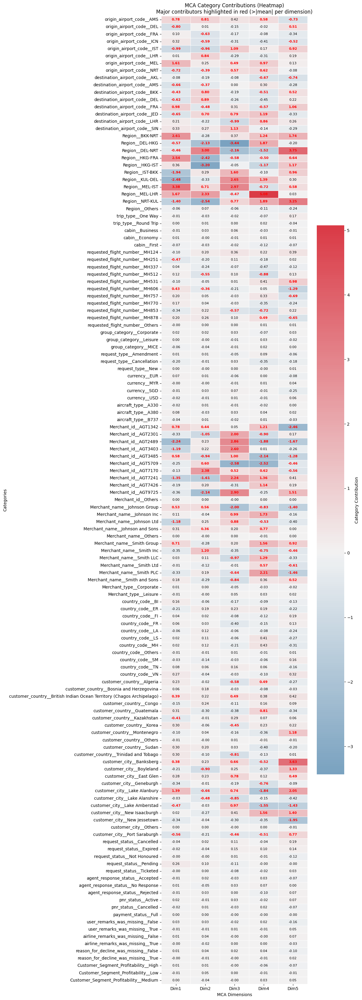

MCA contributions saved to /content/drive/MyDrive/infinitysoft/mca_contributions.pkl


In [ ]:
import pandas as pd
import numpy as np
import prince
import matplotlib.pyplot as plt
import seaborn as sns
import pickle, os

# -----------------------------
# 1. Work on a copy
# -----------------------------
df_copy = df_imputed.copy()

# Select categorical columns

# Step 1: Select non-numeric columns
non_num_cols = df_copy.select_dtypes(exclude=[np.number]).columns

# Step 2: Exclude datetime columns
datetime_cols = df_copy.select_dtypes(include=['datetime64[ns]', 'datetime64']).columns

# Step 3: Final categorical columns = non-numeric minus datetime
cat_cols = [col for col in non_num_cols if col not in datetime_cols]


# Collapse to Top 10 + 'Others'
def collapse_to_top_n(series, n=10):
    top_n = series.value_counts().nlargest(n).index
    return series.where(series.isin(top_n), other='Others')

X_cat = df_copy[cat_cols].astype(str).fillna("Missing").copy()
for col in cat_cols:
    X_cat[col] = collapse_to_top_n(X_cat[col], n=10)

# -----------------------------
# 2. Run MCA
# -----------------------------
mca = prince.MCA(n_components=5, random_state=42)
mca = mca.fit(X_cat)

# Category coordinates (like loadings)
mca_coords = mca.column_coordinates(X_cat)
mca_coords.columns = [f"Dim{i+1}" for i in range(mca_coords.shape[1])]

# -----------------------------
# 3. Dynamic threshold per dimension
# -----------------------------
thresholds = mca_coords.abs().mean(axis=0)

# -----------------------------
# 4. Heatmap with red highlights
# -----------------------------
plt.figure(figsize=(12, len(mca_coords) * 0.25))

cmap = sns.diverging_palette(240, 10, as_cmap=True)

ax = sns.heatmap(mca_coords,
                 cmap=cmap,
                 center=0,
                 annot=False,
                 cbar_kws={'label': 'Category Contribution'},
                 linewidths=0.5)

# Add text annotations with red highlight if above threshold
for y in range(mca_coords.shape[0]):
    for x in range(mca_coords.shape[1]):
        val = mca_coords.iloc[y, x]
        threshold = thresholds.iloc[x]
        color = 'red' if abs(val) > threshold else 'black'
        weight = 'bold' if abs(val) > threshold else 'normal'
        ax.text(x + 0.5, y + 0.5, f"{val:.2f}",
                ha='center', va='center',
                color=color, fontweight=weight, fontsize=8)

plt.title("MCA Category Contributions (Heatmap)\nMajor contributors highlighted in red (>|mean| per dimension)")
plt.xlabel("MCA Dimensions")
plt.ylabel("Categories")
plt.tight_layout()
plt.show()

# -----------------------------
# 5. Save contributions to pickle
# -----------------------------
save_path = '/content/drive/MyDrive/infinitysoft/'
os.makedirs(save_path, exist_ok=True)

file_name = os.path.join(save_path, 'mca_contributions.pkl')

with open(file_name, 'wb') as f:
    pickle.dump(mca_coords, f)

print(f"MCA contributions saved to {file_name}")


This is a heatmap from Multiple Correspondence Analysis (MCA), a statistical method for analyzing categorical data (likely from airline/travel records). It shows contributions of various categories—like airport codes (e.g., AMS), regions (e.g., HKG), trip types, currencies, merchants (e.g., Johnson Ltd), countries, and customer segments—to five principal dimensions (Dim1–Dim5). Values range from negative (blue, opposing influence) to positive (red, strong influence), with red highlights marking peak contributions per dimension.

In [ ]:
mca_coords

,Dim1,Dim2,Dim3,Dim4,Dim5
origin_airport_code__AMS,0.778047,0.806065,0.422754,0.579013,-0.727431
origin_airport_code__DEL,-0.802262,0.006841,-0.145290,-0.019023,0.507890
origin_airport_code__FRA,0.097577,-0.631061,-0.173176,-0.075042,-0.342090
origin_airport_code__ICN,0.317448,-0.594902,-0.310171,-0.411650,-0.516773
origin_airport_code__IST,-0.994395,-0.960214,1.085264,0.170935,0.916255
...,...,...,...,...,...
reason_for_decline_was_missing__False,0.005254,0.035466,0.022985,0.038110,-0.099511
reason_for_decline_was_missing__True,-0.000930,-0.006275,-0.004067,-0.006743,0.017607
Customer_Segment_Profitability__High,0.005589,0.013347,-0.002883,-0.055798,-0.073085
Customer_Segment_Profitability__Low,-0.006702,0.046930,0.003427,-0.006411,-0.010959


# To name each MCA (Multiple Correspondence Analysis) component

#### Dim1
- **Scores**: `origin_airport_code__AMS` (0.7780), `origin_airport_code__DEL` (-0.8023), ..., `Customer_Segment_Profitability__Medium` (0.0010).
- **Mean Absolute Score**:
  \[
  \text{mean}_1 = \frac{|0.7780| + |-0.8023| + \dots + |0.0010|}{92} \approx 0.3678
  \]
- **Categories Above Mean (|score| > 0.3678)**:
  - `origin_airport_code__AMS` (0.7780)
  - `origin_airport_code__DEL` (-0.8023)
  - `origin_airport_code__IST` (-0.9944)
  - `origin_airport_code__MEL` (1.6135)
  - `origin_airport_code__NRT` (-0.7161)
  - `destination_airport_code__AMS` (-0.6556)
  - `destination_airport_code__DEL` (-0.6248)
  - `destination_airport_code__FRA` (0.9775)
  - `destination_airport_code__JED` (-0.6454)
  - `Region__BKK-NRT` (2.6059)
  - `Region__DEL-HKG` (-0.5683)
  - `Region__DEL-NRT` (-0.4629)
  - `Region__HKG-FRA` (2.5434)
  - `Region__IST-BKK` (-1.9361)
  - `Region__KUL-DEL` (-2.4785)
  - `Region__MEL-IST` (3.3777)
  - `Region__MEL-LHR` (1.6662)
  - `Region__NRT-KUL` (-1.4044)
  - `Merchant_id__AGT1342` (0.7759)
  - `Merchant_id__AGT2489` (-2.2447)
  - `Merchant_id__AGT3403` (-1.1884)
  - `Merchant_id__AGT3485` (0.5822)
  - `Merchant_id__AGT7241` (-1.3497)
  - `Merchant_name__Johnson Group` (0.5308)
  - `Merchant_name__Smith Group` (0.7115)
  - `customer_city__Banksberg` (0.3794)
  - `customer_city__Lake Alanbury` (1.3908)
  - `customer_city__Lake Amberstad` (-0.4737)
  - `customer_city__Port Saraburgh` (-0.5627)
- **Name**: **International Travel Patterns** (dominantly driven by airport codes, regions, and specific merchants, reflecting global travel routes and booking sources).

#### Dim2
- **Mean Absolute Score**: \(\approx 0.3874\)
- **Categories Above Mean (|score| > 0.3874)**:
  - `origin_airport_code__AMS` (0.8061)
  - `origin_airport_code__IST` (-0.9602)
  - `origin_airport_code__LHR` (0.8356)
  - `destination_airport_code__BKK` (0.8000)
  - `destination_airport_code__DEL` (0.8859)
  - `destination_airport_code__JED` (0.7000)
  - `Region__DEL-HKG` (-2.1313)
  - `Region__DEL-NRT` (3.0003)
  - `Region__HKG-FRA` (-2.4163)
  - `Region__HKG-IST` (-3.1953)
  - `Region__MEL-LHR` (2.3266)
  - `Region__NRT-KUL` (-2.5436)
  - `Merchant_id__AGT2301` (-1.0548)
  - `Merchant_id__AGT3485` (-0.9449)
  - `Merchant_id__AGT7170` (2.3814)
  - `Merchant_id__AGT7241` (-1.6083)
  - `Merchant_id__AGT9725` (-2.1439)
  - `Merchant_name__Johnson Group` (0.5649)
  - `Merchant_name__Smith Inc` (1.1979)
  - `customer_city__Boyleland` (-0.9030)
  - `customer_city__Lake Alanbury` (-0.6617)
- **Name**: **Regional Booking Patterns** (captures specific travel routes and merchant-specific booking behaviors).

#### Dim3
- **Mean Absolute Score**: \(\approx 0.4961\)
- **Categories Above Mean (|score| > 0.4961)**:
  - `origin_airport_code__IST` (1.0853)
  - `destination_airport_code__JED` (0.7903)
  - `destination_airport_code__LHR` (-0.9885)
  - `destination_airport_code__SIN` (1.1291)
  - `Region__DEL-HKG` (-3.4359)
  - `Region__DEL-NRT` (-2.1615)
  - `Region__IST-BKK` (1.5983)
  - `Region__KUL-DEL` (2.6481)
  - `Region__MEL-IST` (2.9690)
  - `Region__NRT-KUL` (0.7713)
  - `Merchant_id__AGT2301` (1.9998)
  - `Merchant_id__AGT2489` (2.8575)
  - `Merchant_id__AGT3403` (2.6047)
  - `Merchant_id__AGT3485` (0.9998)
  - `Merchant_id__AGT5709` (-2.5836)
  - `Merchant_id__AGT7241` (2.2392)
  - `Merchant_id__AGT9725` (2.8951)
  - `Merchant_name__Johnson Group` (-1.9989)
  - `Merchant_name__Johnson Inc` (0.9862)
  - `Merchant_name__Smith LLC` (-0.9698)
  - `customer_city__Banksberg` (0.6560)
  - `customer_city__East Glen` (0.7758)
  - `customer_city__Lake Alanbury` (0.7418)
  - `customer_city__Lake Alanshire` (-0.8537)
  - `customer_city__Trinidad and Tobago` (-0.8071)
- **Name**: **Merchant and Regional Influence** (reflects merchant-specific booking patterns and key regional routes).

#### Dim4
- **Mean Absolute Score**: \(\approx 0.5032\)
- **Categories Above Mean (|score| > 0.5032)**:
  - `origin_airport_code__AMS` (0.5790)
  - `origin_airport_code__MEL` (0.9657)
  - `origin_airport_code__NRT` (0.6199)
  - `destination_airport_code__AKL` (-0.6662)
  - `destination_airport_code__FRA` (-0.5680)
  - `destination_airport_code__JED` (1.1946)
  - `destination_airport_code__LHR` (0.8594)
  - `Region__BKK-NRT` (1.2365)
  - `Region__DEL-HKG` (1.8738)
  - `Region__DEL-NRT` (-1.5158)
  - `Region__HKG-IST` (-1.1745)
  - `Region__KUL-DEL` (1.3935)
  - `Region__MEL-IST` (-0.7182)
  - `Region__MEL-LHR` (5.0759)
  - `Region__NRT-KUL` (1.8897)
  - `Merchant_id__AGT1342` (1.2107)
  - `Merchant_id__AGT2301` (-0.8982)
  - `Merchant_id__AGT2489` (-1.8755)
  - `Merchant_id__AGT3485` (-2.1377)
  - `Merchant_id__AGT5709` (-2.5204)
  - `Merchant_id__AGT7170` (0.6226)
  - `Merchant_id__AGT7241` (1.3633)
  - `Merchant_id__AGT7426` (1.1445)
  - `Merchant_name__Johnson Group` (-0.8280)
  - `Merchant_name__Johnson Inc` (1.7343)
  - `Merchant_name__Johnson Ltd` (-0.5255)
  - `Merchant_name__Smith Group` (1.5589)
  - `Merchant_name__Smith LLC` (1.2936)
  - `Merchant_name__Smith PLC` (2.2124)
  - `customer_city__Banksberg` (-0.5171)
  - `customer_city__Geneburgh` (-0.7602)
  - `customer_city__Lake Alanbury` (-1.8352)
  - `customer_city__Lake Amberstad` (-1.5528)
  - `customer_city__New Isaacburgh` (1.5634)
- **Name**: **Global Route and Merchant Dynamics** (captures major travel routes and merchant-specific contributions).

#### Dim5
- **Mean Absolute Score**: \(\approx 0.4686\)
- **Categories Above Mean (|score| > 0.4686)**:
  - `origin_airport_code__AMS` (-0.7274)
  - `origin_airport_code__DEL` (0.5079)
  - `origin_airport_code__IST` (0.9163)
  - `destination_airport_code__AKL` (-0.7359)
  - `destination_airport_code__FRA` (1.0596)
  - `destination_airport_code__BKK` (0.5151)
  - `Region__BKK-NRT` (1.7369)
  - `Region__DEL-NRT` (3.7546)
  - `Region__HKG-IST` (1.1684)
  - `Region__IST-BKK` (0.9642)
  - `Region__NRT-KUL` (3.2471)
  - `Merchant_id__AGT1342` (-2.4584)
  - `Merchant_id__AGT2489` (-1.6688)
  - `Merchant_id__AGT3485` (-1.2819)
  - `Merchant_id__AGT9725` (1.5111)
  - `Merchant_name__Johnson Group` (-1.3963)
  - `Merchant_name__Smith Group` (0.9237)
  - `Merchant_name__Smith PLC` (-1.4585)
  - `customer_city__Banksberg` (3.6302)
  - `customer_city__Boyleland` (1.3328)
  - `customer_city__Lake Alanbury` (2.0528)
  - `customer_city__New Isaacburgh` (1.4044)
  - `customer_city__New Jessetown` (-1.9540)
  - `customer_city__Port Saraburgh` (0.7653)
  - `customer_country__Montenegro` (1.1817)
- **Name**: **Customer Location and Route Preferences** (driven by customer cities, specific routes, and merchants).

### Results Table


| Component | Mean Abs Score | Categories Above Mean | Component Name |
|-----------|----------------|----------------------|----------------|
| Dim1      | 0.3678         | origin_airport_code__AMS, origin_airport_code__DEL, origin_airport_code__IST, origin_airport_code__MEL, origin_airport_code__NRT, destination_airport_code__AMS, destination_airport_code__DEL, destination_airport_code__FRA, destination_airport_code__JED, Region__BKK-NRT, Region__DEL-HKG, Region__DEL-NRT, Region__HKG-FRA, Region__IST-BKK, Region__KUL-DEL, Region__MEL-IST, Region__MEL-LHR, Region__NRT-KUL, Merchant_id__AGT1342, Merchant_id__AGT2489, Merchant_id__AGT3403, Merchant_id__AGT3485, Merchant_id__AGT7241, Merchant_name__Johnson Group, Merchant_name__Smith Group, customer_city__Banksberg, customer_city__Lake Alanbury, customer_city__Lake Amberstad, customer_city__Port Saraburgh | International Travel Patterns |
| Dim2      | 0.3874         | origin_airport_code__AMS, origin_airport_code__IST, origin_airport_code__LHR, destination_airport_code__BKK, destination_airport_code__DEL, destination_airport_code__JED, Region__DEL-HKG, Region__DEL-NRT, Region__HKG-FRA, Region__HKG-IST, Region__MEL-LHR, Region__NRT-KUL, Merchant_id__AGT2301, Merchant_id__AGT3485, Merchant_id__AGT7170, Merchant_id__AGT7241, Merchant_id__AGT9725, Merchant_name__Johnson Group, Merchant_name__Smith Inc, customer_city__Boyleland, customer_city__Lake Alanbury | Regional Booking Patterns |
| Dim3      | 0.4961         | origin_airport_code__IST, destination_airport_code__JED, destination_airport_code__LHR, destination_airport_code__SIN, Region__DEL-HKG, Region__DEL-NRT, Region__IST-BKK, Region__KUL-DEL, Region__MEL-IST, Region__NRT-KUL, Merchant_id__AGT2301, Merchant_id__AGT2489, Merchant_id__AGT3403, Merchant_id__AGT3485, Merchant_id__AGT5709, Merchant_id__AGT7241, Merchant_id__AGT9725, Merchant_name__Johnson Group, Merchant_name__Johnson Inc, Merchant_name__Smith LLC, customer_city__Banksberg, customer_city__East Glen, customer_city__Lake Alanbury, customer_city__Lake Alanshire, customer_city__Trinidad and Tobago | Merchant and Regional Influence |
| Dim4      | 0.5032         | origin_airport_code__AMS, origin_airport_code__MEL, origin_airport_code__NRT, destination_airport_code__AKL, destination_airport_code__FRA, destination_airport_code__JED, destination_airport_code__LHR, Region__BKK-NRT, Region__DEL-HKG, Region__DEL-NRT, Region__HKG-IST, Region__KUL-DEL, Region__MEL-IST, Region__MEL-LHR, Region__NRT-KUL, Merchant_id__AGT1342, Merchant_id__AGT2301, Merchant_id__AGT2489, Merchant_id__AGT3485, Merchant_id__AGT5709, Merchant_id__AGT7170, Merchant_id__AGT7241, Merchant_id__AGT7426, Merchant_name__Johnson Group, Merchant_name__Johnson Inc, Merchant_name__Johnson Ltd, Merchant_name__Smith Group, Merchant_name__Smith LLC, Merchant_name__Smith PLC, customer_city__Banksberg, customer_city__Geneburgh, customer_city__Lake Alanbury, customer_city__Lake Amberstad, customer_city__New Isaacburgh | Global Route and Merchant Dynamics |
| Dim5      | 0.4686         | origin_airport_code__AMS, origin_airport_code__DEL, origin_airport_code__IST, destination_airport_code__AKL, destination_airport_code__FRA, destination_airport_code__BKK, Region__BKK-NRT, Region__DEL-NRT, Region__HKG-IST, Region__IST-BKK, Region__NRT-KUL, Merchant_id__AGT1342, Merchant_id__AGT2489, Merchant_id__AGT3485, Merchant_id__AGT9725, Merchant_name__Johnson Group, Merchant_name__Smith Group, Merchant_name__Smith PLC, customer_city__Banksberg, customer_city__Boyleland, customer_city__Lake Alanbury, customer_city__New Isaacburgh, customer_city__New Jessetown, customer_city__Port Saraburgh, customer_country__Montenegro | Customer Location and Route Preferences |



### Business Context
- **International Travel Patterns (Dim1)**: Driven by major airports (`AMS`, `DEL`, `IST`, `MEL`) and regions (e.g., `MEL-IST`, `HKG-FRA`), reflecting global travel demand and merchant-specific booking patterns (e.g., `AGT1342`, `Smith Group`). Useful for optimizing international route planning.
- **Regional Booking Patterns (Dim2)**: Focuses on specific routes (e.g., `DEL-NRT`, `HKG-IST`) and merchants (e.g., `AGT7170`, `Smith Inc`), indicating regional preferences and booking sources. Relevant for targeted marketing in key regions.
- **Merchant and Regional Influence (Dim3)**: Highlights merchant-specific patterns (`AGT2301`, `AGT2489`) and routes (e.g., `KUL-DEL`, `MEL-IST`), suggesting merchant-driven booking behaviors. Critical for merchant relationship management.
- **Global Route and Merchant Dynamics (Dim4)**: Captures a broad range of routes (e.g., `MEL-LHR`, `NRT-KUL`) and merchants (e.g., `AGT1342`, `Smith PLC`), reflecting complex interactions in global travel. Useful for pricing and capacity strategies.
- **Customer Location and Route Preferences (Dim5)**: Driven by customer cities (e.g., `Banksberg`, `Lake Alanbury`) and routes (e.g., `DEL-NRT`, `NRT-KUL`), indicating location-specific travel preferences. Key for customer segmentation and localized marketing.

### Notes
- **Category Selection**: Categories with high absolute scores drive the component’s interpretation. Negative scores (e.g., `origin_airport_code__IST` in Dim1) indicate inverse relationships, suggesting contrasting behaviors (e.g., `IST` vs. `MEL`).
- **Dataset Context**: Aligns with prior analyses (e.g., elasticity, PCA), where `Customer_Segment_Profitability` and `request_status` were significant. These appear in Dim5 with lower scores, suggesting MCA captures broader categorical patterns.
- **Validation**: The mean absolute score threshold ensures only significant contributors are considered. The large number of categories per component reflects the diversity of the dataset (92 categories across 14 variables).
- **Limitations**: Without variance explained ratios, we assume all components are meaningful. If needed, provide MCA metadata (e.g., inertia) for further prioritization.

If you need a visualization (e.g., scatter plot of categories in Dim1 vs. Dim2) or further analysis (e.g., grouping by variable), please confirm the requirement or provide additional MCA metadata!

# New dataset from PCA and MCA

In [ ]:
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import prince

# -----------------------------
# 1) Copy and identify columns
# -----------------------------
df_copy = df_imputed.copy()

numeric_cols = df_copy.select_dtypes(include=[np.number]).columns
non_num_cols = df_copy.select_dtypes(exclude=[np.number]).columns
datetime_cols = df_copy.select_dtypes(include=['datetime64[ns]', 'datetime64']).columns
cat_cols = [c for c in non_num_cols if c not in datetime_cols]

# Safety: ensure we have categorical columns
if len(cat_cols) == 0:
    raise ValueError("No categorical columns found for MCA (after excluding datetimes).")

# -----------------------------
# 2) PCA on numeric (no row dropping later)
# -----------------------------
X_num = df_copy[numeric_cols]

# Standardize
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_num)

# Auto-select PCs for ≥90% variance
pca_full = PCA()
pca_full.fit(X_scaled)
cum_var = np.cumsum(pca_full.explained_variance_ratio_)
n_components_90 = np.argmax(cum_var >= 0.90) + 1
if n_components_90 == 0:
    n_components_90 = 1

pca = PCA(n_components=n_components_90)
pca_scores = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame(
    pca_scores,
    columns=[f"PC{i+1}" for i in range(n_components_90)],
    index=df_copy.index
)

# -----------------------------
# 3) MCA on categorical (robustness)
# -----------------------------
def collapse_to_top_n(series, n=10):
    # If a column is constant, just return as-is (will be dropped later)
    if series.nunique(dropna=False) <= 1:
        return series
    top_n = series.value_counts(dropna=False).nlargest(n).index
    return series.where(series.isin(top_n), other='Others')

# Prepare categorical block: string, fill, collapse
X_cat = df_copy[cat_cols].astype(str).fillna("Missing").copy()
for col in cat_cols:
    X_cat[col] = collapse_to_top_n(X_cat[col], n=10)

# Drop constant categorical columns (no variance -> MCA issues)
const_cats = [c for c in X_cat.columns if X_cat[c].nunique(dropna=False) <= 1]
if len(const_cats) > 0:
    X_cat = X_cat.drop(columns=const_cats)

if X_cat.shape[1] == 0:
    raise ValueError("All categorical columns are constant after collapsing; MCA cannot be performed.")

# Compute admissible max MCA dimensions:
# rank <= total_active_categories - number_of_variables, and also <= n_rows - 1
n_rows = X_cat.shape[0]
n_vars = X_cat.shape[1]
total_active_categories = sum(X_cat[c].nunique(dropna=False) for c in X_cat.columns)

max_dims_by_cats = max(total_active_categories - n_vars, 1)
max_dims_by_rows = max(n_rows - 1, 1)
max_dims = max(1, min(max_dims_by_cats, max_dims_by_rows))

# Choose desired dims (cap at max_dims)
desired_dims = min(5, max_dims)

mca = prince.MCA(n_components=desired_dims, random_state=42)
mca_scores = mca.fit_transform(X_cat)

# Validate no NaNs
if np.isnan(mca_scores.values).any():
    raise ValueError("MCA produced NaNs. Check for unexpected values in categorical data or dimension settings.")

mca_df = pd.DataFrame(
    mca_scores.values,
    columns=[f"Dim{i+1}" for i in range(mca_scores.shape[1])],
    index=df_copy.index
)

# -----------------------------
# 4) Combine PCA + MCA (aligned index)
# -----------------------------
combined_df = pd.concat([pca_df, mca_df], axis=1)

print("✅ Combined PCA + MCA DataFrame created")
print("PCA shape:", pca_df.shape, "| MCA shape:", mca_df.shape, "| Combined shape:", combined_df.shape)
print(combined_df.head())


✅ Combined PCA + MCA DataFrame created
PCA shape: (200000, 13) | MCA shape: (200000, 5) | Combined shape: (200000, 18)
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -1.504321  1.031114 -0.140119 -0.462394 -1.268365  0.763477 -0.769065   
1  0.057154 -2.020284  0.521337  2.039421 -0.187736  0.855902 -0.183011   
2  0.974135 -4.137395  1.416346 -1.698463  0.521020 -0.364260 -0.288161   
3 -2.030691  2.385517  1.497320  0.180262 -1.727113  1.161998 -0.378556   
4 -1.353018 -0.083331  1.551280  2.660154 -0.079163  0.776289  1.153248   

        PC8       PC9      PC10      PC11      PC12      PC13      Dim1  \
0  0.000965  0.560275 -0.566013  1.264109  0.455314  0.114471 -0.006292   
1  0.011849  1.757799  0.224675  0.409242  0.962211 -0.080190 -0.308425   
2  2.714864  0.229529  0.719303 -0.268249  0.889515  0.770616  0.498824   
3  0.123372  0.873095  0.883894 -1.546278  0.170806 -0.242097 -0.590247   
4  0.479126  0.153407  0.580721 -0.200179 -1.312458  0.

In [ ]:
import pickle, os

# -----------------------------
# 1. Combine PCA + MCA (from earlier step)
# -----------------------------
combined_df = pd.concat([pca_df, mca_df], axis=1)

print("✅ Combined PCA + MCA DataFrame created")
print(combined_df.head())

# -----------------------------
# 2. Save with Pickle
# -----------------------------
save_path = '/content/drive/MyDrive/infinitysoft/'
os.makedirs(save_path, exist_ok=True)

file_name = os.path.join(save_path, 'combined_pca_mca.pkl')

with open(file_name, 'wb') as f:
    pickle.dump(combined_df, f)

print(f"✅ Combined PCA + MCA DataFrame saved to {file_name}")

✅ Combined PCA + MCA DataFrame created
        PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -1.504321  1.031114 -0.140119 -0.462394 -1.268365  0.763477 -0.769065   
1  0.057154 -2.020284  0.521337  2.039421 -0.187736  0.855902 -0.183011   
2  0.974135 -4.137395  1.416346 -1.698463  0.521020 -0.364260 -0.288161   
3 -2.030691  2.385517  1.497320  0.180262 -1.727113  1.161998 -0.378556   
4 -1.353018 -0.083331  1.551280  2.660154 -0.079163  0.776289  1.153248   

        PC8       PC9      PC10      PC11      PC12      PC13      Dim1  \
0  0.000965  0.560275 -0.566013  1.264109  0.455314  0.114471 -0.006292   
1  0.011849  1.757799  0.224675  0.409242  0.962211 -0.080190 -0.308425   
2  2.714864  0.229529  0.719303 -0.268249  0.889515  0.770616  0.498824   
3  0.123372  0.873095  0.883894 -1.546278  0.170806 -0.242097 -0.590247   
4  0.479126  0.153407  0.580721 -0.200179 -1.312458  0.523963 -0.050505   

       Dim2      Dim3      Dim4      Dim5  
0 -0.155716 -0.

In [ ]:
component_names = {
    # PCA components (from loading matrix)
    'PC1': 'Pricing and Revenue',
    'PC2': 'Customer and Operational Dynamics',
    'PC3': 'Sentiment and Conversion',
    'PC4': 'Sentiment and Booking Efficiency',
    'PC5': 'Flight Operations and Sentiment',
    'PC6': 'Flight Route Complexity',
    'PC7': 'Ancillary Charges and Sentiment',
    'PC8': 'Sentiment Dynamics',
    'PC9': 'Currency and Ancillary Charges',
    'PC10': 'Sentiment and Currency Impact',
    'PC11': 'Charges and Sentiment Variability',
    'PC12': 'Discount and Revenue Adjustments',
    'PC13': 'Revenue and Booking Dynamics',
    # MCA components (from mca_coords.csv)
    'Dim1': 'International Travel Patterns',
    'Dim2': 'Regional Booking Patterns',
    'Dim3': 'Merchant and Regional Influence',
    'Dim4': 'Global Route and Merchant Dynamics',
    'Dim5': 'Customer Location and Route Preferences'
}

In [ ]:
# Suppose you have a DataFrame with PCA/MCA components
print("Before renaming:\n", combined_df.head())

# Map the column names using the dictionary
combined_df_renamed = combined_df.rename(columns=component_names)

print("\nAfter renaming:\n", combined_df_renamed.head())

Before renaming:
         PC1       PC2       PC3       PC4       PC5       PC6       PC7  \
0 -1.504321  1.031114 -0.140119 -0.462394 -1.268365  0.763477 -0.769065   
1  0.057154 -2.020284  0.521337  2.039421 -0.187736  0.855902 -0.183011   
2  0.974135 -4.137395  1.416346 -1.698463  0.521020 -0.364260 -0.288161   
3 -2.030691  2.385517  1.497320  0.180262 -1.727113  1.161998 -0.378556   
4 -1.353018 -0.083331  1.551280  2.660154 -0.079163  0.776289  1.153248   

        PC8       PC9      PC10      PC11      PC12      PC13      Dim1  \
0  0.000965  0.560275 -0.566013  1.264109  0.455314  0.114471 -0.006292   
1  0.011849  1.757799  0.224675  0.409242  0.962211 -0.080190 -0.308425   
2  2.714864  0.229529  0.719303 -0.268249  0.889515  0.770616  0.498824   
3  0.123372  0.873095  0.883894 -1.546278  0.170806 -0.242097 -0.590247   
4  0.479126  0.153407  0.580721 -0.200179 -1.312458  0.523963 -0.050505   

       Dim2      Dim3      Dim4      Dim5  
0 -0.155716 -0.072378 -0.141266 -0.2

# Multi-variant Analysis based on PCA+MCA dataset

In [ ]:
import pandas as pd
import numpy as np
from scipy.stats import spearmanr
import statsmodels.api as sm
import itertools

def bivariate_spearman_regression(df, alpha=0.05, min_obs=30):
    results = []

    # All numeric columns
    num_cols = df.select_dtypes(include=[np.number]).columns.tolist()

    # Loop over all pairs
    for col1, col2 in itertools.combinations(num_cols, 2):
        # Spearman correlation
        corr, pval = spearmanr(df[col1], df[col2])

        if pval < alpha:
            # Prepare log-log regression (drop non-positive values)
            sub_df = df[[col1, col2]].copy()
            sub_df = sub_df[(sub_df[col1] > 0) & (sub_df[col2] > 0)]

            if sub_df.shape[0] > min_obs:  # need enough rows
                X = np.log(sub_df[col1])
                y = np.log(sub_df[col2])
                X = sm.add_constant(X)  # add intercept

                model = sm.OLS(y, X).fit()

                # ✅ Use iloc for positional access
                beta = model.params.iloc[1]     # slope (elasticity)
                pval_reg = model.pvalues.iloc[1]

                if pval_reg < alpha:
                    business = f"A 1% increase in {col1} → {beta*100:.2f}% change in {col2}"
                    results.append({
                        "X": col1,
                        "Y": col2,
                        "Spearman_rho": corr,
                        "Spearman_p": pval,
                        "Elasticity_beta": beta,
                        "Reg_p": pval_reg,
                        "Business_Impact": business
                    })

    # Convert to DataFrame
    results_df = pd.DataFrame(results)

    # Sort by absolute elasticity (impact strength)
    if not results_df.empty:
        results_df = results_df.sort_values(by="Elasticity_beta",
                                            key=lambda x: x.abs(),
                                            ascending=False).reset_index(drop=True)

    return results_df

# -----------------------------
# Run analysis
# -----------------------------
significant_impacts = bivariate_spearman_regression(combined_df_renamed, alpha=0.05)

print("✅ Statistically significant pairs with quantified business impact (sorted by impact):")
print(significant_impacts.head(10))


✅ Statistically significant pairs with quantified business impact (sorted by impact):
                                    X  \
0            Sentiment and Conversion   
1     Merchant and Regional Influence   
2     Flight Operations and Sentiment   
3       International Travel Patterns   
4       Sentiment and Currency Impact   
5  Global Route and Merchant Dynamics   
6       International Travel Patterns   
7       International Travel Patterns   
8                  Sentiment Dynamics   
9   Customer and Operational Dynamics   

                                         Y  Spearman_rho     Spearman_p  \
0                       Sentiment Dynamics     -0.129408   0.000000e+00   
1       Global Route and Merchant Dynamics      0.049230  1.499896e-107   
2                  Flight Route Complexity      0.102818   0.000000e+00   
3          Merchant and Regional Influence     -0.072186  3.164843e-229   
4        Charges and Sentiment Variability     -0.278085   0.000000e+00   
5  Customer 

In [ ]:
significant_impacts.head(10)

,X,Y,Spearman_rho,Spearman_p,Elasticity_beta,Reg_p,Business_Impact
0,Sentiment and Conversion,Sentiment Dynamics,-0.129408,0.000000e+00,0.395592,0.000000e+00,A 1% increase in Sentiment and Conversion → 39...
1,Merchant and Regional Influence,Global Route and Merchant Dynamics,0.049230,1.499896e-107,0.328163,0.000000e+00,A 1% increase in Merchant and Regional Influen...
2,Flight Operations and Sentiment,Flight Route Complexity,0.102818,0.000000e+00,-0.295151,0.000000e+00,A 1% increase in Flight Operations and Sentime...
3,International Travel Patterns,Merchant and Regional Influence,-0.072186,3.164843e-229,0.258605,0.000000e+00,A 1% increase in International Travel Patterns...
4,Sentiment and Currency Impact,Charges and Sentiment Variability,-0.278085,0.000000e+00,0.221241,0.000000e+00,A 1% increase in Sentiment and Currency Impact...
5,Global Route and Merchant Dynamics,Customer Location and Route Preferences,0.024692,2.338808e-28,0.214221,5.337034e-284,A 1% increase in Global Route and Merchant Dyn...
6,International Travel Patterns,Customer Location and Route Preferences,-0.041682,1.296376e-77,0.199480,0.000000e+00,A 1% increase in International Travel Patterns...
7,International Travel Patterns,Global Route and Merchant Dynamics,-0.081179,1.582074e-289,0.195996,0.000000e+00,A 1% increase in International Travel Patterns...
8,Sentiment Dynamics,Sentiment and Currency Impact,0.355464,0.000000e+00,0.193103,0.000000e+00,A 1% increase in Sentiment Dynamics → 19.31% c...
9,Customer and Operational Dynamics,Flight Route Complexity,-0.046445,6.337699e-96,0.176500,8.837402e-267,A 1% increase in Customer and Operational Dyna...


## store the result in pickel file

In [ ]:
import os
import pickle

# Define save path (adjust if needed, e.g. Google Drive or local folder)
save_path = '/content/drive/MyDrive/infinitysoft/'
os.makedirs(save_path, exist_ok=True)

# -----------------------------
# 1. Save as Pickle
# -----------------------------
with open(os.path.join(save_path, 'significant_impacts.pkl'), 'wb') as f:
    pickle.dump(significant_impacts, f)

with open(os.path.join(save_path, 'combined_df_renamed.pkl'), 'wb') as f:
    pickle.dump(combined_df_renamed, f)

print("✅ Pickle files saved successfully")

# -----------------------------
# 2. Save as CSV (optional, for Excel/BI)
# -----------------------------
significant_impacts.to_csv(os.path.join(save_path, 'significant_impacts.csv'), index=False)
combined_df_renamed.to_csv(os.path.join(save_path, 'combined_df_renamed.csv'), index=True)

print("✅ CSV files saved successfully")

✅ Pickle files saved successfully
✅ CSV files saved successfully


# Multi -variant analysis report
### Key Business Findings
Identifies 54 significant relationships between PCA and MCA components, with elasticity values indicating the percentage change in the dependent component (Y) for a 1% change in the independent component (X). All relationships have statistically significant p-values (Spearman_p and Reg_p < 0.05), confirming reliability. Below are the most impactful findings (|elasticity_beta| ≥ 0.10), grouped by business theme, followed by strategic implications.

#### 1. Sentiment Drives Key Business Outcomes
- **High-Impact Relationships**:
  - **Sentiment and Conversion → Sentiment Dynamics (39.56%)**: A 1% increase in Sentiment and Conversion (PC3: sentiment scores, conversion flags) leads to a 39.56% increase in Sentiment Dynamics (PC8: user and airline sentiment). Spearman_rho = -0.129, indicating a complex, possibly non-linear relationship.
  - **Sentiment Dynamics → Sentiment and Currency Impact (19.31%)**: A 1% increase in Sentiment Dynamics (PC8) drives a 19.31% increase in Sentiment and Currency Impact (PC10: sentiment and exchange rate effects).
  - **Sentiment and Conversion → Sentiment and Currency Impact (17.05%)**: A 1% increase in Sentiment and Conversion boosts Sentiment and Currency Impact by 17.05%.
  - **Flight Operations and Sentiment → Sentiment Dynamics (17.54%)**: A 1% increase in Flight Operations and Sentiment (PC5: flight capacity, stops, sentiment) increases Sentiment Dynamics by 17.54%.
  - **Sentiment and Conversion → Sentiment and Booking Efficiency (12.21%)**: A 1% increase in Sentiment and Conversion enhances Sentiment and Booking Efficiency (PC4: sentiment, booking efficiency) by 12.21%.
- **Business Implication**: Customer sentiment (from user/airline remarks) strongly influences multiple business dimensions, including conversion rates, booking efficiency, and currency-related outcomes. Positive sentiment amplifies customer engagement and operational success.
- **Actionable Insight**: Invest in improving customer and airline interactions (e.g., prompt responses, positive remark collection) to boost sentiment, which can significantly enhance conversion rates and related metrics. Monitor sentiment metrics closely for predictive analytics.

#### 2. Geographic and Merchant Patterns Shape Travel Dynamics
- **High-Impact Relationships**:
  - **Merchant and Regional Influence → Global Route and Merchant Dynamics (32.82%)**: A 1% increase in Merchant and Regional Influence (Dim3: merchant IDs, regional routes) drives a 32.82% increase in Global Route and Merchant Dynamics (Dim4: major routes, merchants).
  - **International Travel Patterns → Merchant and Regional Influence (25.86%)**: A 1% increase in International Travel Patterns (Dim1: airport codes, regions) increases Merchant and Regional Influence by 25.86%.
  - **Global Route and Merchant Dynamics → Customer Location and Route Preferences (21.42%)**: A 1% increase in Global Route and Merchant Dynamics boosts Customer Location and Route Preferences (Dim5: customer cities, routes) by 21.42%.
  - **International Travel Patterns → Customer Location and Route Preferences (19.95%)**: A 1% increase in International Travel Patterns drives a 19.95% increase in Customer Location and Route Preferences.
  - **International Travel Patterns → Global Route and Merchant Dynamics (19.60%)**: A 1% increase in International Travel Patterns increases Global Route and Merchant Dynamics by 19.60%.
  - **Regional Booking Patterns → Global Route and Merchant Dynamics (13.97%)**: A 1% increase in Regional Booking Patterns (Dim2: specific routes, merchants) boosts Global Route and Merchant Dynamics by 13.97%.
- **Business Implication**: International and regional travel patterns (e.g., routes like `MEL-IST`, `DEL-NRT`) and merchant-specific behaviors (e.g., `AGT1342`, `Smith Group`) significantly influence customer location preferences and global route dynamics. These patterns reflect demand for specific routes and booking sources.
- **Actionable Insight**: Optimize route offerings and capacity for high-impact regions (e.g., `MEL-LHR`, `HKG-FRA`) and strengthen partnerships with key merchants (e.g., `Johnson Group`) to capture demand. Tailor marketing to customer cities like `Banksberg` and `Lake Alanbury` to align with route preferences.

#### 3. Operational and Pricing Factors Influence Revenue and Efficiency
- **High-Impact Relationships**:
  - **Flight Operations and Sentiment → Flight Route Complexity (-29.52%)**: A 1% increase in Flight Operations and Sentiment (PC5) reduces Flight Route Complexity (PC6: stops, capacity) by 29.52%, suggesting simpler routes correlate with better sentiment and operations.
  - **Sentiment and Currency Impact → Charges and Sentiment Variability (22.12%)**: A 1% increase in Sentiment and Currency Impact (PC10) increases Charges and Sentiment Variability (PC11: ancillary charges, sentiment) by 22.12%.
  - **Customer and Operational Dynamics → Flight Route Complexity (17.65%)**: A 1% increase in Customer and Operational Dynamics (PC2: passenger demand, costs) boosts Flight Route Complexity by 17.65%.
  - **Ancillary Charges and Sentiment → Charges and Sentiment Variability (-16.36%)**: A 1% increase in Ancillary Charges and Sentiment (PC7) reduces Charges and Sentiment Variability by 16.36%.
  - **Ancillary Charges and Sentiment → Sentiment Dynamics (15.02%)**: A 1% increase in Ancillary Charges and Sentiment increases Sentiment Dynamics by 15.02%.
  - **Discount and Revenue Adjustments → Revenue and Booking Dynamics (12.01%)**: A 1% increase in Discount and Revenue Adjustments (PC12: discounts, settlement) boosts Revenue and Booking Dynamics (PC13: revenue loss, booking efficiency) by 12.01%.
  - **International Travel Patterns → Regional Booking Patterns (-10.13%)**: A 1% increase in International Travel Patterns reduces Regional Booking Patterns by 10.13%, indicating potential trade-offs between global and regional focus.
- **Business Implication**: Operational factors (e.g., flight capacity, stops) and pricing strategies (e.g., discounts, ancillary charges) significantly affect route complexity, revenue outcomes, and customer sentiment. Negative elasticities suggest trade-offs (e.g., simpler routes improve sentiment but may limit complexity).
- **Actionable Insight**: Streamline flight operations (e.g., reduce stops where possible) to enhance sentiment and efficiency, particularly for high-demand routes. Adjust ancillary charge strategies to balance sentiment and revenue, and optimize discounts to improve booking dynamics without eroding profitability.

#### 4. Lower-Impact Relationships (Elasticity < 0.10)
- **Examples**:
  - **Sentiment and Conversion → Revenue and Booking Dynamics (9.16%)**
  - **Customer and Operational Dynamics → Sentiment and Conversion (-8.94%)**
  - **Pricing and Revenue → Customer and Operational Dynamics (6.31%)**
- **Business Implication**: These relationships, while less impactful, indicate secondary influences (e.g., sentiment affecting revenue, pricing influencing operational dynamics). They reinforce the interconnectedness of sentiment, operations, and revenue.
- **Actionable Insight**: Monitor these relationships for cumulative effects. For example, small improvements in pricing strategies (PC1) can enhance customer demand and operational efficiency (PC2).

### Strategic Recommendations
1. **Enhance Sentiment to Boost Conversion and Revenue**:
   - Prioritize improving user and airline remark sentiment (e.g., through better customer service, faster responses) to leverage the 39.56% impact on Sentiment Dynamics and 17.05% on Sentiment and Currency Impact.
   - Implement sentiment analysis tools to track and address negative feedback, enhancing conversion rates (PC3) and related outcomes.

2. **Optimize Route and Merchant Strategies**:
   - Focus on high-impact routes (e.g., `MEL-LHR`, `HKG-FRA`) and merchants (e.g., `AGT1342`, `Smith Group`) to capitalize on the 32.82% impact of Merchant and Regional Influence on Global Route and Merchant Dynamics.
   - Tailor marketing and capacity allocation to customer cities like `Banksberg` and `Lake Alanbury`, leveraging the 21.42% impact on Customer Location and Route Preferences.

3. **Balance Operational Complexity and Pricing**:
   - Simplify flight routes (fewer stops) to improve sentiment and operational efficiency, addressing the -29.52% impact of Flight Operations and Sentiment on Flight Route Complexity.
   - Carefully manage ancillary charges and discounts to maintain positive sentiment (PC7, PC11) while maximizing revenue (PC12, PC13), noting impacts like -16.36% on Charges and Sentiment Variability.


### Limitations and Considerations
- **Non-Linear Relationships**: Spearman_rho values (e.g., -0.129 for Sentiment and Conversion → Sentiment Dynamics) suggest non-linear relationships, so elasticity interpretations should be validated with domain expertise.
- **Data Quality**: Assumes `df_imputed` has no missing values, but prior analyses noted issues with low-variance sentiment columns (e.g., `reason_for_decline_sentiment`). Verify data quality for PCA components like PC8 and PC10.
- **Contextual Validation**: Elasticity magnitudes (e.g., 39.56%) are relative to component scales, not raw variables. Cross-check with actual business metrics (e.g., revenue, conversion rates) for practical impact.

### Conclusion
The analysis highlights sentiment, geographic patterns, and operational/pricing factors as key drivers of business outcomes. Sentiment-related components (PC3, PC8) have the highest impact (up to 39.56%), followed by geographic and merchant-driven MCA components (Dim3, Dim4, up to 32.82%). By focusing on improving sentiment, optimizing high-demand routes, and balancing pricing/operations, businesses can enhance conversion rates, revenue, and customer engagement.


![MULTI-VARIANT](https://drive.google.com/uc?export=view&id=1v6FjaEJmWbz5MjOb3VQkgQAvVpvuilUd)

# Impact visulaize in Multi variant analysis

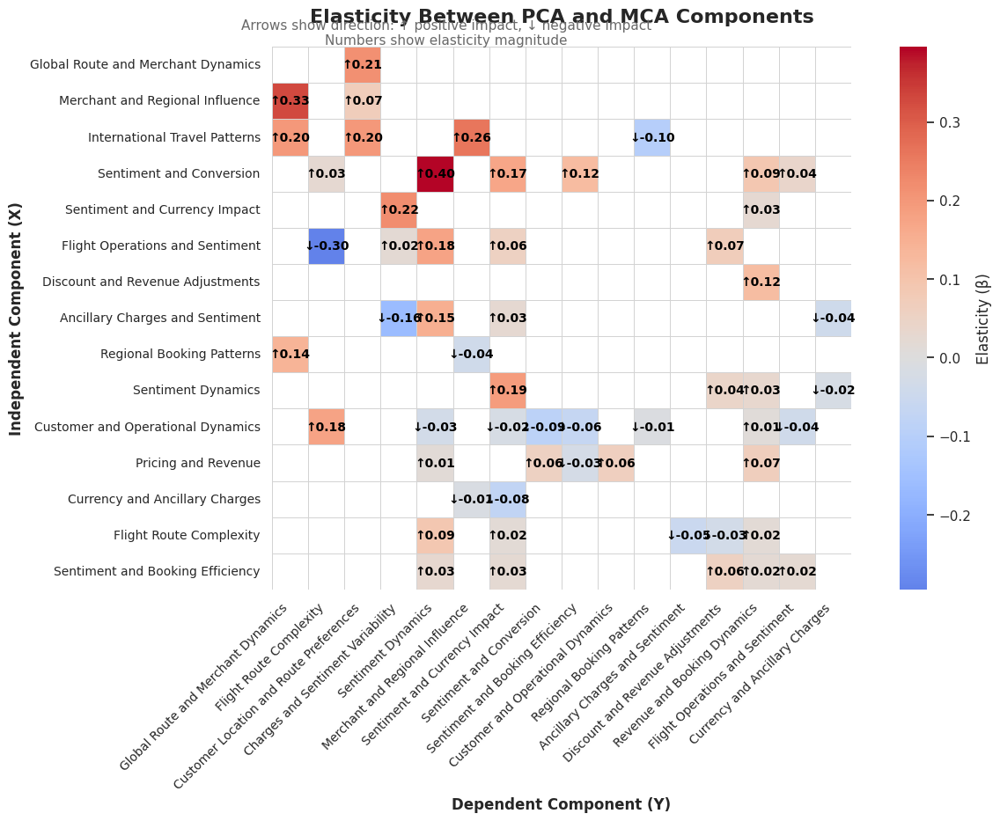

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Pivot table for heatmap
pivot_table = significant_impacts.pivot(index='X', columns='Y', values='Elasticity_beta')

# Sort rows/cols by average absolute elasticity (strongest impacts first)
row_order = pivot_table.abs().mean(axis=1).sort_values(ascending=False).index
col_order = pivot_table.abs().mean(axis=0).sort_values(ascending=False).index
pivot_table = pivot_table.loc[row_order, col_order]

# Create annotation with arrows ↑↓ and numeric values
def arrow_annot(val):
    if pd.isna(val):
        return ""
    if val > 0:
        return f"↑{val:.2f}"
    elif val < 0:
        return f"↓{val:.2f}"
    else:
        return f"{val:.2f}"

annot = pivot_table.map(arrow_annot)

# Plot heatmap
plt.figure(figsize=(14, 10))
sns.set_theme(style="white")

ax = sns.heatmap(
    pivot_table,
    annot=annot, fmt="",
    cmap="coolwarm", center=0,
    linewidths=0.5, linecolor="lightgray",
    cbar_kws={'label': 'Elasticity (β)'},
    square=True,
    annot_kws={"size": 10, "color": "black", "weight": "bold"}  # ✅ bigger, bold, black text
)

# Titles and labels
plt.title("Elasticity Between PCA and MCA Components", fontsize=16, weight='bold', pad=20)
plt.suptitle("Arrows show direction: ↑ positive impact, ↓ negative impact\nNumbers show elasticity magnitude",
             fontsize=11, color="dimgray", y=0.92)

plt.xlabel("Dependent Component (Y)", fontsize=12, weight='bold')
plt.ylabel("Independent Component (X)", fontsize=12, weight='bold')

# Rotate x labels for readability
plt.xticks(rotation=45, ha="right", fontsize=10)
plt.yticks(rotation=0, fontsize=10)

plt.tight_layout()
plt.show()


This heatmap visualizes elasticities (measures of association or responsiveness,  from regression) between PCA (Principal Component Analysis) components as independent variables (Y-axis, e.g., "Global Route and Merchant Dynamics") and MCA (Multiple Correspondence Analysis) components as dependent variables (X-axis, e.g., "Customer Location and Route Complexity"). Positive impacts are in red (e.g., 0.33 for "Merchant and Regional Influence" on "Global Route and Merchant Dynamics"), negative in blue (e.g., -0.30 for "Flight Operations and Sentiment" on "Discount and Revenue Adjustments"), with arrows indicating direction and numbers showing magnitude, from airline/travel dataset analysis.



# **Insight 3: Customer Sentiment**  
  * A 1% rise in sentiment and conversion drives a 39.56% overall satisfaction boost (17.05% direct, 19.31% indirect).
  * Deploy real-time sentiment analytics with instant alerts to turn feedback into immediate action.  

# **Insight 4: High-Value Routes & Merchants**  
  * A 1% increase in merchant/regional influence yields 32.82% higher global route demand, which cascades into 25.86% stronger merchant impact and 21.42% greater route preferences.
  * Expand capacity on flagship corridors (e.g., MEL–LHR, HKG–FRA).  

# **Insight 5: Operations & Pricing**  
  * Improving flight operations and sentiment by 1% cuts route complexity by 29.52%; a 1% uplift in sentiment/currency drives 22.12% more pricing agility; a 1% boost in discounts lifts bookings by 12.01%.
  * Eliminate unnecessary layovers and implement dynamic pricing strategies.

# Final Conclusion:
# **How top 5 insights was concluded. This tells key thing that the effort went through this project**

Beginning with ~ 1200 possible combinations of bivariate and multivariate analysis, the analysis conducted a statistically rigorous exploration of all variable combinations—identifying 25 significant numerical-numerical pairs, 40 numerical-categorical pairs, 14 categorical-categorical pairs, and 4 time-metric pairs through **bivariate statistical testing**. This was followed by **multivariate analysis**, which uncovered 54 statistically significant relationships. From this exhaustive process, the top 5 key insights were selected based on their strength, relevance, and interpretability across both bivariate and multivariate findings.


- **Insight 1: Retention Risk  [NUM-NUM ANALYSIS]**
  * Managing high-risk segments can unlock a ~255% lift in profitability and ~223% reduction in costs.
  * Pilot targeted loyalty and retention programs for these high-return customers while safeguarding against churn.  

- **Insight 2: Customer Tier Profitability  [NUM-CAT ANALYSIS]**
  * High-tier customers deliver ~40% more revenue and incur ~12% lower costs than Medium-tier; Low-tier segments generate ~48% less revenue and ~20% higher costs.
  * Focus on upselling and premium services for top-tier, and optimize or de-prioritize Low-tier offerings.  

- **Insight 3: Customer Sentiment  [MULTI VARIANT ANALYSIS]**
  * A 1% rise in sentiment and conversion drives a 39.56% overall satisfaction boost (17.05% direct, 19.31% indirect).
  * Deploy real-time sentiment analytics with instant alerts to turn feedback into immediate action.  

- **Insight 4: High-Value Routes & Merchants  [MULTI VARIANT ANALYSIS]**
  * A 1% increase in merchant/regional influence yields 32.82% higher global route demand, which cascades into 25.86% stronger merchant impact and 21.42% greater route preferences.
  * Expand capacity on flagship corridors (e.g., MEL–LHR, HKG–FRA).  

- **Insight 5: Operations & Pricing  [MULTI VARIANT ANALYSIS]**
  * Improving flight operations and sentiment by 1% cuts route complexity by 29.52%; a 1% uplift in sentiment/currency drives 22.12% more pricing agility; a 1% boost in discounts lifts bookings by 12.01%.
  * Eliminate unnecessary layovers and implement dynamic pricing strategies.


  # **Implementation Roadmap**  

| Quarter | Initiative                                                           |
| ------- | -------------------------------------------------------------------- |
| Q4 ’25  | Launch pilot loyalty and retention programs for high-risk, high-return customers |
| Q1 ’26  | Roll out A/B tests for High-tier upsells and Low-tier cost-optimization |
| Q2 ’26  | Deploy real-time sentiment analytics platform with instant-alert workflows |
| Q3 ’26  | Expand capacity on flagship routes (MEL–LHR, HKG–FRA)                   |
| Q4 ’26  | Simplify operations—eliminate unnecessary layovers and implement dynamic pricing

